In [196]:
# Import the otb applications package
import otbApplication
import os
# Import lib for operating with multichannel image format
from libtiff import TIFF
from PIL import Image
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import xgboost as xgb
import imageio
# import scypy

from tqdm import tqdm, tqdm_notebook

import sklearn

In [9]:
y_train_dir = ''
y_test_dir = ''
x_train_dir_template = 'output/har_out_{}'
feature_types = [
    'simple_3',
    'advanced_3',
    'higher_3',
    'simple_18',
    'advanced_18',
    'higher_18',
    'simple_9',
    'advanced_9',
    'higher_9',
]
x_test_dir = ''
# x_train_

In [46]:
SIMPLE_FEATURES_TAGS = [
"Energy (texture uniformity)",
"Entropy (measure of randomness of intensity image)", 
"Correlation (how correlated a pixel is to its neighborhood)",
"Inverse Difference Moment (measures the texture homogeneity)",
"Inertia (intensity contrast between a pixel and its neighborhood)", 
"Cluster Shade", 
"Cluster Prominence", 
"Haralick Correlation"]

ADVANCED_FEATURES_TAGS = [
'Mean', 
'Variance (measures the texture heterogeneity)', 
'Dissimilarity',
'Sum Average', 
'Sum Variance', 
'Sum Entropy', 
'Difference of Entropies', 
'Difference of Variances', 
'IC', 
'IC2']

HIGHER_FEATURES_TAGS = [
'Short Run Emphasis (measures the texture sharpness)', 
'Long Run Emphasis (measures the texture roughness)', 
'Grey-Level Nonuniformity', 
'Run Length Nonuniformity', 
'Run Percentage (measures the texture sharpness homogeneity)',
'Low Grey-Level Run Emphasis', 
'High Grey-Level Run Emphasis', 
'Short Run Low Grey-Level Emphasis', 
'Short Run High Grey-Level Emphasis',
'Long Run Low Grey-Level Emphasis',
'Long Run High Grey-Level Emphasis']

features_dict = {'simple':SIMPLE_FEATURES_TAGS, 'advanced':ADVANCED_FEATURES_TAGS, 'higher':HIGHER_FEATURES_TAGS}

In [4]:
example_images = os.listdir('../data/train/images')

In [5]:
imnames = [imfilename.split('.')[0] for imfilename in example_images]

In [6]:
imnames[0]

'bc3156b1e4'

In [ ]:
# Load features from file to image buffers 
## TODO directly to DF objects

In [12]:
x_train_dir_template.format(feature_types[0])

'output/har_out_simple_3'

In [19]:
x_files_dirs = [
    os.path.join(x_train_dir_template.format(feature_type) ) for feature_type in feature_types
]

texture_domains = [
   feature_type.split('_')[0] for feature_type in  feature_types
]
texture_domains

['simple',
 'advanced',
 'higher',
 'simple',
 'advanced',
 'higher',
 'simple',
 'advanced',
 'higher']

In [20]:
x_files_dirs

['output/har_out_simple_3',
 'output/har_out_advanced_3',
 'output/har_out_higher_3',
 'output/har_out_simple_18',
 'output/har_out_advanced_18',
 'output/har_out_higher_18',
 'output/har_out_simple_9',
 'output/har_out_advanced_9',
 'output/har_out_higher_9']

In [78]:
x_feature_names = [ 'x_{}_{}'.format(x_files_dir.split('_')[-2], x_files_dir.split('_')[-1]) 
                   for x_files_dir in x_files_dirs]
x_feature_names

['x_simple_3',
 'x_advanced_3',
 'x_higher_3',
 'x_simple_18',
 'x_advanced_18',
 'x_higher_18',
 'x_simple_9',
 'x_advanced_9',
 'x_higher_9']

In [79]:
[ i for i in range(len(features_dict[texture_domains[0]])) ]

[0, 1, 2, 3, 4, 5, 6, 7]

In [80]:
x_feature_names

['x_simple_3',
 'x_advanced_3',
 'x_higher_3',
 'x_simple_18',
 'x_advanced_18',
 'x_higher_18',
 'x_simple_9',
 'x_advanced_9',
 'x_higher_9']

In [86]:
x_feature_names = [ (x_files_dir.split('_')[-2], x_files_dir.split('_')[-1]) 
                   for x_files_dir in x_files_dirs]
x_feature_names
x_feature_names = [
    [ '{}_{}_{}_{}'.format(x_feature_name[0], x_feature_name[1],  features_dict[x_feature_name[0]][i] , i)
                     for i in range(len(features_dict[x_feature_name[0]])) ]
    for x_feature_name in x_feature_names ]

In [93]:
# x_feature_names
feature_names = []
for x_feature_name in x_feature_names:
    feature_names += x_feature_name
feature_names

['simple_3_Energy (texture uniformity)_0',
 'simple_3_Entropy (measure of randomness of intensity image)_1',
 'simple_3_Correlation (how correlated a pixel is to its neighborhood)_2',
 'simple_3_Inverse Difference Moment (measures the texture homogeneity)_3',
 'simple_3_Inertia (intensity contrast between a pixel and its neighborhood)_4',
 'simple_3_Cluster Shade_5',
 'simple_3_Cluster Prominence_6',
 'simple_3_Haralick Correlation_7',
 'advanced_3_Mean_0',
 'advanced_3_Variance (measures the texture heterogeneity)_1',
 'advanced_3_Dissimilarity_2',
 'advanced_3_Sum Average_3',
 'advanced_3_Sum Variance_4',
 'advanced_3_Sum Entropy_5',
 'advanced_3_Difference of Entropies_6',
 'advanced_3_Difference of Variances_7',
 'advanced_3_IC_8',
 'advanced_3_IC2_9',
 'higher_3_Short Run Emphasis (measures the texture sharpness)_0',
 'higher_3_Long Run Emphasis (measures the texture roughness)_1',
 'higher_3_Grey-Level Nonuniformity_2',
 'higher_3_Run Length Nonuniformity_3',
 'higher_3_Run Perce

In [26]:
# infiles = os.listdir('../data/train/masks')

# file_ids = [i.split('.')[0] for i in infiles]

# feature_files 
x_features_files = [
    [ os.path.join(x_file_dir, file_id + '_' +x_file_dir.split('_')[-2] + '.tiff')  for file_id in imnames]
    for x_file_dir in x_files_dirs
]
# x_files1 = [os.path.join('output/har_out_simple', f) + '.tiff' for f in file_ids]

# x_files2 = [os.path.join('output/har_out_advanced', f.split('_')[0] + '_advanced') + '.tiff' for f in file_ids]

# x_files3 = [os.path.join('output/har_out_higher',  f.split('_')[0] + '_higher') + '.tiff' for f in file_ids]

y_files = [os.path.join('../data/train/masks', f.split('_')[0]) + '.png' for f in imnames]

In [ ]:
# x_files3[:10]

In [110]:
# a = Image.open(y_files[5])

In [136]:
# ys = list(a.getdata())
# ys = ys / np.max(ys)
# len(ys)

In [137]:
# infiles

In [121]:
def features_to_df(x_filenames, y_filename):
    
    print(x_filenames)
    print(y_filename)
    
    image_features = []
    for x_filename in x_filenames:
        
        tif = TIFF.open(x_filename, mode='r').read_image()

        image_features.extend([ 
            tif[...,i].flatten()
            for i in range(tif.shape[2])
    #         for i in range(1)
        ])
        
        
        
     # TODO add features naming !!!
    
    y = list(imageio.imread(y_filename).flatten()) 
    
    y_max_val = np.max(y)
    if y_max_val != 0:
        y /= y_max_val
    
    y = pd.DataFrame(y)
    
    df = pd.DataFrame(image_features).T
    
    df['y'] = y
    return df

In [29]:
def df_to_images(image_df):
    Xs = [ image_df[col].values.reshape((101,101)) for col in image_df.columns ]
    return Xs

In [30]:
type(imageio.imread(y_files[1]))

imageio.core.util.Array

In [89]:
[feature[0] for feature in x_features_files]

['output/har_out_simple_3/bc3156b1e4_simple.tiff',
 'output/har_out_advanced_3/bc3156b1e4_advanced.tiff',
 'output/har_out_higher_3/bc3156b1e4_higher.tiff',
 'output/har_out_simple_18/bc3156b1e4_simple.tiff',
 'output/har_out_advanced_18/bc3156b1e4_advanced.tiff',
 'output/har_out_higher_18/bc3156b1e4_higher.tiff',
 'output/har_out_simple_9/bc3156b1e4_simple.tiff',
 'output/har_out_advanced_9/bc3156b1e4_advanced.tiff',
 'output/har_out_higher_9/bc3156b1e4_higher.tiff']

In [90]:
im1 = features_to_df([feature[1] for feature in x_features_files], y_files[1])

In [94]:
im1.columns = feature_names + ['y']

In [95]:
im1

,simple_3_Energy (texture uniformity)_0,simple_3_Entropy (measure of randomness of intensity image)_1,simple_3_Correlation (how correlated a pixel is to its neighborhood)_2,simple_3_Inverse Difference Moment (measures the texture homogeneity)_3,simple_3_Inertia (intensity contrast between a pixel and its neighborhood)_4,simple_3_Cluster Shade_5,simple_3_Cluster Prominence_6,simple_3_Haralick Correlation_7,advanced_3_Mean_0,advanced_3_Variance (measures the texture heterogeneity)_1,...,higher_9_Grey-Level Nonuniformity_2,higher_9_Run Length Nonuniformity_3,higher_9_Run Percentage (measures the texture sharpness homogeneity)_4,higher_9_Low Grey-Level Run Emphasis_5,higher_9_High Grey-Level Run Emphasis_6,higher_9_Short Run Low Grey-Level Emphasis_7,higher_9_Short Run High Grey-Level Emphasis_8,higher_9_Long Run Low Grey-Level Emphasis_9,higher_9_Long Run High Grey-Level Emphasis_10,y
0,0.046875,4.625000,0.058766,0.466176,3.750000,96.902344,6039.725586,5.017451e+05,19.437500,14.871094,...,3.045455,69.909088,0.005908,623.977295,0.005549,531.344055,0.035802,4392.647949,-3.479015e+16,1.0
1,0.035000,5.021928,0.034801,0.414864,4.950000,200.555252,17342.666016,7.618398e+05,21.275000,25.999374,...,3.082474,78.628868,0.011298,607.360840,0.010972,522.906616,0.038993,6181.907227,4.558564e-41,1.0
2,0.027778,5.334962,0.023283,0.360180,8.208333,241.890762,36807.378906,9.632008e+05,23.020834,38.353733,...,3.285714,83.228569,0.011638,592.333313,0.010873,513.156372,0.053889,5783.818848,1.843329e-35,1.0
3,0.023597,5.557355,0.020788,0.360099,8.214286,287.414001,52933.296875,1.204850e+06,24.035715,43.570152,...,3.991304,93.034782,0.011285,558.234802,0.010587,485.942749,0.049862,5298.287109,3.082436e-41,1.0
4,0.019133,5.735926,0.020558,0.241975,11.964286,-98.034348,49018.726562,1.284542e+06,24.946428,41.657845,...,4.274194,100.241936,0.010870,531.169373,0.010183,462.587585,0.048088,4982.508301,1.811168e-35,1.0
5,0.018495,5.771641,0.013029,0.158898,17.107143,-2883.036865,186667.046875,1.358527e+06,24.017857,66.946106,...,4.746269,110.074623,0.010389,508.888062,0.009753,445.424347,0.044829,4628.037109,3.082436e-41,1.0
6,0.018495,5.771641,0.007966,0.187469,16.535715,-5915.481934,414205.750000,1.329098e+06,21.696428,116.639984,...,5.277778,119.930557,0.009924,493.111115,0.009332,434.054596,0.041972,4326.208496,1.843329e-35,0.0
7,0.020408,5.664498,0.006217,0.230326,16.107143,-1967.596802,486812.156250,1.123150e+06,18.767857,152.356827,...,5.831169,129.805191,0.009490,481.844147,0.008937,426.622467,0.039458,4066.039062,3.082436e-41,0.0
8,0.021684,5.593069,0.006352,0.218141,16.464285,5925.097168,523510.625000,8.878686e+05,15.696428,148.711411,...,6.419753,134.333328,0.009168,475.037048,0.008611,417.975311,0.038794,4046.648193,7.657178e-19,0.0
9,0.022959,5.521641,0.008843,0.247134,13.928572,8597.138672,481831.656250,5.310899e+05,12.642858,105.622452,...,7.035088,141.538010,0.008822,470.690063,0.008278,414.579102,0.037455,3928.210449,1.626303e-18,0.0


In [37]:
a = im1.values.reshape(101, 101, -1)
a.shape

(101, 101, 88)

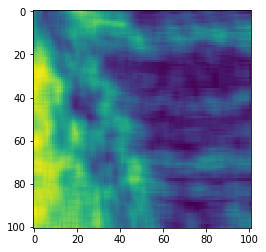

In [38]:
plt.imshow(a[...,3])

In [103]:
list(zip(zip([feature[:100] for feature in x_features_files]), y_files[:100]))

[((['output/har_out_simple_3/bc3156b1e4_simple.tiff',
    'output/har_out_simple_3/296de39be2_simple.tiff',
    'output/har_out_simple_3/83bb4578eb_simple.tiff',
    'output/har_out_simple_3/1b9865501f_simple.tiff',
    'output/har_out_simple_3/306e6e7743_simple.tiff',
    'output/har_out_simple_3/ba045610d1_simple.tiff',
    'output/har_out_simple_3/a24080b4a0_simple.tiff',
    'output/har_out_simple_3/b45f9383e9_simple.tiff',
    'output/har_out_simple_3/60bbd166a4_simple.tiff',
    'output/har_out_simple_3/6313ab72dc_simple.tiff',
    'output/har_out_simple_3/be18a24c49_simple.tiff',
    'output/har_out_simple_3/1b71d67404_simple.tiff',
    'output/har_out_simple_3/c023a62b96_simple.tiff',
    'output/har_out_simple_3/590e6bdbef_simple.tiff',
    'output/har_out_simple_3/7e78a47cee_simple.tiff',
    'output/har_out_simple_3/849ccdf3af_simple.tiff',
    'output/har_out_simple_3/5d6126f459_simple.tiff',
    'output/har_out_simple_3/3320eb35e4_simple.tiff',
    'output/har_out_simple_3

In [105]:
x_features_files[0][:100]

['output/har_out_simple_3/bc3156b1e4_simple.tiff',
 'output/har_out_simple_3/296de39be2_simple.tiff',
 'output/har_out_simple_3/83bb4578eb_simple.tiff',
 'output/har_out_simple_3/1b9865501f_simple.tiff',
 'output/har_out_simple_3/306e6e7743_simple.tiff',
 'output/har_out_simple_3/ba045610d1_simple.tiff',
 'output/har_out_simple_3/a24080b4a0_simple.tiff',
 'output/har_out_simple_3/b45f9383e9_simple.tiff',
 'output/har_out_simple_3/60bbd166a4_simple.tiff',
 'output/har_out_simple_3/6313ab72dc_simple.tiff',
 'output/har_out_simple_3/be18a24c49_simple.tiff',
 'output/har_out_simple_3/1b71d67404_simple.tiff',
 'output/har_out_simple_3/c023a62b96_simple.tiff',
 'output/har_out_simple_3/590e6bdbef_simple.tiff',
 'output/har_out_simple_3/7e78a47cee_simple.tiff',
 'output/har_out_simple_3/849ccdf3af_simple.tiff',
 'output/har_out_simple_3/5d6126f459_simple.tiff',
 'output/har_out_simple_3/3320eb35e4_simple.tiff',
 'output/har_out_simple_3/501c68e571_simple.tiff',
 'output/har_out_simple_3/a32a4

In [164]:
combined = [
    features_to_df( [xf[f_i] for xf in x_features_files], y_files[f_i] )
    for f_i in tqdm( range(0,100) )
]








  0%|          | 0/100 [00:00<?, ?it/s]

['output/har_out_simple_3/bc3156b1e4_simple.tiff', 'output/har_out_advanced_3/bc3156b1e4_advanced.tiff', 'output/har_out_higher_3/bc3156b1e4_higher.tiff', 'output/har_out_simple_18/bc3156b1e4_simple.tiff', 'output/har_out_advanced_18/bc3156b1e4_advanced.tiff', 'output/har_out_higher_18/bc3156b1e4_higher.tiff', 'output/har_out_simple_9/bc3156b1e4_simple.tiff', 'output/har_out_advanced_9/bc3156b1e4_advanced.tiff', 'output/har_out_higher_9/bc3156b1e4_higher.tiff']
../data/train/masks/bc3156b1e4.png









  1%|          | 1/100 [00:00<00:40,  2.42it/s]

['output/har_out_simple_3/296de39be2_simple.tiff', 'output/har_out_advanced_3/296de39be2_advanced.tiff', 'output/har_out_higher_3/296de39be2_higher.tiff', 'output/har_out_simple_18/296de39be2_simple.tiff', 'output/har_out_advanced_18/296de39be2_advanced.tiff', 'output/har_out_higher_18/296de39be2_higher.tiff', 'output/har_out_simple_9/296de39be2_simple.tiff', 'output/har_out_advanced_9/296de39be2_advanced.tiff', 'output/har_out_higher_9/296de39be2_higher.tiff']
../data/train/masks/296de39be2.png









  2%|▏         | 2/100 [00:00<00:39,  2.48it/s]

['output/har_out_simple_3/83bb4578eb_simple.tiff', 'output/har_out_advanced_3/83bb4578eb_advanced.tiff', 'output/har_out_higher_3/83bb4578eb_higher.tiff', 'output/har_out_simple_18/83bb4578eb_simple.tiff', 'output/har_out_advanced_18/83bb4578eb_advanced.tiff', 'output/har_out_higher_18/83bb4578eb_higher.tiff', 'output/har_out_simple_9/83bb4578eb_simple.tiff', 'output/har_out_advanced_9/83bb4578eb_advanced.tiff', 'output/har_out_higher_9/83bb4578eb_higher.tiff']
../data/train/masks/83bb4578eb.png









  3%|▎         | 3/100 [00:01<00:38,  2.49it/s]

['output/har_out_simple_3/1b9865501f_simple.tiff', 'output/har_out_advanced_3/1b9865501f_advanced.tiff', 'output/har_out_higher_3/1b9865501f_higher.tiff', 'output/har_out_simple_18/1b9865501f_simple.tiff', 'output/har_out_advanced_18/1b9865501f_advanced.tiff', 'output/har_out_higher_18/1b9865501f_higher.tiff', 'output/har_out_simple_9/1b9865501f_simple.tiff', 'output/har_out_advanced_9/1b9865501f_advanced.tiff', 'output/har_out_higher_9/1b9865501f_higher.tiff']
../data/train/masks/1b9865501f.png









  4%|▍         | 4/100 [00:01<00:37,  2.54it/s]

['output/har_out_simple_3/306e6e7743_simple.tiff', 'output/har_out_advanced_3/306e6e7743_advanced.tiff', 'output/har_out_higher_3/306e6e7743_higher.tiff', 'output/har_out_simple_18/306e6e7743_simple.tiff', 'output/har_out_advanced_18/306e6e7743_advanced.tiff', 'output/har_out_higher_18/306e6e7743_higher.tiff', 'output/har_out_simple_9/306e6e7743_simple.tiff', 'output/har_out_advanced_9/306e6e7743_advanced.tiff', 'output/har_out_higher_9/306e6e7743_higher.tiff']
../data/train/masks/306e6e7743.png









  5%|▌         | 5/100 [00:01<00:37,  2.54it/s]

['output/har_out_simple_3/ba045610d1_simple.tiff', 'output/har_out_advanced_3/ba045610d1_advanced.tiff', 'output/har_out_higher_3/ba045610d1_higher.tiff', 'output/har_out_simple_18/ba045610d1_simple.tiff', 'output/har_out_advanced_18/ba045610d1_advanced.tiff', 'output/har_out_higher_18/ba045610d1_higher.tiff', 'output/har_out_simple_9/ba045610d1_simple.tiff', 'output/har_out_advanced_9/ba045610d1_advanced.tiff', 'output/har_out_higher_9/ba045610d1_higher.tiff']
../data/train/masks/ba045610d1.png









  6%|▌         | 6/100 [00:02<00:37,  2.52it/s]

['output/har_out_simple_3/a24080b4a0_simple.tiff', 'output/har_out_advanced_3/a24080b4a0_advanced.tiff', 'output/har_out_higher_3/a24080b4a0_higher.tiff', 'output/har_out_simple_18/a24080b4a0_simple.tiff', 'output/har_out_advanced_18/a24080b4a0_advanced.tiff', 'output/har_out_higher_18/a24080b4a0_higher.tiff', 'output/har_out_simple_9/a24080b4a0_simple.tiff', 'output/har_out_advanced_9/a24080b4a0_advanced.tiff', 'output/har_out_higher_9/a24080b4a0_higher.tiff']
../data/train/masks/a24080b4a0.png









  7%|▋         | 7/100 [00:02<00:35,  2.62it/s]

['output/har_out_simple_3/b45f9383e9_simple.tiff', 'output/har_out_advanced_3/b45f9383e9_advanced.tiff', 'output/har_out_higher_3/b45f9383e9_higher.tiff', 'output/har_out_simple_18/b45f9383e9_simple.tiff', 'output/har_out_advanced_18/b45f9383e9_advanced.tiff', 'output/har_out_higher_18/b45f9383e9_higher.tiff', 'output/har_out_simple_9/b45f9383e9_simple.tiff', 'output/har_out_advanced_9/b45f9383e9_advanced.tiff', 'output/har_out_higher_9/b45f9383e9_higher.tiff']
../data/train/masks/b45f9383e9.png









  8%|▊         | 8/100 [00:03<00:35,  2.56it/s]

['output/har_out_simple_3/60bbd166a4_simple.tiff', 'output/har_out_advanced_3/60bbd166a4_advanced.tiff', 'output/har_out_higher_3/60bbd166a4_higher.tiff', 'output/har_out_simple_18/60bbd166a4_simple.tiff', 'output/har_out_advanced_18/60bbd166a4_advanced.tiff', 'output/har_out_higher_18/60bbd166a4_higher.tiff', 'output/har_out_simple_9/60bbd166a4_simple.tiff', 'output/har_out_advanced_9/60bbd166a4_advanced.tiff', 'output/har_out_higher_9/60bbd166a4_higher.tiff']
../data/train/masks/60bbd166a4.png









  9%|▉         | 9/100 [00:03<00:35,  2.55it/s]

['output/har_out_simple_3/6313ab72dc_simple.tiff', 'output/har_out_advanced_3/6313ab72dc_advanced.tiff', 'output/har_out_higher_3/6313ab72dc_higher.tiff', 'output/har_out_simple_18/6313ab72dc_simple.tiff', 'output/har_out_advanced_18/6313ab72dc_advanced.tiff', 'output/har_out_higher_18/6313ab72dc_higher.tiff', 'output/har_out_simple_9/6313ab72dc_simple.tiff', 'output/har_out_advanced_9/6313ab72dc_advanced.tiff', 'output/har_out_higher_9/6313ab72dc_higher.tiff']
../data/train/masks/6313ab72dc.png









 10%|█         | 10/100 [00:03<00:37,  2.43it/s]

['output/har_out_simple_3/be18a24c49_simple.tiff', 'output/har_out_advanced_3/be18a24c49_advanced.tiff', 'output/har_out_higher_3/be18a24c49_higher.tiff', 'output/har_out_simple_18/be18a24c49_simple.tiff', 'output/har_out_advanced_18/be18a24c49_advanced.tiff', 'output/har_out_higher_18/be18a24c49_higher.tiff', 'output/har_out_simple_9/be18a24c49_simple.tiff', 'output/har_out_advanced_9/be18a24c49_advanced.tiff', 'output/har_out_higher_9/be18a24c49_higher.tiff']
../data/train/masks/be18a24c49.png









 11%|█         | 11/100 [00:04<00:37,  2.38it/s]

['output/har_out_simple_3/1b71d67404_simple.tiff', 'output/har_out_advanced_3/1b71d67404_advanced.tiff', 'output/har_out_higher_3/1b71d67404_higher.tiff', 'output/har_out_simple_18/1b71d67404_simple.tiff', 'output/har_out_advanced_18/1b71d67404_advanced.tiff', 'output/har_out_higher_18/1b71d67404_higher.tiff', 'output/har_out_simple_9/1b71d67404_simple.tiff', 'output/har_out_advanced_9/1b71d67404_advanced.tiff', 'output/har_out_higher_9/1b71d67404_higher.tiff']
../data/train/masks/1b71d67404.png









 12%|█▏        | 12/100 [00:04<00:36,  2.42it/s]

['output/har_out_simple_3/c023a62b96_simple.tiff', 'output/har_out_advanced_3/c023a62b96_advanced.tiff', 'output/har_out_higher_3/c023a62b96_higher.tiff', 'output/har_out_simple_18/c023a62b96_simple.tiff', 'output/har_out_advanced_18/c023a62b96_advanced.tiff', 'output/har_out_higher_18/c023a62b96_higher.tiff', 'output/har_out_simple_9/c023a62b96_simple.tiff', 'output/har_out_advanced_9/c023a62b96_advanced.tiff', 'output/har_out_higher_9/c023a62b96_higher.tiff']
../data/train/masks/c023a62b96.png









 13%|█▎        | 13/100 [00:05<00:34,  2.56it/s]

['output/har_out_simple_3/590e6bdbef_simple.tiff', 'output/har_out_advanced_3/590e6bdbef_advanced.tiff', 'output/har_out_higher_3/590e6bdbef_higher.tiff', 'output/har_out_simple_18/590e6bdbef_simple.tiff', 'output/har_out_advanced_18/590e6bdbef_advanced.tiff', 'output/har_out_higher_18/590e6bdbef_higher.tiff', 'output/har_out_simple_9/590e6bdbef_simple.tiff', 'output/har_out_advanced_9/590e6bdbef_advanced.tiff', 'output/har_out_higher_9/590e6bdbef_higher.tiff']
../data/train/masks/590e6bdbef.png









 14%|█▍        | 14/100 [00:05<00:32,  2.67it/s]

['output/har_out_simple_3/7e78a47cee_simple.tiff', 'output/har_out_advanced_3/7e78a47cee_advanced.tiff', 'output/har_out_higher_3/7e78a47cee_higher.tiff', 'output/har_out_simple_18/7e78a47cee_simple.tiff', 'output/har_out_advanced_18/7e78a47cee_advanced.tiff', 'output/har_out_higher_18/7e78a47cee_higher.tiff', 'output/har_out_simple_9/7e78a47cee_simple.tiff', 'output/har_out_advanced_9/7e78a47cee_advanced.tiff', 'output/har_out_higher_9/7e78a47cee_higher.tiff']
../data/train/masks/7e78a47cee.png









 15%|█▌        | 15/100 [00:05<00:33,  2.56it/s]

['output/har_out_simple_3/849ccdf3af_simple.tiff', 'output/har_out_advanced_3/849ccdf3af_advanced.tiff', 'output/har_out_higher_3/849ccdf3af_higher.tiff', 'output/har_out_simple_18/849ccdf3af_simple.tiff', 'output/har_out_advanced_18/849ccdf3af_advanced.tiff', 'output/har_out_higher_18/849ccdf3af_higher.tiff', 'output/har_out_simple_9/849ccdf3af_simple.tiff', 'output/har_out_advanced_9/849ccdf3af_advanced.tiff', 'output/har_out_higher_9/849ccdf3af_higher.tiff']
../data/train/masks/849ccdf3af.png









 16%|█▌        | 16/100 [00:06<00:34,  2.46it/s]

['output/har_out_simple_3/5d6126f459_simple.tiff', 'output/har_out_advanced_3/5d6126f459_advanced.tiff', 'output/har_out_higher_3/5d6126f459_higher.tiff', 'output/har_out_simple_18/5d6126f459_simple.tiff', 'output/har_out_advanced_18/5d6126f459_advanced.tiff', 'output/har_out_higher_18/5d6126f459_higher.tiff', 'output/har_out_simple_9/5d6126f459_simple.tiff', 'output/har_out_advanced_9/5d6126f459_advanced.tiff', 'output/har_out_higher_9/5d6126f459_higher.tiff']
../data/train/masks/5d6126f459.png









 17%|█▋        | 17/100 [00:06<00:34,  2.40it/s]

['output/har_out_simple_3/3320eb35e4_simple.tiff', 'output/har_out_advanced_3/3320eb35e4_advanced.tiff', 'output/har_out_higher_3/3320eb35e4_higher.tiff', 'output/har_out_simple_18/3320eb35e4_simple.tiff', 'output/har_out_advanced_18/3320eb35e4_advanced.tiff', 'output/har_out_higher_18/3320eb35e4_higher.tiff', 'output/har_out_simple_9/3320eb35e4_simple.tiff', 'output/har_out_advanced_9/3320eb35e4_advanced.tiff', 'output/har_out_higher_9/3320eb35e4_higher.tiff']
../data/train/masks/3320eb35e4.png









 18%|█▊        | 18/100 [00:07<00:34,  2.36it/s]

['output/har_out_simple_3/501c68e571_simple.tiff', 'output/har_out_advanced_3/501c68e571_advanced.tiff', 'output/har_out_higher_3/501c68e571_higher.tiff', 'output/har_out_simple_18/501c68e571_simple.tiff', 'output/har_out_advanced_18/501c68e571_advanced.tiff', 'output/har_out_higher_18/501c68e571_higher.tiff', 'output/har_out_simple_9/501c68e571_simple.tiff', 'output/har_out_advanced_9/501c68e571_advanced.tiff', 'output/har_out_higher_9/501c68e571_higher.tiff']
../data/train/masks/501c68e571.png









 19%|█▉        | 19/100 [00:07<00:33,  2.43it/s]

['output/har_out_simple_3/a32a4a2256_simple.tiff', 'output/har_out_advanced_3/a32a4a2256_advanced.tiff', 'output/har_out_higher_3/a32a4a2256_higher.tiff', 'output/har_out_simple_18/a32a4a2256_simple.tiff', 'output/har_out_advanced_18/a32a4a2256_advanced.tiff', 'output/har_out_higher_18/a32a4a2256_higher.tiff', 'output/har_out_simple_9/a32a4a2256_simple.tiff', 'output/har_out_advanced_9/a32a4a2256_advanced.tiff', 'output/har_out_higher_9/a32a4a2256_higher.tiff']
../data/train/masks/a32a4a2256.png









 20%|██        | 20/100 [00:08<00:32,  2.46it/s]

['output/har_out_simple_3/3507f73405_simple.tiff', 'output/har_out_advanced_3/3507f73405_advanced.tiff', 'output/har_out_higher_3/3507f73405_higher.tiff', 'output/har_out_simple_18/3507f73405_simple.tiff', 'output/har_out_advanced_18/3507f73405_advanced.tiff', 'output/har_out_higher_18/3507f73405_higher.tiff', 'output/har_out_simple_9/3507f73405_simple.tiff', 'output/har_out_advanced_9/3507f73405_advanced.tiff', 'output/har_out_higher_9/3507f73405_higher.tiff']
../data/train/masks/3507f73405.png









 21%|██        | 21/100 [00:08<00:31,  2.48it/s]

['output/har_out_simple_3/7268aedee7_simple.tiff', 'output/har_out_advanced_3/7268aedee7_advanced.tiff', 'output/har_out_higher_3/7268aedee7_higher.tiff', 'output/har_out_simple_18/7268aedee7_simple.tiff', 'output/har_out_advanced_18/7268aedee7_advanced.tiff', 'output/har_out_higher_18/7268aedee7_higher.tiff', 'output/har_out_simple_9/7268aedee7_simple.tiff', 'output/har_out_advanced_9/7268aedee7_advanced.tiff', 'output/har_out_higher_9/7268aedee7_higher.tiff']
../data/train/masks/7268aedee7.png









 22%|██▏       | 22/100 [00:08<00:31,  2.44it/s]

['output/har_out_simple_3/9e966d733c_simple.tiff', 'output/har_out_advanced_3/9e966d733c_advanced.tiff', 'output/har_out_higher_3/9e966d733c_higher.tiff', 'output/har_out_simple_18/9e966d733c_simple.tiff', 'output/har_out_advanced_18/9e966d733c_advanced.tiff', 'output/har_out_higher_18/9e966d733c_higher.tiff', 'output/har_out_simple_9/9e966d733c_simple.tiff', 'output/har_out_advanced_9/9e966d733c_advanced.tiff', 'output/har_out_higher_9/9e966d733c_higher.tiff']
../data/train/masks/9e966d733c.png









 23%|██▎       | 23/100 [00:09<00:31,  2.46it/s]

['output/har_out_simple_3/380ff30e30_simple.tiff', 'output/har_out_advanced_3/380ff30e30_advanced.tiff', 'output/har_out_higher_3/380ff30e30_higher.tiff', 'output/har_out_simple_18/380ff30e30_simple.tiff', 'output/har_out_advanced_18/380ff30e30_advanced.tiff', 'output/har_out_higher_18/380ff30e30_higher.tiff', 'output/har_out_simple_9/380ff30e30_simple.tiff', 'output/har_out_advanced_9/380ff30e30_advanced.tiff', 'output/har_out_higher_9/380ff30e30_higher.tiff']
../data/train/masks/380ff30e30.png









 24%|██▍       | 24/100 [00:09<00:31,  2.43it/s]

['output/har_out_simple_3/03a9a9f615_simple.tiff', 'output/har_out_advanced_3/03a9a9f615_advanced.tiff', 'output/har_out_higher_3/03a9a9f615_higher.tiff', 'output/har_out_simple_18/03a9a9f615_simple.tiff', 'output/har_out_advanced_18/03a9a9f615_advanced.tiff', 'output/har_out_higher_18/03a9a9f615_higher.tiff', 'output/har_out_simple_9/03a9a9f615_simple.tiff', 'output/har_out_advanced_9/03a9a9f615_advanced.tiff', 'output/har_out_higher_9/03a9a9f615_higher.tiff']
../data/train/masks/03a9a9f615.png









 25%|██▌       | 25/100 [00:10<00:31,  2.36it/s]

['output/har_out_simple_3/9539d280a6_simple.tiff', 'output/har_out_advanced_3/9539d280a6_advanced.tiff', 'output/har_out_higher_3/9539d280a6_higher.tiff', 'output/har_out_simple_18/9539d280a6_simple.tiff', 'output/har_out_advanced_18/9539d280a6_advanced.tiff', 'output/har_out_higher_18/9539d280a6_higher.tiff', 'output/har_out_simple_9/9539d280a6_simple.tiff', 'output/har_out_advanced_9/9539d280a6_advanced.tiff', 'output/har_out_higher_9/9539d280a6_higher.tiff']
../data/train/masks/9539d280a6.png









 26%|██▌       | 26/100 [00:10<00:31,  2.38it/s]

['output/har_out_simple_3/fbc9a1149e_simple.tiff', 'output/har_out_advanced_3/fbc9a1149e_advanced.tiff', 'output/har_out_higher_3/fbc9a1149e_higher.tiff', 'output/har_out_simple_18/fbc9a1149e_simple.tiff', 'output/har_out_advanced_18/fbc9a1149e_advanced.tiff', 'output/har_out_higher_18/fbc9a1149e_higher.tiff', 'output/har_out_simple_9/fbc9a1149e_simple.tiff', 'output/har_out_advanced_9/fbc9a1149e_advanced.tiff', 'output/har_out_higher_9/fbc9a1149e_higher.tiff']
../data/train/masks/fbc9a1149e.png









 27%|██▋       | 27/100 [00:10<00:31,  2.32it/s]

['output/har_out_simple_3/1d9bc2591e_simple.tiff', 'output/har_out_advanced_3/1d9bc2591e_advanced.tiff', 'output/har_out_higher_3/1d9bc2591e_higher.tiff', 'output/har_out_simple_18/1d9bc2591e_simple.tiff', 'output/har_out_advanced_18/1d9bc2591e_advanced.tiff', 'output/har_out_higher_18/1d9bc2591e_higher.tiff', 'output/har_out_simple_9/1d9bc2591e_simple.tiff', 'output/har_out_advanced_9/1d9bc2591e_advanced.tiff', 'output/har_out_higher_9/1d9bc2591e_higher.tiff']
../data/train/masks/1d9bc2591e.png









 28%|██▊       | 28/100 [00:11<00:31,  2.27it/s]

['output/har_out_simple_3/cb2698f715_simple.tiff', 'output/har_out_advanced_3/cb2698f715_advanced.tiff', 'output/har_out_higher_3/cb2698f715_higher.tiff', 'output/har_out_simple_18/cb2698f715_simple.tiff', 'output/har_out_advanced_18/cb2698f715_advanced.tiff', 'output/har_out_higher_18/cb2698f715_higher.tiff', 'output/har_out_simple_9/cb2698f715_simple.tiff', 'output/har_out_advanced_9/cb2698f715_advanced.tiff', 'output/har_out_higher_9/cb2698f715_higher.tiff']
../data/train/masks/cb2698f715.png









 29%|██▉       | 29/100 [00:11<00:31,  2.28it/s]

['output/har_out_simple_3/ab5fe4fea8_simple.tiff', 'output/har_out_advanced_3/ab5fe4fea8_advanced.tiff', 'output/har_out_higher_3/ab5fe4fea8_higher.tiff', 'output/har_out_simple_18/ab5fe4fea8_simple.tiff', 'output/har_out_advanced_18/ab5fe4fea8_advanced.tiff', 'output/har_out_higher_18/ab5fe4fea8_higher.tiff', 'output/har_out_simple_9/ab5fe4fea8_simple.tiff', 'output/har_out_advanced_9/ab5fe4fea8_advanced.tiff', 'output/har_out_higher_9/ab5fe4fea8_higher.tiff']
../data/train/masks/ab5fe4fea8.png









 30%|███       | 30/100 [00:12<00:30,  2.32it/s]

['output/har_out_simple_3/be2dd1db16_simple.tiff', 'output/har_out_advanced_3/be2dd1db16_advanced.tiff', 'output/har_out_higher_3/be2dd1db16_higher.tiff', 'output/har_out_simple_18/be2dd1db16_simple.tiff', 'output/har_out_advanced_18/be2dd1db16_advanced.tiff', 'output/har_out_higher_18/be2dd1db16_higher.tiff', 'output/har_out_simple_9/be2dd1db16_simple.tiff', 'output/har_out_advanced_9/be2dd1db16_advanced.tiff', 'output/har_out_higher_9/be2dd1db16_higher.tiff']
../data/train/masks/be2dd1db16.png









 31%|███       | 31/100 [00:12<00:29,  2.34it/s]

['output/har_out_simple_3/3edc3edf92_simple.tiff', 'output/har_out_advanced_3/3edc3edf92_advanced.tiff', 'output/har_out_higher_3/3edc3edf92_higher.tiff', 'output/har_out_simple_18/3edc3edf92_simple.tiff', 'output/har_out_advanced_18/3edc3edf92_advanced.tiff', 'output/har_out_higher_18/3edc3edf92_higher.tiff', 'output/har_out_simple_9/3edc3edf92_simple.tiff', 'output/har_out_advanced_9/3edc3edf92_advanced.tiff', 'output/har_out_higher_9/3edc3edf92_higher.tiff']
../data/train/masks/3edc3edf92.png









 32%|███▏      | 32/100 [00:13<00:28,  2.38it/s]

['output/har_out_simple_3/d0cba16846_simple.tiff', 'output/har_out_advanced_3/d0cba16846_advanced.tiff', 'output/har_out_higher_3/d0cba16846_higher.tiff', 'output/har_out_simple_18/d0cba16846_simple.tiff', 'output/har_out_advanced_18/d0cba16846_advanced.tiff', 'output/har_out_higher_18/d0cba16846_higher.tiff', 'output/har_out_simple_9/d0cba16846_simple.tiff', 'output/har_out_advanced_9/d0cba16846_advanced.tiff', 'output/har_out_higher_9/d0cba16846_higher.tiff']
../data/train/masks/d0cba16846.png









 33%|███▎      | 33/100 [00:13<00:26,  2.52it/s]

['output/har_out_simple_3/36f9ab3ee0_simple.tiff', 'output/har_out_advanced_3/36f9ab3ee0_advanced.tiff', 'output/har_out_higher_3/36f9ab3ee0_higher.tiff', 'output/har_out_simple_18/36f9ab3ee0_simple.tiff', 'output/har_out_advanced_18/36f9ab3ee0_advanced.tiff', 'output/har_out_higher_18/36f9ab3ee0_higher.tiff', 'output/har_out_simple_9/36f9ab3ee0_simple.tiff', 'output/har_out_advanced_9/36f9ab3ee0_advanced.tiff', 'output/har_out_higher_9/36f9ab3ee0_higher.tiff']
../data/train/masks/36f9ab3ee0.png









 34%|███▍      | 34/100 [00:13<00:26,  2.54it/s]

['output/har_out_simple_3/363a171d90_simple.tiff', 'output/har_out_advanced_3/363a171d90_advanced.tiff', 'output/har_out_higher_3/363a171d90_higher.tiff', 'output/har_out_simple_18/363a171d90_simple.tiff', 'output/har_out_advanced_18/363a171d90_advanced.tiff', 'output/har_out_higher_18/363a171d90_higher.tiff', 'output/har_out_simple_9/363a171d90_simple.tiff', 'output/har_out_advanced_9/363a171d90_advanced.tiff', 'output/har_out_higher_9/363a171d90_higher.tiff']
../data/train/masks/363a171d90.png









 35%|███▌      | 35/100 [00:14<00:25,  2.53it/s]

['output/har_out_simple_3/b24d3673e1_simple.tiff', 'output/har_out_advanced_3/b24d3673e1_advanced.tiff', 'output/har_out_higher_3/b24d3673e1_higher.tiff', 'output/har_out_simple_18/b24d3673e1_simple.tiff', 'output/har_out_advanced_18/b24d3673e1_advanced.tiff', 'output/har_out_higher_18/b24d3673e1_higher.tiff', 'output/har_out_simple_9/b24d3673e1_simple.tiff', 'output/har_out_advanced_9/b24d3673e1_advanced.tiff', 'output/har_out_higher_9/b24d3673e1_higher.tiff']
../data/train/masks/b24d3673e1.png









 36%|███▌      | 36/100 [00:14<00:26,  2.39it/s]

['output/har_out_simple_3/848c9d1a6a_simple.tiff', 'output/har_out_advanced_3/848c9d1a6a_advanced.tiff', 'output/har_out_higher_3/848c9d1a6a_higher.tiff', 'output/har_out_simple_18/848c9d1a6a_simple.tiff', 'output/har_out_advanced_18/848c9d1a6a_advanced.tiff', 'output/har_out_higher_18/848c9d1a6a_higher.tiff', 'output/har_out_simple_9/848c9d1a6a_simple.tiff', 'output/har_out_advanced_9/848c9d1a6a_advanced.tiff', 'output/har_out_higher_9/848c9d1a6a_higher.tiff']
../data/train/masks/848c9d1a6a.png









 37%|███▋      | 37/100 [00:15<00:25,  2.46it/s]

['output/har_out_simple_3/d7e93ff9c2_simple.tiff', 'output/har_out_advanced_3/d7e93ff9c2_advanced.tiff', 'output/har_out_higher_3/d7e93ff9c2_higher.tiff', 'output/har_out_simple_18/d7e93ff9c2_simple.tiff', 'output/har_out_advanced_18/d7e93ff9c2_advanced.tiff', 'output/har_out_higher_18/d7e93ff9c2_higher.tiff', 'output/har_out_simple_9/d7e93ff9c2_simple.tiff', 'output/har_out_advanced_9/d7e93ff9c2_advanced.tiff', 'output/har_out_higher_9/d7e93ff9c2_higher.tiff']
../data/train/masks/d7e93ff9c2.png









 38%|███▊      | 38/100 [00:15<00:24,  2.53it/s]

['output/har_out_simple_3/b9fe322e38_simple.tiff', 'output/har_out_advanced_3/b9fe322e38_advanced.tiff', 'output/har_out_higher_3/b9fe322e38_higher.tiff', 'output/har_out_simple_18/b9fe322e38_simple.tiff', 'output/har_out_advanced_18/b9fe322e38_advanced.tiff', 'output/har_out_higher_18/b9fe322e38_higher.tiff', 'output/har_out_simple_9/b9fe322e38_simple.tiff', 'output/har_out_advanced_9/b9fe322e38_advanced.tiff', 'output/har_out_higher_9/b9fe322e38_higher.tiff']
../data/train/masks/b9fe322e38.png









 39%|███▉      | 39/100 [00:15<00:24,  2.52it/s]

['output/har_out_simple_3/9fe707f837_simple.tiff', 'output/har_out_advanced_3/9fe707f837_advanced.tiff', 'output/har_out_higher_3/9fe707f837_higher.tiff', 'output/har_out_simple_18/9fe707f837_simple.tiff', 'output/har_out_advanced_18/9fe707f837_advanced.tiff', 'output/har_out_higher_18/9fe707f837_higher.tiff', 'output/har_out_simple_9/9fe707f837_simple.tiff', 'output/har_out_advanced_9/9fe707f837_advanced.tiff', 'output/har_out_higher_9/9fe707f837_higher.tiff']
../data/train/masks/9fe707f837.png









 40%|████      | 40/100 [00:16<00:24,  2.49it/s]

['output/har_out_simple_3/71c0fd5516_simple.tiff', 'output/har_out_advanced_3/71c0fd5516_advanced.tiff', 'output/har_out_higher_3/71c0fd5516_higher.tiff', 'output/har_out_simple_18/71c0fd5516_simple.tiff', 'output/har_out_advanced_18/71c0fd5516_advanced.tiff', 'output/har_out_higher_18/71c0fd5516_higher.tiff', 'output/har_out_simple_9/71c0fd5516_simple.tiff', 'output/har_out_advanced_9/71c0fd5516_advanced.tiff', 'output/har_out_higher_9/71c0fd5516_higher.tiff']
../data/train/masks/71c0fd5516.png









 41%|████      | 41/100 [00:16<00:24,  2.44it/s]

['output/har_out_simple_3/553733b17b_simple.tiff', 'output/har_out_advanced_3/553733b17b_advanced.tiff', 'output/har_out_higher_3/553733b17b_higher.tiff', 'output/har_out_simple_18/553733b17b_simple.tiff', 'output/har_out_advanced_18/553733b17b_advanced.tiff', 'output/har_out_higher_18/553733b17b_higher.tiff', 'output/har_out_simple_9/553733b17b_simple.tiff', 'output/har_out_advanced_9/553733b17b_advanced.tiff', 'output/har_out_higher_9/553733b17b_higher.tiff']
../data/train/masks/553733b17b.png









 42%|████▏     | 42/100 [00:17<00:23,  2.48it/s]

['output/har_out_simple_3/d27831fef2_simple.tiff', 'output/har_out_advanced_3/d27831fef2_advanced.tiff', 'output/har_out_higher_3/d27831fef2_higher.tiff', 'output/har_out_simple_18/d27831fef2_simple.tiff', 'output/har_out_advanced_18/d27831fef2_advanced.tiff', 'output/har_out_higher_18/d27831fef2_higher.tiff', 'output/har_out_simple_9/d27831fef2_simple.tiff', 'output/har_out_advanced_9/d27831fef2_advanced.tiff', 'output/har_out_higher_9/d27831fef2_higher.tiff']
../data/train/masks/d27831fef2.png









 43%|████▎     | 43/100 [00:17<00:22,  2.50it/s]

['output/har_out_simple_3/24bf79cd1e_simple.tiff', 'output/har_out_advanced_3/24bf79cd1e_advanced.tiff', 'output/har_out_higher_3/24bf79cd1e_higher.tiff', 'output/har_out_simple_18/24bf79cd1e_simple.tiff', 'output/har_out_advanced_18/24bf79cd1e_advanced.tiff', 'output/har_out_higher_18/24bf79cd1e_higher.tiff', 'output/har_out_simple_9/24bf79cd1e_simple.tiff', 'output/har_out_advanced_9/24bf79cd1e_advanced.tiff', 'output/har_out_higher_9/24bf79cd1e_higher.tiff']
../data/train/masks/24bf79cd1e.png









 44%|████▍     | 44/100 [00:17<00:21,  2.60it/s]

['output/har_out_simple_3/9f2e5a8c24_simple.tiff', 'output/har_out_advanced_3/9f2e5a8c24_advanced.tiff', 'output/har_out_higher_3/9f2e5a8c24_higher.tiff', 'output/har_out_simple_18/9f2e5a8c24_simple.tiff', 'output/har_out_advanced_18/9f2e5a8c24_advanced.tiff', 'output/har_out_higher_18/9f2e5a8c24_higher.tiff', 'output/har_out_simple_9/9f2e5a8c24_simple.tiff', 'output/har_out_advanced_9/9f2e5a8c24_advanced.tiff', 'output/har_out_higher_9/9f2e5a8c24_higher.tiff']
../data/train/masks/9f2e5a8c24.png









 45%|████▌     | 45/100 [00:18<00:20,  2.67it/s]

['output/har_out_simple_3/94b3a9ed9c_simple.tiff', 'output/har_out_advanced_3/94b3a9ed9c_advanced.tiff', 'output/har_out_higher_3/94b3a9ed9c_higher.tiff', 'output/har_out_simple_18/94b3a9ed9c_simple.tiff', 'output/har_out_advanced_18/94b3a9ed9c_advanced.tiff', 'output/har_out_higher_18/94b3a9ed9c_higher.tiff', 'output/har_out_simple_9/94b3a9ed9c_simple.tiff', 'output/har_out_advanced_9/94b3a9ed9c_advanced.tiff', 'output/har_out_higher_9/94b3a9ed9c_higher.tiff']
../data/train/masks/94b3a9ed9c.png









 46%|████▌     | 46/100 [00:18<00:20,  2.62it/s]

['output/har_out_simple_3/c26ff00bfd_simple.tiff', 'output/har_out_advanced_3/c26ff00bfd_advanced.tiff', 'output/har_out_higher_3/c26ff00bfd_higher.tiff', 'output/har_out_simple_18/c26ff00bfd_simple.tiff', 'output/har_out_advanced_18/c26ff00bfd_advanced.tiff', 'output/har_out_higher_18/c26ff00bfd_higher.tiff', 'output/har_out_simple_9/c26ff00bfd_simple.tiff', 'output/har_out_advanced_9/c26ff00bfd_advanced.tiff', 'output/har_out_higher_9/c26ff00bfd_higher.tiff']
../data/train/masks/c26ff00bfd.png









 47%|████▋     | 47/100 [00:18<00:19,  2.66it/s]

['output/har_out_simple_3/4c8132dc73_simple.tiff', 'output/har_out_advanced_3/4c8132dc73_advanced.tiff', 'output/har_out_higher_3/4c8132dc73_higher.tiff', 'output/har_out_simple_18/4c8132dc73_simple.tiff', 'output/har_out_advanced_18/4c8132dc73_advanced.tiff', 'output/har_out_higher_18/4c8132dc73_higher.tiff', 'output/har_out_simple_9/4c8132dc73_simple.tiff', 'output/har_out_advanced_9/4c8132dc73_advanced.tiff', 'output/har_out_higher_9/4c8132dc73_higher.tiff']
../data/train/masks/4c8132dc73.png









 48%|████▊     | 48/100 [00:19<00:19,  2.63it/s]

['output/har_out_simple_3/24e98d224a_simple.tiff', 'output/har_out_advanced_3/24e98d224a_advanced.tiff', 'output/har_out_higher_3/24e98d224a_higher.tiff', 'output/har_out_simple_18/24e98d224a_simple.tiff', 'output/har_out_advanced_18/24e98d224a_advanced.tiff', 'output/har_out_higher_18/24e98d224a_higher.tiff', 'output/har_out_simple_9/24e98d224a_simple.tiff', 'output/har_out_advanced_9/24e98d224a_advanced.tiff', 'output/har_out_higher_9/24e98d224a_higher.tiff']
../data/train/masks/24e98d224a.png









 49%|████▉     | 49/100 [00:19<00:19,  2.58it/s]

['output/har_out_simple_3/290e9d9748_simple.tiff', 'output/har_out_advanced_3/290e9d9748_advanced.tiff', 'output/har_out_higher_3/290e9d9748_higher.tiff', 'output/har_out_simple_18/290e9d9748_simple.tiff', 'output/har_out_advanced_18/290e9d9748_advanced.tiff', 'output/har_out_higher_18/290e9d9748_higher.tiff', 'output/har_out_simple_9/290e9d9748_simple.tiff', 'output/har_out_advanced_9/290e9d9748_advanced.tiff', 'output/har_out_higher_9/290e9d9748_higher.tiff']
../data/train/masks/290e9d9748.png









 50%|█████     | 50/100 [00:20<00:19,  2.53it/s]

['output/har_out_simple_3/7b5d5d40fe_simple.tiff', 'output/har_out_advanced_3/7b5d5d40fe_advanced.tiff', 'output/har_out_higher_3/7b5d5d40fe_higher.tiff', 'output/har_out_simple_18/7b5d5d40fe_simple.tiff', 'output/har_out_advanced_18/7b5d5d40fe_advanced.tiff', 'output/har_out_higher_18/7b5d5d40fe_higher.tiff', 'output/har_out_simple_9/7b5d5d40fe_simple.tiff', 'output/har_out_advanced_9/7b5d5d40fe_advanced.tiff', 'output/har_out_higher_9/7b5d5d40fe_higher.tiff']
../data/train/masks/7b5d5d40fe.png









 51%|█████     | 51/100 [00:20<00:20,  2.43it/s]

['output/har_out_simple_3/6460ce2df7_simple.tiff', 'output/har_out_advanced_3/6460ce2df7_advanced.tiff', 'output/har_out_higher_3/6460ce2df7_higher.tiff', 'output/har_out_simple_18/6460ce2df7_simple.tiff', 'output/har_out_advanced_18/6460ce2df7_advanced.tiff', 'output/har_out_higher_18/6460ce2df7_higher.tiff', 'output/har_out_simple_9/6460ce2df7_simple.tiff', 'output/har_out_advanced_9/6460ce2df7_advanced.tiff', 'output/har_out_higher_9/6460ce2df7_higher.tiff']
../data/train/masks/6460ce2df7.png









 52%|█████▏    | 52/100 [00:21<00:19,  2.44it/s]

['output/har_out_simple_3/fd998a993b_simple.tiff', 'output/har_out_advanced_3/fd998a993b_advanced.tiff', 'output/har_out_higher_3/fd998a993b_higher.tiff', 'output/har_out_simple_18/fd998a993b_simple.tiff', 'output/har_out_advanced_18/fd998a993b_advanced.tiff', 'output/har_out_higher_18/fd998a993b_higher.tiff', 'output/har_out_simple_9/fd998a993b_simple.tiff', 'output/har_out_advanced_9/fd998a993b_advanced.tiff', 'output/har_out_higher_9/fd998a993b_higher.tiff']
../data/train/masks/fd998a993b.png









 53%|█████▎    | 53/100 [00:21<00:20,  2.35it/s]

['output/har_out_simple_3/7576015468_simple.tiff', 'output/har_out_advanced_3/7576015468_advanced.tiff', 'output/har_out_higher_3/7576015468_higher.tiff', 'output/har_out_simple_18/7576015468_simple.tiff', 'output/har_out_advanced_18/7576015468_advanced.tiff', 'output/har_out_higher_18/7576015468_higher.tiff', 'output/har_out_simple_9/7576015468_simple.tiff', 'output/har_out_advanced_9/7576015468_advanced.tiff', 'output/har_out_higher_9/7576015468_higher.tiff']
../data/train/masks/7576015468.png









 54%|█████▍    | 54/100 [00:21<00:19,  2.30it/s]

['output/har_out_simple_3/393048bc6c_simple.tiff', 'output/har_out_advanced_3/393048bc6c_advanced.tiff', 'output/har_out_higher_3/393048bc6c_higher.tiff', 'output/har_out_simple_18/393048bc6c_simple.tiff', 'output/har_out_advanced_18/393048bc6c_advanced.tiff', 'output/har_out_higher_18/393048bc6c_higher.tiff', 'output/har_out_simple_9/393048bc6c_simple.tiff', 'output/har_out_advanced_9/393048bc6c_advanced.tiff', 'output/har_out_higher_9/393048bc6c_higher.tiff']
../data/train/masks/393048bc6c.png









 55%|█████▌    | 55/100 [00:22<00:20,  2.23it/s]

['output/har_out_simple_3/a5299290bb_simple.tiff', 'output/har_out_advanced_3/a5299290bb_advanced.tiff', 'output/har_out_higher_3/a5299290bb_higher.tiff', 'output/har_out_simple_18/a5299290bb_simple.tiff', 'output/har_out_advanced_18/a5299290bb_advanced.tiff', 'output/har_out_higher_18/a5299290bb_higher.tiff', 'output/har_out_simple_9/a5299290bb_simple.tiff', 'output/har_out_advanced_9/a5299290bb_advanced.tiff', 'output/har_out_higher_9/a5299290bb_higher.tiff']
../data/train/masks/a5299290bb.png









 56%|█████▌    | 56/100 [00:22<00:19,  2.29it/s]

['output/har_out_simple_3/c8d70d9c3d_simple.tiff', 'output/har_out_advanced_3/c8d70d9c3d_advanced.tiff', 'output/har_out_higher_3/c8d70d9c3d_higher.tiff', 'output/har_out_simple_18/c8d70d9c3d_simple.tiff', 'output/har_out_advanced_18/c8d70d9c3d_advanced.tiff', 'output/har_out_higher_18/c8d70d9c3d_higher.tiff', 'output/har_out_simple_9/c8d70d9c3d_simple.tiff', 'output/har_out_advanced_9/c8d70d9c3d_advanced.tiff', 'output/har_out_higher_9/c8d70d9c3d_higher.tiff']
../data/train/masks/c8d70d9c3d.png









 57%|█████▋    | 57/100 [00:23<00:17,  2.41it/s]

['output/har_out_simple_3/ee5c6d6639_simple.tiff', 'output/har_out_advanced_3/ee5c6d6639_advanced.tiff', 'output/har_out_higher_3/ee5c6d6639_higher.tiff', 'output/har_out_simple_18/ee5c6d6639_simple.tiff', 'output/har_out_advanced_18/ee5c6d6639_advanced.tiff', 'output/har_out_higher_18/ee5c6d6639_higher.tiff', 'output/har_out_simple_9/ee5c6d6639_simple.tiff', 'output/har_out_advanced_9/ee5c6d6639_advanced.tiff', 'output/har_out_higher_9/ee5c6d6639_higher.tiff']
../data/train/masks/ee5c6d6639.png









 58%|█████▊    | 58/100 [00:23<00:17,  2.35it/s]

['output/har_out_simple_3/18c4cdefec_simple.tiff', 'output/har_out_advanced_3/18c4cdefec_advanced.tiff', 'output/har_out_higher_3/18c4cdefec_higher.tiff', 'output/har_out_simple_18/18c4cdefec_simple.tiff', 'output/har_out_advanced_18/18c4cdefec_advanced.tiff', 'output/har_out_higher_18/18c4cdefec_higher.tiff', 'output/har_out_simple_9/18c4cdefec_simple.tiff', 'output/har_out_advanced_9/18c4cdefec_advanced.tiff', 'output/har_out_higher_9/18c4cdefec_higher.tiff']
../data/train/masks/18c4cdefec.png









 59%|█████▉    | 59/100 [00:24<00:17,  2.35it/s]

['output/har_out_simple_3/2578042000_simple.tiff', 'output/har_out_advanced_3/2578042000_advanced.tiff', 'output/har_out_higher_3/2578042000_higher.tiff', 'output/har_out_simple_18/2578042000_simple.tiff', 'output/har_out_advanced_18/2578042000_advanced.tiff', 'output/har_out_higher_18/2578042000_higher.tiff', 'output/har_out_simple_9/2578042000_simple.tiff', 'output/har_out_advanced_9/2578042000_advanced.tiff', 'output/har_out_higher_9/2578042000_higher.tiff']
../data/train/masks/2578042000.png









 60%|██████    | 60/100 [00:24<00:17,  2.34it/s]

['output/har_out_simple_3/939c88a964_simple.tiff', 'output/har_out_advanced_3/939c88a964_advanced.tiff', 'output/har_out_higher_3/939c88a964_higher.tiff', 'output/har_out_simple_18/939c88a964_simple.tiff', 'output/har_out_advanced_18/939c88a964_advanced.tiff', 'output/har_out_higher_18/939c88a964_higher.tiff', 'output/har_out_simple_9/939c88a964_simple.tiff', 'output/har_out_advanced_9/939c88a964_advanced.tiff', 'output/har_out_higher_9/939c88a964_higher.tiff']
../data/train/masks/939c88a964.png









 61%|██████    | 61/100 [00:24<00:15,  2.45it/s]

['output/har_out_simple_3/000e218f21_simple.tiff', 'output/har_out_advanced_3/000e218f21_advanced.tiff', 'output/har_out_higher_3/000e218f21_higher.tiff', 'output/har_out_simple_18/000e218f21_simple.tiff', 'output/har_out_advanced_18/000e218f21_advanced.tiff', 'output/har_out_higher_18/000e218f21_higher.tiff', 'output/har_out_simple_9/000e218f21_simple.tiff', 'output/har_out_advanced_9/000e218f21_advanced.tiff', 'output/har_out_higher_9/000e218f21_higher.tiff']
../data/train/masks/000e218f21.png









 62%|██████▏   | 62/100 [00:25<00:15,  2.53it/s]

['output/har_out_simple_3/4ad8a63538_simple.tiff', 'output/har_out_advanced_3/4ad8a63538_advanced.tiff', 'output/har_out_higher_3/4ad8a63538_higher.tiff', 'output/har_out_simple_18/4ad8a63538_simple.tiff', 'output/har_out_advanced_18/4ad8a63538_advanced.tiff', 'output/har_out_higher_18/4ad8a63538_higher.tiff', 'output/har_out_simple_9/4ad8a63538_simple.tiff', 'output/har_out_advanced_9/4ad8a63538_advanced.tiff', 'output/har_out_higher_9/4ad8a63538_higher.tiff']
../data/train/masks/4ad8a63538.png









 63%|██████▎   | 63/100 [00:25<00:14,  2.53it/s]

['output/har_out_simple_3/2bfa664017_simple.tiff', 'output/har_out_advanced_3/2bfa664017_advanced.tiff', 'output/har_out_higher_3/2bfa664017_higher.tiff', 'output/har_out_simple_18/2bfa664017_simple.tiff', 'output/har_out_advanced_18/2bfa664017_advanced.tiff', 'output/har_out_higher_18/2bfa664017_higher.tiff', 'output/har_out_simple_9/2bfa664017_simple.tiff', 'output/har_out_advanced_9/2bfa664017_advanced.tiff', 'output/har_out_higher_9/2bfa664017_higher.tiff']
../data/train/masks/2bfa664017.png









 64%|██████▍   | 64/100 [00:26<00:14,  2.53it/s]

['output/har_out_simple_3/f11f8eab00_simple.tiff', 'output/har_out_advanced_3/f11f8eab00_advanced.tiff', 'output/har_out_higher_3/f11f8eab00_higher.tiff', 'output/har_out_simple_18/f11f8eab00_simple.tiff', 'output/har_out_advanced_18/f11f8eab00_advanced.tiff', 'output/har_out_higher_18/f11f8eab00_higher.tiff', 'output/har_out_simple_9/f11f8eab00_simple.tiff', 'output/har_out_advanced_9/f11f8eab00_advanced.tiff', 'output/har_out_higher_9/f11f8eab00_higher.tiff']
../data/train/masks/f11f8eab00.png









 65%|██████▌   | 65/100 [00:26<00:13,  2.54it/s]

['output/har_out_simple_3/db0238e5c7_simple.tiff', 'output/har_out_advanced_3/db0238e5c7_advanced.tiff', 'output/har_out_higher_3/db0238e5c7_higher.tiff', 'output/har_out_simple_18/db0238e5c7_simple.tiff', 'output/har_out_advanced_18/db0238e5c7_advanced.tiff', 'output/har_out_higher_18/db0238e5c7_higher.tiff', 'output/har_out_simple_9/db0238e5c7_simple.tiff', 'output/har_out_advanced_9/db0238e5c7_advanced.tiff', 'output/har_out_higher_9/db0238e5c7_higher.tiff']
../data/train/masks/db0238e5c7.png









 66%|██████▌   | 66/100 [00:26<00:13,  2.60it/s]

['output/har_out_simple_3/91bfe61493_simple.tiff', 'output/har_out_advanced_3/91bfe61493_advanced.tiff', 'output/har_out_higher_3/91bfe61493_higher.tiff', 'output/har_out_simple_18/91bfe61493_simple.tiff', 'output/har_out_advanced_18/91bfe61493_advanced.tiff', 'output/har_out_higher_18/91bfe61493_higher.tiff', 'output/har_out_simple_9/91bfe61493_simple.tiff', 'output/har_out_advanced_9/91bfe61493_advanced.tiff', 'output/har_out_higher_9/91bfe61493_higher.tiff']
../data/train/masks/91bfe61493.png









 67%|██████▋   | 67/100 [00:27<00:12,  2.62it/s]

['output/har_out_simple_3/f342603c76_simple.tiff', 'output/har_out_advanced_3/f342603c76_advanced.tiff', 'output/har_out_higher_3/f342603c76_higher.tiff', 'output/har_out_simple_18/f342603c76_simple.tiff', 'output/har_out_advanced_18/f342603c76_advanced.tiff', 'output/har_out_higher_18/f342603c76_higher.tiff', 'output/har_out_simple_9/f342603c76_simple.tiff', 'output/har_out_advanced_9/f342603c76_advanced.tiff', 'output/har_out_higher_9/f342603c76_higher.tiff']
../data/train/masks/f342603c76.png









 68%|██████▊   | 68/100 [00:27<00:12,  2.51it/s]

['output/har_out_simple_3/8e13060816_simple.tiff', 'output/har_out_advanced_3/8e13060816_advanced.tiff', 'output/har_out_higher_3/8e13060816_higher.tiff', 'output/har_out_simple_18/8e13060816_simple.tiff', 'output/har_out_advanced_18/8e13060816_advanced.tiff', 'output/har_out_higher_18/8e13060816_higher.tiff', 'output/har_out_simple_9/8e13060816_simple.tiff', 'output/har_out_advanced_9/8e13060816_advanced.tiff', 'output/har_out_higher_9/8e13060816_higher.tiff']
../data/train/masks/8e13060816.png









 69%|██████▉   | 69/100 [00:27<00:12,  2.53it/s]

['output/har_out_simple_3/a6a3383416_simple.tiff', 'output/har_out_advanced_3/a6a3383416_advanced.tiff', 'output/har_out_higher_3/a6a3383416_higher.tiff', 'output/har_out_simple_18/a6a3383416_simple.tiff', 'output/har_out_advanced_18/a6a3383416_advanced.tiff', 'output/har_out_higher_18/a6a3383416_higher.tiff', 'output/har_out_simple_9/a6a3383416_simple.tiff', 'output/har_out_advanced_9/a6a3383416_advanced.tiff', 'output/har_out_higher_9/a6a3383416_higher.tiff']
../data/train/masks/a6a3383416.png









 70%|███████   | 70/100 [00:28<00:11,  2.53it/s]

['output/har_out_simple_3/057eae4f34_simple.tiff', 'output/har_out_advanced_3/057eae4f34_advanced.tiff', 'output/har_out_higher_3/057eae4f34_higher.tiff', 'output/har_out_simple_18/057eae4f34_simple.tiff', 'output/har_out_advanced_18/057eae4f34_advanced.tiff', 'output/har_out_higher_18/057eae4f34_higher.tiff', 'output/har_out_simple_9/057eae4f34_simple.tiff', 'output/har_out_advanced_9/057eae4f34_advanced.tiff', 'output/har_out_higher_9/057eae4f34_higher.tiff']
../data/train/masks/057eae4f34.png









 71%|███████   | 71/100 [00:28<00:11,  2.62it/s]

['output/har_out_simple_3/e3cded005d_simple.tiff', 'output/har_out_advanced_3/e3cded005d_advanced.tiff', 'output/har_out_higher_3/e3cded005d_higher.tiff', 'output/har_out_simple_18/e3cded005d_simple.tiff', 'output/har_out_advanced_18/e3cded005d_advanced.tiff', 'output/har_out_higher_18/e3cded005d_higher.tiff', 'output/har_out_simple_9/e3cded005d_simple.tiff', 'output/har_out_advanced_9/e3cded005d_advanced.tiff', 'output/har_out_higher_9/e3cded005d_higher.tiff']
../data/train/masks/e3cded005d.png









 72%|███████▏  | 72/100 [00:29<00:11,  2.54it/s]

['output/har_out_simple_3/6bffabbd91_simple.tiff', 'output/har_out_advanced_3/6bffabbd91_advanced.tiff', 'output/har_out_higher_3/6bffabbd91_higher.tiff', 'output/har_out_simple_18/6bffabbd91_simple.tiff', 'output/har_out_advanced_18/6bffabbd91_advanced.tiff', 'output/har_out_higher_18/6bffabbd91_higher.tiff', 'output/har_out_simple_9/6bffabbd91_simple.tiff', 'output/har_out_advanced_9/6bffabbd91_advanced.tiff', 'output/har_out_higher_9/6bffabbd91_higher.tiff']
../data/train/masks/6bffabbd91.png









 73%|███████▎  | 73/100 [00:29<00:10,  2.49it/s]

['output/har_out_simple_3/0a0814464f_simple.tiff', 'output/har_out_advanced_3/0a0814464f_advanced.tiff', 'output/har_out_higher_3/0a0814464f_higher.tiff', 'output/har_out_simple_18/0a0814464f_simple.tiff', 'output/har_out_advanced_18/0a0814464f_advanced.tiff', 'output/har_out_higher_18/0a0814464f_higher.tiff', 'output/har_out_simple_9/0a0814464f_simple.tiff', 'output/har_out_advanced_9/0a0814464f_advanced.tiff', 'output/har_out_higher_9/0a0814464f_higher.tiff']
../data/train/masks/0a0814464f.png









 74%|███████▍  | 74/100 [00:29<00:10,  2.53it/s]

['output/har_out_simple_3/28f865caaa_simple.tiff', 'output/har_out_advanced_3/28f865caaa_advanced.tiff', 'output/har_out_higher_3/28f865caaa_higher.tiff', 'output/har_out_simple_18/28f865caaa_simple.tiff', 'output/har_out_advanced_18/28f865caaa_advanced.tiff', 'output/har_out_higher_18/28f865caaa_higher.tiff', 'output/har_out_simple_9/28f865caaa_simple.tiff', 'output/har_out_advanced_9/28f865caaa_advanced.tiff', 'output/har_out_higher_9/28f865caaa_higher.tiff']
../data/train/masks/28f865caaa.png









 75%|███████▌  | 75/100 [00:30<00:09,  2.52it/s]

['output/har_out_simple_3/40b45f1871_simple.tiff', 'output/har_out_advanced_3/40b45f1871_advanced.tiff', 'output/har_out_higher_3/40b45f1871_higher.tiff', 'output/har_out_simple_18/40b45f1871_simple.tiff', 'output/har_out_advanced_18/40b45f1871_advanced.tiff', 'output/har_out_higher_18/40b45f1871_higher.tiff', 'output/har_out_simple_9/40b45f1871_simple.tiff', 'output/har_out_advanced_9/40b45f1871_advanced.tiff', 'output/har_out_higher_9/40b45f1871_higher.tiff']
../data/train/masks/40b45f1871.png









 76%|███████▌  | 76/100 [00:30<00:09,  2.51it/s]

['output/har_out_simple_3/754cfc4b80_simple.tiff', 'output/har_out_advanced_3/754cfc4b80_advanced.tiff', 'output/har_out_higher_3/754cfc4b80_higher.tiff', 'output/har_out_simple_18/754cfc4b80_simple.tiff', 'output/har_out_advanced_18/754cfc4b80_advanced.tiff', 'output/har_out_higher_18/754cfc4b80_higher.tiff', 'output/har_out_simple_9/754cfc4b80_simple.tiff', 'output/har_out_advanced_9/754cfc4b80_advanced.tiff', 'output/har_out_higher_9/754cfc4b80_higher.tiff']
../data/train/masks/754cfc4b80.png









 77%|███████▋  | 77/100 [00:31<00:09,  2.37it/s]

['output/har_out_simple_3/28f6f52c8f_simple.tiff', 'output/har_out_advanced_3/28f6f52c8f_advanced.tiff', 'output/har_out_higher_3/28f6f52c8f_higher.tiff', 'output/har_out_simple_18/28f6f52c8f_simple.tiff', 'output/har_out_advanced_18/28f6f52c8f_advanced.tiff', 'output/har_out_higher_18/28f6f52c8f_higher.tiff', 'output/har_out_simple_9/28f6f52c8f_simple.tiff', 'output/har_out_advanced_9/28f6f52c8f_advanced.tiff', 'output/har_out_higher_9/28f6f52c8f_higher.tiff']
../data/train/masks/28f6f52c8f.png









 78%|███████▊  | 78/100 [00:31<00:08,  2.51it/s]

['output/har_out_simple_3/acb95dd7c9_simple.tiff', 'output/har_out_advanced_3/acb95dd7c9_advanced.tiff', 'output/har_out_higher_3/acb95dd7c9_higher.tiff', 'output/har_out_simple_18/acb95dd7c9_simple.tiff', 'output/har_out_advanced_18/acb95dd7c9_advanced.tiff', 'output/har_out_higher_18/acb95dd7c9_higher.tiff', 'output/har_out_simple_9/acb95dd7c9_simple.tiff', 'output/har_out_advanced_9/acb95dd7c9_advanced.tiff', 'output/har_out_higher_9/acb95dd7c9_higher.tiff']
../data/train/masks/acb95dd7c9.png









 79%|███████▉  | 79/100 [00:31<00:08,  2.50it/s]

['output/har_out_simple_3/ad0e66eabf_simple.tiff', 'output/har_out_advanced_3/ad0e66eabf_advanced.tiff', 'output/har_out_higher_3/ad0e66eabf_higher.tiff', 'output/har_out_simple_18/ad0e66eabf_simple.tiff', 'output/har_out_advanced_18/ad0e66eabf_advanced.tiff', 'output/har_out_higher_18/ad0e66eabf_higher.tiff', 'output/har_out_simple_9/ad0e66eabf_simple.tiff', 'output/har_out_advanced_9/ad0e66eabf_advanced.tiff', 'output/har_out_higher_9/ad0e66eabf_higher.tiff']
../data/train/masks/ad0e66eabf.png









 80%|████████  | 80/100 [00:32<00:08,  2.40it/s]

['output/har_out_simple_3/cb9d520cf9_simple.tiff', 'output/har_out_advanced_3/cb9d520cf9_advanced.tiff', 'output/har_out_higher_3/cb9d520cf9_higher.tiff', 'output/har_out_simple_18/cb9d520cf9_simple.tiff', 'output/har_out_advanced_18/cb9d520cf9_advanced.tiff', 'output/har_out_higher_18/cb9d520cf9_higher.tiff', 'output/har_out_simple_9/cb9d520cf9_simple.tiff', 'output/har_out_advanced_9/cb9d520cf9_advanced.tiff', 'output/har_out_higher_9/cb9d520cf9_higher.tiff']
../data/train/masks/cb9d520cf9.png









 81%|████████  | 81/100 [00:32<00:07,  2.46it/s]

['output/har_out_simple_3/563191e71a_simple.tiff', 'output/har_out_advanced_3/563191e71a_advanced.tiff', 'output/har_out_higher_3/563191e71a_higher.tiff', 'output/har_out_simple_18/563191e71a_simple.tiff', 'output/har_out_advanced_18/563191e71a_advanced.tiff', 'output/har_out_higher_18/563191e71a_higher.tiff', 'output/har_out_simple_9/563191e71a_simple.tiff', 'output/har_out_advanced_9/563191e71a_advanced.tiff', 'output/har_out_higher_9/563191e71a_higher.tiff']
../data/train/masks/563191e71a.png









 82%|████████▏ | 82/100 [00:33<00:07,  2.50it/s]

['output/har_out_simple_3/4743e3bf8d_simple.tiff', 'output/har_out_advanced_3/4743e3bf8d_advanced.tiff', 'output/har_out_higher_3/4743e3bf8d_higher.tiff', 'output/har_out_simple_18/4743e3bf8d_simple.tiff', 'output/har_out_advanced_18/4743e3bf8d_advanced.tiff', 'output/har_out_higher_18/4743e3bf8d_higher.tiff', 'output/har_out_simple_9/4743e3bf8d_simple.tiff', 'output/har_out_advanced_9/4743e3bf8d_advanced.tiff', 'output/har_out_higher_9/4743e3bf8d_higher.tiff']
../data/train/masks/4743e3bf8d.png









 83%|████████▎ | 83/100 [00:33<00:06,  2.54it/s]

['output/har_out_simple_3/a7254b3aa6_simple.tiff', 'output/har_out_advanced_3/a7254b3aa6_advanced.tiff', 'output/har_out_higher_3/a7254b3aa6_higher.tiff', 'output/har_out_simple_18/a7254b3aa6_simple.tiff', 'output/har_out_advanced_18/a7254b3aa6_advanced.tiff', 'output/har_out_higher_18/a7254b3aa6_higher.tiff', 'output/har_out_simple_9/a7254b3aa6_simple.tiff', 'output/har_out_advanced_9/a7254b3aa6_advanced.tiff', 'output/har_out_higher_9/a7254b3aa6_higher.tiff']
../data/train/masks/a7254b3aa6.png









 84%|████████▍ | 84/100 [00:33<00:06,  2.53it/s]

['output/har_out_simple_3/fc6e9d0385_simple.tiff', 'output/har_out_advanced_3/fc6e9d0385_advanced.tiff', 'output/har_out_higher_3/fc6e9d0385_higher.tiff', 'output/har_out_simple_18/fc6e9d0385_simple.tiff', 'output/har_out_advanced_18/fc6e9d0385_advanced.tiff', 'output/har_out_higher_18/fc6e9d0385_higher.tiff', 'output/har_out_simple_9/fc6e9d0385_simple.tiff', 'output/har_out_advanced_9/fc6e9d0385_advanced.tiff', 'output/har_out_higher_9/fc6e9d0385_higher.tiff']
../data/train/masks/fc6e9d0385.png









 85%|████████▌ | 85/100 [00:34<00:05,  2.58it/s]

['output/har_out_simple_3/1abf3d7f60_simple.tiff', 'output/har_out_advanced_3/1abf3d7f60_advanced.tiff', 'output/har_out_higher_3/1abf3d7f60_higher.tiff', 'output/har_out_simple_18/1abf3d7f60_simple.tiff', 'output/har_out_advanced_18/1abf3d7f60_advanced.tiff', 'output/har_out_higher_18/1abf3d7f60_higher.tiff', 'output/har_out_simple_9/1abf3d7f60_simple.tiff', 'output/har_out_advanced_9/1abf3d7f60_advanced.tiff', 'output/har_out_higher_9/1abf3d7f60_higher.tiff']
../data/train/masks/1abf3d7f60.png









 86%|████████▌ | 86/100 [00:34<00:05,  2.50it/s]

['output/har_out_simple_3/2f35ac4b87_simple.tiff', 'output/har_out_advanced_3/2f35ac4b87_advanced.tiff', 'output/har_out_higher_3/2f35ac4b87_higher.tiff', 'output/har_out_simple_18/2f35ac4b87_simple.tiff', 'output/har_out_advanced_18/2f35ac4b87_advanced.tiff', 'output/har_out_higher_18/2f35ac4b87_higher.tiff', 'output/har_out_simple_9/2f35ac4b87_simple.tiff', 'output/har_out_advanced_9/2f35ac4b87_advanced.tiff', 'output/har_out_higher_9/2f35ac4b87_higher.tiff']
../data/train/masks/2f35ac4b87.png









 87%|████████▋ | 87/100 [00:35<00:05,  2.56it/s]

['output/har_out_simple_3/59dfd4c7e5_simple.tiff', 'output/har_out_advanced_3/59dfd4c7e5_advanced.tiff', 'output/har_out_higher_3/59dfd4c7e5_higher.tiff', 'output/har_out_simple_18/59dfd4c7e5_simple.tiff', 'output/har_out_advanced_18/59dfd4c7e5_advanced.tiff', 'output/har_out_higher_18/59dfd4c7e5_higher.tiff', 'output/har_out_simple_9/59dfd4c7e5_simple.tiff', 'output/har_out_advanced_9/59dfd4c7e5_advanced.tiff', 'output/har_out_higher_9/59dfd4c7e5_higher.tiff']
../data/train/masks/59dfd4c7e5.png









 88%|████████▊ | 88/100 [00:35<00:04,  2.56it/s]

['output/har_out_simple_3/7f826d312e_simple.tiff', 'output/har_out_advanced_3/7f826d312e_advanced.tiff', 'output/har_out_higher_3/7f826d312e_higher.tiff', 'output/har_out_simple_18/7f826d312e_simple.tiff', 'output/har_out_advanced_18/7f826d312e_advanced.tiff', 'output/har_out_higher_18/7f826d312e_higher.tiff', 'output/har_out_simple_9/7f826d312e_simple.tiff', 'output/har_out_advanced_9/7f826d312e_advanced.tiff', 'output/har_out_higher_9/7f826d312e_higher.tiff']
../data/train/masks/7f826d312e.png









 89%|████████▉ | 89/100 [00:35<00:04,  2.56it/s]

['output/har_out_simple_3/1739b1634d_simple.tiff', 'output/har_out_advanced_3/1739b1634d_advanced.tiff', 'output/har_out_higher_3/1739b1634d_higher.tiff', 'output/har_out_simple_18/1739b1634d_simple.tiff', 'output/har_out_advanced_18/1739b1634d_advanced.tiff', 'output/har_out_higher_18/1739b1634d_higher.tiff', 'output/har_out_simple_9/1739b1634d_simple.tiff', 'output/har_out_advanced_9/1739b1634d_advanced.tiff', 'output/har_out_higher_9/1739b1634d_higher.tiff']
../data/train/masks/1739b1634d.png









 90%|█████████ | 90/100 [00:36<00:03,  2.63it/s]

['output/har_out_simple_3/8b44342fd9_simple.tiff', 'output/har_out_advanced_3/8b44342fd9_advanced.tiff', 'output/har_out_higher_3/8b44342fd9_higher.tiff', 'output/har_out_simple_18/8b44342fd9_simple.tiff', 'output/har_out_advanced_18/8b44342fd9_advanced.tiff', 'output/har_out_higher_18/8b44342fd9_higher.tiff', 'output/har_out_simple_9/8b44342fd9_simple.tiff', 'output/har_out_advanced_9/8b44342fd9_advanced.tiff', 'output/har_out_higher_9/8b44342fd9_higher.tiff']
../data/train/masks/8b44342fd9.png









 91%|█████████ | 91/100 [00:36<00:03,  2.46it/s]

['output/har_out_simple_3/a962f4c9b6_simple.tiff', 'output/har_out_advanced_3/a962f4c9b6_advanced.tiff', 'output/har_out_higher_3/a962f4c9b6_higher.tiff', 'output/har_out_simple_18/a962f4c9b6_simple.tiff', 'output/har_out_advanced_18/a962f4c9b6_advanced.tiff', 'output/har_out_higher_18/a962f4c9b6_higher.tiff', 'output/har_out_simple_9/a962f4c9b6_simple.tiff', 'output/har_out_advanced_9/a962f4c9b6_advanced.tiff', 'output/har_out_higher_9/a962f4c9b6_higher.tiff']
../data/train/masks/a962f4c9b6.png









 92%|█████████▏| 92/100 [00:37<00:03,  2.48it/s]

['output/har_out_simple_3/fe9e558605_simple.tiff', 'output/har_out_advanced_3/fe9e558605_advanced.tiff', 'output/har_out_higher_3/fe9e558605_higher.tiff', 'output/har_out_simple_18/fe9e558605_simple.tiff', 'output/har_out_advanced_18/fe9e558605_advanced.tiff', 'output/har_out_higher_18/fe9e558605_higher.tiff', 'output/har_out_simple_9/fe9e558605_simple.tiff', 'output/har_out_advanced_9/fe9e558605_advanced.tiff', 'output/har_out_higher_9/fe9e558605_higher.tiff']
../data/train/masks/fe9e558605.png









 93%|█████████▎| 93/100 [00:37<00:02,  2.50it/s]

['output/har_out_simple_3/b3f6affa39_simple.tiff', 'output/har_out_advanced_3/b3f6affa39_advanced.tiff', 'output/har_out_higher_3/b3f6affa39_higher.tiff', 'output/har_out_simple_18/b3f6affa39_simple.tiff', 'output/har_out_advanced_18/b3f6affa39_advanced.tiff', 'output/har_out_higher_18/b3f6affa39_higher.tiff', 'output/har_out_simple_9/b3f6affa39_simple.tiff', 'output/har_out_advanced_9/b3f6affa39_advanced.tiff', 'output/har_out_higher_9/b3f6affa39_higher.tiff']
../data/train/masks/b3f6affa39.png









 94%|█████████▍| 94/100 [00:37<00:02,  2.45it/s]

['output/har_out_simple_3/974f5b6876_simple.tiff', 'output/har_out_advanced_3/974f5b6876_advanced.tiff', 'output/har_out_higher_3/974f5b6876_higher.tiff', 'output/har_out_simple_18/974f5b6876_simple.tiff', 'output/har_out_advanced_18/974f5b6876_advanced.tiff', 'output/har_out_higher_18/974f5b6876_higher.tiff', 'output/har_out_simple_9/974f5b6876_simple.tiff', 'output/har_out_advanced_9/974f5b6876_advanced.tiff', 'output/har_out_higher_9/974f5b6876_higher.tiff']
../data/train/masks/974f5b6876.png









 95%|█████████▌| 95/100 [00:38<00:02,  2.46it/s]

['output/har_out_simple_3/75d0e44b1c_simple.tiff', 'output/har_out_advanced_3/75d0e44b1c_advanced.tiff', 'output/har_out_higher_3/75d0e44b1c_higher.tiff', 'output/har_out_simple_18/75d0e44b1c_simple.tiff', 'output/har_out_advanced_18/75d0e44b1c_advanced.tiff', 'output/har_out_higher_18/75d0e44b1c_higher.tiff', 'output/har_out_simple_9/75d0e44b1c_simple.tiff', 'output/har_out_advanced_9/75d0e44b1c_advanced.tiff', 'output/har_out_higher_9/75d0e44b1c_higher.tiff']
../data/train/masks/75d0e44b1c.png









 96%|█████████▌| 96/100 [00:38<00:01,  2.31it/s]

['output/har_out_simple_3/f34ae8f3d4_simple.tiff', 'output/har_out_advanced_3/f34ae8f3d4_advanced.tiff', 'output/har_out_higher_3/f34ae8f3d4_higher.tiff', 'output/har_out_simple_18/f34ae8f3d4_simple.tiff', 'output/har_out_advanced_18/f34ae8f3d4_advanced.tiff', 'output/har_out_higher_18/f34ae8f3d4_higher.tiff', 'output/har_out_simple_9/f34ae8f3d4_simple.tiff', 'output/har_out_advanced_9/f34ae8f3d4_advanced.tiff', 'output/har_out_higher_9/f34ae8f3d4_higher.tiff']
../data/train/masks/f34ae8f3d4.png









 97%|█████████▋| 97/100 [00:39<00:01,  2.37it/s]

['output/har_out_simple_3/ebdbbb52b5_simple.tiff', 'output/har_out_advanced_3/ebdbbb52b5_advanced.tiff', 'output/har_out_higher_3/ebdbbb52b5_higher.tiff', 'output/har_out_simple_18/ebdbbb52b5_simple.tiff', 'output/har_out_advanced_18/ebdbbb52b5_advanced.tiff', 'output/har_out_higher_18/ebdbbb52b5_higher.tiff', 'output/har_out_simple_9/ebdbbb52b5_simple.tiff', 'output/har_out_advanced_9/ebdbbb52b5_advanced.tiff', 'output/har_out_higher_9/ebdbbb52b5_higher.tiff']
../data/train/masks/ebdbbb52b5.png









 98%|█████████▊| 98/100 [00:39<00:00,  2.27it/s]

['output/har_out_simple_3/eb4fa16734_simple.tiff', 'output/har_out_advanced_3/eb4fa16734_advanced.tiff', 'output/har_out_higher_3/eb4fa16734_higher.tiff', 'output/har_out_simple_18/eb4fa16734_simple.tiff', 'output/har_out_advanced_18/eb4fa16734_advanced.tiff', 'output/har_out_higher_18/eb4fa16734_higher.tiff', 'output/har_out_simple_9/eb4fa16734_simple.tiff', 'output/har_out_advanced_9/eb4fa16734_advanced.tiff', 'output/har_out_higher_9/eb4fa16734_higher.tiff']
../data/train/masks/eb4fa16734.png









 99%|█████████▉| 99/100 [00:40<00:00,  2.28it/s]

['output/har_out_simple_3/5081bad441_simple.tiff', 'output/har_out_advanced_3/5081bad441_advanced.tiff', 'output/har_out_higher_3/5081bad441_higher.tiff', 'output/har_out_simple_18/5081bad441_simple.tiff', 'output/har_out_advanced_18/5081bad441_advanced.tiff', 'output/har_out_higher_18/5081bad441_higher.tiff', 'output/har_out_simple_9/5081bad441_simple.tiff', 'output/har_out_advanced_9/5081bad441_advanced.tiff', 'output/har_out_higher_9/5081bad441_higher.tiff']
../data/train/masks/5081bad441.png









100%|██████████| 100/100 [00:40<00:00,  2.38it/s]








In [169]:
cnt = pd.concat(combined, axis=0)
cnt.shape

(1020100, 88)

In [217]:
cnt.columns = feature_names + ['y']
cnt.head()

,simple_3_Energy (texture uniformity)_0,simple_3_Entropy (measure of randomness of intensity image)_1,simple_3_Correlation (how correlated a pixel is to its neighborhood)_2,simple_3_Inverse Difference Moment (measures the texture homogeneity)_3,simple_3_Inertia (intensity contrast between a pixel and its neighborhood)_4,simple_3_Cluster Shade_5,simple_3_Cluster Prominence_6,simple_3_Haralick Correlation_7,advanced_3_Mean_0,advanced_3_Variance (measures the texture heterogeneity)_1,...,higher_9_Grey-Level Nonuniformity_2,higher_9_Run Length Nonuniformity_3,higher_9_Run Percentage (measures the texture sharpness homogeneity)_4,higher_9_Low Grey-Level Run Emphasis_5,higher_9_High Grey-Level Run Emphasis_6,higher_9_Short Run Low Grey-Level Emphasis_7,higher_9_Short Run High Grey-Level Emphasis_8,higher_9_Long Run Low Grey-Level Emphasis_9,higher_9_Long Run High Grey-Level Emphasis_10,y
0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,73636.351562,27.0,0.0,...,19.0,1.947368,0.001276,784.0,0.000140,86.121544,1.038534,638341.0625,-3.479015e+16,0.0
1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,73636.351562,27.0,0.0,...,20.0,2.000000,0.001276,784.0,0.000133,81.831146,1.146046,704424.0000,4.558564e-41,0.0
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,73636.351562,27.0,0.0,...,21.0,2.142857,0.001276,784.0,0.000127,77.949356,1.243319,764213.3125,1.843329e-35,0.0
3,1.0,0.0,0.0,1.0,0.0,0.0,0.0,73636.351562,27.0,0.0,...,22.0,2.363636,0.001276,784.0,0.000121,74.420464,1.331749,818567.2500,3.082436e-41,0.0
4,1.0,0.0,0.0,1.0,0.0,0.0,0.0,73636.351562,27.0,0.0,...,23.0,2.652174,0.001276,784.0,0.000116,71.198425,1.412489,868194.8125,1.811168e-35,0.0


In [170]:
train_x = cnt.drop(['y'], axis=1)
train_y = cnt['y']

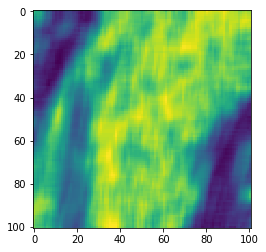

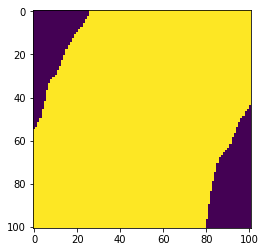

In [184]:
Xs = df_to_images(cnt[101*101*12 : 101*101*13])
plt.imshow(Xs[3])
plt.show()
plt.imshow(Xs[-1])
plt.show()

In [165]:
test_subset = [
    features_to_df( [xf[f_i] for xf in x_features_files], y_files[f_i] )
    for f_i in tqdm( range(100,200) )
]








  0%|          | 0/100 [00:00<?, ?it/s]

['output/har_out_simple_3/4b3502ca99_simple.tiff', 'output/har_out_advanced_3/4b3502ca99_advanced.tiff', 'output/har_out_higher_3/4b3502ca99_higher.tiff', 'output/har_out_simple_18/4b3502ca99_simple.tiff', 'output/har_out_advanced_18/4b3502ca99_advanced.tiff', 'output/har_out_higher_18/4b3502ca99_higher.tiff', 'output/har_out_simple_9/4b3502ca99_simple.tiff', 'output/har_out_advanced_9/4b3502ca99_advanced.tiff', 'output/har_out_higher_9/4b3502ca99_higher.tiff']
../data/train/masks/4b3502ca99.png









  1%|          | 1/100 [00:00<00:45,  2.18it/s]

['output/har_out_simple_3/b9614348f4_simple.tiff', 'output/har_out_advanced_3/b9614348f4_advanced.tiff', 'output/har_out_higher_3/b9614348f4_higher.tiff', 'output/har_out_simple_18/b9614348f4_simple.tiff', 'output/har_out_advanced_18/b9614348f4_advanced.tiff', 'output/har_out_higher_18/b9614348f4_higher.tiff', 'output/har_out_simple_9/b9614348f4_simple.tiff', 'output/har_out_advanced_9/b9614348f4_advanced.tiff', 'output/har_out_higher_9/b9614348f4_higher.tiff']
../data/train/masks/b9614348f4.png









  2%|▏         | 2/100 [00:00<00:42,  2.32it/s]

['output/har_out_simple_3/90990cd2ba_simple.tiff', 'output/har_out_advanced_3/90990cd2ba_advanced.tiff', 'output/har_out_higher_3/90990cd2ba_higher.tiff', 'output/har_out_simple_18/90990cd2ba_simple.tiff', 'output/har_out_advanced_18/90990cd2ba_advanced.tiff', 'output/har_out_higher_18/90990cd2ba_higher.tiff', 'output/har_out_simple_9/90990cd2ba_simple.tiff', 'output/har_out_advanced_9/90990cd2ba_advanced.tiff', 'output/har_out_higher_9/90990cd2ba_higher.tiff']
../data/train/masks/90990cd2ba.png









  3%|▎         | 3/100 [00:01<00:41,  2.33it/s]

['output/har_out_simple_3/9678fb935e_simple.tiff', 'output/har_out_advanced_3/9678fb935e_advanced.tiff', 'output/har_out_higher_3/9678fb935e_higher.tiff', 'output/har_out_simple_18/9678fb935e_simple.tiff', 'output/har_out_advanced_18/9678fb935e_advanced.tiff', 'output/har_out_higher_18/9678fb935e_higher.tiff', 'output/har_out_simple_9/9678fb935e_simple.tiff', 'output/har_out_advanced_9/9678fb935e_advanced.tiff', 'output/har_out_higher_9/9678fb935e_higher.tiff']
../data/train/masks/9678fb935e.png









  4%|▍         | 4/100 [00:01<00:40,  2.40it/s]

['output/har_out_simple_3/fcbc5cef9d_simple.tiff', 'output/har_out_advanced_3/fcbc5cef9d_advanced.tiff', 'output/har_out_higher_3/fcbc5cef9d_higher.tiff', 'output/har_out_simple_18/fcbc5cef9d_simple.tiff', 'output/har_out_advanced_18/fcbc5cef9d_advanced.tiff', 'output/har_out_higher_18/fcbc5cef9d_higher.tiff', 'output/har_out_simple_9/fcbc5cef9d_simple.tiff', 'output/har_out_advanced_9/fcbc5cef9d_advanced.tiff', 'output/har_out_higher_9/fcbc5cef9d_higher.tiff']
../data/train/masks/fcbc5cef9d.png









  5%|▌         | 5/100 [00:02<00:40,  2.37it/s]

['output/har_out_simple_3/f52c144f24_simple.tiff', 'output/har_out_advanced_3/f52c144f24_advanced.tiff', 'output/har_out_higher_3/f52c144f24_higher.tiff', 'output/har_out_simple_18/f52c144f24_simple.tiff', 'output/har_out_advanced_18/f52c144f24_advanced.tiff', 'output/har_out_higher_18/f52c144f24_higher.tiff', 'output/har_out_simple_9/f52c144f24_simple.tiff', 'output/har_out_advanced_9/f52c144f24_advanced.tiff', 'output/har_out_higher_9/f52c144f24_higher.tiff']
../data/train/masks/f52c144f24.png









  6%|▌         | 6/100 [00:02<00:39,  2.38it/s]

['output/har_out_simple_3/b690abdc09_simple.tiff', 'output/har_out_advanced_3/b690abdc09_advanced.tiff', 'output/har_out_higher_3/b690abdc09_higher.tiff', 'output/har_out_simple_18/b690abdc09_simple.tiff', 'output/har_out_advanced_18/b690abdc09_advanced.tiff', 'output/har_out_higher_18/b690abdc09_higher.tiff', 'output/har_out_simple_9/b690abdc09_simple.tiff', 'output/har_out_advanced_9/b690abdc09_advanced.tiff', 'output/har_out_higher_9/b690abdc09_higher.tiff']
../data/train/masks/b690abdc09.png









  7%|▋         | 7/100 [00:02<00:37,  2.47it/s]

['output/har_out_simple_3/da689f1bca_simple.tiff', 'output/har_out_advanced_3/da689f1bca_advanced.tiff', 'output/har_out_higher_3/da689f1bca_higher.tiff', 'output/har_out_simple_18/da689f1bca_simple.tiff', 'output/har_out_advanced_18/da689f1bca_advanced.tiff', 'output/har_out_higher_18/da689f1bca_higher.tiff', 'output/har_out_simple_9/da689f1bca_simple.tiff', 'output/har_out_advanced_9/da689f1bca_advanced.tiff', 'output/har_out_higher_9/da689f1bca_higher.tiff']
../data/train/masks/da689f1bca.png









  8%|▊         | 8/100 [00:03<00:37,  2.47it/s]

['output/har_out_simple_3/f5c25276d2_simple.tiff', 'output/har_out_advanced_3/f5c25276d2_advanced.tiff', 'output/har_out_higher_3/f5c25276d2_higher.tiff', 'output/har_out_simple_18/f5c25276d2_simple.tiff', 'output/har_out_advanced_18/f5c25276d2_advanced.tiff', 'output/har_out_higher_18/f5c25276d2_higher.tiff', 'output/har_out_simple_9/f5c25276d2_simple.tiff', 'output/har_out_advanced_9/f5c25276d2_advanced.tiff', 'output/har_out_higher_9/f5c25276d2_higher.tiff']
../data/train/masks/f5c25276d2.png









  9%|▉         | 9/100 [00:03<00:36,  2.48it/s]

['output/har_out_simple_3/c026a17632_simple.tiff', 'output/har_out_advanced_3/c026a17632_advanced.tiff', 'output/har_out_higher_3/c026a17632_higher.tiff', 'output/har_out_simple_18/c026a17632_simple.tiff', 'output/har_out_advanced_18/c026a17632_advanced.tiff', 'output/har_out_higher_18/c026a17632_higher.tiff', 'output/har_out_simple_9/c026a17632_simple.tiff', 'output/har_out_advanced_9/c026a17632_advanced.tiff', 'output/har_out_higher_9/c026a17632_higher.tiff']
../data/train/masks/c026a17632.png









 10%|█         | 10/100 [00:04<00:36,  2.49it/s]

['output/har_out_simple_3/f0c401b64b_simple.tiff', 'output/har_out_advanced_3/f0c401b64b_advanced.tiff', 'output/har_out_higher_3/f0c401b64b_higher.tiff', 'output/har_out_simple_18/f0c401b64b_simple.tiff', 'output/har_out_advanced_18/f0c401b64b_advanced.tiff', 'output/har_out_higher_18/f0c401b64b_higher.tiff', 'output/har_out_simple_9/f0c401b64b_simple.tiff', 'output/har_out_advanced_9/f0c401b64b_advanced.tiff', 'output/har_out_higher_9/f0c401b64b_higher.tiff']
../data/train/masks/f0c401b64b.png









 11%|█         | 11/100 [00:04<00:34,  2.59it/s]

['output/har_out_simple_3/d3f3db7bd1_simple.tiff', 'output/har_out_advanced_3/d3f3db7bd1_advanced.tiff', 'output/har_out_higher_3/d3f3db7bd1_higher.tiff', 'output/har_out_simple_18/d3f3db7bd1_simple.tiff', 'output/har_out_advanced_18/d3f3db7bd1_advanced.tiff', 'output/har_out_higher_18/d3f3db7bd1_higher.tiff', 'output/har_out_simple_9/d3f3db7bd1_simple.tiff', 'output/har_out_advanced_9/d3f3db7bd1_advanced.tiff', 'output/har_out_higher_9/d3f3db7bd1_higher.tiff']
../data/train/masks/d3f3db7bd1.png









 12%|█▏        | 12/100 [00:04<00:35,  2.45it/s]

['output/har_out_simple_3/44ac5b2526_simple.tiff', 'output/har_out_advanced_3/44ac5b2526_advanced.tiff', 'output/har_out_higher_3/44ac5b2526_higher.tiff', 'output/har_out_simple_18/44ac5b2526_simple.tiff', 'output/har_out_advanced_18/44ac5b2526_advanced.tiff', 'output/har_out_higher_18/44ac5b2526_higher.tiff', 'output/har_out_simple_9/44ac5b2526_simple.tiff', 'output/har_out_advanced_9/44ac5b2526_advanced.tiff', 'output/har_out_higher_9/44ac5b2526_higher.tiff']
../data/train/masks/44ac5b2526.png









 13%|█▎        | 13/100 [00:05<00:35,  2.44it/s]

['output/har_out_simple_3/53de66df2a_simple.tiff', 'output/har_out_advanced_3/53de66df2a_advanced.tiff', 'output/har_out_higher_3/53de66df2a_higher.tiff', 'output/har_out_simple_18/53de66df2a_simple.tiff', 'output/har_out_advanced_18/53de66df2a_advanced.tiff', 'output/har_out_higher_18/53de66df2a_higher.tiff', 'output/har_out_simple_9/53de66df2a_simple.tiff', 'output/har_out_advanced_9/53de66df2a_advanced.tiff', 'output/har_out_higher_9/53de66df2a_higher.tiff']
../data/train/masks/53de66df2a.png









 14%|█▍        | 14/100 [00:05<00:35,  2.39it/s]

['output/har_out_simple_3/23cdfc53fe_simple.tiff', 'output/har_out_advanced_3/23cdfc53fe_advanced.tiff', 'output/har_out_higher_3/23cdfc53fe_higher.tiff', 'output/har_out_simple_18/23cdfc53fe_simple.tiff', 'output/har_out_advanced_18/23cdfc53fe_advanced.tiff', 'output/har_out_higher_18/23cdfc53fe_higher.tiff', 'output/har_out_simple_9/23cdfc53fe_simple.tiff', 'output/har_out_advanced_9/23cdfc53fe_advanced.tiff', 'output/har_out_higher_9/23cdfc53fe_higher.tiff']
../data/train/masks/23cdfc53fe.png









 15%|█▌        | 15/100 [00:06<00:35,  2.40it/s]

['output/har_out_simple_3/2b30313d2c_simple.tiff', 'output/har_out_advanced_3/2b30313d2c_advanced.tiff', 'output/har_out_higher_3/2b30313d2c_higher.tiff', 'output/har_out_simple_18/2b30313d2c_simple.tiff', 'output/har_out_advanced_18/2b30313d2c_advanced.tiff', 'output/har_out_higher_18/2b30313d2c_higher.tiff', 'output/har_out_simple_9/2b30313d2c_simple.tiff', 'output/har_out_advanced_9/2b30313d2c_advanced.tiff', 'output/har_out_higher_9/2b30313d2c_higher.tiff']
../data/train/masks/2b30313d2c.png









 16%|█▌        | 16/100 [00:06<00:36,  2.32it/s]

['output/har_out_simple_3/b8a9602e21_simple.tiff', 'output/har_out_advanced_3/b8a9602e21_advanced.tiff', 'output/har_out_higher_3/b8a9602e21_higher.tiff', 'output/har_out_simple_18/b8a9602e21_simple.tiff', 'output/har_out_advanced_18/b8a9602e21_advanced.tiff', 'output/har_out_higher_18/b8a9602e21_higher.tiff', 'output/har_out_simple_9/b8a9602e21_simple.tiff', 'output/har_out_advanced_9/b8a9602e21_advanced.tiff', 'output/har_out_higher_9/b8a9602e21_higher.tiff']
../data/train/masks/b8a9602e21.png









 17%|█▋        | 17/100 [00:07<00:35,  2.35it/s]

['output/har_out_simple_3/1cb9549d2c_simple.tiff', 'output/har_out_advanced_3/1cb9549d2c_advanced.tiff', 'output/har_out_higher_3/1cb9549d2c_higher.tiff', 'output/har_out_simple_18/1cb9549d2c_simple.tiff', 'output/har_out_advanced_18/1cb9549d2c_advanced.tiff', 'output/har_out_higher_18/1cb9549d2c_higher.tiff', 'output/har_out_simple_9/1cb9549d2c_simple.tiff', 'output/har_out_advanced_9/1cb9549d2c_advanced.tiff', 'output/har_out_higher_9/1cb9549d2c_higher.tiff']
../data/train/masks/1cb9549d2c.png









 18%|█▊        | 18/100 [00:07<00:35,  2.29it/s]

['output/har_out_simple_3/70c7bb7616_simple.tiff', 'output/har_out_advanced_3/70c7bb7616_advanced.tiff', 'output/har_out_higher_3/70c7bb7616_higher.tiff', 'output/har_out_simple_18/70c7bb7616_simple.tiff', 'output/har_out_advanced_18/70c7bb7616_advanced.tiff', 'output/har_out_higher_18/70c7bb7616_higher.tiff', 'output/har_out_simple_9/70c7bb7616_simple.tiff', 'output/har_out_advanced_9/70c7bb7616_advanced.tiff', 'output/har_out_higher_9/70c7bb7616_higher.tiff']
../data/train/masks/70c7bb7616.png









 19%|█▉        | 19/100 [00:07<00:34,  2.37it/s]

['output/har_out_simple_3/d465b396f2_simple.tiff', 'output/har_out_advanced_3/d465b396f2_advanced.tiff', 'output/har_out_higher_3/d465b396f2_higher.tiff', 'output/har_out_simple_18/d465b396f2_simple.tiff', 'output/har_out_advanced_18/d465b396f2_advanced.tiff', 'output/har_out_higher_18/d465b396f2_higher.tiff', 'output/har_out_simple_9/d465b396f2_simple.tiff', 'output/har_out_advanced_9/d465b396f2_advanced.tiff', 'output/har_out_higher_9/d465b396f2_higher.tiff']
../data/train/masks/d465b396f2.png









 20%|██        | 20/100 [00:08<00:33,  2.42it/s]

['output/har_out_simple_3/d3b6c08868_simple.tiff', 'output/har_out_advanced_3/d3b6c08868_advanced.tiff', 'output/har_out_higher_3/d3b6c08868_higher.tiff', 'output/har_out_simple_18/d3b6c08868_simple.tiff', 'output/har_out_advanced_18/d3b6c08868_advanced.tiff', 'output/har_out_higher_18/d3b6c08868_higher.tiff', 'output/har_out_simple_9/d3b6c08868_simple.tiff', 'output/har_out_advanced_9/d3b6c08868_advanced.tiff', 'output/har_out_higher_9/d3b6c08868_higher.tiff']
../data/train/masks/d3b6c08868.png









 21%|██        | 21/100 [00:08<00:31,  2.49it/s]

['output/har_out_simple_3/f7e555a0aa_simple.tiff', 'output/har_out_advanced_3/f7e555a0aa_advanced.tiff', 'output/har_out_higher_3/f7e555a0aa_higher.tiff', 'output/har_out_simple_18/f7e555a0aa_simple.tiff', 'output/har_out_advanced_18/f7e555a0aa_advanced.tiff', 'output/har_out_higher_18/f7e555a0aa_higher.tiff', 'output/har_out_simple_9/f7e555a0aa_simple.tiff', 'output/har_out_advanced_9/f7e555a0aa_advanced.tiff', 'output/har_out_higher_9/f7e555a0aa_higher.tiff']
../data/train/masks/f7e555a0aa.png









 22%|██▏       | 22/100 [00:09<00:31,  2.47it/s]

['output/har_out_simple_3/86365721e2_simple.tiff', 'output/har_out_advanced_3/86365721e2_advanced.tiff', 'output/har_out_higher_3/86365721e2_higher.tiff', 'output/har_out_simple_18/86365721e2_simple.tiff', 'output/har_out_advanced_18/86365721e2_advanced.tiff', 'output/har_out_higher_18/86365721e2_higher.tiff', 'output/har_out_simple_9/86365721e2_simple.tiff', 'output/har_out_advanced_9/86365721e2_advanced.tiff', 'output/har_out_higher_9/86365721e2_higher.tiff']
../data/train/masks/86365721e2.png









 23%|██▎       | 23/100 [00:09<00:30,  2.51it/s]

['output/har_out_simple_3/a2da67afff_simple.tiff', 'output/har_out_advanced_3/a2da67afff_advanced.tiff', 'output/har_out_higher_3/a2da67afff_higher.tiff', 'output/har_out_simple_18/a2da67afff_simple.tiff', 'output/har_out_advanced_18/a2da67afff_advanced.tiff', 'output/har_out_higher_18/a2da67afff_higher.tiff', 'output/har_out_simple_9/a2da67afff_simple.tiff', 'output/har_out_advanced_9/a2da67afff_advanced.tiff', 'output/har_out_higher_9/a2da67afff_higher.tiff']
../data/train/masks/a2da67afff.png









 24%|██▍       | 24/100 [00:09<00:29,  2.58it/s]

['output/har_out_simple_3/75c7d3b5a8_simple.tiff', 'output/har_out_advanced_3/75c7d3b5a8_advanced.tiff', 'output/har_out_higher_3/75c7d3b5a8_higher.tiff', 'output/har_out_simple_18/75c7d3b5a8_simple.tiff', 'output/har_out_advanced_18/75c7d3b5a8_advanced.tiff', 'output/har_out_higher_18/75c7d3b5a8_higher.tiff', 'output/har_out_simple_9/75c7d3b5a8_simple.tiff', 'output/har_out_advanced_9/75c7d3b5a8_advanced.tiff', 'output/har_out_higher_9/75c7d3b5a8_higher.tiff']
../data/train/masks/75c7d3b5a8.png









 25%|██▌       | 25/100 [00:10<00:30,  2.48it/s]

['output/har_out_simple_3/2d3c0a68f9_simple.tiff', 'output/har_out_advanced_3/2d3c0a68f9_advanced.tiff', 'output/har_out_higher_3/2d3c0a68f9_higher.tiff', 'output/har_out_simple_18/2d3c0a68f9_simple.tiff', 'output/har_out_advanced_18/2d3c0a68f9_advanced.tiff', 'output/har_out_higher_18/2d3c0a68f9_higher.tiff', 'output/har_out_simple_9/2d3c0a68f9_simple.tiff', 'output/har_out_advanced_9/2d3c0a68f9_advanced.tiff', 'output/har_out_higher_9/2d3c0a68f9_higher.tiff']
../data/train/masks/2d3c0a68f9.png









 26%|██▌       | 26/100 [00:10<00:30,  2.39it/s]

['output/har_out_simple_3/cc6abe337d_simple.tiff', 'output/har_out_advanced_3/cc6abe337d_advanced.tiff', 'output/har_out_higher_3/cc6abe337d_higher.tiff', 'output/har_out_simple_18/cc6abe337d_simple.tiff', 'output/har_out_advanced_18/cc6abe337d_advanced.tiff', 'output/har_out_higher_18/cc6abe337d_higher.tiff', 'output/har_out_simple_9/cc6abe337d_simple.tiff', 'output/har_out_advanced_9/cc6abe337d_advanced.tiff', 'output/har_out_higher_9/cc6abe337d_higher.tiff']
../data/train/masks/cc6abe337d.png









 27%|██▋       | 27/100 [00:11<00:30,  2.39it/s]

['output/har_out_simple_3/8f07ef8585_simple.tiff', 'output/har_out_advanced_3/8f07ef8585_advanced.tiff', 'output/har_out_higher_3/8f07ef8585_higher.tiff', 'output/har_out_simple_18/8f07ef8585_simple.tiff', 'output/har_out_advanced_18/8f07ef8585_advanced.tiff', 'output/har_out_higher_18/8f07ef8585_higher.tiff', 'output/har_out_simple_9/8f07ef8585_simple.tiff', 'output/har_out_advanced_9/8f07ef8585_advanced.tiff', 'output/har_out_higher_9/8f07ef8585_higher.tiff']
../data/train/masks/8f07ef8585.png









 28%|██▊       | 28/100 [00:11<00:29,  2.43it/s]

['output/har_out_simple_3/36bc8044f8_simple.tiff', 'output/har_out_advanced_3/36bc8044f8_advanced.tiff', 'output/har_out_higher_3/36bc8044f8_higher.tiff', 'output/har_out_simple_18/36bc8044f8_simple.tiff', 'output/har_out_advanced_18/36bc8044f8_advanced.tiff', 'output/har_out_higher_18/36bc8044f8_higher.tiff', 'output/har_out_simple_9/36bc8044f8_simple.tiff', 'output/har_out_advanced_9/36bc8044f8_advanced.tiff', 'output/har_out_higher_9/36bc8044f8_higher.tiff']
../data/train/masks/36bc8044f8.png









 29%|██▉       | 29/100 [00:11<00:28,  2.45it/s]

['output/har_out_simple_3/ae61c09508_simple.tiff', 'output/har_out_advanced_3/ae61c09508_advanced.tiff', 'output/har_out_higher_3/ae61c09508_higher.tiff', 'output/har_out_simple_18/ae61c09508_simple.tiff', 'output/har_out_advanced_18/ae61c09508_advanced.tiff', 'output/har_out_higher_18/ae61c09508_higher.tiff', 'output/har_out_simple_9/ae61c09508_simple.tiff', 'output/har_out_advanced_9/ae61c09508_advanced.tiff', 'output/har_out_higher_9/ae61c09508_higher.tiff']
../data/train/masks/ae61c09508.png









 30%|███       | 30/100 [00:12<00:28,  2.42it/s]

['output/har_out_simple_3/ad29bc8923_simple.tiff', 'output/har_out_advanced_3/ad29bc8923_advanced.tiff', 'output/har_out_higher_3/ad29bc8923_higher.tiff', 'output/har_out_simple_18/ad29bc8923_simple.tiff', 'output/har_out_advanced_18/ad29bc8923_advanced.tiff', 'output/har_out_higher_18/ad29bc8923_higher.tiff', 'output/har_out_simple_9/ad29bc8923_simple.tiff', 'output/har_out_advanced_9/ad29bc8923_advanced.tiff', 'output/har_out_higher_9/ad29bc8923_higher.tiff']
../data/train/masks/ad29bc8923.png









 31%|███       | 31/100 [00:12<00:27,  2.47it/s]

['output/har_out_simple_3/8ab2399b4a_simple.tiff', 'output/har_out_advanced_3/8ab2399b4a_advanced.tiff', 'output/har_out_higher_3/8ab2399b4a_higher.tiff', 'output/har_out_simple_18/8ab2399b4a_simple.tiff', 'output/har_out_advanced_18/8ab2399b4a_advanced.tiff', 'output/har_out_higher_18/8ab2399b4a_higher.tiff', 'output/har_out_simple_9/8ab2399b4a_simple.tiff', 'output/har_out_advanced_9/8ab2399b4a_advanced.tiff', 'output/har_out_higher_9/8ab2399b4a_higher.tiff']
../data/train/masks/8ab2399b4a.png









 32%|███▏      | 32/100 [00:13<00:28,  2.36it/s]

['output/har_out_simple_3/594712691d_simple.tiff', 'output/har_out_advanced_3/594712691d_advanced.tiff', 'output/har_out_higher_3/594712691d_higher.tiff', 'output/har_out_simple_18/594712691d_simple.tiff', 'output/har_out_advanced_18/594712691d_advanced.tiff', 'output/har_out_higher_18/594712691d_higher.tiff', 'output/har_out_simple_9/594712691d_simple.tiff', 'output/har_out_advanced_9/594712691d_advanced.tiff', 'output/har_out_higher_9/594712691d_higher.tiff']
../data/train/masks/594712691d.png









 33%|███▎      | 33/100 [00:13<00:28,  2.38it/s]

['output/har_out_simple_3/7c6a2df039_simple.tiff', 'output/har_out_advanced_3/7c6a2df039_advanced.tiff', 'output/har_out_higher_3/7c6a2df039_higher.tiff', 'output/har_out_simple_18/7c6a2df039_simple.tiff', 'output/har_out_advanced_18/7c6a2df039_advanced.tiff', 'output/har_out_higher_18/7c6a2df039_higher.tiff', 'output/har_out_simple_9/7c6a2df039_simple.tiff', 'output/har_out_advanced_9/7c6a2df039_advanced.tiff', 'output/har_out_higher_9/7c6a2df039_higher.tiff']
../data/train/masks/7c6a2df039.png









 34%|███▍      | 34/100 [00:13<00:27,  2.42it/s]

['output/har_out_simple_3/3bf70b71cd_simple.tiff', 'output/har_out_advanced_3/3bf70b71cd_advanced.tiff', 'output/har_out_higher_3/3bf70b71cd_higher.tiff', 'output/har_out_simple_18/3bf70b71cd_simple.tiff', 'output/har_out_advanced_18/3bf70b71cd_advanced.tiff', 'output/har_out_higher_18/3bf70b71cd_higher.tiff', 'output/har_out_simple_9/3bf70b71cd_simple.tiff', 'output/har_out_advanced_9/3bf70b71cd_advanced.tiff', 'output/har_out_higher_9/3bf70b71cd_higher.tiff']
../data/train/masks/3bf70b71cd.png









 35%|███▌      | 35/100 [00:14<00:25,  2.52it/s]

['output/har_out_simple_3/69cddf572c_simple.tiff', 'output/har_out_advanced_3/69cddf572c_advanced.tiff', 'output/har_out_higher_3/69cddf572c_higher.tiff', 'output/har_out_simple_18/69cddf572c_simple.tiff', 'output/har_out_advanced_18/69cddf572c_advanced.tiff', 'output/har_out_higher_18/69cddf572c_higher.tiff', 'output/har_out_simple_9/69cddf572c_simple.tiff', 'output/har_out_advanced_9/69cddf572c_advanced.tiff', 'output/har_out_higher_9/69cddf572c_higher.tiff']
../data/train/masks/69cddf572c.png









 36%|███▌      | 36/100 [00:14<00:26,  2.46it/s]

['output/har_out_simple_3/5c8ce5869b_simple.tiff', 'output/har_out_advanced_3/5c8ce5869b_advanced.tiff', 'output/har_out_higher_3/5c8ce5869b_higher.tiff', 'output/har_out_simple_18/5c8ce5869b_simple.tiff', 'output/har_out_advanced_18/5c8ce5869b_advanced.tiff', 'output/har_out_higher_18/5c8ce5869b_higher.tiff', 'output/har_out_simple_9/5c8ce5869b_simple.tiff', 'output/har_out_advanced_9/5c8ce5869b_advanced.tiff', 'output/har_out_higher_9/5c8ce5869b_higher.tiff']
../data/train/masks/5c8ce5869b.png









 37%|███▋      | 37/100 [00:15<00:24,  2.55it/s]

['output/har_out_simple_3/f2fcceee25_simple.tiff', 'output/har_out_advanced_3/f2fcceee25_advanced.tiff', 'output/har_out_higher_3/f2fcceee25_higher.tiff', 'output/har_out_simple_18/f2fcceee25_simple.tiff', 'output/har_out_advanced_18/f2fcceee25_advanced.tiff', 'output/har_out_higher_18/f2fcceee25_higher.tiff', 'output/har_out_simple_9/f2fcceee25_simple.tiff', 'output/har_out_advanced_9/f2fcceee25_advanced.tiff', 'output/har_out_higher_9/f2fcceee25_higher.tiff']
../data/train/masks/f2fcceee25.png









 38%|███▊      | 38/100 [00:15<00:23,  2.62it/s]

['output/har_out_simple_3/f5c2e66754_simple.tiff', 'output/har_out_advanced_3/f5c2e66754_advanced.tiff', 'output/har_out_higher_3/f5c2e66754_higher.tiff', 'output/har_out_simple_18/f5c2e66754_simple.tiff', 'output/har_out_advanced_18/f5c2e66754_advanced.tiff', 'output/har_out_higher_18/f5c2e66754_higher.tiff', 'output/har_out_simple_9/f5c2e66754_simple.tiff', 'output/har_out_advanced_9/f5c2e66754_advanced.tiff', 'output/har_out_higher_9/f5c2e66754_higher.tiff']
../data/train/masks/f5c2e66754.png









 39%|███▉      | 39/100 [00:15<00:23,  2.56it/s]

['output/har_out_simple_3/136af05158_simple.tiff', 'output/har_out_advanced_3/136af05158_advanced.tiff', 'output/har_out_higher_3/136af05158_higher.tiff', 'output/har_out_simple_18/136af05158_simple.tiff', 'output/har_out_advanced_18/136af05158_advanced.tiff', 'output/har_out_higher_18/136af05158_higher.tiff', 'output/har_out_simple_9/136af05158_simple.tiff', 'output/har_out_advanced_9/136af05158_advanced.tiff', 'output/har_out_higher_9/136af05158_higher.tiff']
../data/train/masks/136af05158.png









 40%|████      | 40/100 [00:16<00:23,  2.51it/s]

['output/har_out_simple_3/eec46ec66b_simple.tiff', 'output/har_out_advanced_3/eec46ec66b_advanced.tiff', 'output/har_out_higher_3/eec46ec66b_higher.tiff', 'output/har_out_simple_18/eec46ec66b_simple.tiff', 'output/har_out_advanced_18/eec46ec66b_advanced.tiff', 'output/har_out_higher_18/eec46ec66b_higher.tiff', 'output/har_out_simple_9/eec46ec66b_simple.tiff', 'output/har_out_advanced_9/eec46ec66b_advanced.tiff', 'output/har_out_higher_9/eec46ec66b_higher.tiff']
../data/train/masks/eec46ec66b.png









 41%|████      | 41/100 [00:16<00:23,  2.49it/s]

['output/har_out_simple_3/8b0478ed02_simple.tiff', 'output/har_out_advanced_3/8b0478ed02_advanced.tiff', 'output/har_out_higher_3/8b0478ed02_higher.tiff', 'output/har_out_simple_18/8b0478ed02_simple.tiff', 'output/har_out_advanced_18/8b0478ed02_advanced.tiff', 'output/har_out_higher_18/8b0478ed02_higher.tiff', 'output/har_out_simple_9/8b0478ed02_simple.tiff', 'output/har_out_advanced_9/8b0478ed02_advanced.tiff', 'output/har_out_higher_9/8b0478ed02_higher.tiff']
../data/train/masks/8b0478ed02.png









 42%|████▏     | 42/100 [00:17<00:23,  2.52it/s]

['output/har_out_simple_3/ef29bdffc6_simple.tiff', 'output/har_out_advanced_3/ef29bdffc6_advanced.tiff', 'output/har_out_higher_3/ef29bdffc6_higher.tiff', 'output/har_out_simple_18/ef29bdffc6_simple.tiff', 'output/har_out_advanced_18/ef29bdffc6_advanced.tiff', 'output/har_out_higher_18/ef29bdffc6_higher.tiff', 'output/har_out_simple_9/ef29bdffc6_simple.tiff', 'output/har_out_advanced_9/ef29bdffc6_advanced.tiff', 'output/har_out_higher_9/ef29bdffc6_higher.tiff']
../data/train/masks/ef29bdffc6.png









 43%|████▎     | 43/100 [00:17<00:22,  2.56it/s]

['output/har_out_simple_3/e7ee2c6dce_simple.tiff', 'output/har_out_advanced_3/e7ee2c6dce_advanced.tiff', 'output/har_out_higher_3/e7ee2c6dce_higher.tiff', 'output/har_out_simple_18/e7ee2c6dce_simple.tiff', 'output/har_out_advanced_18/e7ee2c6dce_advanced.tiff', 'output/har_out_higher_18/e7ee2c6dce_higher.tiff', 'output/har_out_simple_9/e7ee2c6dce_simple.tiff', 'output/har_out_advanced_9/e7ee2c6dce_advanced.tiff', 'output/har_out_higher_9/e7ee2c6dce_higher.tiff']
../data/train/masks/e7ee2c6dce.png









 44%|████▍     | 44/100 [00:17<00:22,  2.49it/s]

['output/har_out_simple_3/7d8e29261b_simple.tiff', 'output/har_out_advanced_3/7d8e29261b_advanced.tiff', 'output/har_out_higher_3/7d8e29261b_higher.tiff', 'output/har_out_simple_18/7d8e29261b_simple.tiff', 'output/har_out_advanced_18/7d8e29261b_advanced.tiff', 'output/har_out_higher_18/7d8e29261b_higher.tiff', 'output/har_out_simple_9/7d8e29261b_simple.tiff', 'output/har_out_advanced_9/7d8e29261b_advanced.tiff', 'output/har_out_higher_9/7d8e29261b_higher.tiff']
../data/train/masks/7d8e29261b.png









 45%|████▌     | 45/100 [00:18<00:22,  2.44it/s]

['output/har_out_simple_3/80694aa70f_simple.tiff', 'output/har_out_advanced_3/80694aa70f_advanced.tiff', 'output/har_out_higher_3/80694aa70f_higher.tiff', 'output/har_out_simple_18/80694aa70f_simple.tiff', 'output/har_out_advanced_18/80694aa70f_advanced.tiff', 'output/har_out_higher_18/80694aa70f_higher.tiff', 'output/har_out_simple_9/80694aa70f_simple.tiff', 'output/har_out_advanced_9/80694aa70f_advanced.tiff', 'output/har_out_higher_9/80694aa70f_higher.tiff']
../data/train/masks/80694aa70f.png









 46%|████▌     | 46/100 [00:18<00:21,  2.46it/s]

['output/har_out_simple_3/28ca5ff16f_simple.tiff', 'output/har_out_advanced_3/28ca5ff16f_advanced.tiff', 'output/har_out_higher_3/28ca5ff16f_higher.tiff', 'output/har_out_simple_18/28ca5ff16f_simple.tiff', 'output/har_out_advanced_18/28ca5ff16f_advanced.tiff', 'output/har_out_higher_18/28ca5ff16f_higher.tiff', 'output/har_out_simple_9/28ca5ff16f_simple.tiff', 'output/har_out_advanced_9/28ca5ff16f_advanced.tiff', 'output/har_out_higher_9/28ca5ff16f_higher.tiff']
../data/train/masks/28ca5ff16f.png









 47%|████▋     | 47/100 [00:19<00:20,  2.58it/s]

['output/har_out_simple_3/57e394bc67_simple.tiff', 'output/har_out_advanced_3/57e394bc67_advanced.tiff', 'output/har_out_higher_3/57e394bc67_higher.tiff', 'output/har_out_simple_18/57e394bc67_simple.tiff', 'output/har_out_advanced_18/57e394bc67_advanced.tiff', 'output/har_out_higher_18/57e394bc67_higher.tiff', 'output/har_out_simple_9/57e394bc67_simple.tiff', 'output/har_out_advanced_9/57e394bc67_advanced.tiff', 'output/har_out_higher_9/57e394bc67_higher.tiff']
../data/train/masks/57e394bc67.png









 48%|████▊     | 48/100 [00:19<00:20,  2.52it/s]

['output/har_out_simple_3/6cf6889e33_simple.tiff', 'output/har_out_advanced_3/6cf6889e33_advanced.tiff', 'output/har_out_higher_3/6cf6889e33_higher.tiff', 'output/har_out_simple_18/6cf6889e33_simple.tiff', 'output/har_out_advanced_18/6cf6889e33_advanced.tiff', 'output/har_out_higher_18/6cf6889e33_higher.tiff', 'output/har_out_simple_9/6cf6889e33_simple.tiff', 'output/har_out_advanced_9/6cf6889e33_advanced.tiff', 'output/har_out_higher_9/6cf6889e33_higher.tiff']
../data/train/masks/6cf6889e33.png









 49%|████▉     | 49/100 [00:19<00:19,  2.56it/s]

['output/har_out_simple_3/d21012f5c1_simple.tiff', 'output/har_out_advanced_3/d21012f5c1_advanced.tiff', 'output/har_out_higher_3/d21012f5c1_higher.tiff', 'output/har_out_simple_18/d21012f5c1_simple.tiff', 'output/har_out_advanced_18/d21012f5c1_advanced.tiff', 'output/har_out_higher_18/d21012f5c1_higher.tiff', 'output/har_out_simple_9/d21012f5c1_simple.tiff', 'output/har_out_advanced_9/d21012f5c1_advanced.tiff', 'output/har_out_higher_9/d21012f5c1_higher.tiff']
../data/train/masks/d21012f5c1.png









 50%|█████     | 50/100 [00:20<00:18,  2.67it/s]

['output/har_out_simple_3/6d9be2f492_simple.tiff', 'output/har_out_advanced_3/6d9be2f492_advanced.tiff', 'output/har_out_higher_3/6d9be2f492_higher.tiff', 'output/har_out_simple_18/6d9be2f492_simple.tiff', 'output/har_out_advanced_18/6d9be2f492_advanced.tiff', 'output/har_out_higher_18/6d9be2f492_higher.tiff', 'output/har_out_simple_9/6d9be2f492_simple.tiff', 'output/har_out_advanced_9/6d9be2f492_advanced.tiff', 'output/har_out_higher_9/6d9be2f492_higher.tiff']
../data/train/masks/6d9be2f492.png









 51%|█████     | 51/100 [00:20<00:18,  2.62it/s]

['output/har_out_simple_3/45a1f78171_simple.tiff', 'output/har_out_advanced_3/45a1f78171_advanced.tiff', 'output/har_out_higher_3/45a1f78171_higher.tiff', 'output/har_out_simple_18/45a1f78171_simple.tiff', 'output/har_out_advanced_18/45a1f78171_advanced.tiff', 'output/har_out_higher_18/45a1f78171_higher.tiff', 'output/har_out_simple_9/45a1f78171_simple.tiff', 'output/har_out_advanced_9/45a1f78171_advanced.tiff', 'output/har_out_higher_9/45a1f78171_higher.tiff']
../data/train/masks/45a1f78171.png









 52%|█████▏    | 52/100 [00:20<00:18,  2.65it/s]

['output/har_out_simple_3/130229ec15_simple.tiff', 'output/har_out_advanced_3/130229ec15_advanced.tiff', 'output/har_out_higher_3/130229ec15_higher.tiff', 'output/har_out_simple_18/130229ec15_simple.tiff', 'output/har_out_advanced_18/130229ec15_advanced.tiff', 'output/har_out_higher_18/130229ec15_higher.tiff', 'output/har_out_simple_9/130229ec15_simple.tiff', 'output/har_out_advanced_9/130229ec15_advanced.tiff', 'output/har_out_higher_9/130229ec15_higher.tiff']
../data/train/masks/130229ec15.png









 53%|█████▎    | 53/100 [00:21<00:17,  2.62it/s]

['output/har_out_simple_3/30cc3d3982_simple.tiff', 'output/har_out_advanced_3/30cc3d3982_advanced.tiff', 'output/har_out_higher_3/30cc3d3982_higher.tiff', 'output/har_out_simple_18/30cc3d3982_simple.tiff', 'output/har_out_advanced_18/30cc3d3982_advanced.tiff', 'output/har_out_higher_18/30cc3d3982_higher.tiff', 'output/har_out_simple_9/30cc3d3982_simple.tiff', 'output/har_out_advanced_9/30cc3d3982_advanced.tiff', 'output/har_out_higher_9/30cc3d3982_higher.tiff']
../data/train/masks/30cc3d3982.png









 54%|█████▍    | 54/100 [00:21<00:17,  2.66it/s]

['output/har_out_simple_3/d14ad5cb55_simple.tiff', 'output/har_out_advanced_3/d14ad5cb55_advanced.tiff', 'output/har_out_higher_3/d14ad5cb55_higher.tiff', 'output/har_out_simple_18/d14ad5cb55_simple.tiff', 'output/har_out_advanced_18/d14ad5cb55_advanced.tiff', 'output/har_out_higher_18/d14ad5cb55_higher.tiff', 'output/har_out_simple_9/d14ad5cb55_simple.tiff', 'output/har_out_advanced_9/d14ad5cb55_advanced.tiff', 'output/har_out_higher_9/d14ad5cb55_higher.tiff']
../data/train/masks/d14ad5cb55.png









 55%|█████▌    | 55/100 [00:22<00:17,  2.63it/s]

['output/har_out_simple_3/d84e52cb6e_simple.tiff', 'output/har_out_advanced_3/d84e52cb6e_advanced.tiff', 'output/har_out_higher_3/d84e52cb6e_higher.tiff', 'output/har_out_simple_18/d84e52cb6e_simple.tiff', 'output/har_out_advanced_18/d84e52cb6e_advanced.tiff', 'output/har_out_higher_18/d84e52cb6e_higher.tiff', 'output/har_out_simple_9/d84e52cb6e_simple.tiff', 'output/har_out_advanced_9/d84e52cb6e_advanced.tiff', 'output/har_out_higher_9/d84e52cb6e_higher.tiff']
../data/train/masks/d84e52cb6e.png









 56%|█████▌    | 56/100 [00:22<00:17,  2.55it/s]

['output/har_out_simple_3/7fc1ce1cb4_simple.tiff', 'output/har_out_advanced_3/7fc1ce1cb4_advanced.tiff', 'output/har_out_higher_3/7fc1ce1cb4_higher.tiff', 'output/har_out_simple_18/7fc1ce1cb4_simple.tiff', 'output/har_out_advanced_18/7fc1ce1cb4_advanced.tiff', 'output/har_out_higher_18/7fc1ce1cb4_higher.tiff', 'output/har_out_simple_9/7fc1ce1cb4_simple.tiff', 'output/har_out_advanced_9/7fc1ce1cb4_advanced.tiff', 'output/har_out_higher_9/7fc1ce1cb4_higher.tiff']
../data/train/masks/7fc1ce1cb4.png









 57%|█████▋    | 57/100 [00:22<00:16,  2.64it/s]

['output/har_out_simple_3/a6ec5aa914_simple.tiff', 'output/har_out_advanced_3/a6ec5aa914_advanced.tiff', 'output/har_out_higher_3/a6ec5aa914_higher.tiff', 'output/har_out_simple_18/a6ec5aa914_simple.tiff', 'output/har_out_advanced_18/a6ec5aa914_advanced.tiff', 'output/har_out_higher_18/a6ec5aa914_higher.tiff', 'output/har_out_simple_9/a6ec5aa914_simple.tiff', 'output/har_out_advanced_9/a6ec5aa914_advanced.tiff', 'output/har_out_higher_9/a6ec5aa914_higher.tiff']
../data/train/masks/a6ec5aa914.png









 58%|█████▊    | 58/100 [00:23<00:16,  2.60it/s]

['output/har_out_simple_3/7582c0b2e9_simple.tiff', 'output/har_out_advanced_3/7582c0b2e9_advanced.tiff', 'output/har_out_higher_3/7582c0b2e9_higher.tiff', 'output/har_out_simple_18/7582c0b2e9_simple.tiff', 'output/har_out_advanced_18/7582c0b2e9_advanced.tiff', 'output/har_out_higher_18/7582c0b2e9_higher.tiff', 'output/har_out_simple_9/7582c0b2e9_simple.tiff', 'output/har_out_advanced_9/7582c0b2e9_advanced.tiff', 'output/har_out_higher_9/7582c0b2e9_higher.tiff']
../data/train/masks/7582c0b2e9.png









 59%|█████▉    | 59/100 [00:23<00:16,  2.43it/s]

['output/har_out_simple_3/418a13df5c_simple.tiff', 'output/har_out_advanced_3/418a13df5c_advanced.tiff', 'output/har_out_higher_3/418a13df5c_higher.tiff', 'output/har_out_simple_18/418a13df5c_simple.tiff', 'output/har_out_advanced_18/418a13df5c_advanced.tiff', 'output/har_out_higher_18/418a13df5c_higher.tiff', 'output/har_out_simple_9/418a13df5c_simple.tiff', 'output/har_out_advanced_9/418a13df5c_advanced.tiff', 'output/har_out_higher_9/418a13df5c_higher.tiff']
../data/train/masks/418a13df5c.png









 60%|██████    | 60/100 [00:24<00:16,  2.46it/s]

['output/har_out_simple_3/accb644c9e_simple.tiff', 'output/har_out_advanced_3/accb644c9e_advanced.tiff', 'output/har_out_higher_3/accb644c9e_higher.tiff', 'output/har_out_simple_18/accb644c9e_simple.tiff', 'output/har_out_advanced_18/accb644c9e_advanced.tiff', 'output/har_out_higher_18/accb644c9e_higher.tiff', 'output/har_out_simple_9/accb644c9e_simple.tiff', 'output/har_out_advanced_9/accb644c9e_advanced.tiff', 'output/har_out_higher_9/accb644c9e_higher.tiff']
../data/train/masks/accb644c9e.png









 61%|██████    | 61/100 [00:24<00:15,  2.54it/s]

['output/har_out_simple_3/d90473fc86_simple.tiff', 'output/har_out_advanced_3/d90473fc86_advanced.tiff', 'output/har_out_higher_3/d90473fc86_higher.tiff', 'output/har_out_simple_18/d90473fc86_simple.tiff', 'output/har_out_advanced_18/d90473fc86_advanced.tiff', 'output/har_out_higher_18/d90473fc86_higher.tiff', 'output/har_out_simple_9/d90473fc86_simple.tiff', 'output/har_out_advanced_9/d90473fc86_advanced.tiff', 'output/har_out_higher_9/d90473fc86_higher.tiff']
../data/train/masks/d90473fc86.png









 62%|██████▏   | 62/100 [00:24<00:14,  2.62it/s]

['output/har_out_simple_3/285f4b2e82_simple.tiff', 'output/har_out_advanced_3/285f4b2e82_advanced.tiff', 'output/har_out_higher_3/285f4b2e82_higher.tiff', 'output/har_out_simple_18/285f4b2e82_simple.tiff', 'output/har_out_advanced_18/285f4b2e82_advanced.tiff', 'output/har_out_higher_18/285f4b2e82_higher.tiff', 'output/har_out_simple_9/285f4b2e82_simple.tiff', 'output/har_out_advanced_9/285f4b2e82_advanced.tiff', 'output/har_out_higher_9/285f4b2e82_higher.tiff']
../data/train/masks/285f4b2e82.png









 63%|██████▎   | 63/100 [00:25<00:14,  2.58it/s]

['output/har_out_simple_3/9874f75819_simple.tiff', 'output/har_out_advanced_3/9874f75819_advanced.tiff', 'output/har_out_higher_3/9874f75819_higher.tiff', 'output/har_out_simple_18/9874f75819_simple.tiff', 'output/har_out_advanced_18/9874f75819_advanced.tiff', 'output/har_out_higher_18/9874f75819_higher.tiff', 'output/har_out_simple_9/9874f75819_simple.tiff', 'output/har_out_advanced_9/9874f75819_advanced.tiff', 'output/har_out_higher_9/9874f75819_higher.tiff']
../data/train/masks/9874f75819.png









 64%|██████▍   | 64/100 [00:25<00:14,  2.52it/s]

['output/har_out_simple_3/e5a22d144d_simple.tiff', 'output/har_out_advanced_3/e5a22d144d_advanced.tiff', 'output/har_out_higher_3/e5a22d144d_higher.tiff', 'output/har_out_simple_18/e5a22d144d_simple.tiff', 'output/har_out_advanced_18/e5a22d144d_advanced.tiff', 'output/har_out_higher_18/e5a22d144d_higher.tiff', 'output/har_out_simple_9/e5a22d144d_simple.tiff', 'output/har_out_advanced_9/e5a22d144d_advanced.tiff', 'output/har_out_higher_9/e5a22d144d_higher.tiff']
../data/train/masks/e5a22d144d.png









 65%|██████▌   | 65/100 [00:26<00:14,  2.37it/s]

['output/har_out_simple_3/be90ab3e56_simple.tiff', 'output/har_out_advanced_3/be90ab3e56_advanced.tiff', 'output/har_out_higher_3/be90ab3e56_higher.tiff', 'output/har_out_simple_18/be90ab3e56_simple.tiff', 'output/har_out_advanced_18/be90ab3e56_advanced.tiff', 'output/har_out_higher_18/be90ab3e56_higher.tiff', 'output/har_out_simple_9/be90ab3e56_simple.tiff', 'output/har_out_advanced_9/be90ab3e56_advanced.tiff', 'output/har_out_higher_9/be90ab3e56_higher.tiff']
../data/train/masks/be90ab3e56.png









 66%|██████▌   | 66/100 [00:26<00:14,  2.35it/s]

['output/har_out_simple_3/92d116836e_simple.tiff', 'output/har_out_advanced_3/92d116836e_advanced.tiff', 'output/har_out_higher_3/92d116836e_higher.tiff', 'output/har_out_simple_18/92d116836e_simple.tiff', 'output/har_out_advanced_18/92d116836e_advanced.tiff', 'output/har_out_higher_18/92d116836e_higher.tiff', 'output/har_out_simple_9/92d116836e_simple.tiff', 'output/har_out_advanced_9/92d116836e_advanced.tiff', 'output/har_out_higher_9/92d116836e_higher.tiff']
../data/train/masks/92d116836e.png









 67%|██████▋   | 67/100 [00:27<00:14,  2.27it/s]

['output/har_out_simple_3/96aeb8d018_simple.tiff', 'output/har_out_advanced_3/96aeb8d018_advanced.tiff', 'output/har_out_higher_3/96aeb8d018_higher.tiff', 'output/har_out_simple_18/96aeb8d018_simple.tiff', 'output/har_out_advanced_18/96aeb8d018_advanced.tiff', 'output/har_out_higher_18/96aeb8d018_higher.tiff', 'output/har_out_simple_9/96aeb8d018_simple.tiff', 'output/har_out_advanced_9/96aeb8d018_advanced.tiff', 'output/har_out_higher_9/96aeb8d018_higher.tiff']
../data/train/masks/96aeb8d018.png









 68%|██████▊   | 68/100 [00:27<00:13,  2.36it/s]

['output/har_out_simple_3/fa08ffa6fb_simple.tiff', 'output/har_out_advanced_3/fa08ffa6fb_advanced.tiff', 'output/har_out_higher_3/fa08ffa6fb_higher.tiff', 'output/har_out_simple_18/fa08ffa6fb_simple.tiff', 'output/har_out_advanced_18/fa08ffa6fb_advanced.tiff', 'output/har_out_higher_18/fa08ffa6fb_higher.tiff', 'output/har_out_simple_9/fa08ffa6fb_simple.tiff', 'output/har_out_advanced_9/fa08ffa6fb_advanced.tiff', 'output/har_out_higher_9/fa08ffa6fb_higher.tiff']
../data/train/masks/fa08ffa6fb.png









 69%|██████▉   | 69/100 [00:27<00:13,  2.28it/s]

['output/har_out_simple_3/e358121d19_simple.tiff', 'output/har_out_advanced_3/e358121d19_advanced.tiff', 'output/har_out_higher_3/e358121d19_higher.tiff', 'output/har_out_simple_18/e358121d19_simple.tiff', 'output/har_out_advanced_18/e358121d19_advanced.tiff', 'output/har_out_higher_18/e358121d19_higher.tiff', 'output/har_out_simple_9/e358121d19_simple.tiff', 'output/har_out_advanced_9/e358121d19_advanced.tiff', 'output/har_out_higher_9/e358121d19_higher.tiff']
../data/train/masks/e358121d19.png









 70%|███████   | 70/100 [00:28<00:13,  2.19it/s]

['output/har_out_simple_3/da082ec985_simple.tiff', 'output/har_out_advanced_3/da082ec985_advanced.tiff', 'output/har_out_higher_3/da082ec985_higher.tiff', 'output/har_out_simple_18/da082ec985_simple.tiff', 'output/har_out_advanced_18/da082ec985_advanced.tiff', 'output/har_out_higher_18/da082ec985_higher.tiff', 'output/har_out_simple_9/da082ec985_simple.tiff', 'output/har_out_advanced_9/da082ec985_advanced.tiff', 'output/har_out_higher_9/da082ec985_higher.tiff']
../data/train/masks/da082ec985.png









 71%|███████   | 71/100 [00:28<00:13,  2.22it/s]

['output/har_out_simple_3/c5a9c13a77_simple.tiff', 'output/har_out_advanced_3/c5a9c13a77_advanced.tiff', 'output/har_out_higher_3/c5a9c13a77_higher.tiff', 'output/har_out_simple_18/c5a9c13a77_simple.tiff', 'output/har_out_advanced_18/c5a9c13a77_advanced.tiff', 'output/har_out_higher_18/c5a9c13a77_higher.tiff', 'output/har_out_simple_9/c5a9c13a77_simple.tiff', 'output/har_out_advanced_9/c5a9c13a77_advanced.tiff', 'output/har_out_higher_9/c5a9c13a77_higher.tiff']
../data/train/masks/c5a9c13a77.png









 72%|███████▏  | 72/100 [00:29<00:12,  2.27it/s]

['output/har_out_simple_3/dfae9e48e8_simple.tiff', 'output/har_out_advanced_3/dfae9e48e8_advanced.tiff', 'output/har_out_higher_3/dfae9e48e8_higher.tiff', 'output/har_out_simple_18/dfae9e48e8_simple.tiff', 'output/har_out_advanced_18/dfae9e48e8_advanced.tiff', 'output/har_out_higher_18/dfae9e48e8_higher.tiff', 'output/har_out_simple_9/dfae9e48e8_simple.tiff', 'output/har_out_advanced_9/dfae9e48e8_advanced.tiff', 'output/har_out_higher_9/dfae9e48e8_higher.tiff']
../data/train/masks/dfae9e48e8.png









 73%|███████▎  | 73/100 [00:29<00:11,  2.27it/s]

['output/har_out_simple_3/9718102ef6_simple.tiff', 'output/har_out_advanced_3/9718102ef6_advanced.tiff', 'output/har_out_higher_3/9718102ef6_higher.tiff', 'output/har_out_simple_18/9718102ef6_simple.tiff', 'output/har_out_advanced_18/9718102ef6_advanced.tiff', 'output/har_out_higher_18/9718102ef6_higher.tiff', 'output/har_out_simple_9/9718102ef6_simple.tiff', 'output/har_out_advanced_9/9718102ef6_advanced.tiff', 'output/har_out_higher_9/9718102ef6_higher.tiff']
../data/train/masks/9718102ef6.png









 74%|███████▍  | 74/100 [00:30<00:11,  2.32it/s]

['output/har_out_simple_3/7f99abfc11_simple.tiff', 'output/har_out_advanced_3/7f99abfc11_advanced.tiff', 'output/har_out_higher_3/7f99abfc11_higher.tiff', 'output/har_out_simple_18/7f99abfc11_simple.tiff', 'output/har_out_advanced_18/7f99abfc11_advanced.tiff', 'output/har_out_higher_18/7f99abfc11_higher.tiff', 'output/har_out_simple_9/7f99abfc11_simple.tiff', 'output/har_out_advanced_9/7f99abfc11_advanced.tiff', 'output/har_out_higher_9/7f99abfc11_higher.tiff']
../data/train/masks/7f99abfc11.png









 75%|███████▌  | 75/100 [00:30<00:11,  2.26it/s]

['output/har_out_simple_3/51acfd1399_simple.tiff', 'output/har_out_advanced_3/51acfd1399_advanced.tiff', 'output/har_out_higher_3/51acfd1399_higher.tiff', 'output/har_out_simple_18/51acfd1399_simple.tiff', 'output/har_out_advanced_18/51acfd1399_advanced.tiff', 'output/har_out_higher_18/51acfd1399_higher.tiff', 'output/har_out_simple_9/51acfd1399_simple.tiff', 'output/har_out_advanced_9/51acfd1399_advanced.tiff', 'output/har_out_higher_9/51acfd1399_higher.tiff']
../data/train/masks/51acfd1399.png









 76%|███████▌  | 76/100 [00:30<00:09,  2.41it/s]

['output/har_out_simple_3/c67832ba86_simple.tiff', 'output/har_out_advanced_3/c67832ba86_advanced.tiff', 'output/har_out_higher_3/c67832ba86_higher.tiff', 'output/har_out_simple_18/c67832ba86_simple.tiff', 'output/har_out_advanced_18/c67832ba86_advanced.tiff', 'output/har_out_higher_18/c67832ba86_higher.tiff', 'output/har_out_simple_9/c67832ba86_simple.tiff', 'output/har_out_advanced_9/c67832ba86_advanced.tiff', 'output/har_out_higher_9/c67832ba86_higher.tiff']
../data/train/masks/c67832ba86.png









 77%|███████▋  | 77/100 [00:31<00:09,  2.36it/s]

['output/har_out_simple_3/6e1bb2e64a_simple.tiff', 'output/har_out_advanced_3/6e1bb2e64a_advanced.tiff', 'output/har_out_higher_3/6e1bb2e64a_higher.tiff', 'output/har_out_simple_18/6e1bb2e64a_simple.tiff', 'output/har_out_advanced_18/6e1bb2e64a_advanced.tiff', 'output/har_out_higher_18/6e1bb2e64a_higher.tiff', 'output/har_out_simple_9/6e1bb2e64a_simple.tiff', 'output/har_out_advanced_9/6e1bb2e64a_advanced.tiff', 'output/har_out_higher_9/6e1bb2e64a_higher.tiff']
../data/train/masks/6e1bb2e64a.png









 78%|███████▊  | 78/100 [00:31<00:08,  2.47it/s]

['output/har_out_simple_3/29beb70925_simple.tiff', 'output/har_out_advanced_3/29beb70925_advanced.tiff', 'output/har_out_higher_3/29beb70925_higher.tiff', 'output/har_out_simple_18/29beb70925_simple.tiff', 'output/har_out_advanced_18/29beb70925_advanced.tiff', 'output/har_out_higher_18/29beb70925_higher.tiff', 'output/har_out_simple_9/29beb70925_simple.tiff', 'output/har_out_advanced_9/29beb70925_advanced.tiff', 'output/har_out_higher_9/29beb70925_higher.tiff']
../data/train/masks/29beb70925.png









 79%|███████▉  | 79/100 [00:32<00:08,  2.49it/s]

['output/har_out_simple_3/cde14bb8d2_simple.tiff', 'output/har_out_advanced_3/cde14bb8d2_advanced.tiff', 'output/har_out_higher_3/cde14bb8d2_higher.tiff', 'output/har_out_simple_18/cde14bb8d2_simple.tiff', 'output/har_out_advanced_18/cde14bb8d2_advanced.tiff', 'output/har_out_higher_18/cde14bb8d2_higher.tiff', 'output/har_out_simple_9/cde14bb8d2_simple.tiff', 'output/har_out_advanced_9/cde14bb8d2_advanced.tiff', 'output/har_out_higher_9/cde14bb8d2_higher.tiff']
../data/train/masks/cde14bb8d2.png









 80%|████████  | 80/100 [00:32<00:08,  2.47it/s]

['output/har_out_simple_3/dc710565e6_simple.tiff', 'output/har_out_advanced_3/dc710565e6_advanced.tiff', 'output/har_out_higher_3/dc710565e6_higher.tiff', 'output/har_out_simple_18/dc710565e6_simple.tiff', 'output/har_out_advanced_18/dc710565e6_advanced.tiff', 'output/har_out_higher_18/dc710565e6_higher.tiff', 'output/har_out_simple_9/dc710565e6_simple.tiff', 'output/har_out_advanced_9/dc710565e6_advanced.tiff', 'output/har_out_higher_9/dc710565e6_higher.tiff']
../data/train/masks/dc710565e6.png









 81%|████████  | 81/100 [00:33<00:07,  2.44it/s]

['output/har_out_simple_3/a245c6d001_simple.tiff', 'output/har_out_advanced_3/a245c6d001_advanced.tiff', 'output/har_out_higher_3/a245c6d001_higher.tiff', 'output/har_out_simple_18/a245c6d001_simple.tiff', 'output/har_out_advanced_18/a245c6d001_advanced.tiff', 'output/har_out_higher_18/a245c6d001_higher.tiff', 'output/har_out_simple_9/a245c6d001_simple.tiff', 'output/har_out_advanced_9/a245c6d001_advanced.tiff', 'output/har_out_higher_9/a245c6d001_higher.tiff']
../data/train/masks/a245c6d001.png









 82%|████████▏ | 82/100 [00:33<00:07,  2.38it/s]

['output/har_out_simple_3/c8ce151a18_simple.tiff', 'output/har_out_advanced_3/c8ce151a18_advanced.tiff', 'output/har_out_higher_3/c8ce151a18_higher.tiff', 'output/har_out_simple_18/c8ce151a18_simple.tiff', 'output/har_out_advanced_18/c8ce151a18_advanced.tiff', 'output/har_out_higher_18/c8ce151a18_higher.tiff', 'output/har_out_simple_9/c8ce151a18_simple.tiff', 'output/har_out_advanced_9/c8ce151a18_advanced.tiff', 'output/har_out_higher_9/c8ce151a18_higher.tiff']
../data/train/masks/c8ce151a18.png









 83%|████████▎ | 83/100 [00:33<00:07,  2.38it/s]

['output/har_out_simple_3/ddd0be8fd5_simple.tiff', 'output/har_out_advanced_3/ddd0be8fd5_advanced.tiff', 'output/har_out_higher_3/ddd0be8fd5_higher.tiff', 'output/har_out_simple_18/ddd0be8fd5_simple.tiff', 'output/har_out_advanced_18/ddd0be8fd5_advanced.tiff', 'output/har_out_higher_18/ddd0be8fd5_higher.tiff', 'output/har_out_simple_9/ddd0be8fd5_simple.tiff', 'output/har_out_advanced_9/ddd0be8fd5_advanced.tiff', 'output/har_out_higher_9/ddd0be8fd5_higher.tiff']
../data/train/masks/ddd0be8fd5.png









 84%|████████▍ | 84/100 [00:34<00:06,  2.36it/s]

['output/har_out_simple_3/6cafc8475b_simple.tiff', 'output/har_out_advanced_3/6cafc8475b_advanced.tiff', 'output/har_out_higher_3/6cafc8475b_higher.tiff', 'output/har_out_simple_18/6cafc8475b_simple.tiff', 'output/har_out_advanced_18/6cafc8475b_advanced.tiff', 'output/har_out_higher_18/6cafc8475b_higher.tiff', 'output/har_out_simple_9/6cafc8475b_simple.tiff', 'output/har_out_advanced_9/6cafc8475b_advanced.tiff', 'output/har_out_higher_9/6cafc8475b_higher.tiff']
../data/train/masks/6cafc8475b.png









 85%|████████▌ | 85/100 [00:34<00:06,  2.37it/s]

['output/har_out_simple_3/a9b7fa7e0d_simple.tiff', 'output/har_out_advanced_3/a9b7fa7e0d_advanced.tiff', 'output/har_out_higher_3/a9b7fa7e0d_higher.tiff', 'output/har_out_simple_18/a9b7fa7e0d_simple.tiff', 'output/har_out_advanced_18/a9b7fa7e0d_advanced.tiff', 'output/har_out_higher_18/a9b7fa7e0d_higher.tiff', 'output/har_out_simple_9/a9b7fa7e0d_simple.tiff', 'output/har_out_advanced_9/a9b7fa7e0d_advanced.tiff', 'output/har_out_higher_9/a9b7fa7e0d_higher.tiff']
../data/train/masks/a9b7fa7e0d.png









 86%|████████▌ | 86/100 [00:35<00:05,  2.49it/s]

['output/har_out_simple_3/13f3daf89f_simple.tiff', 'output/har_out_advanced_3/13f3daf89f_advanced.tiff', 'output/har_out_higher_3/13f3daf89f_higher.tiff', 'output/har_out_simple_18/13f3daf89f_simple.tiff', 'output/har_out_advanced_18/13f3daf89f_advanced.tiff', 'output/har_out_higher_18/13f3daf89f_higher.tiff', 'output/har_out_simple_9/13f3daf89f_simple.tiff', 'output/har_out_advanced_9/13f3daf89f_advanced.tiff', 'output/har_out_higher_9/13f3daf89f_higher.tiff']
../data/train/masks/13f3daf89f.png









 87%|████████▋ | 87/100 [00:35<00:05,  2.49it/s]

['output/har_out_simple_3/36ad52a2e8_simple.tiff', 'output/har_out_advanced_3/36ad52a2e8_advanced.tiff', 'output/har_out_higher_3/36ad52a2e8_higher.tiff', 'output/har_out_simple_18/36ad52a2e8_simple.tiff', 'output/har_out_advanced_18/36ad52a2e8_advanced.tiff', 'output/har_out_higher_18/36ad52a2e8_higher.tiff', 'output/har_out_simple_9/36ad52a2e8_simple.tiff', 'output/har_out_advanced_9/36ad52a2e8_advanced.tiff', 'output/har_out_higher_9/36ad52a2e8_higher.tiff']
../data/train/masks/36ad52a2e8.png









 88%|████████▊ | 88/100 [00:35<00:04,  2.54it/s]

['output/har_out_simple_3/f950879320_simple.tiff', 'output/har_out_advanced_3/f950879320_advanced.tiff', 'output/har_out_higher_3/f950879320_higher.tiff', 'output/har_out_simple_18/f950879320_simple.tiff', 'output/har_out_advanced_18/f950879320_advanced.tiff', 'output/har_out_higher_18/f950879320_higher.tiff', 'output/har_out_simple_9/f950879320_simple.tiff', 'output/har_out_advanced_9/f950879320_advanced.tiff', 'output/har_out_higher_9/f950879320_higher.tiff']
../data/train/masks/f950879320.png









 89%|████████▉ | 89/100 [00:36<00:04,  2.41it/s]

['output/har_out_simple_3/8a55cca47a_simple.tiff', 'output/har_out_advanced_3/8a55cca47a_advanced.tiff', 'output/har_out_higher_3/8a55cca47a_higher.tiff', 'output/har_out_simple_18/8a55cca47a_simple.tiff', 'output/har_out_advanced_18/8a55cca47a_advanced.tiff', 'output/har_out_higher_18/8a55cca47a_higher.tiff', 'output/har_out_simple_9/8a55cca47a_simple.tiff', 'output/har_out_advanced_9/8a55cca47a_advanced.tiff', 'output/har_out_higher_9/8a55cca47a_higher.tiff']
../data/train/masks/8a55cca47a.png









 90%|█████████ | 90/100 [00:36<00:04,  2.42it/s]

['output/har_out_simple_3/87c6bf0012_simple.tiff', 'output/har_out_advanced_3/87c6bf0012_advanced.tiff', 'output/har_out_higher_3/87c6bf0012_higher.tiff', 'output/har_out_simple_18/87c6bf0012_simple.tiff', 'output/har_out_advanced_18/87c6bf0012_advanced.tiff', 'output/har_out_higher_18/87c6bf0012_higher.tiff', 'output/har_out_simple_9/87c6bf0012_simple.tiff', 'output/har_out_advanced_9/87c6bf0012_advanced.tiff', 'output/har_out_higher_9/87c6bf0012_higher.tiff']
../data/train/masks/87c6bf0012.png









 91%|█████████ | 91/100 [00:37<00:03,  2.40it/s]

['output/har_out_simple_3/401b591c07_simple.tiff', 'output/har_out_advanced_3/401b591c07_advanced.tiff', 'output/har_out_higher_3/401b591c07_higher.tiff', 'output/har_out_simple_18/401b591c07_simple.tiff', 'output/har_out_advanced_18/401b591c07_advanced.tiff', 'output/har_out_higher_18/401b591c07_higher.tiff', 'output/har_out_simple_9/401b591c07_simple.tiff', 'output/har_out_advanced_9/401b591c07_advanced.tiff', 'output/har_out_higher_9/401b591c07_higher.tiff']
../data/train/masks/401b591c07.png









 92%|█████████▏| 92/100 [00:37<00:03,  2.26it/s]

['output/har_out_simple_3/ac460261f4_simple.tiff', 'output/har_out_advanced_3/ac460261f4_advanced.tiff', 'output/har_out_higher_3/ac460261f4_higher.tiff', 'output/har_out_simple_18/ac460261f4_simple.tiff', 'output/har_out_advanced_18/ac460261f4_advanced.tiff', 'output/har_out_higher_18/ac460261f4_higher.tiff', 'output/har_out_simple_9/ac460261f4_simple.tiff', 'output/har_out_advanced_9/ac460261f4_advanced.tiff', 'output/har_out_higher_9/ac460261f4_higher.tiff']
../data/train/masks/ac460261f4.png









 93%|█████████▎| 93/100 [00:38<00:03,  2.30it/s]

['output/har_out_simple_3/3c2ea1a63f_simple.tiff', 'output/har_out_advanced_3/3c2ea1a63f_advanced.tiff', 'output/har_out_higher_3/3c2ea1a63f_higher.tiff', 'output/har_out_simple_18/3c2ea1a63f_simple.tiff', 'output/har_out_advanced_18/3c2ea1a63f_advanced.tiff', 'output/har_out_higher_18/3c2ea1a63f_higher.tiff', 'output/har_out_simple_9/3c2ea1a63f_simple.tiff', 'output/har_out_advanced_9/3c2ea1a63f_advanced.tiff', 'output/har_out_higher_9/3c2ea1a63f_higher.tiff']
../data/train/masks/3c2ea1a63f.png









 94%|█████████▍| 94/100 [00:38<00:02,  2.31it/s]

['output/har_out_simple_3/99909324ed_simple.tiff', 'output/har_out_advanced_3/99909324ed_advanced.tiff', 'output/har_out_higher_3/99909324ed_higher.tiff', 'output/har_out_simple_18/99909324ed_simple.tiff', 'output/har_out_advanced_18/99909324ed_advanced.tiff', 'output/har_out_higher_18/99909324ed_higher.tiff', 'output/har_out_simple_9/99909324ed_simple.tiff', 'output/har_out_advanced_9/99909324ed_advanced.tiff', 'output/har_out_higher_9/99909324ed_higher.tiff']
../data/train/masks/99909324ed.png









 95%|█████████▌| 95/100 [00:38<00:02,  2.27it/s]

['output/har_out_simple_3/70ca8ebf7b_simple.tiff', 'output/har_out_advanced_3/70ca8ebf7b_advanced.tiff', 'output/har_out_higher_3/70ca8ebf7b_higher.tiff', 'output/har_out_simple_18/70ca8ebf7b_simple.tiff', 'output/har_out_advanced_18/70ca8ebf7b_advanced.tiff', 'output/har_out_higher_18/70ca8ebf7b_higher.tiff', 'output/har_out_simple_9/70ca8ebf7b_simple.tiff', 'output/har_out_advanced_9/70ca8ebf7b_advanced.tiff', 'output/har_out_higher_9/70ca8ebf7b_higher.tiff']
../data/train/masks/70ca8ebf7b.png









 96%|█████████▌| 96/100 [00:39<00:01,  2.24it/s]

['output/har_out_simple_3/c92c37ecd7_simple.tiff', 'output/har_out_advanced_3/c92c37ecd7_advanced.tiff', 'output/har_out_higher_3/c92c37ecd7_higher.tiff', 'output/har_out_simple_18/c92c37ecd7_simple.tiff', 'output/har_out_advanced_18/c92c37ecd7_advanced.tiff', 'output/har_out_higher_18/c92c37ecd7_higher.tiff', 'output/har_out_simple_9/c92c37ecd7_simple.tiff', 'output/har_out_advanced_9/c92c37ecd7_advanced.tiff', 'output/har_out_higher_9/c92c37ecd7_higher.tiff']
../data/train/masks/c92c37ecd7.png









 97%|█████████▋| 97/100 [00:39<00:01,  2.20it/s]

['output/har_out_simple_3/4e47ff086f_simple.tiff', 'output/har_out_advanced_3/4e47ff086f_advanced.tiff', 'output/har_out_higher_3/4e47ff086f_higher.tiff', 'output/har_out_simple_18/4e47ff086f_simple.tiff', 'output/har_out_advanced_18/4e47ff086f_advanced.tiff', 'output/har_out_higher_18/4e47ff086f_higher.tiff', 'output/har_out_simple_9/4e47ff086f_simple.tiff', 'output/har_out_advanced_9/4e47ff086f_advanced.tiff', 'output/har_out_higher_9/4e47ff086f_higher.tiff']
../data/train/masks/4e47ff086f.png









 98%|█████████▊| 98/100 [00:40<00:00,  2.17it/s]

['output/har_out_simple_3/62de954435_simple.tiff', 'output/har_out_advanced_3/62de954435_advanced.tiff', 'output/har_out_higher_3/62de954435_higher.tiff', 'output/har_out_simple_18/62de954435_simple.tiff', 'output/har_out_advanced_18/62de954435_advanced.tiff', 'output/har_out_higher_18/62de954435_higher.tiff', 'output/har_out_simple_9/62de954435_simple.tiff', 'output/har_out_advanced_9/62de954435_advanced.tiff', 'output/har_out_higher_9/62de954435_higher.tiff']
../data/train/masks/62de954435.png









 99%|█████████▉| 99/100 [00:40<00:00,  2.11it/s]

['output/har_out_simple_3/7242ab00b6_simple.tiff', 'output/har_out_advanced_3/7242ab00b6_advanced.tiff', 'output/har_out_higher_3/7242ab00b6_higher.tiff', 'output/har_out_simple_18/7242ab00b6_simple.tiff', 'output/har_out_advanced_18/7242ab00b6_advanced.tiff', 'output/har_out_higher_18/7242ab00b6_higher.tiff', 'output/har_out_simple_9/7242ab00b6_simple.tiff', 'output/har_out_advanced_9/7242ab00b6_advanced.tiff', 'output/har_out_higher_9/7242ab00b6_higher.tiff']
../data/train/masks/7242ab00b6.png









100%|██████████| 100/100 [00:41<00:00,  2.14it/s]








In [166]:
test_cnt = pd.concat(test_subset, axis=0)
test_cnt.shape

(1020100, 88)

In [218]:
test_cnt.columns = feature_names + ['y']
test_cnt.head()

,simple_3_Energy (texture uniformity)_0,simple_3_Entropy (measure of randomness of intensity image)_1,simple_3_Correlation (how correlated a pixel is to its neighborhood)_2,simple_3_Inverse Difference Moment (measures the texture homogeneity)_3,simple_3_Inertia (intensity contrast between a pixel and its neighborhood)_4,simple_3_Cluster Shade_5,simple_3_Cluster Prominence_6,simple_3_Haralick Correlation_7,advanced_3_Mean_0,advanced_3_Variance (measures the texture heterogeneity)_1,...,higher_9_Grey-Level Nonuniformity_2,higher_9_Run Length Nonuniformity_3,higher_9_Run Percentage (measures the texture sharpness homogeneity)_4,higher_9_Low Grey-Level Run Emphasis_5,higher_9_High Grey-Level Run Emphasis_6,higher_9_Short Run Low Grey-Level Emphasis_7,higher_9_Short Run High Grey-Level Emphasis_8,higher_9_Long Run Low Grey-Level Emphasis_9,higher_9_Long Run High Grey-Level Emphasis_10,y
0,0.048828,4.515319,0.052024,0.247087,8.687500,8.942871,749.153503,363226.78125,22.843750,6.631836,...,10.956522,77.391304,0.001925,544.065247,0.001756,501.076080,0.008021,2091.673828,-3.479015e+16,0.0
1,0.041250,4.796439,0.040110,0.237534,9.250000,23.568750,635.244507,339437.93750,22.625000,6.134375,...,11.897959,76.938774,0.001907,548.581604,0.001690,481.399078,0.009743,2967.153076,4.558564e-41,0.0
2,0.035590,4.980389,0.056962,0.268778,8.000000,35.019676,736.083191,362377.37500,22.208334,6.164930,...,12.365385,78.057693,0.001883,556.009644,0.001634,474.562775,0.012378,4185.221191,1.843329e-35,0.0
3,0.037628,4.932006,0.053242,0.258953,7.857143,38.438046,659.049072,336779.87500,22.107143,5.595663,...,13.410714,82.875000,0.001857,563.812500,0.001600,476.429810,0.012531,4356.919434,3.082436e-41,0.0
4,0.049745,4.580050,0.018885,0.312524,7.321429,-0.230958,171.028015,264128.12500,21.839285,3.956314,...,14.735538,90.074379,0.001834,570.520691,0.001583,484.615692,0.012176,4262.280762,1.811168e-35,0.0


In [167]:
test_x = test_cnt.drop(['y'], axis=1)
test_y = test_cnt['y']

In [186]:
Xs = df_to_images(combined[2])

In [119]:
# Xs

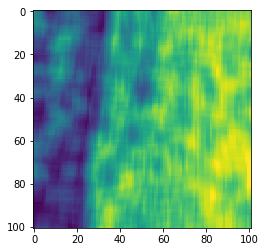

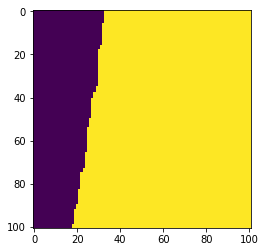

In [188]:
plt.imshow(Xs[3])
plt.show()
plt.imshow(Xs[-1])
plt.show()

(1020100, 30)

In [36]:
# cnt

In [527]:
xgb.DMatrix(train_x)

In [534]:
x_tr = train_x
x_te = train_x
y_te = train_y
y_tr = train_y

In [535]:
train_y

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
5        0.0
6        0.0
7        0.0
8        0.0
9        0.0
10       0.0
11       0.0
12       0.0
13       0.0
14       0.0
15       0.0
16       0.0
17       0.0
18       0.0
19       0.0
20       0.0
21       0.0
22       0.0
23       0.0
24       0.0
25       0.0
26       0.0
27       0.0
28       0.0
29       0.0
        ... 
10171    1.0
10172    1.0
10173    1.0
10174    1.0
10175    1.0
10176    1.0
10177    1.0
10178    1.0
10179    1.0
10180    1.0
10181    1.0
10182    1.0
10183    1.0
10184    1.0
10185    1.0
10186    1.0
10187    1.0
10188    1.0
10189    1.0
10190    1.0
10191    1.0
10192    1.0
10193    1.0
10194    1.0
10195    1.0
10196    1.0
10197    1.0
10198    1.0
10199    1.0
10200    1.0
Name: y, Length: 1020100, dtype: float64

In [240]:
train_x

,0
0,1.000000
1,1.000000
2,1.000000
3,1.000000
4,1.000000
5,1.000000
6,1.000000
7,1.000000
8,1.000000
9,1.000000


In [573]:
# batch_size = 10000
# iterations = 200
# model = None
# for i in range(iterations):
#     for start in range(0, len(x_tr), batch_size):
#         model = xgb.train({
#             'learning_rate': 0.007,
#             'update':'refresh',
#             'process_type': 'update',
#             'refresh_leaf': True,
#             'n_estimators':300,
#             #'reg_lambda': 3,  # L2
#             'reg_alpha': 3,  # L1
#             'silent': False,
#         },
#             dtrain=xgb.DMatrix(x_tr[start:start+batch_size], 
#                                y_tr[start:start+batch_size]),
#             xgb_model=model)

# #             dtrain=xgb.DMatrix(x_tr[start:start+batch_size], y_tr[start:start+batch_size]), xgb_model=model)
        
#         y_pr = model.predict(xgb.DMatrix(x_te))
#         #print('    MSE itr@{}: {}'.format(int(start/batch_size), sklearn.metrics.mean_squared_error(y_te, y_pr)))
#     print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(y_te, y_pr)))

# y_pr = model.predict(xgb.DMatrix(x_te))
# print('MSE at the end: {}'.format(sklearn.metrics.mean_squared_error(y_te, y_pr)))

In [208]:
# train_X = cnt.drop(['y'], axis=1)
# train_y = cnt['y']

In [209]:
# import xgboost as xgb

In [ ]:
# TODO PROVIDE BATCH LEARNING

In [575]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

In [ ]:
# TOO HEAVY
model = xgb.XGBClassifier(silent=False, n_estimators=600, n_jobs=-1, max_depth=5)

subsample = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 1.0]
param_grid = dict(subsample=subsample)
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=7)
grid_search = GridSearchCV(model, param_grid, scoring="neg_log_loss", n_jobs=-1, cv=kfold)
grid_result = grid_search.fit(train_x, train_y)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
# plot
pyplot.errorbar(subsample, means, yerr=stds)
pyplot.title("XGBoost subsample vs Log Loss")
pyplot.xlabel('subsample')
pyplot.ylabel('Log Loss')
pyplot.savefig('subsample.png')

In [189]:
gbm = xgb.XGBClassifier(silent=False, n_estimators=300, n_jobs=-1, max_depth=3)
gbm

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=300,
       n_jobs=-1, nthread=None, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=False, subsample=1)

In [190]:
# gbm = xgb.XGBClassifier(max_depth=3, n_estimators=300, learning_rate=0.05).fit(train_X, train_y)
gbm = gbm.fit(train_x, train_y)
gbm
# predictions = gbm.predict(test_X)

[11:05:04] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:05:15] /work

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=300,
       n_jobs=-1, nthread=None, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=False, subsample=1)

In [197]:
predictions = gbm.predict(train_x)
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(train_y, predictions)))
print('MSE itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(train_y, predictions)))

MSE itr@99: 0.08737182629154004
MSE itr@99: 0.9126281737084599


[0.0028626  0.0023855  0.00572519 0.0019084  0.0004771  0.0009542
 0.         0.0028626  0.0004771  0.         0.         0.
 0.         0.         0.0019084  0.         0.         0.00954198
 0.         0.0028626  0.00906489 0.0023855  0.0014313  0.
 0.00572519 0.0009542  0.00333969 0.0004771  0.01001908 0.01097328
 0.0014313  0.01001908 0.01097328 0.0009542  0.00715649 0.00477099
 0.00477099 0.08301527 0.00715649 0.         0.         0.
 0.         0.01240458 0.05343511 0.02242366 0.03244275 0.03435114
 0.02051527 0.01622137 0.02671756 0.04246183 0.04627863 0.02719466
 0.04007633 0.02528626 0.03625954 0.         0.03816794 0.00954198
 0.01860687 0.04818702 0.00333969 0.03959924 0.02337786 0.03339695
 0.00763359 0.0014313  0.         0.         0.         0.
 0.00381679 0.01335878 0.01908397 0.01908397 0.00906489 0.00667939
 0.0028626  0.00524809 0.01145038 0.01049618 0.01049618 0.01335878
 0.00429389 0.00477099 0.        ]


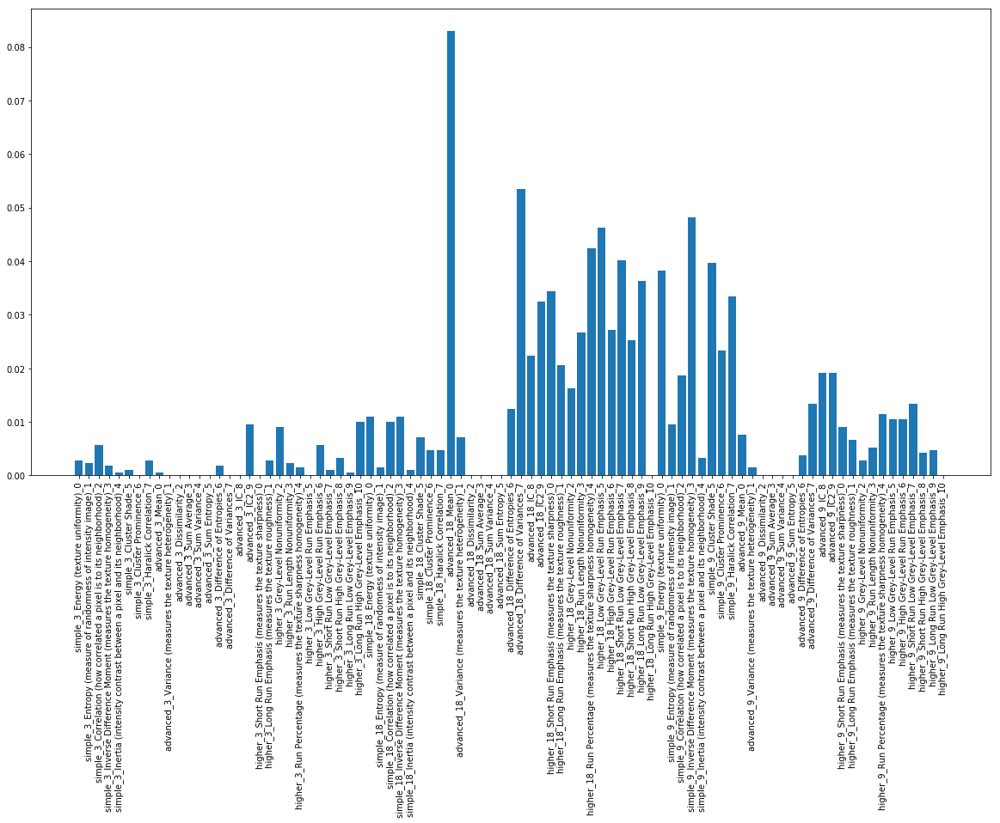

In [228]:
print(gbm.feature_importances_)
# plot
plt.figure(figsize=(20,10) )
plt.bar(range(len(gbm.feature_importances_)), gbm.feature_importances_)
plt.xticks(np.arange(len(feature_names)), feature_names, rotation=90)
plt.show()

In [200]:
test_pred = gbm.predict(test_x)
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(test_y, test_pred)))
print('MSE itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(test_y, test_pred)))

MSE itr@99: 0.18098715812175276
MSE itr@99: 0.8190128418782472


In [199]:
predictions.shape

(1020100,)

In [231]:
# print()
# # plot
# plt.figure(figsize=(20,10) )
# plt.bar(range(len(gbm.feature_importances_)), gbm.feature_importances_)
# plt.xticks(np.arange(len(feature_names)), feature_names, rotation=90)
# plt.show()
gbm.feature_importances_ > 0.01

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False,  True,  True, False, False, False,
       False,  True, False, False, False, False, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True, False,  True,  True, False,
        True,  True,  True, False, False, False, False, False, False,
       False,  True,  True,  True, False, False, False, False,  True,
        True,  True,  True, False, False, False])

In [238]:
combined = [
    features_to_df( [xf[f_i] for xf in x_features_files], y_files[f_i] )
    for f_i in tqdm( range(0,300) )
]
cnt = pd.concat(combined, axis=0)
cnt.shape
train_x = cnt.drop(['y'], axis=1)
train_y = cnt['y']









  0%|          | 0/300 [00:00<?, ?it/s]

['output/har_out_simple_3/bc3156b1e4_simple.tiff', 'output/har_out_advanced_3/bc3156b1e4_advanced.tiff', 'output/har_out_higher_3/bc3156b1e4_higher.tiff', 'output/har_out_simple_18/bc3156b1e4_simple.tiff', 'output/har_out_advanced_18/bc3156b1e4_advanced.tiff', 'output/har_out_higher_18/bc3156b1e4_higher.tiff', 'output/har_out_simple_9/bc3156b1e4_simple.tiff', 'output/har_out_advanced_9/bc3156b1e4_advanced.tiff', 'output/har_out_higher_9/bc3156b1e4_higher.tiff']
../data/train/masks/bc3156b1e4.png










  0%|          | 1/300 [00:00<02:09,  2.31it/s]

['output/har_out_simple_3/296de39be2_simple.tiff', 'output/har_out_advanced_3/296de39be2_advanced.tiff', 'output/har_out_higher_3/296de39be2_higher.tiff', 'output/har_out_simple_18/296de39be2_simple.tiff', 'output/har_out_advanced_18/296de39be2_advanced.tiff', 'output/har_out_higher_18/296de39be2_higher.tiff', 'output/har_out_simple_9/296de39be2_simple.tiff', 'output/har_out_advanced_9/296de39be2_advanced.tiff', 'output/har_out_higher_9/296de39be2_higher.tiff']
../data/train/masks/296de39be2.png










  1%|          | 2/300 [00:00<02:05,  2.38it/s]

['output/har_out_simple_3/83bb4578eb_simple.tiff', 'output/har_out_advanced_3/83bb4578eb_advanced.tiff', 'output/har_out_higher_3/83bb4578eb_higher.tiff', 'output/har_out_simple_18/83bb4578eb_simple.tiff', 'output/har_out_advanced_18/83bb4578eb_advanced.tiff', 'output/har_out_higher_18/83bb4578eb_higher.tiff', 'output/har_out_simple_9/83bb4578eb_simple.tiff', 'output/har_out_advanced_9/83bb4578eb_advanced.tiff', 'output/har_out_higher_9/83bb4578eb_higher.tiff']
../data/train/masks/83bb4578eb.png










  1%|          | 3/300 [00:01<02:07,  2.34it/s]

['output/har_out_simple_3/1b9865501f_simple.tiff', 'output/har_out_advanced_3/1b9865501f_advanced.tiff', 'output/har_out_higher_3/1b9865501f_higher.tiff', 'output/har_out_simple_18/1b9865501f_simple.tiff', 'output/har_out_advanced_18/1b9865501f_advanced.tiff', 'output/har_out_higher_18/1b9865501f_higher.tiff', 'output/har_out_simple_9/1b9865501f_simple.tiff', 'output/har_out_advanced_9/1b9865501f_advanced.tiff', 'output/har_out_higher_9/1b9865501f_higher.tiff']
../data/train/masks/1b9865501f.png










  1%|▏         | 4/300 [00:01<02:06,  2.34it/s]

['output/har_out_simple_3/306e6e7743_simple.tiff', 'output/har_out_advanced_3/306e6e7743_advanced.tiff', 'output/har_out_higher_3/306e6e7743_higher.tiff', 'output/har_out_simple_18/306e6e7743_simple.tiff', 'output/har_out_advanced_18/306e6e7743_advanced.tiff', 'output/har_out_higher_18/306e6e7743_higher.tiff', 'output/har_out_simple_9/306e6e7743_simple.tiff', 'output/har_out_advanced_9/306e6e7743_advanced.tiff', 'output/har_out_higher_9/306e6e7743_higher.tiff']
../data/train/masks/306e6e7743.png










  2%|▏         | 5/300 [00:02<02:05,  2.35it/s]

['output/har_out_simple_3/ba045610d1_simple.tiff', 'output/har_out_advanced_3/ba045610d1_advanced.tiff', 'output/har_out_higher_3/ba045610d1_higher.tiff', 'output/har_out_simple_18/ba045610d1_simple.tiff', 'output/har_out_advanced_18/ba045610d1_advanced.tiff', 'output/har_out_higher_18/ba045610d1_higher.tiff', 'output/har_out_simple_9/ba045610d1_simple.tiff', 'output/har_out_advanced_9/ba045610d1_advanced.tiff', 'output/har_out_higher_9/ba045610d1_higher.tiff']
../data/train/masks/ba045610d1.png










  2%|▏         | 6/300 [00:02<02:00,  2.44it/s]

['output/har_out_simple_3/a24080b4a0_simple.tiff', 'output/har_out_advanced_3/a24080b4a0_advanced.tiff', 'output/har_out_higher_3/a24080b4a0_higher.tiff', 'output/har_out_simple_18/a24080b4a0_simple.tiff', 'output/har_out_advanced_18/a24080b4a0_advanced.tiff', 'output/har_out_higher_18/a24080b4a0_higher.tiff', 'output/har_out_simple_9/a24080b4a0_simple.tiff', 'output/har_out_advanced_9/a24080b4a0_advanced.tiff', 'output/har_out_higher_9/a24080b4a0_higher.tiff']
../data/train/masks/a24080b4a0.png










  2%|▏         | 7/300 [00:02<01:57,  2.50it/s]

['output/har_out_simple_3/b45f9383e9_simple.tiff', 'output/har_out_advanced_3/b45f9383e9_advanced.tiff', 'output/har_out_higher_3/b45f9383e9_higher.tiff', 'output/har_out_simple_18/b45f9383e9_simple.tiff', 'output/har_out_advanced_18/b45f9383e9_advanced.tiff', 'output/har_out_higher_18/b45f9383e9_higher.tiff', 'output/har_out_simple_9/b45f9383e9_simple.tiff', 'output/har_out_advanced_9/b45f9383e9_advanced.tiff', 'output/har_out_higher_9/b45f9383e9_higher.tiff']
../data/train/masks/b45f9383e9.png










  3%|▎         | 8/300 [00:03<01:59,  2.44it/s]

['output/har_out_simple_3/60bbd166a4_simple.tiff', 'output/har_out_advanced_3/60bbd166a4_advanced.tiff', 'output/har_out_higher_3/60bbd166a4_higher.tiff', 'output/har_out_simple_18/60bbd166a4_simple.tiff', 'output/har_out_advanced_18/60bbd166a4_advanced.tiff', 'output/har_out_higher_18/60bbd166a4_higher.tiff', 'output/har_out_simple_9/60bbd166a4_simple.tiff', 'output/har_out_advanced_9/60bbd166a4_advanced.tiff', 'output/har_out_higher_9/60bbd166a4_higher.tiff']
../data/train/masks/60bbd166a4.png










  3%|▎         | 9/300 [00:03<01:58,  2.45it/s]

['output/har_out_simple_3/6313ab72dc_simple.tiff', 'output/har_out_advanced_3/6313ab72dc_advanced.tiff', 'output/har_out_higher_3/6313ab72dc_higher.tiff', 'output/har_out_simple_18/6313ab72dc_simple.tiff', 'output/har_out_advanced_18/6313ab72dc_advanced.tiff', 'output/har_out_higher_18/6313ab72dc_higher.tiff', 'output/har_out_simple_9/6313ab72dc_simple.tiff', 'output/har_out_advanced_9/6313ab72dc_advanced.tiff', 'output/har_out_higher_9/6313ab72dc_higher.tiff']
../data/train/masks/6313ab72dc.png










  3%|▎         | 10/300 [00:04<02:01,  2.38it/s]

['output/har_out_simple_3/be18a24c49_simple.tiff', 'output/har_out_advanced_3/be18a24c49_advanced.tiff', 'output/har_out_higher_3/be18a24c49_higher.tiff', 'output/har_out_simple_18/be18a24c49_simple.tiff', 'output/har_out_advanced_18/be18a24c49_advanced.tiff', 'output/har_out_higher_18/be18a24c49_higher.tiff', 'output/har_out_simple_9/be18a24c49_simple.tiff', 'output/har_out_advanced_9/be18a24c49_advanced.tiff', 'output/har_out_higher_9/be18a24c49_higher.tiff']
../data/train/masks/be18a24c49.png










  4%|▎         | 11/300 [00:04<01:57,  2.47it/s]

['output/har_out_simple_3/1b71d67404_simple.tiff', 'output/har_out_advanced_3/1b71d67404_advanced.tiff', 'output/har_out_higher_3/1b71d67404_higher.tiff', 'output/har_out_simple_18/1b71d67404_simple.tiff', 'output/har_out_advanced_18/1b71d67404_advanced.tiff', 'output/har_out_higher_18/1b71d67404_higher.tiff', 'output/har_out_simple_9/1b71d67404_simple.tiff', 'output/har_out_advanced_9/1b71d67404_advanced.tiff', 'output/har_out_higher_9/1b71d67404_higher.tiff']
../data/train/masks/1b71d67404.png










  4%|▍         | 12/300 [00:04<01:56,  2.47it/s]

['output/har_out_simple_3/c023a62b96_simple.tiff', 'output/har_out_advanced_3/c023a62b96_advanced.tiff', 'output/har_out_higher_3/c023a62b96_higher.tiff', 'output/har_out_simple_18/c023a62b96_simple.tiff', 'output/har_out_advanced_18/c023a62b96_advanced.tiff', 'output/har_out_higher_18/c023a62b96_higher.tiff', 'output/har_out_simple_9/c023a62b96_simple.tiff', 'output/har_out_advanced_9/c023a62b96_advanced.tiff', 'output/har_out_higher_9/c023a62b96_higher.tiff']
../data/train/masks/c023a62b96.png










  4%|▍         | 13/300 [00:05<01:51,  2.56it/s]

['output/har_out_simple_3/590e6bdbef_simple.tiff', 'output/har_out_advanced_3/590e6bdbef_advanced.tiff', 'output/har_out_higher_3/590e6bdbef_higher.tiff', 'output/har_out_simple_18/590e6bdbef_simple.tiff', 'output/har_out_advanced_18/590e6bdbef_advanced.tiff', 'output/har_out_higher_18/590e6bdbef_higher.tiff', 'output/har_out_simple_9/590e6bdbef_simple.tiff', 'output/har_out_advanced_9/590e6bdbef_advanced.tiff', 'output/har_out_higher_9/590e6bdbef_higher.tiff']
../data/train/masks/590e6bdbef.png










  5%|▍         | 14/300 [00:05<01:48,  2.63it/s]

['output/har_out_simple_3/7e78a47cee_simple.tiff', 'output/har_out_advanced_3/7e78a47cee_advanced.tiff', 'output/har_out_higher_3/7e78a47cee_higher.tiff', 'output/har_out_simple_18/7e78a47cee_simple.tiff', 'output/har_out_advanced_18/7e78a47cee_advanced.tiff', 'output/har_out_higher_18/7e78a47cee_higher.tiff', 'output/har_out_simple_9/7e78a47cee_simple.tiff', 'output/har_out_advanced_9/7e78a47cee_advanced.tiff', 'output/har_out_higher_9/7e78a47cee_higher.tiff']
../data/train/masks/7e78a47cee.png










  5%|▌         | 15/300 [00:06<01:49,  2.59it/s]

['output/har_out_simple_3/849ccdf3af_simple.tiff', 'output/har_out_advanced_3/849ccdf3af_advanced.tiff', 'output/har_out_higher_3/849ccdf3af_higher.tiff', 'output/har_out_simple_18/849ccdf3af_simple.tiff', 'output/har_out_advanced_18/849ccdf3af_advanced.tiff', 'output/har_out_higher_18/849ccdf3af_higher.tiff', 'output/har_out_simple_9/849ccdf3af_simple.tiff', 'output/har_out_advanced_9/849ccdf3af_advanced.tiff', 'output/har_out_higher_9/849ccdf3af_higher.tiff']
../data/train/masks/849ccdf3af.png










  5%|▌         | 16/300 [00:06<01:48,  2.61it/s]

['output/har_out_simple_3/5d6126f459_simple.tiff', 'output/har_out_advanced_3/5d6126f459_advanced.tiff', 'output/har_out_higher_3/5d6126f459_higher.tiff', 'output/har_out_simple_18/5d6126f459_simple.tiff', 'output/har_out_advanced_18/5d6126f459_advanced.tiff', 'output/har_out_higher_18/5d6126f459_higher.tiff', 'output/har_out_simple_9/5d6126f459_simple.tiff', 'output/har_out_advanced_9/5d6126f459_advanced.tiff', 'output/har_out_higher_9/5d6126f459_higher.tiff']
../data/train/masks/5d6126f459.png










  6%|▌         | 17/300 [00:06<01:49,  2.58it/s]

['output/har_out_simple_3/3320eb35e4_simple.tiff', 'output/har_out_advanced_3/3320eb35e4_advanced.tiff', 'output/har_out_higher_3/3320eb35e4_higher.tiff', 'output/har_out_simple_18/3320eb35e4_simple.tiff', 'output/har_out_advanced_18/3320eb35e4_advanced.tiff', 'output/har_out_higher_18/3320eb35e4_higher.tiff', 'output/har_out_simple_9/3320eb35e4_simple.tiff', 'output/har_out_advanced_9/3320eb35e4_advanced.tiff', 'output/har_out_higher_9/3320eb35e4_higher.tiff']
../data/train/masks/3320eb35e4.png










  6%|▌         | 18/300 [00:07<01:48,  2.60it/s]

['output/har_out_simple_3/501c68e571_simple.tiff', 'output/har_out_advanced_3/501c68e571_advanced.tiff', 'output/har_out_higher_3/501c68e571_higher.tiff', 'output/har_out_simple_18/501c68e571_simple.tiff', 'output/har_out_advanced_18/501c68e571_advanced.tiff', 'output/har_out_higher_18/501c68e571_higher.tiff', 'output/har_out_simple_9/501c68e571_simple.tiff', 'output/har_out_advanced_9/501c68e571_advanced.tiff', 'output/har_out_higher_9/501c68e571_higher.tiff']
../data/train/masks/501c68e571.png










  6%|▋         | 19/300 [00:07<01:51,  2.52it/s]

['output/har_out_simple_3/a32a4a2256_simple.tiff', 'output/har_out_advanced_3/a32a4a2256_advanced.tiff', 'output/har_out_higher_3/a32a4a2256_higher.tiff', 'output/har_out_simple_18/a32a4a2256_simple.tiff', 'output/har_out_advanced_18/a32a4a2256_advanced.tiff', 'output/har_out_higher_18/a32a4a2256_higher.tiff', 'output/har_out_simple_9/a32a4a2256_simple.tiff', 'output/har_out_advanced_9/a32a4a2256_advanced.tiff', 'output/har_out_higher_9/a32a4a2256_higher.tiff']
../data/train/masks/a32a4a2256.png










  7%|▋         | 20/300 [00:07<01:48,  2.59it/s]

['output/har_out_simple_3/3507f73405_simple.tiff', 'output/har_out_advanced_3/3507f73405_advanced.tiff', 'output/har_out_higher_3/3507f73405_higher.tiff', 'output/har_out_simple_18/3507f73405_simple.tiff', 'output/har_out_advanced_18/3507f73405_advanced.tiff', 'output/har_out_higher_18/3507f73405_higher.tiff', 'output/har_out_simple_9/3507f73405_simple.tiff', 'output/har_out_advanced_9/3507f73405_advanced.tiff', 'output/har_out_higher_9/3507f73405_higher.tiff']
../data/train/masks/3507f73405.png










  7%|▋         | 21/300 [00:08<01:48,  2.58it/s]

['output/har_out_simple_3/7268aedee7_simple.tiff', 'output/har_out_advanced_3/7268aedee7_advanced.tiff', 'output/har_out_higher_3/7268aedee7_higher.tiff', 'output/har_out_simple_18/7268aedee7_simple.tiff', 'output/har_out_advanced_18/7268aedee7_advanced.tiff', 'output/har_out_higher_18/7268aedee7_higher.tiff', 'output/har_out_simple_9/7268aedee7_simple.tiff', 'output/har_out_advanced_9/7268aedee7_advanced.tiff', 'output/har_out_higher_9/7268aedee7_higher.tiff']
../data/train/masks/7268aedee7.png










  7%|▋         | 22/300 [00:08<01:51,  2.48it/s]

['output/har_out_simple_3/9e966d733c_simple.tiff', 'output/har_out_advanced_3/9e966d733c_advanced.tiff', 'output/har_out_higher_3/9e966d733c_higher.tiff', 'output/har_out_simple_18/9e966d733c_simple.tiff', 'output/har_out_advanced_18/9e966d733c_advanced.tiff', 'output/har_out_higher_18/9e966d733c_higher.tiff', 'output/har_out_simple_9/9e966d733c_simple.tiff', 'output/har_out_advanced_9/9e966d733c_advanced.tiff', 'output/har_out_higher_9/9e966d733c_higher.tiff']
../data/train/masks/9e966d733c.png










  8%|▊         | 23/300 [00:09<01:47,  2.59it/s]

['output/har_out_simple_3/380ff30e30_simple.tiff', 'output/har_out_advanced_3/380ff30e30_advanced.tiff', 'output/har_out_higher_3/380ff30e30_higher.tiff', 'output/har_out_simple_18/380ff30e30_simple.tiff', 'output/har_out_advanced_18/380ff30e30_advanced.tiff', 'output/har_out_higher_18/380ff30e30_higher.tiff', 'output/har_out_simple_9/380ff30e30_simple.tiff', 'output/har_out_advanced_9/380ff30e30_advanced.tiff', 'output/har_out_higher_9/380ff30e30_higher.tiff']
../data/train/masks/380ff30e30.png










  8%|▊         | 24/300 [00:09<01:47,  2.57it/s]

['output/har_out_simple_3/03a9a9f615_simple.tiff', 'output/har_out_advanced_3/03a9a9f615_advanced.tiff', 'output/har_out_higher_3/03a9a9f615_higher.tiff', 'output/har_out_simple_18/03a9a9f615_simple.tiff', 'output/har_out_advanced_18/03a9a9f615_advanced.tiff', 'output/har_out_higher_18/03a9a9f615_higher.tiff', 'output/har_out_simple_9/03a9a9f615_simple.tiff', 'output/har_out_advanced_9/03a9a9f615_advanced.tiff', 'output/har_out_higher_9/03a9a9f615_higher.tiff']
../data/train/masks/03a9a9f615.png










  8%|▊         | 25/300 [00:09<01:43,  2.66it/s]

['output/har_out_simple_3/9539d280a6_simple.tiff', 'output/har_out_advanced_3/9539d280a6_advanced.tiff', 'output/har_out_higher_3/9539d280a6_higher.tiff', 'output/har_out_simple_18/9539d280a6_simple.tiff', 'output/har_out_advanced_18/9539d280a6_advanced.tiff', 'output/har_out_higher_18/9539d280a6_higher.tiff', 'output/har_out_simple_9/9539d280a6_simple.tiff', 'output/har_out_advanced_9/9539d280a6_advanced.tiff', 'output/har_out_higher_9/9539d280a6_higher.tiff']
../data/train/masks/9539d280a6.png










  9%|▊         | 26/300 [00:10<01:42,  2.68it/s]

['output/har_out_simple_3/fbc9a1149e_simple.tiff', 'output/har_out_advanced_3/fbc9a1149e_advanced.tiff', 'output/har_out_higher_3/fbc9a1149e_higher.tiff', 'output/har_out_simple_18/fbc9a1149e_simple.tiff', 'output/har_out_advanced_18/fbc9a1149e_advanced.tiff', 'output/har_out_higher_18/fbc9a1149e_higher.tiff', 'output/har_out_simple_9/fbc9a1149e_simple.tiff', 'output/har_out_advanced_9/fbc9a1149e_advanced.tiff', 'output/har_out_higher_9/fbc9a1149e_higher.tiff']
../data/train/masks/fbc9a1149e.png










  9%|▉         | 27/300 [00:10<01:46,  2.57it/s]

['output/har_out_simple_3/1d9bc2591e_simple.tiff', 'output/har_out_advanced_3/1d9bc2591e_advanced.tiff', 'output/har_out_higher_3/1d9bc2591e_higher.tiff', 'output/har_out_simple_18/1d9bc2591e_simple.tiff', 'output/har_out_advanced_18/1d9bc2591e_advanced.tiff', 'output/har_out_higher_18/1d9bc2591e_higher.tiff', 'output/har_out_simple_9/1d9bc2591e_simple.tiff', 'output/har_out_advanced_9/1d9bc2591e_advanced.tiff', 'output/har_out_higher_9/1d9bc2591e_higher.tiff']
../data/train/masks/1d9bc2591e.png










  9%|▉         | 28/300 [00:11<01:43,  2.63it/s]

['output/har_out_simple_3/cb2698f715_simple.tiff', 'output/har_out_advanced_3/cb2698f715_advanced.tiff', 'output/har_out_higher_3/cb2698f715_higher.tiff', 'output/har_out_simple_18/cb2698f715_simple.tiff', 'output/har_out_advanced_18/cb2698f715_advanced.tiff', 'output/har_out_higher_18/cb2698f715_higher.tiff', 'output/har_out_simple_9/cb2698f715_simple.tiff', 'output/har_out_advanced_9/cb2698f715_advanced.tiff', 'output/har_out_higher_9/cb2698f715_higher.tiff']
../data/train/masks/cb2698f715.png










 10%|▉         | 29/300 [00:11<01:45,  2.56it/s]

['output/har_out_simple_3/ab5fe4fea8_simple.tiff', 'output/har_out_advanced_3/ab5fe4fea8_advanced.tiff', 'output/har_out_higher_3/ab5fe4fea8_higher.tiff', 'output/har_out_simple_18/ab5fe4fea8_simple.tiff', 'output/har_out_advanced_18/ab5fe4fea8_advanced.tiff', 'output/har_out_higher_18/ab5fe4fea8_higher.tiff', 'output/har_out_simple_9/ab5fe4fea8_simple.tiff', 'output/har_out_advanced_9/ab5fe4fea8_advanced.tiff', 'output/har_out_higher_9/ab5fe4fea8_higher.tiff']
../data/train/masks/ab5fe4fea8.png










 10%|█         | 30/300 [00:11<01:45,  2.56it/s]

['output/har_out_simple_3/be2dd1db16_simple.tiff', 'output/har_out_advanced_3/be2dd1db16_advanced.tiff', 'output/har_out_higher_3/be2dd1db16_higher.tiff', 'output/har_out_simple_18/be2dd1db16_simple.tiff', 'output/har_out_advanced_18/be2dd1db16_advanced.tiff', 'output/har_out_higher_18/be2dd1db16_higher.tiff', 'output/har_out_simple_9/be2dd1db16_simple.tiff', 'output/har_out_advanced_9/be2dd1db16_advanced.tiff', 'output/har_out_higher_9/be2dd1db16_higher.tiff']
../data/train/masks/be2dd1db16.png










 10%|█         | 31/300 [00:12<01:47,  2.50it/s]

['output/har_out_simple_3/3edc3edf92_simple.tiff', 'output/har_out_advanced_3/3edc3edf92_advanced.tiff', 'output/har_out_higher_3/3edc3edf92_higher.tiff', 'output/har_out_simple_18/3edc3edf92_simple.tiff', 'output/har_out_advanced_18/3edc3edf92_advanced.tiff', 'output/har_out_higher_18/3edc3edf92_higher.tiff', 'output/har_out_simple_9/3edc3edf92_simple.tiff', 'output/har_out_advanced_9/3edc3edf92_advanced.tiff', 'output/har_out_higher_9/3edc3edf92_higher.tiff']
../data/train/masks/3edc3edf92.png










 11%|█         | 32/300 [00:12<01:44,  2.57it/s]

['output/har_out_simple_3/d0cba16846_simple.tiff', 'output/har_out_advanced_3/d0cba16846_advanced.tiff', 'output/har_out_higher_3/d0cba16846_higher.tiff', 'output/har_out_simple_18/d0cba16846_simple.tiff', 'output/har_out_advanced_18/d0cba16846_advanced.tiff', 'output/har_out_higher_18/d0cba16846_higher.tiff', 'output/har_out_simple_9/d0cba16846_simple.tiff', 'output/har_out_advanced_9/d0cba16846_advanced.tiff', 'output/har_out_higher_9/d0cba16846_higher.tiff']
../data/train/masks/d0cba16846.png










 11%|█         | 33/300 [00:12<01:40,  2.65it/s]

['output/har_out_simple_3/36f9ab3ee0_simple.tiff', 'output/har_out_advanced_3/36f9ab3ee0_advanced.tiff', 'output/har_out_higher_3/36f9ab3ee0_higher.tiff', 'output/har_out_simple_18/36f9ab3ee0_simple.tiff', 'output/har_out_advanced_18/36f9ab3ee0_advanced.tiff', 'output/har_out_higher_18/36f9ab3ee0_higher.tiff', 'output/har_out_simple_9/36f9ab3ee0_simple.tiff', 'output/har_out_advanced_9/36f9ab3ee0_advanced.tiff', 'output/har_out_higher_9/36f9ab3ee0_higher.tiff']
../data/train/masks/36f9ab3ee0.png










 11%|█▏        | 34/300 [00:13<01:45,  2.52it/s]

['output/har_out_simple_3/363a171d90_simple.tiff', 'output/har_out_advanced_3/363a171d90_advanced.tiff', 'output/har_out_higher_3/363a171d90_higher.tiff', 'output/har_out_simple_18/363a171d90_simple.tiff', 'output/har_out_advanced_18/363a171d90_advanced.tiff', 'output/har_out_higher_18/363a171d90_higher.tiff', 'output/har_out_simple_9/363a171d90_simple.tiff', 'output/har_out_advanced_9/363a171d90_advanced.tiff', 'output/har_out_higher_9/363a171d90_higher.tiff']
../data/train/masks/363a171d90.png










 12%|█▏        | 35/300 [00:13<01:44,  2.53it/s]

['output/har_out_simple_3/b24d3673e1_simple.tiff', 'output/har_out_advanced_3/b24d3673e1_advanced.tiff', 'output/har_out_higher_3/b24d3673e1_higher.tiff', 'output/har_out_simple_18/b24d3673e1_simple.tiff', 'output/har_out_advanced_18/b24d3673e1_advanced.tiff', 'output/har_out_higher_18/b24d3673e1_higher.tiff', 'output/har_out_simple_9/b24d3673e1_simple.tiff', 'output/har_out_advanced_9/b24d3673e1_advanced.tiff', 'output/har_out_higher_9/b24d3673e1_higher.tiff']
../data/train/masks/b24d3673e1.png










 12%|█▏        | 36/300 [00:14<01:45,  2.49it/s]

['output/har_out_simple_3/848c9d1a6a_simple.tiff', 'output/har_out_advanced_3/848c9d1a6a_advanced.tiff', 'output/har_out_higher_3/848c9d1a6a_higher.tiff', 'output/har_out_simple_18/848c9d1a6a_simple.tiff', 'output/har_out_advanced_18/848c9d1a6a_advanced.tiff', 'output/har_out_higher_18/848c9d1a6a_higher.tiff', 'output/har_out_simple_9/848c9d1a6a_simple.tiff', 'output/har_out_advanced_9/848c9d1a6a_advanced.tiff', 'output/har_out_higher_9/848c9d1a6a_higher.tiff']
../data/train/masks/848c9d1a6a.png










 12%|█▏        | 37/300 [00:14<01:42,  2.57it/s]

['output/har_out_simple_3/d7e93ff9c2_simple.tiff', 'output/har_out_advanced_3/d7e93ff9c2_advanced.tiff', 'output/har_out_higher_3/d7e93ff9c2_higher.tiff', 'output/har_out_simple_18/d7e93ff9c2_simple.tiff', 'output/har_out_advanced_18/d7e93ff9c2_advanced.tiff', 'output/har_out_higher_18/d7e93ff9c2_higher.tiff', 'output/har_out_simple_9/d7e93ff9c2_simple.tiff', 'output/har_out_advanced_9/d7e93ff9c2_advanced.tiff', 'output/har_out_higher_9/d7e93ff9c2_higher.tiff']
../data/train/masks/d7e93ff9c2.png










 13%|█▎        | 38/300 [00:14<01:42,  2.55it/s]

['output/har_out_simple_3/b9fe322e38_simple.tiff', 'output/har_out_advanced_3/b9fe322e38_advanced.tiff', 'output/har_out_higher_3/b9fe322e38_higher.tiff', 'output/har_out_simple_18/b9fe322e38_simple.tiff', 'output/har_out_advanced_18/b9fe322e38_advanced.tiff', 'output/har_out_higher_18/b9fe322e38_higher.tiff', 'output/har_out_simple_9/b9fe322e38_simple.tiff', 'output/har_out_advanced_9/b9fe322e38_advanced.tiff', 'output/har_out_higher_9/b9fe322e38_higher.tiff']
../data/train/masks/b9fe322e38.png










 13%|█▎        | 39/300 [00:15<01:43,  2.53it/s]

['output/har_out_simple_3/9fe707f837_simple.tiff', 'output/har_out_advanced_3/9fe707f837_advanced.tiff', 'output/har_out_higher_3/9fe707f837_higher.tiff', 'output/har_out_simple_18/9fe707f837_simple.tiff', 'output/har_out_advanced_18/9fe707f837_advanced.tiff', 'output/har_out_higher_18/9fe707f837_higher.tiff', 'output/har_out_simple_9/9fe707f837_simple.tiff', 'output/har_out_advanced_9/9fe707f837_advanced.tiff', 'output/har_out_higher_9/9fe707f837_higher.tiff']
../data/train/masks/9fe707f837.png










 13%|█▎        | 40/300 [00:15<01:39,  2.60it/s]

['output/har_out_simple_3/71c0fd5516_simple.tiff', 'output/har_out_advanced_3/71c0fd5516_advanced.tiff', 'output/har_out_higher_3/71c0fd5516_higher.tiff', 'output/har_out_simple_18/71c0fd5516_simple.tiff', 'output/har_out_advanced_18/71c0fd5516_advanced.tiff', 'output/har_out_higher_18/71c0fd5516_higher.tiff', 'output/har_out_simple_9/71c0fd5516_simple.tiff', 'output/har_out_advanced_9/71c0fd5516_advanced.tiff', 'output/har_out_higher_9/71c0fd5516_higher.tiff']
../data/train/masks/71c0fd5516.png










 14%|█▎        | 41/300 [00:16<01:44,  2.49it/s]

['output/har_out_simple_3/553733b17b_simple.tiff', 'output/har_out_advanced_3/553733b17b_advanced.tiff', 'output/har_out_higher_3/553733b17b_higher.tiff', 'output/har_out_simple_18/553733b17b_simple.tiff', 'output/har_out_advanced_18/553733b17b_advanced.tiff', 'output/har_out_higher_18/553733b17b_higher.tiff', 'output/har_out_simple_9/553733b17b_simple.tiff', 'output/har_out_advanced_9/553733b17b_advanced.tiff', 'output/har_out_higher_9/553733b17b_higher.tiff']
../data/train/masks/553733b17b.png










 14%|█▍        | 42/300 [00:16<01:39,  2.59it/s]

['output/har_out_simple_3/d27831fef2_simple.tiff', 'output/har_out_advanced_3/d27831fef2_advanced.tiff', 'output/har_out_higher_3/d27831fef2_higher.tiff', 'output/har_out_simple_18/d27831fef2_simple.tiff', 'output/har_out_advanced_18/d27831fef2_advanced.tiff', 'output/har_out_higher_18/d27831fef2_higher.tiff', 'output/har_out_simple_9/d27831fef2_simple.tiff', 'output/har_out_advanced_9/d27831fef2_advanced.tiff', 'output/har_out_higher_9/d27831fef2_higher.tiff']
../data/train/masks/d27831fef2.png










 14%|█▍        | 43/300 [00:16<01:39,  2.60it/s]

['output/har_out_simple_3/24bf79cd1e_simple.tiff', 'output/har_out_advanced_3/24bf79cd1e_advanced.tiff', 'output/har_out_higher_3/24bf79cd1e_higher.tiff', 'output/har_out_simple_18/24bf79cd1e_simple.tiff', 'output/har_out_advanced_18/24bf79cd1e_advanced.tiff', 'output/har_out_higher_18/24bf79cd1e_higher.tiff', 'output/har_out_simple_9/24bf79cd1e_simple.tiff', 'output/har_out_advanced_9/24bf79cd1e_advanced.tiff', 'output/har_out_higher_9/24bf79cd1e_higher.tiff']
../data/train/masks/24bf79cd1e.png










 15%|█▍        | 44/300 [00:17<01:41,  2.51it/s]

['output/har_out_simple_3/9f2e5a8c24_simple.tiff', 'output/har_out_advanced_3/9f2e5a8c24_advanced.tiff', 'output/har_out_higher_3/9f2e5a8c24_higher.tiff', 'output/har_out_simple_18/9f2e5a8c24_simple.tiff', 'output/har_out_advanced_18/9f2e5a8c24_advanced.tiff', 'output/har_out_higher_18/9f2e5a8c24_higher.tiff', 'output/har_out_simple_9/9f2e5a8c24_simple.tiff', 'output/har_out_advanced_9/9f2e5a8c24_advanced.tiff', 'output/har_out_higher_9/9f2e5a8c24_higher.tiff']
../data/train/masks/9f2e5a8c24.png










 15%|█▌        | 45/300 [00:17<01:45,  2.41it/s]

['output/har_out_simple_3/94b3a9ed9c_simple.tiff', 'output/har_out_advanced_3/94b3a9ed9c_advanced.tiff', 'output/har_out_higher_3/94b3a9ed9c_higher.tiff', 'output/har_out_simple_18/94b3a9ed9c_simple.tiff', 'output/har_out_advanced_18/94b3a9ed9c_advanced.tiff', 'output/har_out_higher_18/94b3a9ed9c_higher.tiff', 'output/har_out_simple_9/94b3a9ed9c_simple.tiff', 'output/har_out_advanced_9/94b3a9ed9c_advanced.tiff', 'output/har_out_higher_9/94b3a9ed9c_higher.tiff']
../data/train/masks/94b3a9ed9c.png










 15%|█▌        | 46/300 [00:18<01:48,  2.34it/s]

['output/har_out_simple_3/c26ff00bfd_simple.tiff', 'output/har_out_advanced_3/c26ff00bfd_advanced.tiff', 'output/har_out_higher_3/c26ff00bfd_higher.tiff', 'output/har_out_simple_18/c26ff00bfd_simple.tiff', 'output/har_out_advanced_18/c26ff00bfd_advanced.tiff', 'output/har_out_higher_18/c26ff00bfd_higher.tiff', 'output/har_out_simple_9/c26ff00bfd_simple.tiff', 'output/har_out_advanced_9/c26ff00bfd_advanced.tiff', 'output/har_out_higher_9/c26ff00bfd_higher.tiff']
../data/train/masks/c26ff00bfd.png










 16%|█▌        | 47/300 [00:18<01:46,  2.38it/s]

['output/har_out_simple_3/4c8132dc73_simple.tiff', 'output/har_out_advanced_3/4c8132dc73_advanced.tiff', 'output/har_out_higher_3/4c8132dc73_higher.tiff', 'output/har_out_simple_18/4c8132dc73_simple.tiff', 'output/har_out_advanced_18/4c8132dc73_advanced.tiff', 'output/har_out_higher_18/4c8132dc73_higher.tiff', 'output/har_out_simple_9/4c8132dc73_simple.tiff', 'output/har_out_advanced_9/4c8132dc73_advanced.tiff', 'output/har_out_higher_9/4c8132dc73_higher.tiff']
../data/train/masks/4c8132dc73.png










 16%|█▌        | 48/300 [00:19<01:45,  2.39it/s]

['output/har_out_simple_3/24e98d224a_simple.tiff', 'output/har_out_advanced_3/24e98d224a_advanced.tiff', 'output/har_out_higher_3/24e98d224a_higher.tiff', 'output/har_out_simple_18/24e98d224a_simple.tiff', 'output/har_out_advanced_18/24e98d224a_advanced.tiff', 'output/har_out_higher_18/24e98d224a_higher.tiff', 'output/har_out_simple_9/24e98d224a_simple.tiff', 'output/har_out_advanced_9/24e98d224a_advanced.tiff', 'output/har_out_higher_9/24e98d224a_higher.tiff']
../data/train/masks/24e98d224a.png










 16%|█▋        | 49/300 [00:19<01:44,  2.40it/s]

['output/har_out_simple_3/290e9d9748_simple.tiff', 'output/har_out_advanced_3/290e9d9748_advanced.tiff', 'output/har_out_higher_3/290e9d9748_higher.tiff', 'output/har_out_simple_18/290e9d9748_simple.tiff', 'output/har_out_advanced_18/290e9d9748_advanced.tiff', 'output/har_out_higher_18/290e9d9748_higher.tiff', 'output/har_out_simple_9/290e9d9748_simple.tiff', 'output/har_out_advanced_9/290e9d9748_advanced.tiff', 'output/har_out_higher_9/290e9d9748_higher.tiff']
../data/train/masks/290e9d9748.png










 17%|█▋        | 50/300 [00:19<01:46,  2.35it/s]

['output/har_out_simple_3/7b5d5d40fe_simple.tiff', 'output/har_out_advanced_3/7b5d5d40fe_advanced.tiff', 'output/har_out_higher_3/7b5d5d40fe_higher.tiff', 'output/har_out_simple_18/7b5d5d40fe_simple.tiff', 'output/har_out_advanced_18/7b5d5d40fe_advanced.tiff', 'output/har_out_higher_18/7b5d5d40fe_higher.tiff', 'output/har_out_simple_9/7b5d5d40fe_simple.tiff', 'output/har_out_advanced_9/7b5d5d40fe_advanced.tiff', 'output/har_out_higher_9/7b5d5d40fe_higher.tiff']
../data/train/masks/7b5d5d40fe.png










 17%|█▋        | 51/300 [00:20<01:43,  2.40it/s]

['output/har_out_simple_3/6460ce2df7_simple.tiff', 'output/har_out_advanced_3/6460ce2df7_advanced.tiff', 'output/har_out_higher_3/6460ce2df7_higher.tiff', 'output/har_out_simple_18/6460ce2df7_simple.tiff', 'output/har_out_advanced_18/6460ce2df7_advanced.tiff', 'output/har_out_higher_18/6460ce2df7_higher.tiff', 'output/har_out_simple_9/6460ce2df7_simple.tiff', 'output/har_out_advanced_9/6460ce2df7_advanced.tiff', 'output/har_out_higher_9/6460ce2df7_higher.tiff']
../data/train/masks/6460ce2df7.png










 17%|█▋        | 52/300 [00:20<01:40,  2.46it/s]

['output/har_out_simple_3/fd998a993b_simple.tiff', 'output/har_out_advanced_3/fd998a993b_advanced.tiff', 'output/har_out_higher_3/fd998a993b_higher.tiff', 'output/har_out_simple_18/fd998a993b_simple.tiff', 'output/har_out_advanced_18/fd998a993b_advanced.tiff', 'output/har_out_higher_18/fd998a993b_higher.tiff', 'output/har_out_simple_9/fd998a993b_simple.tiff', 'output/har_out_advanced_9/fd998a993b_advanced.tiff', 'output/har_out_higher_9/fd998a993b_higher.tiff']
../data/train/masks/fd998a993b.png










 18%|█▊        | 53/300 [00:21<01:43,  2.38it/s]

['output/har_out_simple_3/7576015468_simple.tiff', 'output/har_out_advanced_3/7576015468_advanced.tiff', 'output/har_out_higher_3/7576015468_higher.tiff', 'output/har_out_simple_18/7576015468_simple.tiff', 'output/har_out_advanced_18/7576015468_advanced.tiff', 'output/har_out_higher_18/7576015468_higher.tiff', 'output/har_out_simple_9/7576015468_simple.tiff', 'output/har_out_advanced_9/7576015468_advanced.tiff', 'output/har_out_higher_9/7576015468_higher.tiff']
../data/train/masks/7576015468.png










 18%|█▊        | 54/300 [00:21<01:42,  2.40it/s]

['output/har_out_simple_3/393048bc6c_simple.tiff', 'output/har_out_advanced_3/393048bc6c_advanced.tiff', 'output/har_out_higher_3/393048bc6c_higher.tiff', 'output/har_out_simple_18/393048bc6c_simple.tiff', 'output/har_out_advanced_18/393048bc6c_advanced.tiff', 'output/har_out_higher_18/393048bc6c_higher.tiff', 'output/har_out_simple_9/393048bc6c_simple.tiff', 'output/har_out_advanced_9/393048bc6c_advanced.tiff', 'output/har_out_higher_9/393048bc6c_higher.tiff']
../data/train/masks/393048bc6c.png










 18%|█▊        | 55/300 [00:22<01:43,  2.38it/s]

['output/har_out_simple_3/a5299290bb_simple.tiff', 'output/har_out_advanced_3/a5299290bb_advanced.tiff', 'output/har_out_higher_3/a5299290bb_higher.tiff', 'output/har_out_simple_18/a5299290bb_simple.tiff', 'output/har_out_advanced_18/a5299290bb_advanced.tiff', 'output/har_out_higher_18/a5299290bb_higher.tiff', 'output/har_out_simple_9/a5299290bb_simple.tiff', 'output/har_out_advanced_9/a5299290bb_advanced.tiff', 'output/har_out_higher_9/a5299290bb_higher.tiff']
../data/train/masks/a5299290bb.png










 19%|█▊        | 56/300 [00:22<01:43,  2.35it/s]

['output/har_out_simple_3/c8d70d9c3d_simple.tiff', 'output/har_out_advanced_3/c8d70d9c3d_advanced.tiff', 'output/har_out_higher_3/c8d70d9c3d_higher.tiff', 'output/har_out_simple_18/c8d70d9c3d_simple.tiff', 'output/har_out_advanced_18/c8d70d9c3d_advanced.tiff', 'output/har_out_higher_18/c8d70d9c3d_higher.tiff', 'output/har_out_simple_9/c8d70d9c3d_simple.tiff', 'output/har_out_advanced_9/c8d70d9c3d_advanced.tiff', 'output/har_out_higher_9/c8d70d9c3d_higher.tiff']
../data/train/masks/c8d70d9c3d.png










 19%|█▉        | 57/300 [00:22<01:41,  2.40it/s]

['output/har_out_simple_3/ee5c6d6639_simple.tiff', 'output/har_out_advanced_3/ee5c6d6639_advanced.tiff', 'output/har_out_higher_3/ee5c6d6639_higher.tiff', 'output/har_out_simple_18/ee5c6d6639_simple.tiff', 'output/har_out_advanced_18/ee5c6d6639_advanced.tiff', 'output/har_out_higher_18/ee5c6d6639_higher.tiff', 'output/har_out_simple_9/ee5c6d6639_simple.tiff', 'output/har_out_advanced_9/ee5c6d6639_advanced.tiff', 'output/har_out_higher_9/ee5c6d6639_higher.tiff']
../data/train/masks/ee5c6d6639.png










 19%|█▉        | 58/300 [00:23<01:53,  2.14it/s]

['output/har_out_simple_3/18c4cdefec_simple.tiff', 'output/har_out_advanced_3/18c4cdefec_advanced.tiff', 'output/har_out_higher_3/18c4cdefec_higher.tiff', 'output/har_out_simple_18/18c4cdefec_simple.tiff', 'output/har_out_advanced_18/18c4cdefec_advanced.tiff', 'output/har_out_higher_18/18c4cdefec_higher.tiff', 'output/har_out_simple_9/18c4cdefec_simple.tiff', 'output/har_out_advanced_9/18c4cdefec_advanced.tiff', 'output/har_out_higher_9/18c4cdefec_higher.tiff']
../data/train/masks/18c4cdefec.png










 20%|█▉        | 59/300 [00:23<01:48,  2.22it/s]

['output/har_out_simple_3/2578042000_simple.tiff', 'output/har_out_advanced_3/2578042000_advanced.tiff', 'output/har_out_higher_3/2578042000_higher.tiff', 'output/har_out_simple_18/2578042000_simple.tiff', 'output/har_out_advanced_18/2578042000_advanced.tiff', 'output/har_out_higher_18/2578042000_higher.tiff', 'output/har_out_simple_9/2578042000_simple.tiff', 'output/har_out_advanced_9/2578042000_advanced.tiff', 'output/har_out_higher_9/2578042000_higher.tiff']
../data/train/masks/2578042000.png










 20%|██        | 60/300 [00:24<01:48,  2.21it/s]

['output/har_out_simple_3/939c88a964_simple.tiff', 'output/har_out_advanced_3/939c88a964_advanced.tiff', 'output/har_out_higher_3/939c88a964_higher.tiff', 'output/har_out_simple_18/939c88a964_simple.tiff', 'output/har_out_advanced_18/939c88a964_advanced.tiff', 'output/har_out_higher_18/939c88a964_higher.tiff', 'output/har_out_simple_9/939c88a964_simple.tiff', 'output/har_out_advanced_9/939c88a964_advanced.tiff', 'output/har_out_higher_9/939c88a964_higher.tiff']
../data/train/masks/939c88a964.png










 20%|██        | 61/300 [00:24<01:46,  2.25it/s]

['output/har_out_simple_3/000e218f21_simple.tiff', 'output/har_out_advanced_3/000e218f21_advanced.tiff', 'output/har_out_higher_3/000e218f21_higher.tiff', 'output/har_out_simple_18/000e218f21_simple.tiff', 'output/har_out_advanced_18/000e218f21_advanced.tiff', 'output/har_out_higher_18/000e218f21_higher.tiff', 'output/har_out_simple_9/000e218f21_simple.tiff', 'output/har_out_advanced_9/000e218f21_advanced.tiff', 'output/har_out_higher_9/000e218f21_higher.tiff']
../data/train/masks/000e218f21.png










 21%|██        | 62/300 [00:25<01:50,  2.14it/s]

['output/har_out_simple_3/4ad8a63538_simple.tiff', 'output/har_out_advanced_3/4ad8a63538_advanced.tiff', 'output/har_out_higher_3/4ad8a63538_higher.tiff', 'output/har_out_simple_18/4ad8a63538_simple.tiff', 'output/har_out_advanced_18/4ad8a63538_advanced.tiff', 'output/har_out_higher_18/4ad8a63538_higher.tiff', 'output/har_out_simple_9/4ad8a63538_simple.tiff', 'output/har_out_advanced_9/4ad8a63538_advanced.tiff', 'output/har_out_higher_9/4ad8a63538_higher.tiff']
../data/train/masks/4ad8a63538.png










 21%|██        | 63/300 [00:25<01:44,  2.28it/s]

['output/har_out_simple_3/2bfa664017_simple.tiff', 'output/har_out_advanced_3/2bfa664017_advanced.tiff', 'output/har_out_higher_3/2bfa664017_higher.tiff', 'output/har_out_simple_18/2bfa664017_simple.tiff', 'output/har_out_advanced_18/2bfa664017_advanced.tiff', 'output/har_out_higher_18/2bfa664017_higher.tiff', 'output/har_out_simple_9/2bfa664017_simple.tiff', 'output/har_out_advanced_9/2bfa664017_advanced.tiff', 'output/har_out_higher_9/2bfa664017_higher.tiff']
../data/train/masks/2bfa664017.png










 21%|██▏       | 64/300 [00:25<01:38,  2.39it/s]

['output/har_out_simple_3/f11f8eab00_simple.tiff', 'output/har_out_advanced_3/f11f8eab00_advanced.tiff', 'output/har_out_higher_3/f11f8eab00_higher.tiff', 'output/har_out_simple_18/f11f8eab00_simple.tiff', 'output/har_out_advanced_18/f11f8eab00_advanced.tiff', 'output/har_out_higher_18/f11f8eab00_higher.tiff', 'output/har_out_simple_9/f11f8eab00_simple.tiff', 'output/har_out_advanced_9/f11f8eab00_advanced.tiff', 'output/har_out_higher_9/f11f8eab00_higher.tiff']
../data/train/masks/f11f8eab00.png










 22%|██▏       | 65/300 [00:26<01:38,  2.38it/s]

['output/har_out_simple_3/db0238e5c7_simple.tiff', 'output/har_out_advanced_3/db0238e5c7_advanced.tiff', 'output/har_out_higher_3/db0238e5c7_higher.tiff', 'output/har_out_simple_18/db0238e5c7_simple.tiff', 'output/har_out_advanced_18/db0238e5c7_advanced.tiff', 'output/har_out_higher_18/db0238e5c7_higher.tiff', 'output/har_out_simple_9/db0238e5c7_simple.tiff', 'output/har_out_advanced_9/db0238e5c7_advanced.tiff', 'output/har_out_higher_9/db0238e5c7_higher.tiff']
../data/train/masks/db0238e5c7.png










 22%|██▏       | 66/300 [00:26<01:36,  2.43it/s]

['output/har_out_simple_3/91bfe61493_simple.tiff', 'output/har_out_advanced_3/91bfe61493_advanced.tiff', 'output/har_out_higher_3/91bfe61493_higher.tiff', 'output/har_out_simple_18/91bfe61493_simple.tiff', 'output/har_out_advanced_18/91bfe61493_advanced.tiff', 'output/har_out_higher_18/91bfe61493_higher.tiff', 'output/har_out_simple_9/91bfe61493_simple.tiff', 'output/har_out_advanced_9/91bfe61493_advanced.tiff', 'output/har_out_higher_9/91bfe61493_higher.tiff']
../data/train/masks/91bfe61493.png










 22%|██▏       | 67/300 [00:27<01:37,  2.40it/s]

['output/har_out_simple_3/f342603c76_simple.tiff', 'output/har_out_advanced_3/f342603c76_advanced.tiff', 'output/har_out_higher_3/f342603c76_higher.tiff', 'output/har_out_simple_18/f342603c76_simple.tiff', 'output/har_out_advanced_18/f342603c76_advanced.tiff', 'output/har_out_higher_18/f342603c76_higher.tiff', 'output/har_out_simple_9/f342603c76_simple.tiff', 'output/har_out_advanced_9/f342603c76_advanced.tiff', 'output/har_out_higher_9/f342603c76_higher.tiff']
../data/train/masks/f342603c76.png










 23%|██▎       | 68/300 [00:27<01:39,  2.34it/s]

['output/har_out_simple_3/8e13060816_simple.tiff', 'output/har_out_advanced_3/8e13060816_advanced.tiff', 'output/har_out_higher_3/8e13060816_higher.tiff', 'output/har_out_simple_18/8e13060816_simple.tiff', 'output/har_out_advanced_18/8e13060816_advanced.tiff', 'output/har_out_higher_18/8e13060816_higher.tiff', 'output/har_out_simple_9/8e13060816_simple.tiff', 'output/har_out_advanced_9/8e13060816_advanced.tiff', 'output/har_out_higher_9/8e13060816_higher.tiff']
../data/train/masks/8e13060816.png










 23%|██▎       | 69/300 [00:28<01:39,  2.32it/s]

['output/har_out_simple_3/a6a3383416_simple.tiff', 'output/har_out_advanced_3/a6a3383416_advanced.tiff', 'output/har_out_higher_3/a6a3383416_higher.tiff', 'output/har_out_simple_18/a6a3383416_simple.tiff', 'output/har_out_advanced_18/a6a3383416_advanced.tiff', 'output/har_out_higher_18/a6a3383416_higher.tiff', 'output/har_out_simple_9/a6a3383416_simple.tiff', 'output/har_out_advanced_9/a6a3383416_advanced.tiff', 'output/har_out_higher_9/a6a3383416_higher.tiff']
../data/train/masks/a6a3383416.png










 23%|██▎       | 70/300 [00:28<01:39,  2.30it/s]

['output/har_out_simple_3/057eae4f34_simple.tiff', 'output/har_out_advanced_3/057eae4f34_advanced.tiff', 'output/har_out_higher_3/057eae4f34_higher.tiff', 'output/har_out_simple_18/057eae4f34_simple.tiff', 'output/har_out_advanced_18/057eae4f34_advanced.tiff', 'output/har_out_higher_18/057eae4f34_higher.tiff', 'output/har_out_simple_9/057eae4f34_simple.tiff', 'output/har_out_advanced_9/057eae4f34_advanced.tiff', 'output/har_out_higher_9/057eae4f34_higher.tiff']
../data/train/masks/057eae4f34.png










 24%|██▎       | 71/300 [00:28<01:34,  2.42it/s]

['output/har_out_simple_3/e3cded005d_simple.tiff', 'output/har_out_advanced_3/e3cded005d_advanced.tiff', 'output/har_out_higher_3/e3cded005d_higher.tiff', 'output/har_out_simple_18/e3cded005d_simple.tiff', 'output/har_out_advanced_18/e3cded005d_advanced.tiff', 'output/har_out_higher_18/e3cded005d_higher.tiff', 'output/har_out_simple_9/e3cded005d_simple.tiff', 'output/har_out_advanced_9/e3cded005d_advanced.tiff', 'output/har_out_higher_9/e3cded005d_higher.tiff']
../data/train/masks/e3cded005d.png










 24%|██▍       | 72/300 [00:29<01:34,  2.41it/s]

['output/har_out_simple_3/6bffabbd91_simple.tiff', 'output/har_out_advanced_3/6bffabbd91_advanced.tiff', 'output/har_out_higher_3/6bffabbd91_higher.tiff', 'output/har_out_simple_18/6bffabbd91_simple.tiff', 'output/har_out_advanced_18/6bffabbd91_advanced.tiff', 'output/har_out_higher_18/6bffabbd91_higher.tiff', 'output/har_out_simple_9/6bffabbd91_simple.tiff', 'output/har_out_advanced_9/6bffabbd91_advanced.tiff', 'output/har_out_higher_9/6bffabbd91_higher.tiff']
../data/train/masks/6bffabbd91.png










 24%|██▍       | 73/300 [00:29<01:32,  2.47it/s]

['output/har_out_simple_3/0a0814464f_simple.tiff', 'output/har_out_advanced_3/0a0814464f_advanced.tiff', 'output/har_out_higher_3/0a0814464f_higher.tiff', 'output/har_out_simple_18/0a0814464f_simple.tiff', 'output/har_out_advanced_18/0a0814464f_advanced.tiff', 'output/har_out_higher_18/0a0814464f_higher.tiff', 'output/har_out_simple_9/0a0814464f_simple.tiff', 'output/har_out_advanced_9/0a0814464f_advanced.tiff', 'output/har_out_higher_9/0a0814464f_higher.tiff']
../data/train/masks/0a0814464f.png










 25%|██▍       | 74/300 [00:30<01:32,  2.43it/s]

['output/har_out_simple_3/28f865caaa_simple.tiff', 'output/har_out_advanced_3/28f865caaa_advanced.tiff', 'output/har_out_higher_3/28f865caaa_higher.tiff', 'output/har_out_simple_18/28f865caaa_simple.tiff', 'output/har_out_advanced_18/28f865caaa_advanced.tiff', 'output/har_out_higher_18/28f865caaa_higher.tiff', 'output/har_out_simple_9/28f865caaa_simple.tiff', 'output/har_out_advanced_9/28f865caaa_advanced.tiff', 'output/har_out_higher_9/28f865caaa_higher.tiff']
../data/train/masks/28f865caaa.png










 25%|██▌       | 75/300 [00:30<01:32,  2.42it/s]

['output/har_out_simple_3/40b45f1871_simple.tiff', 'output/har_out_advanced_3/40b45f1871_advanced.tiff', 'output/har_out_higher_3/40b45f1871_higher.tiff', 'output/har_out_simple_18/40b45f1871_simple.tiff', 'output/har_out_advanced_18/40b45f1871_advanced.tiff', 'output/har_out_higher_18/40b45f1871_higher.tiff', 'output/har_out_simple_9/40b45f1871_simple.tiff', 'output/har_out_advanced_9/40b45f1871_advanced.tiff', 'output/har_out_higher_9/40b45f1871_higher.tiff']
../data/train/masks/40b45f1871.png










 25%|██▌       | 76/300 [00:30<01:30,  2.47it/s]

['output/har_out_simple_3/754cfc4b80_simple.tiff', 'output/har_out_advanced_3/754cfc4b80_advanced.tiff', 'output/har_out_higher_3/754cfc4b80_higher.tiff', 'output/har_out_simple_18/754cfc4b80_simple.tiff', 'output/har_out_advanced_18/754cfc4b80_advanced.tiff', 'output/har_out_higher_18/754cfc4b80_higher.tiff', 'output/har_out_simple_9/754cfc4b80_simple.tiff', 'output/har_out_advanced_9/754cfc4b80_advanced.tiff', 'output/har_out_higher_9/754cfc4b80_higher.tiff']
../data/train/masks/754cfc4b80.png










 26%|██▌       | 77/300 [00:31<01:32,  2.42it/s]

['output/har_out_simple_3/28f6f52c8f_simple.tiff', 'output/har_out_advanced_3/28f6f52c8f_advanced.tiff', 'output/har_out_higher_3/28f6f52c8f_higher.tiff', 'output/har_out_simple_18/28f6f52c8f_simple.tiff', 'output/har_out_advanced_18/28f6f52c8f_advanced.tiff', 'output/har_out_higher_18/28f6f52c8f_higher.tiff', 'output/har_out_simple_9/28f6f52c8f_simple.tiff', 'output/har_out_advanced_9/28f6f52c8f_advanced.tiff', 'output/har_out_higher_9/28f6f52c8f_higher.tiff']
../data/train/masks/28f6f52c8f.png










 26%|██▌       | 78/300 [00:31<01:27,  2.54it/s]

['output/har_out_simple_3/acb95dd7c9_simple.tiff', 'output/har_out_advanced_3/acb95dd7c9_advanced.tiff', 'output/har_out_higher_3/acb95dd7c9_higher.tiff', 'output/har_out_simple_18/acb95dd7c9_simple.tiff', 'output/har_out_advanced_18/acb95dd7c9_advanced.tiff', 'output/har_out_higher_18/acb95dd7c9_higher.tiff', 'output/har_out_simple_9/acb95dd7c9_simple.tiff', 'output/har_out_advanced_9/acb95dd7c9_advanced.tiff', 'output/har_out_higher_9/acb95dd7c9_higher.tiff']
../data/train/masks/acb95dd7c9.png










 26%|██▋       | 79/300 [00:32<01:29,  2.46it/s]

['output/har_out_simple_3/ad0e66eabf_simple.tiff', 'output/har_out_advanced_3/ad0e66eabf_advanced.tiff', 'output/har_out_higher_3/ad0e66eabf_higher.tiff', 'output/har_out_simple_18/ad0e66eabf_simple.tiff', 'output/har_out_advanced_18/ad0e66eabf_advanced.tiff', 'output/har_out_higher_18/ad0e66eabf_higher.tiff', 'output/har_out_simple_9/ad0e66eabf_simple.tiff', 'output/har_out_advanced_9/ad0e66eabf_advanced.tiff', 'output/har_out_higher_9/ad0e66eabf_higher.tiff']
../data/train/masks/ad0e66eabf.png










 27%|██▋       | 80/300 [00:32<01:27,  2.52it/s]

['output/har_out_simple_3/cb9d520cf9_simple.tiff', 'output/har_out_advanced_3/cb9d520cf9_advanced.tiff', 'output/har_out_higher_3/cb9d520cf9_higher.tiff', 'output/har_out_simple_18/cb9d520cf9_simple.tiff', 'output/har_out_advanced_18/cb9d520cf9_advanced.tiff', 'output/har_out_higher_18/cb9d520cf9_higher.tiff', 'output/har_out_simple_9/cb9d520cf9_simple.tiff', 'output/har_out_advanced_9/cb9d520cf9_advanced.tiff', 'output/har_out_higher_9/cb9d520cf9_higher.tiff']
../data/train/masks/cb9d520cf9.png










 27%|██▋       | 81/300 [00:32<01:26,  2.54it/s]

['output/har_out_simple_3/563191e71a_simple.tiff', 'output/har_out_advanced_3/563191e71a_advanced.tiff', 'output/har_out_higher_3/563191e71a_higher.tiff', 'output/har_out_simple_18/563191e71a_simple.tiff', 'output/har_out_advanced_18/563191e71a_advanced.tiff', 'output/har_out_higher_18/563191e71a_higher.tiff', 'output/har_out_simple_9/563191e71a_simple.tiff', 'output/har_out_advanced_9/563191e71a_advanced.tiff', 'output/har_out_higher_9/563191e71a_higher.tiff']
../data/train/masks/563191e71a.png










 27%|██▋       | 82/300 [00:33<01:23,  2.60it/s]

['output/har_out_simple_3/4743e3bf8d_simple.tiff', 'output/har_out_advanced_3/4743e3bf8d_advanced.tiff', 'output/har_out_higher_3/4743e3bf8d_higher.tiff', 'output/har_out_simple_18/4743e3bf8d_simple.tiff', 'output/har_out_advanced_18/4743e3bf8d_advanced.tiff', 'output/har_out_higher_18/4743e3bf8d_higher.tiff', 'output/har_out_simple_9/4743e3bf8d_simple.tiff', 'output/har_out_advanced_9/4743e3bf8d_advanced.tiff', 'output/har_out_higher_9/4743e3bf8d_higher.tiff']
../data/train/masks/4743e3bf8d.png










 28%|██▊       | 83/300 [00:33<01:19,  2.71it/s]

['output/har_out_simple_3/a7254b3aa6_simple.tiff', 'output/har_out_advanced_3/a7254b3aa6_advanced.tiff', 'output/har_out_higher_3/a7254b3aa6_higher.tiff', 'output/har_out_simple_18/a7254b3aa6_simple.tiff', 'output/har_out_advanced_18/a7254b3aa6_advanced.tiff', 'output/har_out_higher_18/a7254b3aa6_higher.tiff', 'output/har_out_simple_9/a7254b3aa6_simple.tiff', 'output/har_out_advanced_9/a7254b3aa6_advanced.tiff', 'output/har_out_higher_9/a7254b3aa6_higher.tiff']
../data/train/masks/a7254b3aa6.png










 28%|██▊       | 84/300 [00:34<01:22,  2.62it/s]

['output/har_out_simple_3/fc6e9d0385_simple.tiff', 'output/har_out_advanced_3/fc6e9d0385_advanced.tiff', 'output/har_out_higher_3/fc6e9d0385_higher.tiff', 'output/har_out_simple_18/fc6e9d0385_simple.tiff', 'output/har_out_advanced_18/fc6e9d0385_advanced.tiff', 'output/har_out_higher_18/fc6e9d0385_higher.tiff', 'output/har_out_simple_9/fc6e9d0385_simple.tiff', 'output/har_out_advanced_9/fc6e9d0385_advanced.tiff', 'output/har_out_higher_9/fc6e9d0385_higher.tiff']
../data/train/masks/fc6e9d0385.png










 28%|██▊       | 85/300 [00:34<01:19,  2.70it/s]

['output/har_out_simple_3/1abf3d7f60_simple.tiff', 'output/har_out_advanced_3/1abf3d7f60_advanced.tiff', 'output/har_out_higher_3/1abf3d7f60_higher.tiff', 'output/har_out_simple_18/1abf3d7f60_simple.tiff', 'output/har_out_advanced_18/1abf3d7f60_advanced.tiff', 'output/har_out_higher_18/1abf3d7f60_higher.tiff', 'output/har_out_simple_9/1abf3d7f60_simple.tiff', 'output/har_out_advanced_9/1abf3d7f60_advanced.tiff', 'output/har_out_higher_9/1abf3d7f60_higher.tiff']
../data/train/masks/1abf3d7f60.png










 29%|██▊       | 86/300 [00:34<01:21,  2.63it/s]

['output/har_out_simple_3/2f35ac4b87_simple.tiff', 'output/har_out_advanced_3/2f35ac4b87_advanced.tiff', 'output/har_out_higher_3/2f35ac4b87_higher.tiff', 'output/har_out_simple_18/2f35ac4b87_simple.tiff', 'output/har_out_advanced_18/2f35ac4b87_advanced.tiff', 'output/har_out_higher_18/2f35ac4b87_higher.tiff', 'output/har_out_simple_9/2f35ac4b87_simple.tiff', 'output/har_out_advanced_9/2f35ac4b87_advanced.tiff', 'output/har_out_higher_9/2f35ac4b87_higher.tiff']
../data/train/masks/2f35ac4b87.png










 29%|██▉       | 87/300 [00:35<01:21,  2.62it/s]

['output/har_out_simple_3/59dfd4c7e5_simple.tiff', 'output/har_out_advanced_3/59dfd4c7e5_advanced.tiff', 'output/har_out_higher_3/59dfd4c7e5_higher.tiff', 'output/har_out_simple_18/59dfd4c7e5_simple.tiff', 'output/har_out_advanced_18/59dfd4c7e5_advanced.tiff', 'output/har_out_higher_18/59dfd4c7e5_higher.tiff', 'output/har_out_simple_9/59dfd4c7e5_simple.tiff', 'output/har_out_advanced_9/59dfd4c7e5_advanced.tiff', 'output/har_out_higher_9/59dfd4c7e5_higher.tiff']
../data/train/masks/59dfd4c7e5.png










 29%|██▉       | 88/300 [00:35<01:23,  2.54it/s]

['output/har_out_simple_3/7f826d312e_simple.tiff', 'output/har_out_advanced_3/7f826d312e_advanced.tiff', 'output/har_out_higher_3/7f826d312e_higher.tiff', 'output/har_out_simple_18/7f826d312e_simple.tiff', 'output/har_out_advanced_18/7f826d312e_advanced.tiff', 'output/har_out_higher_18/7f826d312e_higher.tiff', 'output/har_out_simple_9/7f826d312e_simple.tiff', 'output/har_out_advanced_9/7f826d312e_advanced.tiff', 'output/har_out_higher_9/7f826d312e_higher.tiff']
../data/train/masks/7f826d312e.png










 30%|██▉       | 89/300 [00:36<01:27,  2.42it/s]

['output/har_out_simple_3/1739b1634d_simple.tiff', 'output/har_out_advanced_3/1739b1634d_advanced.tiff', 'output/har_out_higher_3/1739b1634d_higher.tiff', 'output/har_out_simple_18/1739b1634d_simple.tiff', 'output/har_out_advanced_18/1739b1634d_advanced.tiff', 'output/har_out_higher_18/1739b1634d_higher.tiff', 'output/har_out_simple_9/1739b1634d_simple.tiff', 'output/har_out_advanced_9/1739b1634d_advanced.tiff', 'output/har_out_higher_9/1739b1634d_higher.tiff']
../data/train/masks/1739b1634d.png










 30%|███       | 90/300 [00:36<01:26,  2.42it/s]

['output/har_out_simple_3/8b44342fd9_simple.tiff', 'output/har_out_advanced_3/8b44342fd9_advanced.tiff', 'output/har_out_higher_3/8b44342fd9_higher.tiff', 'output/har_out_simple_18/8b44342fd9_simple.tiff', 'output/har_out_advanced_18/8b44342fd9_advanced.tiff', 'output/har_out_higher_18/8b44342fd9_higher.tiff', 'output/har_out_simple_9/8b44342fd9_simple.tiff', 'output/har_out_advanced_9/8b44342fd9_advanced.tiff', 'output/har_out_higher_9/8b44342fd9_higher.tiff']
../data/train/masks/8b44342fd9.png










 30%|███       | 91/300 [00:36<01:27,  2.38it/s]

['output/har_out_simple_3/a962f4c9b6_simple.tiff', 'output/har_out_advanced_3/a962f4c9b6_advanced.tiff', 'output/har_out_higher_3/a962f4c9b6_higher.tiff', 'output/har_out_simple_18/a962f4c9b6_simple.tiff', 'output/har_out_advanced_18/a962f4c9b6_advanced.tiff', 'output/har_out_higher_18/a962f4c9b6_higher.tiff', 'output/har_out_simple_9/a962f4c9b6_simple.tiff', 'output/har_out_advanced_9/a962f4c9b6_advanced.tiff', 'output/har_out_higher_9/a962f4c9b6_higher.tiff']
../data/train/masks/a962f4c9b6.png










 31%|███       | 92/300 [00:37<01:26,  2.41it/s]

['output/har_out_simple_3/fe9e558605_simple.tiff', 'output/har_out_advanced_3/fe9e558605_advanced.tiff', 'output/har_out_higher_3/fe9e558605_higher.tiff', 'output/har_out_simple_18/fe9e558605_simple.tiff', 'output/har_out_advanced_18/fe9e558605_advanced.tiff', 'output/har_out_higher_18/fe9e558605_higher.tiff', 'output/har_out_simple_9/fe9e558605_simple.tiff', 'output/har_out_advanced_9/fe9e558605_advanced.tiff', 'output/har_out_higher_9/fe9e558605_higher.tiff']
../data/train/masks/fe9e558605.png










 31%|███       | 93/300 [00:37<01:27,  2.37it/s]

['output/har_out_simple_3/b3f6affa39_simple.tiff', 'output/har_out_advanced_3/b3f6affa39_advanced.tiff', 'output/har_out_higher_3/b3f6affa39_higher.tiff', 'output/har_out_simple_18/b3f6affa39_simple.tiff', 'output/har_out_advanced_18/b3f6affa39_advanced.tiff', 'output/har_out_higher_18/b3f6affa39_higher.tiff', 'output/har_out_simple_9/b3f6affa39_simple.tiff', 'output/har_out_advanced_9/b3f6affa39_advanced.tiff', 'output/har_out_higher_9/b3f6affa39_higher.tiff']
../data/train/masks/b3f6affa39.png










 31%|███▏      | 94/300 [00:38<01:26,  2.40it/s]

['output/har_out_simple_3/974f5b6876_simple.tiff', 'output/har_out_advanced_3/974f5b6876_advanced.tiff', 'output/har_out_higher_3/974f5b6876_higher.tiff', 'output/har_out_simple_18/974f5b6876_simple.tiff', 'output/har_out_advanced_18/974f5b6876_advanced.tiff', 'output/har_out_higher_18/974f5b6876_higher.tiff', 'output/har_out_simple_9/974f5b6876_simple.tiff', 'output/har_out_advanced_9/974f5b6876_advanced.tiff', 'output/har_out_higher_9/974f5b6876_higher.tiff']
../data/train/masks/974f5b6876.png










 32%|███▏      | 95/300 [00:38<01:25,  2.41it/s]

['output/har_out_simple_3/75d0e44b1c_simple.tiff', 'output/har_out_advanced_3/75d0e44b1c_advanced.tiff', 'output/har_out_higher_3/75d0e44b1c_higher.tiff', 'output/har_out_simple_18/75d0e44b1c_simple.tiff', 'output/har_out_advanced_18/75d0e44b1c_advanced.tiff', 'output/har_out_higher_18/75d0e44b1c_higher.tiff', 'output/har_out_simple_9/75d0e44b1c_simple.tiff', 'output/har_out_advanced_9/75d0e44b1c_advanced.tiff', 'output/har_out_higher_9/75d0e44b1c_higher.tiff']
../data/train/masks/75d0e44b1c.png










 32%|███▏      | 96/300 [00:38<01:24,  2.41it/s]

['output/har_out_simple_3/f34ae8f3d4_simple.tiff', 'output/har_out_advanced_3/f34ae8f3d4_advanced.tiff', 'output/har_out_higher_3/f34ae8f3d4_higher.tiff', 'output/har_out_simple_18/f34ae8f3d4_simple.tiff', 'output/har_out_advanced_18/f34ae8f3d4_advanced.tiff', 'output/har_out_higher_18/f34ae8f3d4_higher.tiff', 'output/har_out_simple_9/f34ae8f3d4_simple.tiff', 'output/har_out_advanced_9/f34ae8f3d4_advanced.tiff', 'output/har_out_higher_9/f34ae8f3d4_higher.tiff']
../data/train/masks/f34ae8f3d4.png










 32%|███▏      | 97/300 [00:39<01:20,  2.51it/s]

['output/har_out_simple_3/ebdbbb52b5_simple.tiff', 'output/har_out_advanced_3/ebdbbb52b5_advanced.tiff', 'output/har_out_higher_3/ebdbbb52b5_higher.tiff', 'output/har_out_simple_18/ebdbbb52b5_simple.tiff', 'output/har_out_advanced_18/ebdbbb52b5_advanced.tiff', 'output/har_out_higher_18/ebdbbb52b5_higher.tiff', 'output/har_out_simple_9/ebdbbb52b5_simple.tiff', 'output/har_out_advanced_9/ebdbbb52b5_advanced.tiff', 'output/har_out_higher_9/ebdbbb52b5_higher.tiff']
../data/train/masks/ebdbbb52b5.png










 33%|███▎      | 98/300 [00:39<01:22,  2.45it/s]

['output/har_out_simple_3/eb4fa16734_simple.tiff', 'output/har_out_advanced_3/eb4fa16734_advanced.tiff', 'output/har_out_higher_3/eb4fa16734_higher.tiff', 'output/har_out_simple_18/eb4fa16734_simple.tiff', 'output/har_out_advanced_18/eb4fa16734_advanced.tiff', 'output/har_out_higher_18/eb4fa16734_higher.tiff', 'output/har_out_simple_9/eb4fa16734_simple.tiff', 'output/har_out_advanced_9/eb4fa16734_advanced.tiff', 'output/har_out_higher_9/eb4fa16734_higher.tiff']
../data/train/masks/eb4fa16734.png










 33%|███▎      | 99/300 [00:40<01:20,  2.49it/s]

['output/har_out_simple_3/5081bad441_simple.tiff', 'output/har_out_advanced_3/5081bad441_advanced.tiff', 'output/har_out_higher_3/5081bad441_higher.tiff', 'output/har_out_simple_18/5081bad441_simple.tiff', 'output/har_out_advanced_18/5081bad441_advanced.tiff', 'output/har_out_higher_18/5081bad441_higher.tiff', 'output/har_out_simple_9/5081bad441_simple.tiff', 'output/har_out_advanced_9/5081bad441_advanced.tiff', 'output/har_out_higher_9/5081bad441_higher.tiff']
../data/train/masks/5081bad441.png










 33%|███▎      | 100/300 [00:40<01:17,  2.57it/s]

['output/har_out_simple_3/4b3502ca99_simple.tiff', 'output/har_out_advanced_3/4b3502ca99_advanced.tiff', 'output/har_out_higher_3/4b3502ca99_higher.tiff', 'output/har_out_simple_18/4b3502ca99_simple.tiff', 'output/har_out_advanced_18/4b3502ca99_advanced.tiff', 'output/har_out_higher_18/4b3502ca99_higher.tiff', 'output/har_out_simple_9/4b3502ca99_simple.tiff', 'output/har_out_advanced_9/4b3502ca99_advanced.tiff', 'output/har_out_higher_9/4b3502ca99_higher.tiff']
../data/train/masks/4b3502ca99.png










 34%|███▎      | 101/300 [00:40<01:18,  2.54it/s]

['output/har_out_simple_3/b9614348f4_simple.tiff', 'output/har_out_advanced_3/b9614348f4_advanced.tiff', 'output/har_out_higher_3/b9614348f4_higher.tiff', 'output/har_out_simple_18/b9614348f4_simple.tiff', 'output/har_out_advanced_18/b9614348f4_advanced.tiff', 'output/har_out_higher_18/b9614348f4_higher.tiff', 'output/har_out_simple_9/b9614348f4_simple.tiff', 'output/har_out_advanced_9/b9614348f4_advanced.tiff', 'output/har_out_higher_9/b9614348f4_higher.tiff']
../data/train/masks/b9614348f4.png










 34%|███▍      | 102/300 [00:41<01:16,  2.59it/s]

['output/har_out_simple_3/90990cd2ba_simple.tiff', 'output/har_out_advanced_3/90990cd2ba_advanced.tiff', 'output/har_out_higher_3/90990cd2ba_higher.tiff', 'output/har_out_simple_18/90990cd2ba_simple.tiff', 'output/har_out_advanced_18/90990cd2ba_advanced.tiff', 'output/har_out_higher_18/90990cd2ba_higher.tiff', 'output/har_out_simple_9/90990cd2ba_simple.tiff', 'output/har_out_advanced_9/90990cd2ba_advanced.tiff', 'output/har_out_higher_9/90990cd2ba_higher.tiff']
../data/train/masks/90990cd2ba.png










 34%|███▍      | 103/300 [00:41<01:16,  2.56it/s]

['output/har_out_simple_3/9678fb935e_simple.tiff', 'output/har_out_advanced_3/9678fb935e_advanced.tiff', 'output/har_out_higher_3/9678fb935e_higher.tiff', 'output/har_out_simple_18/9678fb935e_simple.tiff', 'output/har_out_advanced_18/9678fb935e_advanced.tiff', 'output/har_out_higher_18/9678fb935e_higher.tiff', 'output/har_out_simple_9/9678fb935e_simple.tiff', 'output/har_out_advanced_9/9678fb935e_advanced.tiff', 'output/har_out_higher_9/9678fb935e_higher.tiff']
../data/train/masks/9678fb935e.png










 35%|███▍      | 104/300 [00:42<01:15,  2.61it/s]

['output/har_out_simple_3/fcbc5cef9d_simple.tiff', 'output/har_out_advanced_3/fcbc5cef9d_advanced.tiff', 'output/har_out_higher_3/fcbc5cef9d_higher.tiff', 'output/har_out_simple_18/fcbc5cef9d_simple.tiff', 'output/har_out_advanced_18/fcbc5cef9d_advanced.tiff', 'output/har_out_higher_18/fcbc5cef9d_higher.tiff', 'output/har_out_simple_9/fcbc5cef9d_simple.tiff', 'output/har_out_advanced_9/fcbc5cef9d_advanced.tiff', 'output/har_out_higher_9/fcbc5cef9d_higher.tiff']
../data/train/masks/fcbc5cef9d.png










 35%|███▌      | 105/300 [00:42<01:18,  2.48it/s]

['output/har_out_simple_3/f52c144f24_simple.tiff', 'output/har_out_advanced_3/f52c144f24_advanced.tiff', 'output/har_out_higher_3/f52c144f24_higher.tiff', 'output/har_out_simple_18/f52c144f24_simple.tiff', 'output/har_out_advanced_18/f52c144f24_advanced.tiff', 'output/har_out_higher_18/f52c144f24_higher.tiff', 'output/har_out_simple_9/f52c144f24_simple.tiff', 'output/har_out_advanced_9/f52c144f24_advanced.tiff', 'output/har_out_higher_9/f52c144f24_higher.tiff']
../data/train/masks/f52c144f24.png










 35%|███▌      | 106/300 [00:42<01:16,  2.55it/s]

['output/har_out_simple_3/b690abdc09_simple.tiff', 'output/har_out_advanced_3/b690abdc09_advanced.tiff', 'output/har_out_higher_3/b690abdc09_higher.tiff', 'output/har_out_simple_18/b690abdc09_simple.tiff', 'output/har_out_advanced_18/b690abdc09_advanced.tiff', 'output/har_out_higher_18/b690abdc09_higher.tiff', 'output/har_out_simple_9/b690abdc09_simple.tiff', 'output/har_out_advanced_9/b690abdc09_advanced.tiff', 'output/har_out_higher_9/b690abdc09_higher.tiff']
../data/train/masks/b690abdc09.png










 36%|███▌      | 107/300 [00:43<01:13,  2.62it/s]

['output/har_out_simple_3/da689f1bca_simple.tiff', 'output/har_out_advanced_3/da689f1bca_advanced.tiff', 'output/har_out_higher_3/da689f1bca_higher.tiff', 'output/har_out_simple_18/da689f1bca_simple.tiff', 'output/har_out_advanced_18/da689f1bca_advanced.tiff', 'output/har_out_higher_18/da689f1bca_higher.tiff', 'output/har_out_simple_9/da689f1bca_simple.tiff', 'output/har_out_advanced_9/da689f1bca_advanced.tiff', 'output/har_out_higher_9/da689f1bca_higher.tiff']
../data/train/masks/da689f1bca.png










 36%|███▌      | 108/300 [00:43<01:14,  2.57it/s]

['output/har_out_simple_3/f5c25276d2_simple.tiff', 'output/har_out_advanced_3/f5c25276d2_advanced.tiff', 'output/har_out_higher_3/f5c25276d2_higher.tiff', 'output/har_out_simple_18/f5c25276d2_simple.tiff', 'output/har_out_advanced_18/f5c25276d2_advanced.tiff', 'output/har_out_higher_18/f5c25276d2_higher.tiff', 'output/har_out_simple_9/f5c25276d2_simple.tiff', 'output/har_out_advanced_9/f5c25276d2_advanced.tiff', 'output/har_out_higher_9/f5c25276d2_higher.tiff']
../data/train/masks/f5c25276d2.png










 36%|███▋      | 109/300 [00:43<01:12,  2.64it/s]

['output/har_out_simple_3/c026a17632_simple.tiff', 'output/har_out_advanced_3/c026a17632_advanced.tiff', 'output/har_out_higher_3/c026a17632_higher.tiff', 'output/har_out_simple_18/c026a17632_simple.tiff', 'output/har_out_advanced_18/c026a17632_advanced.tiff', 'output/har_out_higher_18/c026a17632_higher.tiff', 'output/har_out_simple_9/c026a17632_simple.tiff', 'output/har_out_advanced_9/c026a17632_advanced.tiff', 'output/har_out_higher_9/c026a17632_higher.tiff']
../data/train/masks/c026a17632.png










 37%|███▋      | 110/300 [00:44<01:15,  2.50it/s]

['output/har_out_simple_3/f0c401b64b_simple.tiff', 'output/har_out_advanced_3/f0c401b64b_advanced.tiff', 'output/har_out_higher_3/f0c401b64b_higher.tiff', 'output/har_out_simple_18/f0c401b64b_simple.tiff', 'output/har_out_advanced_18/f0c401b64b_advanced.tiff', 'output/har_out_higher_18/f0c401b64b_higher.tiff', 'output/har_out_simple_9/f0c401b64b_simple.tiff', 'output/har_out_advanced_9/f0c401b64b_advanced.tiff', 'output/har_out_higher_9/f0c401b64b_higher.tiff']
../data/train/masks/f0c401b64b.png










 37%|███▋      | 111/300 [00:44<01:12,  2.61it/s]

['output/har_out_simple_3/d3f3db7bd1_simple.tiff', 'output/har_out_advanced_3/d3f3db7bd1_advanced.tiff', 'output/har_out_higher_3/d3f3db7bd1_higher.tiff', 'output/har_out_simple_18/d3f3db7bd1_simple.tiff', 'output/har_out_advanced_18/d3f3db7bd1_advanced.tiff', 'output/har_out_higher_18/d3f3db7bd1_higher.tiff', 'output/har_out_simple_9/d3f3db7bd1_simple.tiff', 'output/har_out_advanced_9/d3f3db7bd1_advanced.tiff', 'output/har_out_higher_9/d3f3db7bd1_higher.tiff']
../data/train/masks/d3f3db7bd1.png










 37%|███▋      | 112/300 [00:45<01:15,  2.48it/s]

['output/har_out_simple_3/44ac5b2526_simple.tiff', 'output/har_out_advanced_3/44ac5b2526_advanced.tiff', 'output/har_out_higher_3/44ac5b2526_higher.tiff', 'output/har_out_simple_18/44ac5b2526_simple.tiff', 'output/har_out_advanced_18/44ac5b2526_advanced.tiff', 'output/har_out_higher_18/44ac5b2526_higher.tiff', 'output/har_out_simple_9/44ac5b2526_simple.tiff', 'output/har_out_advanced_9/44ac5b2526_advanced.tiff', 'output/har_out_higher_9/44ac5b2526_higher.tiff']
../data/train/masks/44ac5b2526.png










 38%|███▊      | 113/300 [00:45<01:13,  2.55it/s]

['output/har_out_simple_3/53de66df2a_simple.tiff', 'output/har_out_advanced_3/53de66df2a_advanced.tiff', 'output/har_out_higher_3/53de66df2a_higher.tiff', 'output/har_out_simple_18/53de66df2a_simple.tiff', 'output/har_out_advanced_18/53de66df2a_advanced.tiff', 'output/har_out_higher_18/53de66df2a_higher.tiff', 'output/har_out_simple_9/53de66df2a_simple.tiff', 'output/har_out_advanced_9/53de66df2a_advanced.tiff', 'output/har_out_higher_9/53de66df2a_higher.tiff']
../data/train/masks/53de66df2a.png










 38%|███▊      | 114/300 [00:45<01:10,  2.63it/s]

['output/har_out_simple_3/23cdfc53fe_simple.tiff', 'output/har_out_advanced_3/23cdfc53fe_advanced.tiff', 'output/har_out_higher_3/23cdfc53fe_higher.tiff', 'output/har_out_simple_18/23cdfc53fe_simple.tiff', 'output/har_out_advanced_18/23cdfc53fe_advanced.tiff', 'output/har_out_higher_18/23cdfc53fe_higher.tiff', 'output/har_out_simple_9/23cdfc53fe_simple.tiff', 'output/har_out_advanced_9/23cdfc53fe_advanced.tiff', 'output/har_out_higher_9/23cdfc53fe_higher.tiff']
../data/train/masks/23cdfc53fe.png










 38%|███▊      | 115/300 [00:46<01:14,  2.48it/s]

['output/har_out_simple_3/2b30313d2c_simple.tiff', 'output/har_out_advanced_3/2b30313d2c_advanced.tiff', 'output/har_out_higher_3/2b30313d2c_higher.tiff', 'output/har_out_simple_18/2b30313d2c_simple.tiff', 'output/har_out_advanced_18/2b30313d2c_advanced.tiff', 'output/har_out_higher_18/2b30313d2c_higher.tiff', 'output/har_out_simple_9/2b30313d2c_simple.tiff', 'output/har_out_advanced_9/2b30313d2c_advanced.tiff', 'output/har_out_higher_9/2b30313d2c_higher.tiff']
../data/train/masks/2b30313d2c.png










 39%|███▊      | 116/300 [00:46<01:13,  2.51it/s]

['output/har_out_simple_3/b8a9602e21_simple.tiff', 'output/har_out_advanced_3/b8a9602e21_advanced.tiff', 'output/har_out_higher_3/b8a9602e21_higher.tiff', 'output/har_out_simple_18/b8a9602e21_simple.tiff', 'output/har_out_advanced_18/b8a9602e21_advanced.tiff', 'output/har_out_higher_18/b8a9602e21_higher.tiff', 'output/har_out_simple_9/b8a9602e21_simple.tiff', 'output/har_out_advanced_9/b8a9602e21_advanced.tiff', 'output/har_out_higher_9/b8a9602e21_higher.tiff']
../data/train/masks/b8a9602e21.png










 39%|███▉      | 117/300 [00:47<01:16,  2.41it/s]

['output/har_out_simple_3/1cb9549d2c_simple.tiff', 'output/har_out_advanced_3/1cb9549d2c_advanced.tiff', 'output/har_out_higher_3/1cb9549d2c_higher.tiff', 'output/har_out_simple_18/1cb9549d2c_simple.tiff', 'output/har_out_advanced_18/1cb9549d2c_advanced.tiff', 'output/har_out_higher_18/1cb9549d2c_higher.tiff', 'output/har_out_simple_9/1cb9549d2c_simple.tiff', 'output/har_out_advanced_9/1cb9549d2c_advanced.tiff', 'output/har_out_higher_9/1cb9549d2c_higher.tiff']
../data/train/masks/1cb9549d2c.png










 39%|███▉      | 118/300 [00:47<01:14,  2.44it/s]

['output/har_out_simple_3/70c7bb7616_simple.tiff', 'output/har_out_advanced_3/70c7bb7616_advanced.tiff', 'output/har_out_higher_3/70c7bb7616_higher.tiff', 'output/har_out_simple_18/70c7bb7616_simple.tiff', 'output/har_out_advanced_18/70c7bb7616_advanced.tiff', 'output/har_out_higher_18/70c7bb7616_higher.tiff', 'output/har_out_simple_9/70c7bb7616_simple.tiff', 'output/har_out_advanced_9/70c7bb7616_advanced.tiff', 'output/har_out_higher_9/70c7bb7616_higher.tiff']
../data/train/masks/70c7bb7616.png










 40%|███▉      | 119/300 [00:48<01:12,  2.49it/s]

['output/har_out_simple_3/d465b396f2_simple.tiff', 'output/har_out_advanced_3/d465b396f2_advanced.tiff', 'output/har_out_higher_3/d465b396f2_higher.tiff', 'output/har_out_simple_18/d465b396f2_simple.tiff', 'output/har_out_advanced_18/d465b396f2_advanced.tiff', 'output/har_out_higher_18/d465b396f2_higher.tiff', 'output/har_out_simple_9/d465b396f2_simple.tiff', 'output/har_out_advanced_9/d465b396f2_advanced.tiff', 'output/har_out_higher_9/d465b396f2_higher.tiff']
../data/train/masks/d465b396f2.png










 40%|████      | 120/300 [00:48<01:12,  2.47it/s]

['output/har_out_simple_3/d3b6c08868_simple.tiff', 'output/har_out_advanced_3/d3b6c08868_advanced.tiff', 'output/har_out_higher_3/d3b6c08868_higher.tiff', 'output/har_out_simple_18/d3b6c08868_simple.tiff', 'output/har_out_advanced_18/d3b6c08868_advanced.tiff', 'output/har_out_higher_18/d3b6c08868_higher.tiff', 'output/har_out_simple_9/d3b6c08868_simple.tiff', 'output/har_out_advanced_9/d3b6c08868_advanced.tiff', 'output/har_out_higher_9/d3b6c08868_higher.tiff']
../data/train/masks/d3b6c08868.png










 40%|████      | 121/300 [00:48<01:11,  2.49it/s]

['output/har_out_simple_3/f7e555a0aa_simple.tiff', 'output/har_out_advanced_3/f7e555a0aa_advanced.tiff', 'output/har_out_higher_3/f7e555a0aa_higher.tiff', 'output/har_out_simple_18/f7e555a0aa_simple.tiff', 'output/har_out_advanced_18/f7e555a0aa_advanced.tiff', 'output/har_out_higher_18/f7e555a0aa_higher.tiff', 'output/har_out_simple_9/f7e555a0aa_simple.tiff', 'output/har_out_advanced_9/f7e555a0aa_advanced.tiff', 'output/har_out_higher_9/f7e555a0aa_higher.tiff']
../data/train/masks/f7e555a0aa.png










 41%|████      | 122/300 [00:49<01:13,  2.44it/s]

['output/har_out_simple_3/86365721e2_simple.tiff', 'output/har_out_advanced_3/86365721e2_advanced.tiff', 'output/har_out_higher_3/86365721e2_higher.tiff', 'output/har_out_simple_18/86365721e2_simple.tiff', 'output/har_out_advanced_18/86365721e2_advanced.tiff', 'output/har_out_higher_18/86365721e2_higher.tiff', 'output/har_out_simple_9/86365721e2_simple.tiff', 'output/har_out_advanced_9/86365721e2_advanced.tiff', 'output/har_out_higher_9/86365721e2_higher.tiff']
../data/train/masks/86365721e2.png










 41%|████      | 123/300 [00:49<01:09,  2.53it/s]

['output/har_out_simple_3/a2da67afff_simple.tiff', 'output/har_out_advanced_3/a2da67afff_advanced.tiff', 'output/har_out_higher_3/a2da67afff_higher.tiff', 'output/har_out_simple_18/a2da67afff_simple.tiff', 'output/har_out_advanced_18/a2da67afff_advanced.tiff', 'output/har_out_higher_18/a2da67afff_higher.tiff', 'output/har_out_simple_9/a2da67afff_simple.tiff', 'output/har_out_advanced_9/a2da67afff_advanced.tiff', 'output/har_out_higher_9/a2da67afff_higher.tiff']
../data/train/masks/a2da67afff.png










 41%|████▏     | 124/300 [00:50<01:10,  2.49it/s]

['output/har_out_simple_3/75c7d3b5a8_simple.tiff', 'output/har_out_advanced_3/75c7d3b5a8_advanced.tiff', 'output/har_out_higher_3/75c7d3b5a8_higher.tiff', 'output/har_out_simple_18/75c7d3b5a8_simple.tiff', 'output/har_out_advanced_18/75c7d3b5a8_advanced.tiff', 'output/har_out_higher_18/75c7d3b5a8_higher.tiff', 'output/har_out_simple_9/75c7d3b5a8_simple.tiff', 'output/har_out_advanced_9/75c7d3b5a8_advanced.tiff', 'output/har_out_higher_9/75c7d3b5a8_higher.tiff']
../data/train/masks/75c7d3b5a8.png










 42%|████▏     | 125/300 [00:50<01:08,  2.54it/s]

['output/har_out_simple_3/2d3c0a68f9_simple.tiff', 'output/har_out_advanced_3/2d3c0a68f9_advanced.tiff', 'output/har_out_higher_3/2d3c0a68f9_higher.tiff', 'output/har_out_simple_18/2d3c0a68f9_simple.tiff', 'output/har_out_advanced_18/2d3c0a68f9_advanced.tiff', 'output/har_out_higher_18/2d3c0a68f9_higher.tiff', 'output/har_out_simple_9/2d3c0a68f9_simple.tiff', 'output/har_out_advanced_9/2d3c0a68f9_advanced.tiff', 'output/har_out_higher_9/2d3c0a68f9_higher.tiff']
../data/train/masks/2d3c0a68f9.png










 42%|████▏     | 126/300 [00:50<01:08,  2.54it/s]

['output/har_out_simple_3/cc6abe337d_simple.tiff', 'output/har_out_advanced_3/cc6abe337d_advanced.tiff', 'output/har_out_higher_3/cc6abe337d_higher.tiff', 'output/har_out_simple_18/cc6abe337d_simple.tiff', 'output/har_out_advanced_18/cc6abe337d_advanced.tiff', 'output/har_out_higher_18/cc6abe337d_higher.tiff', 'output/har_out_simple_9/cc6abe337d_simple.tiff', 'output/har_out_advanced_9/cc6abe337d_advanced.tiff', 'output/har_out_higher_9/cc6abe337d_higher.tiff']
../data/train/masks/cc6abe337d.png










 42%|████▏     | 127/300 [00:51<01:13,  2.36it/s]

['output/har_out_simple_3/8f07ef8585_simple.tiff', 'output/har_out_advanced_3/8f07ef8585_advanced.tiff', 'output/har_out_higher_3/8f07ef8585_higher.tiff', 'output/har_out_simple_18/8f07ef8585_simple.tiff', 'output/har_out_advanced_18/8f07ef8585_advanced.tiff', 'output/har_out_higher_18/8f07ef8585_higher.tiff', 'output/har_out_simple_9/8f07ef8585_simple.tiff', 'output/har_out_advanced_9/8f07ef8585_advanced.tiff', 'output/har_out_higher_9/8f07ef8585_higher.tiff']
../data/train/masks/8f07ef8585.png










 43%|████▎     | 128/300 [00:51<01:09,  2.48it/s]

['output/har_out_simple_3/36bc8044f8_simple.tiff', 'output/har_out_advanced_3/36bc8044f8_advanced.tiff', 'output/har_out_higher_3/36bc8044f8_higher.tiff', 'output/har_out_simple_18/36bc8044f8_simple.tiff', 'output/har_out_advanced_18/36bc8044f8_advanced.tiff', 'output/har_out_higher_18/36bc8044f8_higher.tiff', 'output/har_out_simple_9/36bc8044f8_simple.tiff', 'output/har_out_advanced_9/36bc8044f8_advanced.tiff', 'output/har_out_higher_9/36bc8044f8_higher.tiff']
../data/train/masks/36bc8044f8.png










 43%|████▎     | 129/300 [00:52<01:10,  2.43it/s]

['output/har_out_simple_3/ae61c09508_simple.tiff', 'output/har_out_advanced_3/ae61c09508_advanced.tiff', 'output/har_out_higher_3/ae61c09508_higher.tiff', 'output/har_out_simple_18/ae61c09508_simple.tiff', 'output/har_out_advanced_18/ae61c09508_advanced.tiff', 'output/har_out_higher_18/ae61c09508_higher.tiff', 'output/har_out_simple_9/ae61c09508_simple.tiff', 'output/har_out_advanced_9/ae61c09508_advanced.tiff', 'output/har_out_higher_9/ae61c09508_higher.tiff']
../data/train/masks/ae61c09508.png










 43%|████▎     | 130/300 [00:52<01:07,  2.53it/s]

['output/har_out_simple_3/ad29bc8923_simple.tiff', 'output/har_out_advanced_3/ad29bc8923_advanced.tiff', 'output/har_out_higher_3/ad29bc8923_higher.tiff', 'output/har_out_simple_18/ad29bc8923_simple.tiff', 'output/har_out_advanced_18/ad29bc8923_advanced.tiff', 'output/har_out_higher_18/ad29bc8923_higher.tiff', 'output/har_out_simple_9/ad29bc8923_simple.tiff', 'output/har_out_advanced_9/ad29bc8923_advanced.tiff', 'output/har_out_higher_9/ad29bc8923_higher.tiff']
../data/train/masks/ad29bc8923.png










 44%|████▎     | 131/300 [00:52<01:07,  2.49it/s]

['output/har_out_simple_3/8ab2399b4a_simple.tiff', 'output/har_out_advanced_3/8ab2399b4a_advanced.tiff', 'output/har_out_higher_3/8ab2399b4a_higher.tiff', 'output/har_out_simple_18/8ab2399b4a_simple.tiff', 'output/har_out_advanced_18/8ab2399b4a_advanced.tiff', 'output/har_out_higher_18/8ab2399b4a_higher.tiff', 'output/har_out_simple_9/8ab2399b4a_simple.tiff', 'output/har_out_advanced_9/8ab2399b4a_advanced.tiff', 'output/har_out_higher_9/8ab2399b4a_higher.tiff']
../data/train/masks/8ab2399b4a.png










 44%|████▍     | 132/300 [00:53<01:09,  2.40it/s]

['output/har_out_simple_3/594712691d_simple.tiff', 'output/har_out_advanced_3/594712691d_advanced.tiff', 'output/har_out_higher_3/594712691d_higher.tiff', 'output/har_out_simple_18/594712691d_simple.tiff', 'output/har_out_advanced_18/594712691d_advanced.tiff', 'output/har_out_higher_18/594712691d_higher.tiff', 'output/har_out_simple_9/594712691d_simple.tiff', 'output/har_out_advanced_9/594712691d_advanced.tiff', 'output/har_out_higher_9/594712691d_higher.tiff']
../data/train/masks/594712691d.png










 44%|████▍     | 133/300 [00:53<01:08,  2.45it/s]

['output/har_out_simple_3/7c6a2df039_simple.tiff', 'output/har_out_advanced_3/7c6a2df039_advanced.tiff', 'output/har_out_higher_3/7c6a2df039_higher.tiff', 'output/har_out_simple_18/7c6a2df039_simple.tiff', 'output/har_out_advanced_18/7c6a2df039_advanced.tiff', 'output/har_out_higher_18/7c6a2df039_higher.tiff', 'output/har_out_simple_9/7c6a2df039_simple.tiff', 'output/har_out_advanced_9/7c6a2df039_advanced.tiff', 'output/har_out_higher_9/7c6a2df039_higher.tiff']
../data/train/masks/7c6a2df039.png










 45%|████▍     | 134/300 [00:54<01:07,  2.46it/s]

['output/har_out_simple_3/3bf70b71cd_simple.tiff', 'output/har_out_advanced_3/3bf70b71cd_advanced.tiff', 'output/har_out_higher_3/3bf70b71cd_higher.tiff', 'output/har_out_simple_18/3bf70b71cd_simple.tiff', 'output/har_out_advanced_18/3bf70b71cd_advanced.tiff', 'output/har_out_higher_18/3bf70b71cd_higher.tiff', 'output/har_out_simple_9/3bf70b71cd_simple.tiff', 'output/har_out_advanced_9/3bf70b71cd_advanced.tiff', 'output/har_out_higher_9/3bf70b71cd_higher.tiff']
../data/train/masks/3bf70b71cd.png










 45%|████▌     | 135/300 [00:54<01:07,  2.45it/s]

['output/har_out_simple_3/69cddf572c_simple.tiff', 'output/har_out_advanced_3/69cddf572c_advanced.tiff', 'output/har_out_higher_3/69cddf572c_higher.tiff', 'output/har_out_simple_18/69cddf572c_simple.tiff', 'output/har_out_advanced_18/69cddf572c_advanced.tiff', 'output/har_out_higher_18/69cddf572c_higher.tiff', 'output/har_out_simple_9/69cddf572c_simple.tiff', 'output/har_out_advanced_9/69cddf572c_advanced.tiff', 'output/har_out_higher_9/69cddf572c_higher.tiff']
../data/train/masks/69cddf572c.png










 45%|████▌     | 136/300 [00:54<01:10,  2.34it/s]

['output/har_out_simple_3/5c8ce5869b_simple.tiff', 'output/har_out_advanced_3/5c8ce5869b_advanced.tiff', 'output/har_out_higher_3/5c8ce5869b_higher.tiff', 'output/har_out_simple_18/5c8ce5869b_simple.tiff', 'output/har_out_advanced_18/5c8ce5869b_advanced.tiff', 'output/har_out_higher_18/5c8ce5869b_higher.tiff', 'output/har_out_simple_9/5c8ce5869b_simple.tiff', 'output/har_out_advanced_9/5c8ce5869b_advanced.tiff', 'output/har_out_higher_9/5c8ce5869b_higher.tiff']
../data/train/masks/5c8ce5869b.png










 46%|████▌     | 137/300 [00:55<01:06,  2.45it/s]

['output/har_out_simple_3/f2fcceee25_simple.tiff', 'output/har_out_advanced_3/f2fcceee25_advanced.tiff', 'output/har_out_higher_3/f2fcceee25_higher.tiff', 'output/har_out_simple_18/f2fcceee25_simple.tiff', 'output/har_out_advanced_18/f2fcceee25_advanced.tiff', 'output/har_out_higher_18/f2fcceee25_higher.tiff', 'output/har_out_simple_9/f2fcceee25_simple.tiff', 'output/har_out_advanced_9/f2fcceee25_advanced.tiff', 'output/har_out_higher_9/f2fcceee25_higher.tiff']
../data/train/masks/f2fcceee25.png










 46%|████▌     | 138/300 [00:55<01:03,  2.54it/s]

['output/har_out_simple_3/f5c2e66754_simple.tiff', 'output/har_out_advanced_3/f5c2e66754_advanced.tiff', 'output/har_out_higher_3/f5c2e66754_higher.tiff', 'output/har_out_simple_18/f5c2e66754_simple.tiff', 'output/har_out_advanced_18/f5c2e66754_advanced.tiff', 'output/har_out_higher_18/f5c2e66754_higher.tiff', 'output/har_out_simple_9/f5c2e66754_simple.tiff', 'output/har_out_advanced_9/f5c2e66754_advanced.tiff', 'output/har_out_higher_9/f5c2e66754_higher.tiff']
../data/train/masks/f5c2e66754.png










 46%|████▋     | 139/300 [00:56<01:03,  2.54it/s]

['output/har_out_simple_3/136af05158_simple.tiff', 'output/har_out_advanced_3/136af05158_advanced.tiff', 'output/har_out_higher_3/136af05158_higher.tiff', 'output/har_out_simple_18/136af05158_simple.tiff', 'output/har_out_advanced_18/136af05158_advanced.tiff', 'output/har_out_higher_18/136af05158_higher.tiff', 'output/har_out_simple_9/136af05158_simple.tiff', 'output/har_out_advanced_9/136af05158_advanced.tiff', 'output/har_out_higher_9/136af05158_higher.tiff']
../data/train/masks/136af05158.png










 47%|████▋     | 140/300 [00:56<01:00,  2.63it/s]

['output/har_out_simple_3/eec46ec66b_simple.tiff', 'output/har_out_advanced_3/eec46ec66b_advanced.tiff', 'output/har_out_higher_3/eec46ec66b_higher.tiff', 'output/har_out_simple_18/eec46ec66b_simple.tiff', 'output/har_out_advanced_18/eec46ec66b_advanced.tiff', 'output/har_out_higher_18/eec46ec66b_higher.tiff', 'output/har_out_simple_9/eec46ec66b_simple.tiff', 'output/har_out_advanced_9/eec46ec66b_advanced.tiff', 'output/har_out_higher_9/eec46ec66b_higher.tiff']
../data/train/masks/eec46ec66b.png










 47%|████▋     | 141/300 [00:56<01:02,  2.53it/s]

['output/har_out_simple_3/8b0478ed02_simple.tiff', 'output/har_out_advanced_3/8b0478ed02_advanced.tiff', 'output/har_out_higher_3/8b0478ed02_higher.tiff', 'output/har_out_simple_18/8b0478ed02_simple.tiff', 'output/har_out_advanced_18/8b0478ed02_advanced.tiff', 'output/har_out_higher_18/8b0478ed02_higher.tiff', 'output/har_out_simple_9/8b0478ed02_simple.tiff', 'output/har_out_advanced_9/8b0478ed02_advanced.tiff', 'output/har_out_higher_9/8b0478ed02_higher.tiff']
../data/train/masks/8b0478ed02.png










 47%|████▋     | 142/300 [00:57<01:16,  2.06it/s]

['output/har_out_simple_3/ef29bdffc6_simple.tiff', 'output/har_out_advanced_3/ef29bdffc6_advanced.tiff', 'output/har_out_higher_3/ef29bdffc6_higher.tiff', 'output/har_out_simple_18/ef29bdffc6_simple.tiff', 'output/har_out_advanced_18/ef29bdffc6_advanced.tiff', 'output/har_out_higher_18/ef29bdffc6_higher.tiff', 'output/har_out_simple_9/ef29bdffc6_simple.tiff', 'output/har_out_advanced_9/ef29bdffc6_advanced.tiff', 'output/har_out_higher_9/ef29bdffc6_higher.tiff']
../data/train/masks/ef29bdffc6.png










 48%|████▊     | 143/300 [00:58<01:31,  1.72it/s]

['output/har_out_simple_3/e7ee2c6dce_simple.tiff', 'output/har_out_advanced_3/e7ee2c6dce_advanced.tiff', 'output/har_out_higher_3/e7ee2c6dce_higher.tiff', 'output/har_out_simple_18/e7ee2c6dce_simple.tiff', 'output/har_out_advanced_18/e7ee2c6dce_advanced.tiff', 'output/har_out_higher_18/e7ee2c6dce_higher.tiff', 'output/har_out_simple_9/e7ee2c6dce_simple.tiff', 'output/har_out_advanced_9/e7ee2c6dce_advanced.tiff', 'output/har_out_higher_9/e7ee2c6dce_higher.tiff']
../data/train/masks/e7ee2c6dce.png










 48%|████▊     | 144/300 [00:59<01:41,  1.54it/s]

['output/har_out_simple_3/7d8e29261b_simple.tiff', 'output/har_out_advanced_3/7d8e29261b_advanced.tiff', 'output/har_out_higher_3/7d8e29261b_higher.tiff', 'output/har_out_simple_18/7d8e29261b_simple.tiff', 'output/har_out_advanced_18/7d8e29261b_advanced.tiff', 'output/har_out_higher_18/7d8e29261b_higher.tiff', 'output/har_out_simple_9/7d8e29261b_simple.tiff', 'output/har_out_advanced_9/7d8e29261b_advanced.tiff', 'output/har_out_higher_9/7d8e29261b_higher.tiff']
../data/train/masks/7d8e29261b.png










 48%|████▊     | 145/300 [00:59<01:45,  1.47it/s]

['output/har_out_simple_3/80694aa70f_simple.tiff', 'output/har_out_advanced_3/80694aa70f_advanced.tiff', 'output/har_out_higher_3/80694aa70f_higher.tiff', 'output/har_out_simple_18/80694aa70f_simple.tiff', 'output/har_out_advanced_18/80694aa70f_advanced.tiff', 'output/har_out_higher_18/80694aa70f_higher.tiff', 'output/har_out_simple_9/80694aa70f_simple.tiff', 'output/har_out_advanced_9/80694aa70f_advanced.tiff', 'output/har_out_higher_9/80694aa70f_higher.tiff']
../data/train/masks/80694aa70f.png










 49%|████▊     | 146/300 [01:00<01:52,  1.37it/s]

['output/har_out_simple_3/28ca5ff16f_simple.tiff', 'output/har_out_advanced_3/28ca5ff16f_advanced.tiff', 'output/har_out_higher_3/28ca5ff16f_higher.tiff', 'output/har_out_simple_18/28ca5ff16f_simple.tiff', 'output/har_out_advanced_18/28ca5ff16f_advanced.tiff', 'output/har_out_higher_18/28ca5ff16f_higher.tiff', 'output/har_out_simple_9/28ca5ff16f_simple.tiff', 'output/har_out_advanced_9/28ca5ff16f_advanced.tiff', 'output/har_out_higher_9/28ca5ff16f_higher.tiff']
../data/train/masks/28ca5ff16f.png










 49%|████▉     | 147/300 [01:01<01:38,  1.55it/s]

['output/har_out_simple_3/57e394bc67_simple.tiff', 'output/har_out_advanced_3/57e394bc67_advanced.tiff', 'output/har_out_higher_3/57e394bc67_higher.tiff', 'output/har_out_simple_18/57e394bc67_simple.tiff', 'output/har_out_advanced_18/57e394bc67_advanced.tiff', 'output/har_out_higher_18/57e394bc67_higher.tiff', 'output/har_out_simple_9/57e394bc67_simple.tiff', 'output/har_out_advanced_9/57e394bc67_advanced.tiff', 'output/har_out_higher_9/57e394bc67_higher.tiff']
../data/train/masks/57e394bc67.png










 49%|████▉     | 148/300 [01:01<01:32,  1.64it/s]

['output/har_out_simple_3/6cf6889e33_simple.tiff', 'output/har_out_advanced_3/6cf6889e33_advanced.tiff', 'output/har_out_higher_3/6cf6889e33_higher.tiff', 'output/har_out_simple_18/6cf6889e33_simple.tiff', 'output/har_out_advanced_18/6cf6889e33_advanced.tiff', 'output/har_out_higher_18/6cf6889e33_higher.tiff', 'output/har_out_simple_9/6cf6889e33_simple.tiff', 'output/har_out_advanced_9/6cf6889e33_advanced.tiff', 'output/har_out_higher_9/6cf6889e33_higher.tiff']
../data/train/masks/6cf6889e33.png










 50%|████▉     | 149/300 [01:02<01:24,  1.78it/s]

['output/har_out_simple_3/d21012f5c1_simple.tiff', 'output/har_out_advanced_3/d21012f5c1_advanced.tiff', 'output/har_out_higher_3/d21012f5c1_higher.tiff', 'output/har_out_simple_18/d21012f5c1_simple.tiff', 'output/har_out_advanced_18/d21012f5c1_advanced.tiff', 'output/har_out_higher_18/d21012f5c1_higher.tiff', 'output/har_out_simple_9/d21012f5c1_simple.tiff', 'output/har_out_advanced_9/d21012f5c1_advanced.tiff', 'output/har_out_higher_9/d21012f5c1_higher.tiff']
../data/train/masks/d21012f5c1.png










 50%|█████     | 150/300 [01:02<01:16,  1.97it/s]

['output/har_out_simple_3/6d9be2f492_simple.tiff', 'output/har_out_advanced_3/6d9be2f492_advanced.tiff', 'output/har_out_higher_3/6d9be2f492_higher.tiff', 'output/har_out_simple_18/6d9be2f492_simple.tiff', 'output/har_out_advanced_18/6d9be2f492_advanced.tiff', 'output/har_out_higher_18/6d9be2f492_higher.tiff', 'output/har_out_simple_9/6d9be2f492_simple.tiff', 'output/har_out_advanced_9/6d9be2f492_advanced.tiff', 'output/har_out_higher_9/6d9be2f492_higher.tiff']
../data/train/masks/6d9be2f492.png










 50%|█████     | 151/300 [01:03<01:12,  2.06it/s]

['output/har_out_simple_3/45a1f78171_simple.tiff', 'output/har_out_advanced_3/45a1f78171_advanced.tiff', 'output/har_out_higher_3/45a1f78171_higher.tiff', 'output/har_out_simple_18/45a1f78171_simple.tiff', 'output/har_out_advanced_18/45a1f78171_advanced.tiff', 'output/har_out_higher_18/45a1f78171_higher.tiff', 'output/har_out_simple_9/45a1f78171_simple.tiff', 'output/har_out_advanced_9/45a1f78171_advanced.tiff', 'output/har_out_higher_9/45a1f78171_higher.tiff']
../data/train/masks/45a1f78171.png










 51%|█████     | 152/300 [01:03<01:10,  2.10it/s]

['output/har_out_simple_3/130229ec15_simple.tiff', 'output/har_out_advanced_3/130229ec15_advanced.tiff', 'output/har_out_higher_3/130229ec15_higher.tiff', 'output/har_out_simple_18/130229ec15_simple.tiff', 'output/har_out_advanced_18/130229ec15_advanced.tiff', 'output/har_out_higher_18/130229ec15_higher.tiff', 'output/har_out_simple_9/130229ec15_simple.tiff', 'output/har_out_advanced_9/130229ec15_advanced.tiff', 'output/har_out_higher_9/130229ec15_higher.tiff']
../data/train/masks/130229ec15.png










 51%|█████     | 153/300 [01:03<01:08,  2.15it/s]

['output/har_out_simple_3/30cc3d3982_simple.tiff', 'output/har_out_advanced_3/30cc3d3982_advanced.tiff', 'output/har_out_higher_3/30cc3d3982_higher.tiff', 'output/har_out_simple_18/30cc3d3982_simple.tiff', 'output/har_out_advanced_18/30cc3d3982_advanced.tiff', 'output/har_out_higher_18/30cc3d3982_higher.tiff', 'output/har_out_simple_9/30cc3d3982_simple.tiff', 'output/har_out_advanced_9/30cc3d3982_advanced.tiff', 'output/har_out_higher_9/30cc3d3982_higher.tiff']
../data/train/masks/30cc3d3982.png










 51%|█████▏    | 154/300 [01:04<01:05,  2.23it/s]

['output/har_out_simple_3/d14ad5cb55_simple.tiff', 'output/har_out_advanced_3/d14ad5cb55_advanced.tiff', 'output/har_out_higher_3/d14ad5cb55_higher.tiff', 'output/har_out_simple_18/d14ad5cb55_simple.tiff', 'output/har_out_advanced_18/d14ad5cb55_advanced.tiff', 'output/har_out_higher_18/d14ad5cb55_higher.tiff', 'output/har_out_simple_9/d14ad5cb55_simple.tiff', 'output/har_out_advanced_9/d14ad5cb55_advanced.tiff', 'output/har_out_higher_9/d14ad5cb55_higher.tiff']
../data/train/masks/d14ad5cb55.png










 52%|█████▏    | 155/300 [01:04<01:06,  2.18it/s]

['output/har_out_simple_3/d84e52cb6e_simple.tiff', 'output/har_out_advanced_3/d84e52cb6e_advanced.tiff', 'output/har_out_higher_3/d84e52cb6e_higher.tiff', 'output/har_out_simple_18/d84e52cb6e_simple.tiff', 'output/har_out_advanced_18/d84e52cb6e_advanced.tiff', 'output/har_out_higher_18/d84e52cb6e_higher.tiff', 'output/har_out_simple_9/d84e52cb6e_simple.tiff', 'output/har_out_advanced_9/d84e52cb6e_advanced.tiff', 'output/har_out_higher_9/d84e52cb6e_higher.tiff']
../data/train/masks/d84e52cb6e.png










 52%|█████▏    | 156/300 [01:05<01:04,  2.24it/s]

['output/har_out_simple_3/7fc1ce1cb4_simple.tiff', 'output/har_out_advanced_3/7fc1ce1cb4_advanced.tiff', 'output/har_out_higher_3/7fc1ce1cb4_higher.tiff', 'output/har_out_simple_18/7fc1ce1cb4_simple.tiff', 'output/har_out_advanced_18/7fc1ce1cb4_advanced.tiff', 'output/har_out_higher_18/7fc1ce1cb4_higher.tiff', 'output/har_out_simple_9/7fc1ce1cb4_simple.tiff', 'output/har_out_advanced_9/7fc1ce1cb4_advanced.tiff', 'output/har_out_higher_9/7fc1ce1cb4_higher.tiff']
../data/train/masks/7fc1ce1cb4.png










 52%|█████▏    | 157/300 [01:05<01:00,  2.38it/s]

['output/har_out_simple_3/a6ec5aa914_simple.tiff', 'output/har_out_advanced_3/a6ec5aa914_advanced.tiff', 'output/har_out_higher_3/a6ec5aa914_higher.tiff', 'output/har_out_simple_18/a6ec5aa914_simple.tiff', 'output/har_out_advanced_18/a6ec5aa914_advanced.tiff', 'output/har_out_higher_18/a6ec5aa914_higher.tiff', 'output/har_out_simple_9/a6ec5aa914_simple.tiff', 'output/har_out_advanced_9/a6ec5aa914_advanced.tiff', 'output/har_out_higher_9/a6ec5aa914_higher.tiff']
../data/train/masks/a6ec5aa914.png










 53%|█████▎    | 158/300 [01:06<00:59,  2.40it/s]

['output/har_out_simple_3/7582c0b2e9_simple.tiff', 'output/har_out_advanced_3/7582c0b2e9_advanced.tiff', 'output/har_out_higher_3/7582c0b2e9_higher.tiff', 'output/har_out_simple_18/7582c0b2e9_simple.tiff', 'output/har_out_advanced_18/7582c0b2e9_advanced.tiff', 'output/har_out_higher_18/7582c0b2e9_higher.tiff', 'output/har_out_simple_9/7582c0b2e9_simple.tiff', 'output/har_out_advanced_9/7582c0b2e9_advanced.tiff', 'output/har_out_higher_9/7582c0b2e9_higher.tiff']
../data/train/masks/7582c0b2e9.png










 53%|█████▎    | 159/300 [01:06<00:57,  2.46it/s]

['output/har_out_simple_3/418a13df5c_simple.tiff', 'output/har_out_advanced_3/418a13df5c_advanced.tiff', 'output/har_out_higher_3/418a13df5c_higher.tiff', 'output/har_out_simple_18/418a13df5c_simple.tiff', 'output/har_out_advanced_18/418a13df5c_advanced.tiff', 'output/har_out_higher_18/418a13df5c_higher.tiff', 'output/har_out_simple_9/418a13df5c_simple.tiff', 'output/har_out_advanced_9/418a13df5c_advanced.tiff', 'output/har_out_higher_9/418a13df5c_higher.tiff']
../data/train/masks/418a13df5c.png










 53%|█████▎    | 160/300 [01:06<00:58,  2.38it/s]

['output/har_out_simple_3/accb644c9e_simple.tiff', 'output/har_out_advanced_3/accb644c9e_advanced.tiff', 'output/har_out_higher_3/accb644c9e_higher.tiff', 'output/har_out_simple_18/accb644c9e_simple.tiff', 'output/har_out_advanced_18/accb644c9e_advanced.tiff', 'output/har_out_higher_18/accb644c9e_higher.tiff', 'output/har_out_simple_9/accb644c9e_simple.tiff', 'output/har_out_advanced_9/accb644c9e_advanced.tiff', 'output/har_out_higher_9/accb644c9e_higher.tiff']
../data/train/masks/accb644c9e.png










 54%|█████▎    | 161/300 [01:07<00:56,  2.48it/s]

['output/har_out_simple_3/d90473fc86_simple.tiff', 'output/har_out_advanced_3/d90473fc86_advanced.tiff', 'output/har_out_higher_3/d90473fc86_higher.tiff', 'output/har_out_simple_18/d90473fc86_simple.tiff', 'output/har_out_advanced_18/d90473fc86_advanced.tiff', 'output/har_out_higher_18/d90473fc86_higher.tiff', 'output/har_out_simple_9/d90473fc86_simple.tiff', 'output/har_out_advanced_9/d90473fc86_advanced.tiff', 'output/har_out_higher_9/d90473fc86_higher.tiff']
../data/train/masks/d90473fc86.png










 54%|█████▍    | 162/300 [01:07<00:54,  2.53it/s]

['output/har_out_simple_3/285f4b2e82_simple.tiff', 'output/har_out_advanced_3/285f4b2e82_advanced.tiff', 'output/har_out_higher_3/285f4b2e82_higher.tiff', 'output/har_out_simple_18/285f4b2e82_simple.tiff', 'output/har_out_advanced_18/285f4b2e82_advanced.tiff', 'output/har_out_higher_18/285f4b2e82_higher.tiff', 'output/har_out_simple_9/285f4b2e82_simple.tiff', 'output/har_out_advanced_9/285f4b2e82_advanced.tiff', 'output/har_out_higher_9/285f4b2e82_higher.tiff']
../data/train/masks/285f4b2e82.png










 54%|█████▍    | 163/300 [01:07<00:54,  2.51it/s]

['output/har_out_simple_3/9874f75819_simple.tiff', 'output/har_out_advanced_3/9874f75819_advanced.tiff', 'output/har_out_higher_3/9874f75819_higher.tiff', 'output/har_out_simple_18/9874f75819_simple.tiff', 'output/har_out_advanced_18/9874f75819_advanced.tiff', 'output/har_out_higher_18/9874f75819_higher.tiff', 'output/har_out_simple_9/9874f75819_simple.tiff', 'output/har_out_advanced_9/9874f75819_advanced.tiff', 'output/har_out_higher_9/9874f75819_higher.tiff']
../data/train/masks/9874f75819.png










 55%|█████▍    | 164/300 [01:08<00:52,  2.58it/s]

['output/har_out_simple_3/e5a22d144d_simple.tiff', 'output/har_out_advanced_3/e5a22d144d_advanced.tiff', 'output/har_out_higher_3/e5a22d144d_higher.tiff', 'output/har_out_simple_18/e5a22d144d_simple.tiff', 'output/har_out_advanced_18/e5a22d144d_advanced.tiff', 'output/har_out_higher_18/e5a22d144d_higher.tiff', 'output/har_out_simple_9/e5a22d144d_simple.tiff', 'output/har_out_advanced_9/e5a22d144d_advanced.tiff', 'output/har_out_higher_9/e5a22d144d_higher.tiff']
../data/train/masks/e5a22d144d.png










 55%|█████▌    | 165/300 [01:08<00:54,  2.49it/s]

['output/har_out_simple_3/be90ab3e56_simple.tiff', 'output/har_out_advanced_3/be90ab3e56_advanced.tiff', 'output/har_out_higher_3/be90ab3e56_higher.tiff', 'output/har_out_simple_18/be90ab3e56_simple.tiff', 'output/har_out_advanced_18/be90ab3e56_advanced.tiff', 'output/har_out_higher_18/be90ab3e56_higher.tiff', 'output/har_out_simple_9/be90ab3e56_simple.tiff', 'output/har_out_advanced_9/be90ab3e56_advanced.tiff', 'output/har_out_higher_9/be90ab3e56_higher.tiff']
../data/train/masks/be90ab3e56.png










 55%|█████▌    | 166/300 [01:09<00:51,  2.59it/s]

['output/har_out_simple_3/92d116836e_simple.tiff', 'output/har_out_advanced_3/92d116836e_advanced.tiff', 'output/har_out_higher_3/92d116836e_higher.tiff', 'output/har_out_simple_18/92d116836e_simple.tiff', 'output/har_out_advanced_18/92d116836e_advanced.tiff', 'output/har_out_higher_18/92d116836e_higher.tiff', 'output/har_out_simple_9/92d116836e_simple.tiff', 'output/har_out_advanced_9/92d116836e_advanced.tiff', 'output/har_out_higher_9/92d116836e_higher.tiff']
../data/train/masks/92d116836e.png










 56%|█████▌    | 167/300 [01:09<00:52,  2.53it/s]

['output/har_out_simple_3/96aeb8d018_simple.tiff', 'output/har_out_advanced_3/96aeb8d018_advanced.tiff', 'output/har_out_higher_3/96aeb8d018_higher.tiff', 'output/har_out_simple_18/96aeb8d018_simple.tiff', 'output/har_out_advanced_18/96aeb8d018_advanced.tiff', 'output/har_out_higher_18/96aeb8d018_higher.tiff', 'output/har_out_simple_9/96aeb8d018_simple.tiff', 'output/har_out_advanced_9/96aeb8d018_advanced.tiff', 'output/har_out_higher_9/96aeb8d018_higher.tiff']
../data/train/masks/96aeb8d018.png










 56%|█████▌    | 168/300 [01:09<00:50,  2.60it/s]

['output/har_out_simple_3/fa08ffa6fb_simple.tiff', 'output/har_out_advanced_3/fa08ffa6fb_advanced.tiff', 'output/har_out_higher_3/fa08ffa6fb_higher.tiff', 'output/har_out_simple_18/fa08ffa6fb_simple.tiff', 'output/har_out_advanced_18/fa08ffa6fb_advanced.tiff', 'output/har_out_higher_18/fa08ffa6fb_higher.tiff', 'output/har_out_simple_9/fa08ffa6fb_simple.tiff', 'output/har_out_advanced_9/fa08ffa6fb_advanced.tiff', 'output/har_out_higher_9/fa08ffa6fb_higher.tiff']
../data/train/masks/fa08ffa6fb.png










 56%|█████▋    | 169/300 [01:10<00:50,  2.61it/s]

['output/har_out_simple_3/e358121d19_simple.tiff', 'output/har_out_advanced_3/e358121d19_advanced.tiff', 'output/har_out_higher_3/e358121d19_higher.tiff', 'output/har_out_simple_18/e358121d19_simple.tiff', 'output/har_out_advanced_18/e358121d19_advanced.tiff', 'output/har_out_higher_18/e358121d19_higher.tiff', 'output/har_out_simple_9/e358121d19_simple.tiff', 'output/har_out_advanced_9/e358121d19_advanced.tiff', 'output/har_out_higher_9/e358121d19_higher.tiff']
../data/train/masks/e358121d19.png










 57%|█████▋    | 170/300 [01:10<00:50,  2.58it/s]

['output/har_out_simple_3/da082ec985_simple.tiff', 'output/har_out_advanced_3/da082ec985_advanced.tiff', 'output/har_out_higher_3/da082ec985_higher.tiff', 'output/har_out_simple_18/da082ec985_simple.tiff', 'output/har_out_advanced_18/da082ec985_advanced.tiff', 'output/har_out_higher_18/da082ec985_higher.tiff', 'output/har_out_simple_9/da082ec985_simple.tiff', 'output/har_out_advanced_9/da082ec985_advanced.tiff', 'output/har_out_higher_9/da082ec985_higher.tiff']
../data/train/masks/da082ec985.png










 57%|█████▋    | 171/300 [01:11<00:48,  2.67it/s]

['output/har_out_simple_3/c5a9c13a77_simple.tiff', 'output/har_out_advanced_3/c5a9c13a77_advanced.tiff', 'output/har_out_higher_3/c5a9c13a77_higher.tiff', 'output/har_out_simple_18/c5a9c13a77_simple.tiff', 'output/har_out_advanced_18/c5a9c13a77_advanced.tiff', 'output/har_out_higher_18/c5a9c13a77_higher.tiff', 'output/har_out_simple_9/c5a9c13a77_simple.tiff', 'output/har_out_advanced_9/c5a9c13a77_advanced.tiff', 'output/har_out_higher_9/c5a9c13a77_higher.tiff']
../data/train/masks/c5a9c13a77.png










 57%|█████▋    | 172/300 [01:11<00:49,  2.58it/s]

['output/har_out_simple_3/dfae9e48e8_simple.tiff', 'output/har_out_advanced_3/dfae9e48e8_advanced.tiff', 'output/har_out_higher_3/dfae9e48e8_higher.tiff', 'output/har_out_simple_18/dfae9e48e8_simple.tiff', 'output/har_out_advanced_18/dfae9e48e8_advanced.tiff', 'output/har_out_higher_18/dfae9e48e8_higher.tiff', 'output/har_out_simple_9/dfae9e48e8_simple.tiff', 'output/har_out_advanced_9/dfae9e48e8_advanced.tiff', 'output/har_out_higher_9/dfae9e48e8_higher.tiff']
../data/train/masks/dfae9e48e8.png










 58%|█████▊    | 173/300 [01:11<00:48,  2.64it/s]

['output/har_out_simple_3/9718102ef6_simple.tiff', 'output/har_out_advanced_3/9718102ef6_advanced.tiff', 'output/har_out_higher_3/9718102ef6_higher.tiff', 'output/har_out_simple_18/9718102ef6_simple.tiff', 'output/har_out_advanced_18/9718102ef6_advanced.tiff', 'output/har_out_higher_18/9718102ef6_higher.tiff', 'output/har_out_simple_9/9718102ef6_simple.tiff', 'output/har_out_advanced_9/9718102ef6_advanced.tiff', 'output/har_out_higher_9/9718102ef6_higher.tiff']
../data/train/masks/9718102ef6.png










 58%|█████▊    | 174/300 [01:12<00:48,  2.60it/s]

['output/har_out_simple_3/7f99abfc11_simple.tiff', 'output/har_out_advanced_3/7f99abfc11_advanced.tiff', 'output/har_out_higher_3/7f99abfc11_higher.tiff', 'output/har_out_simple_18/7f99abfc11_simple.tiff', 'output/har_out_advanced_18/7f99abfc11_advanced.tiff', 'output/har_out_higher_18/7f99abfc11_higher.tiff', 'output/har_out_simple_9/7f99abfc11_simple.tiff', 'output/har_out_advanced_9/7f99abfc11_advanced.tiff', 'output/har_out_higher_9/7f99abfc11_higher.tiff']
../data/train/masks/7f99abfc11.png










 58%|█████▊    | 175/300 [01:12<00:46,  2.66it/s]

['output/har_out_simple_3/51acfd1399_simple.tiff', 'output/har_out_advanced_3/51acfd1399_advanced.tiff', 'output/har_out_higher_3/51acfd1399_higher.tiff', 'output/har_out_simple_18/51acfd1399_simple.tiff', 'output/har_out_advanced_18/51acfd1399_advanced.tiff', 'output/har_out_higher_18/51acfd1399_higher.tiff', 'output/har_out_simple_9/51acfd1399_simple.tiff', 'output/har_out_advanced_9/51acfd1399_advanced.tiff', 'output/har_out_higher_9/51acfd1399_higher.tiff']
../data/train/masks/51acfd1399.png










 59%|█████▊    | 176/300 [01:12<00:45,  2.73it/s]

['output/har_out_simple_3/c67832ba86_simple.tiff', 'output/har_out_advanced_3/c67832ba86_advanced.tiff', 'output/har_out_higher_3/c67832ba86_higher.tiff', 'output/har_out_simple_18/c67832ba86_simple.tiff', 'output/har_out_advanced_18/c67832ba86_advanced.tiff', 'output/har_out_higher_18/c67832ba86_higher.tiff', 'output/har_out_simple_9/c67832ba86_simple.tiff', 'output/har_out_advanced_9/c67832ba86_advanced.tiff', 'output/har_out_higher_9/c67832ba86_higher.tiff']
../data/train/masks/c67832ba86.png










 59%|█████▉    | 177/300 [01:13<00:47,  2.57it/s]

['output/har_out_simple_3/6e1bb2e64a_simple.tiff', 'output/har_out_advanced_3/6e1bb2e64a_advanced.tiff', 'output/har_out_higher_3/6e1bb2e64a_higher.tiff', 'output/har_out_simple_18/6e1bb2e64a_simple.tiff', 'output/har_out_advanced_18/6e1bb2e64a_advanced.tiff', 'output/har_out_higher_18/6e1bb2e64a_higher.tiff', 'output/har_out_simple_9/6e1bb2e64a_simple.tiff', 'output/har_out_advanced_9/6e1bb2e64a_advanced.tiff', 'output/har_out_higher_9/6e1bb2e64a_higher.tiff']
../data/train/masks/6e1bb2e64a.png










 59%|█████▉    | 178/300 [01:13<00:46,  2.65it/s]

['output/har_out_simple_3/29beb70925_simple.tiff', 'output/har_out_advanced_3/29beb70925_advanced.tiff', 'output/har_out_higher_3/29beb70925_higher.tiff', 'output/har_out_simple_18/29beb70925_simple.tiff', 'output/har_out_advanced_18/29beb70925_advanced.tiff', 'output/har_out_higher_18/29beb70925_higher.tiff', 'output/har_out_simple_9/29beb70925_simple.tiff', 'output/har_out_advanced_9/29beb70925_advanced.tiff', 'output/har_out_higher_9/29beb70925_higher.tiff']
../data/train/masks/29beb70925.png










 60%|█████▉    | 179/300 [01:14<00:46,  2.59it/s]

['output/har_out_simple_3/cde14bb8d2_simple.tiff', 'output/har_out_advanced_3/cde14bb8d2_advanced.tiff', 'output/har_out_higher_3/cde14bb8d2_higher.tiff', 'output/har_out_simple_18/cde14bb8d2_simple.tiff', 'output/har_out_advanced_18/cde14bb8d2_advanced.tiff', 'output/har_out_higher_18/cde14bb8d2_higher.tiff', 'output/har_out_simple_9/cde14bb8d2_simple.tiff', 'output/har_out_advanced_9/cde14bb8d2_advanced.tiff', 'output/har_out_higher_9/cde14bb8d2_higher.tiff']
../data/train/masks/cde14bb8d2.png










 60%|██████    | 180/300 [01:14<00:46,  2.59it/s]

['output/har_out_simple_3/dc710565e6_simple.tiff', 'output/har_out_advanced_3/dc710565e6_advanced.tiff', 'output/har_out_higher_3/dc710565e6_higher.tiff', 'output/har_out_simple_18/dc710565e6_simple.tiff', 'output/har_out_advanced_18/dc710565e6_advanced.tiff', 'output/har_out_higher_18/dc710565e6_higher.tiff', 'output/har_out_simple_9/dc710565e6_simple.tiff', 'output/har_out_advanced_9/dc710565e6_advanced.tiff', 'output/har_out_higher_9/dc710565e6_higher.tiff']
../data/train/masks/dc710565e6.png










 60%|██████    | 181/300 [01:14<00:45,  2.63it/s]

['output/har_out_simple_3/a245c6d001_simple.tiff', 'output/har_out_advanced_3/a245c6d001_advanced.tiff', 'output/har_out_higher_3/a245c6d001_higher.tiff', 'output/har_out_simple_18/a245c6d001_simple.tiff', 'output/har_out_advanced_18/a245c6d001_advanced.tiff', 'output/har_out_higher_18/a245c6d001_higher.tiff', 'output/har_out_simple_9/a245c6d001_simple.tiff', 'output/har_out_advanced_9/a245c6d001_advanced.tiff', 'output/har_out_higher_9/a245c6d001_higher.tiff']
../data/train/masks/a245c6d001.png










 61%|██████    | 182/300 [01:15<00:46,  2.56it/s]

['output/har_out_simple_3/c8ce151a18_simple.tiff', 'output/har_out_advanced_3/c8ce151a18_advanced.tiff', 'output/har_out_higher_3/c8ce151a18_higher.tiff', 'output/har_out_simple_18/c8ce151a18_simple.tiff', 'output/har_out_advanced_18/c8ce151a18_advanced.tiff', 'output/har_out_higher_18/c8ce151a18_higher.tiff', 'output/har_out_simple_9/c8ce151a18_simple.tiff', 'output/har_out_advanced_9/c8ce151a18_advanced.tiff', 'output/har_out_higher_9/c8ce151a18_higher.tiff']
../data/train/masks/c8ce151a18.png










 61%|██████    | 183/300 [01:15<00:44,  2.64it/s]

['output/har_out_simple_3/ddd0be8fd5_simple.tiff', 'output/har_out_advanced_3/ddd0be8fd5_advanced.tiff', 'output/har_out_higher_3/ddd0be8fd5_higher.tiff', 'output/har_out_simple_18/ddd0be8fd5_simple.tiff', 'output/har_out_advanced_18/ddd0be8fd5_advanced.tiff', 'output/har_out_higher_18/ddd0be8fd5_higher.tiff', 'output/har_out_simple_9/ddd0be8fd5_simple.tiff', 'output/har_out_advanced_9/ddd0be8fd5_advanced.tiff', 'output/har_out_higher_9/ddd0be8fd5_higher.tiff']
../data/train/masks/ddd0be8fd5.png










 61%|██████▏   | 184/300 [01:16<00:46,  2.52it/s]

['output/har_out_simple_3/6cafc8475b_simple.tiff', 'output/har_out_advanced_3/6cafc8475b_advanced.tiff', 'output/har_out_higher_3/6cafc8475b_higher.tiff', 'output/har_out_simple_18/6cafc8475b_simple.tiff', 'output/har_out_advanced_18/6cafc8475b_advanced.tiff', 'output/har_out_higher_18/6cafc8475b_higher.tiff', 'output/har_out_simple_9/6cafc8475b_simple.tiff', 'output/har_out_advanced_9/6cafc8475b_advanced.tiff', 'output/har_out_higher_9/6cafc8475b_higher.tiff']
../data/train/masks/6cafc8475b.png










 62%|██████▏   | 185/300 [01:16<00:45,  2.54it/s]

['output/har_out_simple_3/a9b7fa7e0d_simple.tiff', 'output/har_out_advanced_3/a9b7fa7e0d_advanced.tiff', 'output/har_out_higher_3/a9b7fa7e0d_higher.tiff', 'output/har_out_simple_18/a9b7fa7e0d_simple.tiff', 'output/har_out_advanced_18/a9b7fa7e0d_advanced.tiff', 'output/har_out_higher_18/a9b7fa7e0d_higher.tiff', 'output/har_out_simple_9/a9b7fa7e0d_simple.tiff', 'output/har_out_advanced_9/a9b7fa7e0d_advanced.tiff', 'output/har_out_higher_9/a9b7fa7e0d_higher.tiff']
../data/train/masks/a9b7fa7e0d.png










 62%|██████▏   | 186/300 [01:16<00:45,  2.52it/s]

['output/har_out_simple_3/13f3daf89f_simple.tiff', 'output/har_out_advanced_3/13f3daf89f_advanced.tiff', 'output/har_out_higher_3/13f3daf89f_higher.tiff', 'output/har_out_simple_18/13f3daf89f_simple.tiff', 'output/har_out_advanced_18/13f3daf89f_advanced.tiff', 'output/har_out_higher_18/13f3daf89f_higher.tiff', 'output/har_out_simple_9/13f3daf89f_simple.tiff', 'output/har_out_advanced_9/13f3daf89f_advanced.tiff', 'output/har_out_higher_9/13f3daf89f_higher.tiff']
../data/train/masks/13f3daf89f.png










 62%|██████▏   | 187/300 [01:17<00:43,  2.61it/s]

['output/har_out_simple_3/36ad52a2e8_simple.tiff', 'output/har_out_advanced_3/36ad52a2e8_advanced.tiff', 'output/har_out_higher_3/36ad52a2e8_higher.tiff', 'output/har_out_simple_18/36ad52a2e8_simple.tiff', 'output/har_out_advanced_18/36ad52a2e8_advanced.tiff', 'output/har_out_higher_18/36ad52a2e8_higher.tiff', 'output/har_out_simple_9/36ad52a2e8_simple.tiff', 'output/har_out_advanced_9/36ad52a2e8_advanced.tiff', 'output/har_out_higher_9/36ad52a2e8_higher.tiff']
../data/train/masks/36ad52a2e8.png










 63%|██████▎   | 188/300 [01:17<00:41,  2.67it/s]

['output/har_out_simple_3/f950879320_simple.tiff', 'output/har_out_advanced_3/f950879320_advanced.tiff', 'output/har_out_higher_3/f950879320_higher.tiff', 'output/har_out_simple_18/f950879320_simple.tiff', 'output/har_out_advanced_18/f950879320_advanced.tiff', 'output/har_out_higher_18/f950879320_higher.tiff', 'output/har_out_simple_9/f950879320_simple.tiff', 'output/har_out_advanced_9/f950879320_advanced.tiff', 'output/har_out_higher_9/f950879320_higher.tiff']
../data/train/masks/f950879320.png










 63%|██████▎   | 189/300 [01:17<00:43,  2.57it/s]

['output/har_out_simple_3/8a55cca47a_simple.tiff', 'output/har_out_advanced_3/8a55cca47a_advanced.tiff', 'output/har_out_higher_3/8a55cca47a_higher.tiff', 'output/har_out_simple_18/8a55cca47a_simple.tiff', 'output/har_out_advanced_18/8a55cca47a_advanced.tiff', 'output/har_out_higher_18/8a55cca47a_higher.tiff', 'output/har_out_simple_9/8a55cca47a_simple.tiff', 'output/har_out_advanced_9/8a55cca47a_advanced.tiff', 'output/har_out_higher_9/8a55cca47a_higher.tiff']
../data/train/masks/8a55cca47a.png










 63%|██████▎   | 190/300 [01:18<00:42,  2.56it/s]

['output/har_out_simple_3/87c6bf0012_simple.tiff', 'output/har_out_advanced_3/87c6bf0012_advanced.tiff', 'output/har_out_higher_3/87c6bf0012_higher.tiff', 'output/har_out_simple_18/87c6bf0012_simple.tiff', 'output/har_out_advanced_18/87c6bf0012_advanced.tiff', 'output/har_out_higher_18/87c6bf0012_higher.tiff', 'output/har_out_simple_9/87c6bf0012_simple.tiff', 'output/har_out_advanced_9/87c6bf0012_advanced.tiff', 'output/har_out_higher_9/87c6bf0012_higher.tiff']
../data/train/masks/87c6bf0012.png










 64%|██████▎   | 191/300 [01:18<00:44,  2.48it/s]

['output/har_out_simple_3/401b591c07_simple.tiff', 'output/har_out_advanced_3/401b591c07_advanced.tiff', 'output/har_out_higher_3/401b591c07_higher.tiff', 'output/har_out_simple_18/401b591c07_simple.tiff', 'output/har_out_advanced_18/401b591c07_advanced.tiff', 'output/har_out_higher_18/401b591c07_higher.tiff', 'output/har_out_simple_9/401b591c07_simple.tiff', 'output/har_out_advanced_9/401b591c07_advanced.tiff', 'output/har_out_higher_9/401b591c07_higher.tiff']
../data/train/masks/401b591c07.png










 64%|██████▍   | 192/300 [01:19<00:43,  2.50it/s]

['output/har_out_simple_3/ac460261f4_simple.tiff', 'output/har_out_advanced_3/ac460261f4_advanced.tiff', 'output/har_out_higher_3/ac460261f4_higher.tiff', 'output/har_out_simple_18/ac460261f4_simple.tiff', 'output/har_out_advanced_18/ac460261f4_advanced.tiff', 'output/har_out_higher_18/ac460261f4_higher.tiff', 'output/har_out_simple_9/ac460261f4_simple.tiff', 'output/har_out_advanced_9/ac460261f4_advanced.tiff', 'output/har_out_higher_9/ac460261f4_higher.tiff']
../data/train/masks/ac460261f4.png










 64%|██████▍   | 193/300 [01:19<00:42,  2.55it/s]

['output/har_out_simple_3/3c2ea1a63f_simple.tiff', 'output/har_out_advanced_3/3c2ea1a63f_advanced.tiff', 'output/har_out_higher_3/3c2ea1a63f_higher.tiff', 'output/har_out_simple_18/3c2ea1a63f_simple.tiff', 'output/har_out_advanced_18/3c2ea1a63f_advanced.tiff', 'output/har_out_higher_18/3c2ea1a63f_higher.tiff', 'output/har_out_simple_9/3c2ea1a63f_simple.tiff', 'output/har_out_advanced_9/3c2ea1a63f_advanced.tiff', 'output/har_out_higher_9/3c2ea1a63f_higher.tiff']
../data/train/masks/3c2ea1a63f.png










 65%|██████▍   | 194/300 [01:20<00:44,  2.40it/s]

['output/har_out_simple_3/99909324ed_simple.tiff', 'output/har_out_advanced_3/99909324ed_advanced.tiff', 'output/har_out_higher_3/99909324ed_higher.tiff', 'output/har_out_simple_18/99909324ed_simple.tiff', 'output/har_out_advanced_18/99909324ed_advanced.tiff', 'output/har_out_higher_18/99909324ed_higher.tiff', 'output/har_out_simple_9/99909324ed_simple.tiff', 'output/har_out_advanced_9/99909324ed_advanced.tiff', 'output/har_out_higher_9/99909324ed_higher.tiff']
../data/train/masks/99909324ed.png










 65%|██████▌   | 195/300 [01:20<00:42,  2.45it/s]

['output/har_out_simple_3/70ca8ebf7b_simple.tiff', 'output/har_out_advanced_3/70ca8ebf7b_advanced.tiff', 'output/har_out_higher_3/70ca8ebf7b_higher.tiff', 'output/har_out_simple_18/70ca8ebf7b_simple.tiff', 'output/har_out_advanced_18/70ca8ebf7b_advanced.tiff', 'output/har_out_higher_18/70ca8ebf7b_higher.tiff', 'output/har_out_simple_9/70ca8ebf7b_simple.tiff', 'output/har_out_advanced_9/70ca8ebf7b_advanced.tiff', 'output/har_out_higher_9/70ca8ebf7b_higher.tiff']
../data/train/masks/70ca8ebf7b.png










 65%|██████▌   | 196/300 [01:20<00:42,  2.42it/s]

['output/har_out_simple_3/c92c37ecd7_simple.tiff', 'output/har_out_advanced_3/c92c37ecd7_advanced.tiff', 'output/har_out_higher_3/c92c37ecd7_higher.tiff', 'output/har_out_simple_18/c92c37ecd7_simple.tiff', 'output/har_out_advanced_18/c92c37ecd7_advanced.tiff', 'output/har_out_higher_18/c92c37ecd7_higher.tiff', 'output/har_out_simple_9/c92c37ecd7_simple.tiff', 'output/har_out_advanced_9/c92c37ecd7_advanced.tiff', 'output/har_out_higher_9/c92c37ecd7_higher.tiff']
../data/train/masks/c92c37ecd7.png










 66%|██████▌   | 197/300 [01:21<00:40,  2.54it/s]

['output/har_out_simple_3/4e47ff086f_simple.tiff', 'output/har_out_advanced_3/4e47ff086f_advanced.tiff', 'output/har_out_higher_3/4e47ff086f_higher.tiff', 'output/har_out_simple_18/4e47ff086f_simple.tiff', 'output/har_out_advanced_18/4e47ff086f_advanced.tiff', 'output/har_out_higher_18/4e47ff086f_higher.tiff', 'output/har_out_simple_9/4e47ff086f_simple.tiff', 'output/har_out_advanced_9/4e47ff086f_advanced.tiff', 'output/har_out_higher_9/4e47ff086f_higher.tiff']
../data/train/masks/4e47ff086f.png










 66%|██████▌   | 198/300 [01:21<00:41,  2.48it/s]

['output/har_out_simple_3/62de954435_simple.tiff', 'output/har_out_advanced_3/62de954435_advanced.tiff', 'output/har_out_higher_3/62de954435_higher.tiff', 'output/har_out_simple_18/62de954435_simple.tiff', 'output/har_out_advanced_18/62de954435_advanced.tiff', 'output/har_out_higher_18/62de954435_higher.tiff', 'output/har_out_simple_9/62de954435_simple.tiff', 'output/har_out_advanced_9/62de954435_advanced.tiff', 'output/har_out_higher_9/62de954435_higher.tiff']
../data/train/masks/62de954435.png










 66%|██████▋   | 199/300 [01:22<00:40,  2.52it/s]

['output/har_out_simple_3/7242ab00b6_simple.tiff', 'output/har_out_advanced_3/7242ab00b6_advanced.tiff', 'output/har_out_higher_3/7242ab00b6_higher.tiff', 'output/har_out_simple_18/7242ab00b6_simple.tiff', 'output/har_out_advanced_18/7242ab00b6_advanced.tiff', 'output/har_out_higher_18/7242ab00b6_higher.tiff', 'output/har_out_simple_9/7242ab00b6_simple.tiff', 'output/har_out_advanced_9/7242ab00b6_advanced.tiff', 'output/har_out_higher_9/7242ab00b6_higher.tiff']
../data/train/masks/7242ab00b6.png










 67%|██████▋   | 200/300 [01:22<00:38,  2.58it/s]

['output/har_out_simple_3/bd51537256_simple.tiff', 'output/har_out_advanced_3/bd51537256_advanced.tiff', 'output/har_out_higher_3/bd51537256_higher.tiff', 'output/har_out_simple_18/bd51537256_simple.tiff', 'output/har_out_advanced_18/bd51537256_advanced.tiff', 'output/har_out_higher_18/bd51537256_higher.tiff', 'output/har_out_simple_9/bd51537256_simple.tiff', 'output/har_out_advanced_9/bd51537256_advanced.tiff', 'output/har_out_higher_9/bd51537256_higher.tiff']
../data/train/masks/bd51537256.png










 67%|██████▋   | 201/300 [01:22<00:40,  2.43it/s]

['output/har_out_simple_3/7af84fef71_simple.tiff', 'output/har_out_advanced_3/7af84fef71_advanced.tiff', 'output/har_out_higher_3/7af84fef71_higher.tiff', 'output/har_out_simple_18/7af84fef71_simple.tiff', 'output/har_out_advanced_18/7af84fef71_advanced.tiff', 'output/har_out_higher_18/7af84fef71_higher.tiff', 'output/har_out_simple_9/7af84fef71_simple.tiff', 'output/har_out_advanced_9/7af84fef71_advanced.tiff', 'output/har_out_higher_9/7af84fef71_higher.tiff']
../data/train/masks/7af84fef71.png










 67%|██████▋   | 202/300 [01:23<00:40,  2.44it/s]

['output/har_out_simple_3/09ee5831f4_simple.tiff', 'output/har_out_advanced_3/09ee5831f4_advanced.tiff', 'output/har_out_higher_3/09ee5831f4_higher.tiff', 'output/har_out_simple_18/09ee5831f4_simple.tiff', 'output/har_out_advanced_18/09ee5831f4_advanced.tiff', 'output/har_out_higher_18/09ee5831f4_higher.tiff', 'output/har_out_simple_9/09ee5831f4_simple.tiff', 'output/har_out_advanced_9/09ee5831f4_advanced.tiff', 'output/har_out_higher_9/09ee5831f4_higher.tiff']
../data/train/masks/09ee5831f4.png










 68%|██████▊   | 203/300 [01:23<00:43,  2.25it/s]

['output/har_out_simple_3/2874150952_simple.tiff', 'output/har_out_advanced_3/2874150952_advanced.tiff', 'output/har_out_higher_3/2874150952_higher.tiff', 'output/har_out_simple_18/2874150952_simple.tiff', 'output/har_out_advanced_18/2874150952_advanced.tiff', 'output/har_out_higher_18/2874150952_higher.tiff', 'output/har_out_simple_9/2874150952_simple.tiff', 'output/har_out_advanced_9/2874150952_advanced.tiff', 'output/har_out_higher_9/2874150952_higher.tiff']
../data/train/masks/2874150952.png










 68%|██████▊   | 204/300 [01:24<00:42,  2.28it/s]

['output/har_out_simple_3/2bd87e0587_simple.tiff', 'output/har_out_advanced_3/2bd87e0587_advanced.tiff', 'output/har_out_higher_3/2bd87e0587_higher.tiff', 'output/har_out_simple_18/2bd87e0587_simple.tiff', 'output/har_out_advanced_18/2bd87e0587_advanced.tiff', 'output/har_out_higher_18/2bd87e0587_higher.tiff', 'output/har_out_simple_9/2bd87e0587_simple.tiff', 'output/har_out_advanced_9/2bd87e0587_advanced.tiff', 'output/har_out_higher_9/2bd87e0587_higher.tiff']
../data/train/masks/2bd87e0587.png










 68%|██████▊   | 205/300 [01:24<00:43,  2.20it/s]

['output/har_out_simple_3/7f2694ca3f_simple.tiff', 'output/har_out_advanced_3/7f2694ca3f_advanced.tiff', 'output/har_out_higher_3/7f2694ca3f_higher.tiff', 'output/har_out_simple_18/7f2694ca3f_simple.tiff', 'output/har_out_advanced_18/7f2694ca3f_advanced.tiff', 'output/har_out_higher_18/7f2694ca3f_higher.tiff', 'output/har_out_simple_9/7f2694ca3f_simple.tiff', 'output/har_out_advanced_9/7f2694ca3f_advanced.tiff', 'output/har_out_higher_9/7f2694ca3f_higher.tiff']
../data/train/masks/7f2694ca3f.png










 69%|██████▊   | 206/300 [01:25<00:41,  2.27it/s]

['output/har_out_simple_3/0eacc93ff3_simple.tiff', 'output/har_out_advanced_3/0eacc93ff3_advanced.tiff', 'output/har_out_higher_3/0eacc93ff3_higher.tiff', 'output/har_out_simple_18/0eacc93ff3_simple.tiff', 'output/har_out_advanced_18/0eacc93ff3_advanced.tiff', 'output/har_out_higher_18/0eacc93ff3_higher.tiff', 'output/har_out_simple_9/0eacc93ff3_simple.tiff', 'output/har_out_advanced_9/0eacc93ff3_advanced.tiff', 'output/har_out_higher_9/0eacc93ff3_higher.tiff']
../data/train/masks/0eacc93ff3.png










 69%|██████▉   | 207/300 [01:25<00:38,  2.41it/s]

['output/har_out_simple_3/457d5edb4c_simple.tiff', 'output/har_out_advanced_3/457d5edb4c_advanced.tiff', 'output/har_out_higher_3/457d5edb4c_higher.tiff', 'output/har_out_simple_18/457d5edb4c_simple.tiff', 'output/har_out_advanced_18/457d5edb4c_advanced.tiff', 'output/har_out_higher_18/457d5edb4c_higher.tiff', 'output/har_out_simple_9/457d5edb4c_simple.tiff', 'output/har_out_advanced_9/457d5edb4c_advanced.tiff', 'output/har_out_higher_9/457d5edb4c_higher.tiff']
../data/train/masks/457d5edb4c.png










 69%|██████▉   | 208/300 [01:25<00:37,  2.43it/s]

['output/har_out_simple_3/61bd2ee822_simple.tiff', 'output/har_out_advanced_3/61bd2ee822_advanced.tiff', 'output/har_out_higher_3/61bd2ee822_higher.tiff', 'output/har_out_simple_18/61bd2ee822_simple.tiff', 'output/har_out_advanced_18/61bd2ee822_advanced.tiff', 'output/har_out_higher_18/61bd2ee822_higher.tiff', 'output/har_out_simple_9/61bd2ee822_simple.tiff', 'output/har_out_advanced_9/61bd2ee822_advanced.tiff', 'output/har_out_higher_9/61bd2ee822_higher.tiff']
../data/train/masks/61bd2ee822.png










 70%|██████▉   | 209/300 [01:26<00:36,  2.48it/s]

['output/har_out_simple_3/87986259f0_simple.tiff', 'output/har_out_advanced_3/87986259f0_advanced.tiff', 'output/har_out_higher_3/87986259f0_higher.tiff', 'output/har_out_simple_18/87986259f0_simple.tiff', 'output/har_out_advanced_18/87986259f0_advanced.tiff', 'output/har_out_higher_18/87986259f0_higher.tiff', 'output/har_out_simple_9/87986259f0_simple.tiff', 'output/har_out_advanced_9/87986259f0_advanced.tiff', 'output/har_out_higher_9/87986259f0_higher.tiff']
../data/train/masks/87986259f0.png










 70%|███████   | 210/300 [01:26<00:37,  2.42it/s]

['output/har_out_simple_3/e335542c17_simple.tiff', 'output/har_out_advanced_3/e335542c17_advanced.tiff', 'output/har_out_higher_3/e335542c17_higher.tiff', 'output/har_out_simple_18/e335542c17_simple.tiff', 'output/har_out_advanced_18/e335542c17_advanced.tiff', 'output/har_out_higher_18/e335542c17_higher.tiff', 'output/har_out_simple_9/e335542c17_simple.tiff', 'output/har_out_advanced_9/e335542c17_advanced.tiff', 'output/har_out_higher_9/e335542c17_higher.tiff']
../data/train/masks/e335542c17.png










 70%|███████   | 211/300 [01:27<00:37,  2.39it/s]

['output/har_out_simple_3/38063f77a8_simple.tiff', 'output/har_out_advanced_3/38063f77a8_advanced.tiff', 'output/har_out_higher_3/38063f77a8_higher.tiff', 'output/har_out_simple_18/38063f77a8_simple.tiff', 'output/har_out_advanced_18/38063f77a8_advanced.tiff', 'output/har_out_higher_18/38063f77a8_higher.tiff', 'output/har_out_simple_9/38063f77a8_simple.tiff', 'output/har_out_advanced_9/38063f77a8_advanced.tiff', 'output/har_out_higher_9/38063f77a8_higher.tiff']
../data/train/masks/38063f77a8.png










 71%|███████   | 212/300 [01:27<00:35,  2.47it/s]

['output/har_out_simple_3/39a05bf91f_simple.tiff', 'output/har_out_advanced_3/39a05bf91f_advanced.tiff', 'output/har_out_higher_3/39a05bf91f_higher.tiff', 'output/har_out_simple_18/39a05bf91f_simple.tiff', 'output/har_out_advanced_18/39a05bf91f_advanced.tiff', 'output/har_out_higher_18/39a05bf91f_higher.tiff', 'output/har_out_simple_9/39a05bf91f_simple.tiff', 'output/har_out_advanced_9/39a05bf91f_advanced.tiff', 'output/har_out_higher_9/39a05bf91f_higher.tiff']
../data/train/masks/39a05bf91f.png










 71%|███████   | 213/300 [01:27<00:35,  2.43it/s]

['output/har_out_simple_3/19cc342b91_simple.tiff', 'output/har_out_advanced_3/19cc342b91_advanced.tiff', 'output/har_out_higher_3/19cc342b91_higher.tiff', 'output/har_out_simple_18/19cc342b91_simple.tiff', 'output/har_out_advanced_18/19cc342b91_advanced.tiff', 'output/har_out_higher_18/19cc342b91_higher.tiff', 'output/har_out_simple_9/19cc342b91_simple.tiff', 'output/har_out_advanced_9/19cc342b91_advanced.tiff', 'output/har_out_higher_9/19cc342b91_higher.tiff']
../data/train/masks/19cc342b91.png










 71%|███████▏  | 214/300 [01:28<00:35,  2.39it/s]

['output/har_out_simple_3/c9ffc53f25_simple.tiff', 'output/har_out_advanced_3/c9ffc53f25_advanced.tiff', 'output/har_out_higher_3/c9ffc53f25_higher.tiff', 'output/har_out_simple_18/c9ffc53f25_simple.tiff', 'output/har_out_advanced_18/c9ffc53f25_advanced.tiff', 'output/har_out_higher_18/c9ffc53f25_higher.tiff', 'output/har_out_simple_9/c9ffc53f25_simple.tiff', 'output/har_out_advanced_9/c9ffc53f25_advanced.tiff', 'output/har_out_higher_9/c9ffc53f25_higher.tiff']
../data/train/masks/c9ffc53f25.png










 72%|███████▏  | 215/300 [01:28<00:36,  2.36it/s]

['output/har_out_simple_3/bd20d18369_simple.tiff', 'output/har_out_advanced_3/bd20d18369_advanced.tiff', 'output/har_out_higher_3/bd20d18369_higher.tiff', 'output/har_out_simple_18/bd20d18369_simple.tiff', 'output/har_out_advanced_18/bd20d18369_advanced.tiff', 'output/har_out_higher_18/bd20d18369_higher.tiff', 'output/har_out_simple_9/bd20d18369_simple.tiff', 'output/har_out_advanced_9/bd20d18369_advanced.tiff', 'output/har_out_higher_9/bd20d18369_higher.tiff']
../data/train/masks/bd20d18369.png










 72%|███████▏  | 216/300 [01:29<00:37,  2.24it/s]

['output/har_out_simple_3/da84ed2423_simple.tiff', 'output/har_out_advanced_3/da84ed2423_advanced.tiff', 'output/har_out_higher_3/da84ed2423_higher.tiff', 'output/har_out_simple_18/da84ed2423_simple.tiff', 'output/har_out_advanced_18/da84ed2423_advanced.tiff', 'output/har_out_higher_18/da84ed2423_higher.tiff', 'output/har_out_simple_9/da84ed2423_simple.tiff', 'output/har_out_advanced_9/da84ed2423_advanced.tiff', 'output/har_out_higher_9/da84ed2423_higher.tiff']
../data/train/masks/da84ed2423.png










 72%|███████▏  | 217/300 [01:29<00:37,  2.21it/s]

['output/har_out_simple_3/f0ec542987_simple.tiff', 'output/har_out_advanced_3/f0ec542987_advanced.tiff', 'output/har_out_higher_3/f0ec542987_higher.tiff', 'output/har_out_simple_18/f0ec542987_simple.tiff', 'output/har_out_advanced_18/f0ec542987_advanced.tiff', 'output/har_out_higher_18/f0ec542987_higher.tiff', 'output/har_out_simple_9/f0ec542987_simple.tiff', 'output/har_out_advanced_9/f0ec542987_advanced.tiff', 'output/har_out_higher_9/f0ec542987_higher.tiff']
../data/train/masks/f0ec542987.png










 73%|███████▎  | 218/300 [01:30<00:39,  2.08it/s]

['output/har_out_simple_3/321f21e02f_simple.tiff', 'output/har_out_advanced_3/321f21e02f_advanced.tiff', 'output/har_out_higher_3/321f21e02f_higher.tiff', 'output/har_out_simple_18/321f21e02f_simple.tiff', 'output/har_out_advanced_18/321f21e02f_advanced.tiff', 'output/har_out_higher_18/321f21e02f_higher.tiff', 'output/har_out_simple_9/321f21e02f_simple.tiff', 'output/har_out_advanced_9/321f21e02f_advanced.tiff', 'output/har_out_higher_9/321f21e02f_higher.tiff']
../data/train/masks/321f21e02f.png










 73%|███████▎  | 219/300 [01:30<00:38,  2.12it/s]

['output/har_out_simple_3/89a74723fd_simple.tiff', 'output/har_out_advanced_3/89a74723fd_advanced.tiff', 'output/har_out_higher_3/89a74723fd_higher.tiff', 'output/har_out_simple_18/89a74723fd_simple.tiff', 'output/har_out_advanced_18/89a74723fd_advanced.tiff', 'output/har_out_higher_18/89a74723fd_higher.tiff', 'output/har_out_simple_9/89a74723fd_simple.tiff', 'output/har_out_advanced_9/89a74723fd_advanced.tiff', 'output/har_out_higher_9/89a74723fd_higher.tiff']
../data/train/masks/89a74723fd.png










 73%|███████▎  | 220/300 [01:31<00:39,  2.05it/s]

['output/har_out_simple_3/0c19639aeb_simple.tiff', 'output/har_out_advanced_3/0c19639aeb_advanced.tiff', 'output/har_out_higher_3/0c19639aeb_higher.tiff', 'output/har_out_simple_18/0c19639aeb_simple.tiff', 'output/har_out_advanced_18/0c19639aeb_advanced.tiff', 'output/har_out_higher_18/0c19639aeb_higher.tiff', 'output/har_out_simple_9/0c19639aeb_simple.tiff', 'output/har_out_advanced_9/0c19639aeb_advanced.tiff', 'output/har_out_higher_9/0c19639aeb_higher.tiff']
../data/train/masks/0c19639aeb.png










 74%|███████▎  | 221/300 [01:31<00:35,  2.22it/s]

['output/har_out_simple_3/58ad72a266_simple.tiff', 'output/har_out_advanced_3/58ad72a266_advanced.tiff', 'output/har_out_higher_3/58ad72a266_higher.tiff', 'output/har_out_simple_18/58ad72a266_simple.tiff', 'output/har_out_advanced_18/58ad72a266_advanced.tiff', 'output/har_out_higher_18/58ad72a266_higher.tiff', 'output/har_out_simple_9/58ad72a266_simple.tiff', 'output/har_out_advanced_9/58ad72a266_advanced.tiff', 'output/har_out_higher_9/58ad72a266_higher.tiff']
../data/train/masks/58ad72a266.png










 74%|███████▍  | 222/300 [01:32<00:34,  2.25it/s]

['output/har_out_simple_3/45a2a01008_simple.tiff', 'output/har_out_advanced_3/45a2a01008_advanced.tiff', 'output/har_out_higher_3/45a2a01008_higher.tiff', 'output/har_out_simple_18/45a2a01008_simple.tiff', 'output/har_out_advanced_18/45a2a01008_advanced.tiff', 'output/har_out_higher_18/45a2a01008_higher.tiff', 'output/har_out_simple_9/45a2a01008_simple.tiff', 'output/har_out_advanced_9/45a2a01008_advanced.tiff', 'output/har_out_higher_9/45a2a01008_higher.tiff']
../data/train/masks/45a2a01008.png










 74%|███████▍  | 223/300 [01:32<00:34,  2.25it/s]

['output/har_out_simple_3/f9645c1acf_simple.tiff', 'output/har_out_advanced_3/f9645c1acf_advanced.tiff', 'output/har_out_higher_3/f9645c1acf_higher.tiff', 'output/har_out_simple_18/f9645c1acf_simple.tiff', 'output/har_out_advanced_18/f9645c1acf_advanced.tiff', 'output/har_out_higher_18/f9645c1acf_higher.tiff', 'output/har_out_simple_9/f9645c1acf_simple.tiff', 'output/har_out_advanced_9/f9645c1acf_advanced.tiff', 'output/har_out_higher_9/f9645c1acf_higher.tiff']
../data/train/masks/f9645c1acf.png










 75%|███████▍  | 224/300 [01:33<00:36,  2.09it/s]

['output/har_out_simple_3/0c62dfc234_simple.tiff', 'output/har_out_advanced_3/0c62dfc234_advanced.tiff', 'output/har_out_higher_3/0c62dfc234_higher.tiff', 'output/har_out_simple_18/0c62dfc234_simple.tiff', 'output/har_out_advanced_18/0c62dfc234_advanced.tiff', 'output/har_out_higher_18/0c62dfc234_higher.tiff', 'output/har_out_simple_9/0c62dfc234_simple.tiff', 'output/har_out_advanced_9/0c62dfc234_advanced.tiff', 'output/har_out_higher_9/0c62dfc234_higher.tiff']
../data/train/masks/0c62dfc234.png










 75%|███████▌  | 225/300 [01:33<00:36,  2.07it/s]

['output/har_out_simple_3/f8f7ed86fc_simple.tiff', 'output/har_out_advanced_3/f8f7ed86fc_advanced.tiff', 'output/har_out_higher_3/f8f7ed86fc_higher.tiff', 'output/har_out_simple_18/f8f7ed86fc_simple.tiff', 'output/har_out_advanced_18/f8f7ed86fc_advanced.tiff', 'output/har_out_higher_18/f8f7ed86fc_higher.tiff', 'output/har_out_simple_9/f8f7ed86fc_simple.tiff', 'output/har_out_advanced_9/f8f7ed86fc_advanced.tiff', 'output/har_out_higher_9/f8f7ed86fc_higher.tiff']
../data/train/masks/f8f7ed86fc.png










 75%|███████▌  | 226/300 [01:34<00:37,  2.00it/s]

['output/har_out_simple_3/99405de5c5_simple.tiff', 'output/har_out_advanced_3/99405de5c5_advanced.tiff', 'output/har_out_higher_3/99405de5c5_higher.tiff', 'output/har_out_simple_18/99405de5c5_simple.tiff', 'output/har_out_advanced_18/99405de5c5_advanced.tiff', 'output/har_out_higher_18/99405de5c5_higher.tiff', 'output/har_out_simple_9/99405de5c5_simple.tiff', 'output/har_out_advanced_9/99405de5c5_advanced.tiff', 'output/har_out_higher_9/99405de5c5_higher.tiff']
../data/train/masks/99405de5c5.png










 76%|███████▌  | 227/300 [01:34<00:36,  1.98it/s]

['output/har_out_simple_3/56d025f76c_simple.tiff', 'output/har_out_advanced_3/56d025f76c_advanced.tiff', 'output/har_out_higher_3/56d025f76c_higher.tiff', 'output/har_out_simple_18/56d025f76c_simple.tiff', 'output/har_out_advanced_18/56d025f76c_advanced.tiff', 'output/har_out_higher_18/56d025f76c_higher.tiff', 'output/har_out_simple_9/56d025f76c_simple.tiff', 'output/har_out_advanced_9/56d025f76c_advanced.tiff', 'output/har_out_higher_9/56d025f76c_higher.tiff']
../data/train/masks/56d025f76c.png










 76%|███████▌  | 228/300 [01:35<00:35,  2.04it/s]

['output/har_out_simple_3/e0bde1cf11_simple.tiff', 'output/har_out_advanced_3/e0bde1cf11_advanced.tiff', 'output/har_out_higher_3/e0bde1cf11_higher.tiff', 'output/har_out_simple_18/e0bde1cf11_simple.tiff', 'output/har_out_advanced_18/e0bde1cf11_advanced.tiff', 'output/har_out_higher_18/e0bde1cf11_higher.tiff', 'output/har_out_simple_9/e0bde1cf11_simple.tiff', 'output/har_out_advanced_9/e0bde1cf11_advanced.tiff', 'output/har_out_higher_9/e0bde1cf11_higher.tiff']
../data/train/masks/e0bde1cf11.png










 76%|███████▋  | 229/300 [01:35<00:34,  2.05it/s]

['output/har_out_simple_3/9dde6475f9_simple.tiff', 'output/har_out_advanced_3/9dde6475f9_advanced.tiff', 'output/har_out_higher_3/9dde6475f9_higher.tiff', 'output/har_out_simple_18/9dde6475f9_simple.tiff', 'output/har_out_advanced_18/9dde6475f9_advanced.tiff', 'output/har_out_higher_18/9dde6475f9_higher.tiff', 'output/har_out_simple_9/9dde6475f9_simple.tiff', 'output/har_out_advanced_9/9dde6475f9_advanced.tiff', 'output/har_out_higher_9/9dde6475f9_higher.tiff']
../data/train/masks/9dde6475f9.png










 77%|███████▋  | 230/300 [01:36<00:33,  2.11it/s]

['output/har_out_simple_3/6e691f1825_simple.tiff', 'output/har_out_advanced_3/6e691f1825_advanced.tiff', 'output/har_out_higher_3/6e691f1825_higher.tiff', 'output/har_out_simple_18/6e691f1825_simple.tiff', 'output/har_out_advanced_18/6e691f1825_advanced.tiff', 'output/har_out_higher_18/6e691f1825_higher.tiff', 'output/har_out_simple_9/6e691f1825_simple.tiff', 'output/har_out_advanced_9/6e691f1825_advanced.tiff', 'output/har_out_higher_9/6e691f1825_higher.tiff']
../data/train/masks/6e691f1825.png










 77%|███████▋  | 231/300 [01:36<00:31,  2.20it/s]

['output/har_out_simple_3/809cb34e8d_simple.tiff', 'output/har_out_advanced_3/809cb34e8d_advanced.tiff', 'output/har_out_higher_3/809cb34e8d_higher.tiff', 'output/har_out_simple_18/809cb34e8d_simple.tiff', 'output/har_out_advanced_18/809cb34e8d_advanced.tiff', 'output/har_out_higher_18/809cb34e8d_higher.tiff', 'output/har_out_simple_9/809cb34e8d_simple.tiff', 'output/har_out_advanced_9/809cb34e8d_advanced.tiff', 'output/har_out_higher_9/809cb34e8d_higher.tiff']
../data/train/masks/809cb34e8d.png










 77%|███████▋  | 232/300 [01:36<00:30,  2.20it/s]

['output/har_out_simple_3/a531b78648_simple.tiff', 'output/har_out_advanced_3/a531b78648_advanced.tiff', 'output/har_out_higher_3/a531b78648_higher.tiff', 'output/har_out_simple_18/a531b78648_simple.tiff', 'output/har_out_advanced_18/a531b78648_advanced.tiff', 'output/har_out_higher_18/a531b78648_higher.tiff', 'output/har_out_simple_9/a531b78648_simple.tiff', 'output/har_out_advanced_9/a531b78648_advanced.tiff', 'output/har_out_higher_9/a531b78648_higher.tiff']
../data/train/masks/a531b78648.png










 78%|███████▊  | 233/300 [01:37<00:31,  2.13it/s]

['output/har_out_simple_3/5bffe3b52f_simple.tiff', 'output/har_out_advanced_3/5bffe3b52f_advanced.tiff', 'output/har_out_higher_3/5bffe3b52f_higher.tiff', 'output/har_out_simple_18/5bffe3b52f_simple.tiff', 'output/har_out_advanced_18/5bffe3b52f_advanced.tiff', 'output/har_out_higher_18/5bffe3b52f_higher.tiff', 'output/har_out_simple_9/5bffe3b52f_simple.tiff', 'output/har_out_advanced_9/5bffe3b52f_advanced.tiff', 'output/har_out_higher_9/5bffe3b52f_higher.tiff']
../data/train/masks/5bffe3b52f.png










 78%|███████▊  | 234/300 [01:37<00:31,  2.09it/s]

['output/har_out_simple_3/10e835f9ab_simple.tiff', 'output/har_out_advanced_3/10e835f9ab_advanced.tiff', 'output/har_out_higher_3/10e835f9ab_higher.tiff', 'output/har_out_simple_18/10e835f9ab_simple.tiff', 'output/har_out_advanced_18/10e835f9ab_advanced.tiff', 'output/har_out_higher_18/10e835f9ab_higher.tiff', 'output/har_out_simple_9/10e835f9ab_simple.tiff', 'output/har_out_advanced_9/10e835f9ab_advanced.tiff', 'output/har_out_higher_9/10e835f9ab_higher.tiff']
../data/train/masks/10e835f9ab.png










 78%|███████▊  | 235/300 [01:38<00:30,  2.10it/s]

['output/har_out_simple_3/642c62a158_simple.tiff', 'output/har_out_advanced_3/642c62a158_advanced.tiff', 'output/har_out_higher_3/642c62a158_higher.tiff', 'output/har_out_simple_18/642c62a158_simple.tiff', 'output/har_out_advanced_18/642c62a158_advanced.tiff', 'output/har_out_higher_18/642c62a158_higher.tiff', 'output/har_out_simple_9/642c62a158_simple.tiff', 'output/har_out_advanced_9/642c62a158_advanced.tiff', 'output/har_out_higher_9/642c62a158_higher.tiff']
../data/train/masks/642c62a158.png










 79%|███████▊  | 236/300 [01:38<00:30,  2.13it/s]

['output/har_out_simple_3/6994342067_simple.tiff', 'output/har_out_advanced_3/6994342067_advanced.tiff', 'output/har_out_higher_3/6994342067_higher.tiff', 'output/har_out_simple_18/6994342067_simple.tiff', 'output/har_out_advanced_18/6994342067_advanced.tiff', 'output/har_out_higher_18/6994342067_higher.tiff', 'output/har_out_simple_9/6994342067_simple.tiff', 'output/har_out_advanced_9/6994342067_advanced.tiff', 'output/har_out_higher_9/6994342067_higher.tiff']
../data/train/masks/6994342067.png










 79%|███████▉  | 237/300 [01:39<00:29,  2.15it/s]

['output/har_out_simple_3/cf11876547_simple.tiff', 'output/har_out_advanced_3/cf11876547_advanced.tiff', 'output/har_out_higher_3/cf11876547_higher.tiff', 'output/har_out_simple_18/cf11876547_simple.tiff', 'output/har_out_advanced_18/cf11876547_advanced.tiff', 'output/har_out_higher_18/cf11876547_higher.tiff', 'output/har_out_simple_9/cf11876547_simple.tiff', 'output/har_out_advanced_9/cf11876547_advanced.tiff', 'output/har_out_higher_9/cf11876547_higher.tiff']
../data/train/masks/cf11876547.png










 79%|███████▉  | 238/300 [01:39<00:28,  2.20it/s]

['output/har_out_simple_3/055ec918b9_simple.tiff', 'output/har_out_advanced_3/055ec918b9_advanced.tiff', 'output/har_out_higher_3/055ec918b9_higher.tiff', 'output/har_out_simple_18/055ec918b9_simple.tiff', 'output/har_out_advanced_18/055ec918b9_advanced.tiff', 'output/har_out_higher_18/055ec918b9_higher.tiff', 'output/har_out_simple_9/055ec918b9_simple.tiff', 'output/har_out_advanced_9/055ec918b9_advanced.tiff', 'output/har_out_higher_9/055ec918b9_higher.tiff']
../data/train/masks/055ec918b9.png










 80%|███████▉  | 239/300 [01:40<00:28,  2.10it/s]

['output/har_out_simple_3/27efc3195e_simple.tiff', 'output/har_out_advanced_3/27efc3195e_advanced.tiff', 'output/har_out_higher_3/27efc3195e_higher.tiff', 'output/har_out_simple_18/27efc3195e_simple.tiff', 'output/har_out_advanced_18/27efc3195e_advanced.tiff', 'output/har_out_higher_18/27efc3195e_higher.tiff', 'output/har_out_simple_9/27efc3195e_simple.tiff', 'output/har_out_advanced_9/27efc3195e_advanced.tiff', 'output/har_out_higher_9/27efc3195e_higher.tiff']
../data/train/masks/27efc3195e.png










 80%|████████  | 240/300 [01:40<00:27,  2.18it/s]

['output/har_out_simple_3/89097ab99b_simple.tiff', 'output/har_out_advanced_3/89097ab99b_advanced.tiff', 'output/har_out_higher_3/89097ab99b_higher.tiff', 'output/har_out_simple_18/89097ab99b_simple.tiff', 'output/har_out_advanced_18/89097ab99b_advanced.tiff', 'output/har_out_higher_18/89097ab99b_higher.tiff', 'output/har_out_simple_9/89097ab99b_simple.tiff', 'output/har_out_advanced_9/89097ab99b_advanced.tiff', 'output/har_out_higher_9/89097ab99b_higher.tiff']
../data/train/masks/89097ab99b.png










 80%|████████  | 241/300 [01:41<00:27,  2.16it/s]

['output/har_out_simple_3/99aefa9443_simple.tiff', 'output/har_out_advanced_3/99aefa9443_advanced.tiff', 'output/har_out_higher_3/99aefa9443_higher.tiff', 'output/har_out_simple_18/99aefa9443_simple.tiff', 'output/har_out_advanced_18/99aefa9443_advanced.tiff', 'output/har_out_higher_18/99aefa9443_higher.tiff', 'output/har_out_simple_9/99aefa9443_simple.tiff', 'output/har_out_advanced_9/99aefa9443_advanced.tiff', 'output/har_out_higher_9/99aefa9443_higher.tiff']
../data/train/masks/99aefa9443.png










 81%|████████  | 242/300 [01:41<00:25,  2.24it/s]

['output/har_out_simple_3/4776354474_simple.tiff', 'output/har_out_advanced_3/4776354474_advanced.tiff', 'output/har_out_higher_3/4776354474_higher.tiff', 'output/har_out_simple_18/4776354474_simple.tiff', 'output/har_out_advanced_18/4776354474_advanced.tiff', 'output/har_out_higher_18/4776354474_higher.tiff', 'output/har_out_simple_9/4776354474_simple.tiff', 'output/har_out_advanced_9/4776354474_advanced.tiff', 'output/har_out_higher_9/4776354474_higher.tiff']
../data/train/masks/4776354474.png










 81%|████████  | 243/300 [01:41<00:25,  2.27it/s]

['output/har_out_simple_3/29b5ee6cf5_simple.tiff', 'output/har_out_advanced_3/29b5ee6cf5_advanced.tiff', 'output/har_out_higher_3/29b5ee6cf5_higher.tiff', 'output/har_out_simple_18/29b5ee6cf5_simple.tiff', 'output/har_out_advanced_18/29b5ee6cf5_advanced.tiff', 'output/har_out_higher_18/29b5ee6cf5_higher.tiff', 'output/har_out_simple_9/29b5ee6cf5_simple.tiff', 'output/har_out_advanced_9/29b5ee6cf5_advanced.tiff', 'output/har_out_higher_9/29b5ee6cf5_higher.tiff']
../data/train/masks/29b5ee6cf5.png










 81%|████████▏ | 244/300 [01:42<00:24,  2.29it/s]

['output/har_out_simple_3/77420e5628_simple.tiff', 'output/har_out_advanced_3/77420e5628_advanced.tiff', 'output/har_out_higher_3/77420e5628_higher.tiff', 'output/har_out_simple_18/77420e5628_simple.tiff', 'output/har_out_advanced_18/77420e5628_advanced.tiff', 'output/har_out_higher_18/77420e5628_higher.tiff', 'output/har_out_simple_9/77420e5628_simple.tiff', 'output/har_out_advanced_9/77420e5628_advanced.tiff', 'output/har_out_higher_9/77420e5628_higher.tiff']
../data/train/masks/77420e5628.png










 82%|████████▏ | 245/300 [01:42<00:24,  2.28it/s]

['output/har_out_simple_3/2424f4afc7_simple.tiff', 'output/har_out_advanced_3/2424f4afc7_advanced.tiff', 'output/har_out_higher_3/2424f4afc7_higher.tiff', 'output/har_out_simple_18/2424f4afc7_simple.tiff', 'output/har_out_advanced_18/2424f4afc7_advanced.tiff', 'output/har_out_higher_18/2424f4afc7_higher.tiff', 'output/har_out_simple_9/2424f4afc7_simple.tiff', 'output/har_out_advanced_9/2424f4afc7_advanced.tiff', 'output/har_out_higher_9/2424f4afc7_higher.tiff']
../data/train/masks/2424f4afc7.png










 82%|████████▏ | 246/300 [01:43<00:24,  2.25it/s]

['output/har_out_simple_3/e63196d890_simple.tiff', 'output/har_out_advanced_3/e63196d890_advanced.tiff', 'output/har_out_higher_3/e63196d890_higher.tiff', 'output/har_out_simple_18/e63196d890_simple.tiff', 'output/har_out_advanced_18/e63196d890_advanced.tiff', 'output/har_out_higher_18/e63196d890_higher.tiff', 'output/har_out_simple_9/e63196d890_simple.tiff', 'output/har_out_advanced_9/e63196d890_advanced.tiff', 'output/har_out_higher_9/e63196d890_higher.tiff']
../data/train/masks/e63196d890.png










 82%|████████▏ | 247/300 [01:43<00:22,  2.34it/s]

['output/har_out_simple_3/76d080ed6f_simple.tiff', 'output/har_out_advanced_3/76d080ed6f_advanced.tiff', 'output/har_out_higher_3/76d080ed6f_higher.tiff', 'output/har_out_simple_18/76d080ed6f_simple.tiff', 'output/har_out_advanced_18/76d080ed6f_advanced.tiff', 'output/har_out_higher_18/76d080ed6f_higher.tiff', 'output/har_out_simple_9/76d080ed6f_simple.tiff', 'output/har_out_advanced_9/76d080ed6f_advanced.tiff', 'output/har_out_higher_9/76d080ed6f_higher.tiff']
../data/train/masks/76d080ed6f.png










 83%|████████▎ | 248/300 [01:44<00:22,  2.36it/s]

['output/har_out_simple_3/45a7562dbf_simple.tiff', 'output/har_out_advanced_3/45a7562dbf_advanced.tiff', 'output/har_out_higher_3/45a7562dbf_higher.tiff', 'output/har_out_simple_18/45a7562dbf_simple.tiff', 'output/har_out_advanced_18/45a7562dbf_advanced.tiff', 'output/har_out_higher_18/45a7562dbf_higher.tiff', 'output/har_out_simple_9/45a7562dbf_simple.tiff', 'output/har_out_advanced_9/45a7562dbf_advanced.tiff', 'output/har_out_higher_9/45a7562dbf_higher.tiff']
../data/train/masks/45a7562dbf.png










 83%|████████▎ | 249/300 [01:44<00:21,  2.41it/s]

['output/har_out_simple_3/8ad8b9b163_simple.tiff', 'output/har_out_advanced_3/8ad8b9b163_advanced.tiff', 'output/har_out_higher_3/8ad8b9b163_higher.tiff', 'output/har_out_simple_18/8ad8b9b163_simple.tiff', 'output/har_out_advanced_18/8ad8b9b163_advanced.tiff', 'output/har_out_higher_18/8ad8b9b163_higher.tiff', 'output/har_out_simple_9/8ad8b9b163_simple.tiff', 'output/har_out_advanced_9/8ad8b9b163_advanced.tiff', 'output/har_out_higher_9/8ad8b9b163_higher.tiff']
../data/train/masks/8ad8b9b163.png










 83%|████████▎ | 250/300 [01:44<00:20,  2.44it/s]

['output/har_out_simple_3/2fa4260cde_simple.tiff', 'output/har_out_advanced_3/2fa4260cde_advanced.tiff', 'output/har_out_higher_3/2fa4260cde_higher.tiff', 'output/har_out_simple_18/2fa4260cde_simple.tiff', 'output/har_out_advanced_18/2fa4260cde_advanced.tiff', 'output/har_out_higher_18/2fa4260cde_higher.tiff', 'output/har_out_simple_9/2fa4260cde_simple.tiff', 'output/har_out_advanced_9/2fa4260cde_advanced.tiff', 'output/har_out_higher_9/2fa4260cde_higher.tiff']
../data/train/masks/2fa4260cde.png










 84%|████████▎ | 251/300 [01:45<00:21,  2.31it/s]

['output/har_out_simple_3/e2a70ffdf6_simple.tiff', 'output/har_out_advanced_3/e2a70ffdf6_advanced.tiff', 'output/har_out_higher_3/e2a70ffdf6_higher.tiff', 'output/har_out_simple_18/e2a70ffdf6_simple.tiff', 'output/har_out_advanced_18/e2a70ffdf6_advanced.tiff', 'output/har_out_higher_18/e2a70ffdf6_higher.tiff', 'output/har_out_simple_9/e2a70ffdf6_simple.tiff', 'output/har_out_advanced_9/e2a70ffdf6_advanced.tiff', 'output/har_out_higher_9/e2a70ffdf6_higher.tiff']
../data/train/masks/e2a70ffdf6.png










 84%|████████▍ | 252/300 [01:45<00:19,  2.42it/s]

['output/har_out_simple_3/89562d9f7d_simple.tiff', 'output/har_out_advanced_3/89562d9f7d_advanced.tiff', 'output/har_out_higher_3/89562d9f7d_higher.tiff', 'output/har_out_simple_18/89562d9f7d_simple.tiff', 'output/har_out_advanced_18/89562d9f7d_advanced.tiff', 'output/har_out_higher_18/89562d9f7d_higher.tiff', 'output/har_out_simple_9/89562d9f7d_simple.tiff', 'output/har_out_advanced_9/89562d9f7d_advanced.tiff', 'output/har_out_higher_9/89562d9f7d_higher.tiff']
../data/train/masks/89562d9f7d.png










 84%|████████▍ | 253/300 [01:46<00:19,  2.44it/s]

['output/har_out_simple_3/457f80b1c5_simple.tiff', 'output/har_out_advanced_3/457f80b1c5_advanced.tiff', 'output/har_out_higher_3/457f80b1c5_higher.tiff', 'output/har_out_simple_18/457f80b1c5_simple.tiff', 'output/har_out_advanced_18/457f80b1c5_advanced.tiff', 'output/har_out_higher_18/457f80b1c5_higher.tiff', 'output/har_out_simple_9/457f80b1c5_simple.tiff', 'output/har_out_advanced_9/457f80b1c5_advanced.tiff', 'output/har_out_higher_9/457f80b1c5_higher.tiff']
../data/train/masks/457f80b1c5.png










 85%|████████▍ | 254/300 [01:46<00:18,  2.45it/s]

['output/har_out_simple_3/3281bb7282_simple.tiff', 'output/har_out_advanced_3/3281bb7282_advanced.tiff', 'output/har_out_higher_3/3281bb7282_higher.tiff', 'output/har_out_simple_18/3281bb7282_simple.tiff', 'output/har_out_advanced_18/3281bb7282_advanced.tiff', 'output/har_out_higher_18/3281bb7282_higher.tiff', 'output/har_out_simple_9/3281bb7282_simple.tiff', 'output/har_out_advanced_9/3281bb7282_advanced.tiff', 'output/har_out_higher_9/3281bb7282_higher.tiff']
../data/train/masks/3281bb7282.png










 85%|████████▌ | 255/300 [01:46<00:17,  2.52it/s]

['output/har_out_simple_3/7e58c5a1f6_simple.tiff', 'output/har_out_advanced_3/7e58c5a1f6_advanced.tiff', 'output/har_out_higher_3/7e58c5a1f6_higher.tiff', 'output/har_out_simple_18/7e58c5a1f6_simple.tiff', 'output/har_out_advanced_18/7e58c5a1f6_advanced.tiff', 'output/har_out_higher_18/7e58c5a1f6_higher.tiff', 'output/har_out_simple_9/7e58c5a1f6_simple.tiff', 'output/har_out_advanced_9/7e58c5a1f6_advanced.tiff', 'output/har_out_higher_9/7e58c5a1f6_higher.tiff']
../data/train/masks/7e58c5a1f6.png










 85%|████████▌ | 256/300 [01:47<00:17,  2.46it/s]

['output/har_out_simple_3/b6804bfa43_simple.tiff', 'output/har_out_advanced_3/b6804bfa43_advanced.tiff', 'output/har_out_higher_3/b6804bfa43_higher.tiff', 'output/har_out_simple_18/b6804bfa43_simple.tiff', 'output/har_out_advanced_18/b6804bfa43_advanced.tiff', 'output/har_out_higher_18/b6804bfa43_higher.tiff', 'output/har_out_simple_9/b6804bfa43_simple.tiff', 'output/har_out_advanced_9/b6804bfa43_advanced.tiff', 'output/har_out_higher_9/b6804bfa43_higher.tiff']
../data/train/masks/b6804bfa43.png










 86%|████████▌ | 257/300 [01:47<00:16,  2.55it/s]

['output/har_out_simple_3/b0a18e86c7_simple.tiff', 'output/har_out_advanced_3/b0a18e86c7_advanced.tiff', 'output/har_out_higher_3/b0a18e86c7_higher.tiff', 'output/har_out_simple_18/b0a18e86c7_simple.tiff', 'output/har_out_advanced_18/b0a18e86c7_advanced.tiff', 'output/har_out_higher_18/b0a18e86c7_higher.tiff', 'output/har_out_simple_9/b0a18e86c7_simple.tiff', 'output/har_out_advanced_9/b0a18e86c7_advanced.tiff', 'output/har_out_higher_9/b0a18e86c7_higher.tiff']
../data/train/masks/b0a18e86c7.png










 86%|████████▌ | 258/300 [01:48<00:17,  2.44it/s]

['output/har_out_simple_3/eeef52be31_simple.tiff', 'output/har_out_advanced_3/eeef52be31_advanced.tiff', 'output/har_out_higher_3/eeef52be31_higher.tiff', 'output/har_out_simple_18/eeef52be31_simple.tiff', 'output/har_out_advanced_18/eeef52be31_advanced.tiff', 'output/har_out_higher_18/eeef52be31_higher.tiff', 'output/har_out_simple_9/eeef52be31_simple.tiff', 'output/har_out_advanced_9/eeef52be31_advanced.tiff', 'output/har_out_higher_9/eeef52be31_higher.tiff']
../data/train/masks/eeef52be31.png










 86%|████████▋ | 259/300 [01:48<00:16,  2.52it/s]

['output/har_out_simple_3/d6437d0c25_simple.tiff', 'output/har_out_advanced_3/d6437d0c25_advanced.tiff', 'output/har_out_higher_3/d6437d0c25_higher.tiff', 'output/har_out_simple_18/d6437d0c25_simple.tiff', 'output/har_out_advanced_18/d6437d0c25_advanced.tiff', 'output/har_out_higher_18/d6437d0c25_higher.tiff', 'output/har_out_simple_9/d6437d0c25_simple.tiff', 'output/har_out_advanced_9/d6437d0c25_advanced.tiff', 'output/har_out_higher_9/d6437d0c25_higher.tiff']
../data/train/masks/d6437d0c25.png










 87%|████████▋ | 260/300 [01:48<00:16,  2.42it/s]

['output/har_out_simple_3/f3fb95295e_simple.tiff', 'output/har_out_advanced_3/f3fb95295e_advanced.tiff', 'output/har_out_higher_3/f3fb95295e_higher.tiff', 'output/har_out_simple_18/f3fb95295e_simple.tiff', 'output/har_out_advanced_18/f3fb95295e_advanced.tiff', 'output/har_out_higher_18/f3fb95295e_higher.tiff', 'output/har_out_simple_9/f3fb95295e_simple.tiff', 'output/har_out_advanced_9/f3fb95295e_advanced.tiff', 'output/har_out_higher_9/f3fb95295e_higher.tiff']
../data/train/masks/f3fb95295e.png










 87%|████████▋ | 261/300 [01:49<00:15,  2.48it/s]

['output/har_out_simple_3/641ef8ba11_simple.tiff', 'output/har_out_advanced_3/641ef8ba11_advanced.tiff', 'output/har_out_higher_3/641ef8ba11_higher.tiff', 'output/har_out_simple_18/641ef8ba11_simple.tiff', 'output/har_out_advanced_18/641ef8ba11_advanced.tiff', 'output/har_out_higher_18/641ef8ba11_higher.tiff', 'output/har_out_simple_9/641ef8ba11_simple.tiff', 'output/har_out_advanced_9/641ef8ba11_advanced.tiff', 'output/har_out_higher_9/641ef8ba11_higher.tiff']
../data/train/masks/641ef8ba11.png










 87%|████████▋ | 262/300 [01:49<00:15,  2.51it/s]

['output/har_out_simple_3/63d3cf63be_simple.tiff', 'output/har_out_advanced_3/63d3cf63be_advanced.tiff', 'output/har_out_higher_3/63d3cf63be_higher.tiff', 'output/har_out_simple_18/63d3cf63be_simple.tiff', 'output/har_out_advanced_18/63d3cf63be_advanced.tiff', 'output/har_out_higher_18/63d3cf63be_higher.tiff', 'output/har_out_simple_9/63d3cf63be_simple.tiff', 'output/har_out_advanced_9/63d3cf63be_advanced.tiff', 'output/har_out_higher_9/63d3cf63be_higher.tiff']
../data/train/masks/63d3cf63be.png










 88%|████████▊ | 263/300 [01:50<00:15,  2.46it/s]

['output/har_out_simple_3/c29c36a1e8_simple.tiff', 'output/har_out_advanced_3/c29c36a1e8_advanced.tiff', 'output/har_out_higher_3/c29c36a1e8_higher.tiff', 'output/har_out_simple_18/c29c36a1e8_simple.tiff', 'output/har_out_advanced_18/c29c36a1e8_advanced.tiff', 'output/har_out_higher_18/c29c36a1e8_higher.tiff', 'output/har_out_simple_9/c29c36a1e8_simple.tiff', 'output/har_out_advanced_9/c29c36a1e8_advanced.tiff', 'output/har_out_higher_9/c29c36a1e8_higher.tiff']
../data/train/masks/c29c36a1e8.png










 88%|████████▊ | 264/300 [01:50<00:14,  2.51it/s]

['output/har_out_simple_3/bfcd0fb5ac_simple.tiff', 'output/har_out_advanced_3/bfcd0fb5ac_advanced.tiff', 'output/har_out_higher_3/bfcd0fb5ac_higher.tiff', 'output/har_out_simple_18/bfcd0fb5ac_simple.tiff', 'output/har_out_advanced_18/bfcd0fb5ac_advanced.tiff', 'output/har_out_higher_18/bfcd0fb5ac_higher.tiff', 'output/har_out_simple_9/bfcd0fb5ac_simple.tiff', 'output/har_out_advanced_9/bfcd0fb5ac_advanced.tiff', 'output/har_out_higher_9/bfcd0fb5ac_higher.tiff']
../data/train/masks/bfcd0fb5ac.png










 88%|████████▊ | 265/300 [01:50<00:14,  2.47it/s]

['output/har_out_simple_3/7af5b00299_simple.tiff', 'output/har_out_advanced_3/7af5b00299_advanced.tiff', 'output/har_out_higher_3/7af5b00299_higher.tiff', 'output/har_out_simple_18/7af5b00299_simple.tiff', 'output/har_out_advanced_18/7af5b00299_advanced.tiff', 'output/har_out_higher_18/7af5b00299_higher.tiff', 'output/har_out_simple_9/7af5b00299_simple.tiff', 'output/har_out_advanced_9/7af5b00299_advanced.tiff', 'output/har_out_higher_9/7af5b00299_higher.tiff']
../data/train/masks/7af5b00299.png










 89%|████████▊ | 266/300 [01:51<00:14,  2.41it/s]

['output/har_out_simple_3/e1323691be_simple.tiff', 'output/har_out_advanced_3/e1323691be_advanced.tiff', 'output/har_out_higher_3/e1323691be_higher.tiff', 'output/har_out_simple_18/e1323691be_simple.tiff', 'output/har_out_advanced_18/e1323691be_advanced.tiff', 'output/har_out_higher_18/e1323691be_higher.tiff', 'output/har_out_simple_9/e1323691be_simple.tiff', 'output/har_out_advanced_9/e1323691be_advanced.tiff', 'output/har_out_higher_9/e1323691be_higher.tiff']
../data/train/masks/e1323691be.png










 89%|████████▉ | 267/300 [01:51<00:13,  2.37it/s]

['output/har_out_simple_3/6252a820da_simple.tiff', 'output/har_out_advanced_3/6252a820da_advanced.tiff', 'output/har_out_higher_3/6252a820da_higher.tiff', 'output/har_out_simple_18/6252a820da_simple.tiff', 'output/har_out_advanced_18/6252a820da_advanced.tiff', 'output/har_out_higher_18/6252a820da_higher.tiff', 'output/har_out_simple_9/6252a820da_simple.tiff', 'output/har_out_advanced_9/6252a820da_advanced.tiff', 'output/har_out_higher_9/6252a820da_higher.tiff']
../data/train/masks/6252a820da.png










 89%|████████▉ | 268/300 [01:52<00:13,  2.31it/s]

['output/har_out_simple_3/7f2642a14a_simple.tiff', 'output/har_out_advanced_3/7f2642a14a_advanced.tiff', 'output/har_out_higher_3/7f2642a14a_higher.tiff', 'output/har_out_simple_18/7f2642a14a_simple.tiff', 'output/har_out_advanced_18/7f2642a14a_advanced.tiff', 'output/har_out_higher_18/7f2642a14a_higher.tiff', 'output/har_out_simple_9/7f2642a14a_simple.tiff', 'output/har_out_advanced_9/7f2642a14a_advanced.tiff', 'output/har_out_higher_9/7f2642a14a_higher.tiff']
../data/train/masks/7f2642a14a.png










 90%|████████▉ | 269/300 [01:52<00:13,  2.35it/s]

['output/har_out_simple_3/9bc9c403e0_simple.tiff', 'output/har_out_advanced_3/9bc9c403e0_advanced.tiff', 'output/har_out_higher_3/9bc9c403e0_higher.tiff', 'output/har_out_simple_18/9bc9c403e0_simple.tiff', 'output/har_out_advanced_18/9bc9c403e0_advanced.tiff', 'output/har_out_higher_18/9bc9c403e0_higher.tiff', 'output/har_out_simple_9/9bc9c403e0_simple.tiff', 'output/har_out_advanced_9/9bc9c403e0_advanced.tiff', 'output/har_out_higher_9/9bc9c403e0_higher.tiff']
../data/train/masks/9bc9c403e0.png










 90%|█████████ | 270/300 [01:53<00:13,  2.23it/s]

['output/har_out_simple_3/eeb18519bc_simple.tiff', 'output/har_out_advanced_3/eeb18519bc_advanced.tiff', 'output/har_out_higher_3/eeb18519bc_higher.tiff', 'output/har_out_simple_18/eeb18519bc_simple.tiff', 'output/har_out_advanced_18/eeb18519bc_advanced.tiff', 'output/har_out_higher_18/eeb18519bc_higher.tiff', 'output/har_out_simple_9/eeb18519bc_simple.tiff', 'output/har_out_advanced_9/eeb18519bc_advanced.tiff', 'output/har_out_higher_9/eeb18519bc_higher.tiff']
../data/train/masks/eeb18519bc.png










 90%|█████████ | 271/300 [01:53<00:12,  2.32it/s]

['output/har_out_simple_3/963189b39c_simple.tiff', 'output/har_out_advanced_3/963189b39c_advanced.tiff', 'output/har_out_higher_3/963189b39c_higher.tiff', 'output/har_out_simple_18/963189b39c_simple.tiff', 'output/har_out_advanced_18/963189b39c_advanced.tiff', 'output/har_out_higher_18/963189b39c_higher.tiff', 'output/har_out_simple_9/963189b39c_simple.tiff', 'output/har_out_advanced_9/963189b39c_advanced.tiff', 'output/har_out_higher_9/963189b39c_higher.tiff']
../data/train/masks/963189b39c.png










 91%|█████████ | 272/300 [01:53<00:12,  2.33it/s]

['output/har_out_simple_3/d7506a6a38_simple.tiff', 'output/har_out_advanced_3/d7506a6a38_advanced.tiff', 'output/har_out_higher_3/d7506a6a38_higher.tiff', 'output/har_out_simple_18/d7506a6a38_simple.tiff', 'output/har_out_advanced_18/d7506a6a38_advanced.tiff', 'output/har_out_higher_18/d7506a6a38_higher.tiff', 'output/har_out_simple_9/d7506a6a38_simple.tiff', 'output/har_out_advanced_9/d7506a6a38_advanced.tiff', 'output/har_out_higher_9/d7506a6a38_higher.tiff']
../data/train/masks/d7506a6a38.png










 91%|█████████ | 273/300 [01:54<00:11,  2.44it/s]

['output/har_out_simple_3/dc4bf302e8_simple.tiff', 'output/har_out_advanced_3/dc4bf302e8_advanced.tiff', 'output/har_out_higher_3/dc4bf302e8_higher.tiff', 'output/har_out_simple_18/dc4bf302e8_simple.tiff', 'output/har_out_advanced_18/dc4bf302e8_advanced.tiff', 'output/har_out_higher_18/dc4bf302e8_higher.tiff', 'output/har_out_simple_9/dc4bf302e8_simple.tiff', 'output/har_out_advanced_9/dc4bf302e8_advanced.tiff', 'output/har_out_higher_9/dc4bf302e8_higher.tiff']
../data/train/masks/dc4bf302e8.png










 91%|█████████▏| 274/300 [01:54<00:10,  2.54it/s]

['output/har_out_simple_3/7812fc8116_simple.tiff', 'output/har_out_advanced_3/7812fc8116_advanced.tiff', 'output/har_out_higher_3/7812fc8116_higher.tiff', 'output/har_out_simple_18/7812fc8116_simple.tiff', 'output/har_out_advanced_18/7812fc8116_advanced.tiff', 'output/har_out_higher_18/7812fc8116_higher.tiff', 'output/har_out_simple_9/7812fc8116_simple.tiff', 'output/har_out_advanced_9/7812fc8116_advanced.tiff', 'output/har_out_higher_9/7812fc8116_higher.tiff']
../data/train/masks/7812fc8116.png










 92%|█████████▏| 275/300 [01:55<00:10,  2.42it/s]

['output/har_out_simple_3/358b9acfb5_simple.tiff', 'output/har_out_advanced_3/358b9acfb5_advanced.tiff', 'output/har_out_higher_3/358b9acfb5_higher.tiff', 'output/har_out_simple_18/358b9acfb5_simple.tiff', 'output/har_out_advanced_18/358b9acfb5_advanced.tiff', 'output/har_out_higher_18/358b9acfb5_higher.tiff', 'output/har_out_simple_9/358b9acfb5_simple.tiff', 'output/har_out_advanced_9/358b9acfb5_advanced.tiff', 'output/har_out_higher_9/358b9acfb5_higher.tiff']
../data/train/masks/358b9acfb5.png










 92%|█████████▏| 276/300 [01:55<00:09,  2.46it/s]

['output/har_out_simple_3/2101c21f75_simple.tiff', 'output/har_out_advanced_3/2101c21f75_advanced.tiff', 'output/har_out_higher_3/2101c21f75_higher.tiff', 'output/har_out_simple_18/2101c21f75_simple.tiff', 'output/har_out_advanced_18/2101c21f75_advanced.tiff', 'output/har_out_higher_18/2101c21f75_higher.tiff', 'output/har_out_simple_9/2101c21f75_simple.tiff', 'output/har_out_advanced_9/2101c21f75_advanced.tiff', 'output/har_out_higher_9/2101c21f75_higher.tiff']
../data/train/masks/2101c21f75.png










 92%|█████████▏| 277/300 [01:56<00:09,  2.42it/s]

['output/har_out_simple_3/730eee262c_simple.tiff', 'output/har_out_advanced_3/730eee262c_advanced.tiff', 'output/har_out_higher_3/730eee262c_higher.tiff', 'output/har_out_simple_18/730eee262c_simple.tiff', 'output/har_out_advanced_18/730eee262c_advanced.tiff', 'output/har_out_higher_18/730eee262c_higher.tiff', 'output/har_out_simple_9/730eee262c_simple.tiff', 'output/har_out_advanced_9/730eee262c_advanced.tiff', 'output/har_out_higher_9/730eee262c_higher.tiff']
../data/train/masks/730eee262c.png










 93%|█████████▎| 278/300 [01:56<00:09,  2.44it/s]

['output/har_out_simple_3/6dba47cc58_simple.tiff', 'output/har_out_advanced_3/6dba47cc58_advanced.tiff', 'output/har_out_higher_3/6dba47cc58_higher.tiff', 'output/har_out_simple_18/6dba47cc58_simple.tiff', 'output/har_out_advanced_18/6dba47cc58_advanced.tiff', 'output/har_out_higher_18/6dba47cc58_higher.tiff', 'output/har_out_simple_9/6dba47cc58_simple.tiff', 'output/har_out_advanced_9/6dba47cc58_advanced.tiff', 'output/har_out_higher_9/6dba47cc58_higher.tiff']
../data/train/masks/6dba47cc58.png










 93%|█████████▎| 279/300 [01:56<00:08,  2.44it/s]

['output/har_out_simple_3/a89d1999ec_simple.tiff', 'output/har_out_advanced_3/a89d1999ec_advanced.tiff', 'output/har_out_higher_3/a89d1999ec_higher.tiff', 'output/har_out_simple_18/a89d1999ec_simple.tiff', 'output/har_out_advanced_18/a89d1999ec_advanced.tiff', 'output/har_out_higher_18/a89d1999ec_higher.tiff', 'output/har_out_simple_9/a89d1999ec_simple.tiff', 'output/har_out_advanced_9/a89d1999ec_advanced.tiff', 'output/har_out_higher_9/a89d1999ec_higher.tiff']
../data/train/masks/a89d1999ec.png










 93%|█████████▎| 280/300 [01:57<00:07,  2.52it/s]

['output/har_out_simple_3/23e5717c0f_simple.tiff', 'output/har_out_advanced_3/23e5717c0f_advanced.tiff', 'output/har_out_higher_3/23e5717c0f_higher.tiff', 'output/har_out_simple_18/23e5717c0f_simple.tiff', 'output/har_out_advanced_18/23e5717c0f_advanced.tiff', 'output/har_out_higher_18/23e5717c0f_higher.tiff', 'output/har_out_simple_9/23e5717c0f_simple.tiff', 'output/har_out_advanced_9/23e5717c0f_advanced.tiff', 'output/har_out_higher_9/23e5717c0f_higher.tiff']
../data/train/masks/23e5717c0f.png










 94%|█████████▎| 281/300 [01:57<00:07,  2.49it/s]

['output/har_out_simple_3/753371cca5_simple.tiff', 'output/har_out_advanced_3/753371cca5_advanced.tiff', 'output/har_out_higher_3/753371cca5_higher.tiff', 'output/har_out_simple_18/753371cca5_simple.tiff', 'output/har_out_advanced_18/753371cca5_advanced.tiff', 'output/har_out_higher_18/753371cca5_higher.tiff', 'output/har_out_simple_9/753371cca5_simple.tiff', 'output/har_out_advanced_9/753371cca5_advanced.tiff', 'output/har_out_higher_9/753371cca5_higher.tiff']
../data/train/masks/753371cca5.png










 94%|█████████▍| 282/300 [01:58<00:07,  2.34it/s]

['output/har_out_simple_3/be4db8ff8a_simple.tiff', 'output/har_out_advanced_3/be4db8ff8a_advanced.tiff', 'output/har_out_higher_3/be4db8ff8a_higher.tiff', 'output/har_out_simple_18/be4db8ff8a_simple.tiff', 'output/har_out_advanced_18/be4db8ff8a_advanced.tiff', 'output/har_out_higher_18/be4db8ff8a_higher.tiff', 'output/har_out_simple_9/be4db8ff8a_simple.tiff', 'output/har_out_advanced_9/be4db8ff8a_advanced.tiff', 'output/har_out_higher_9/be4db8ff8a_higher.tiff']
../data/train/masks/be4db8ff8a.png










 94%|█████████▍| 283/300 [01:58<00:07,  2.36it/s]

['output/har_out_simple_3/a70b2204f0_simple.tiff', 'output/har_out_advanced_3/a70b2204f0_advanced.tiff', 'output/har_out_higher_3/a70b2204f0_higher.tiff', 'output/har_out_simple_18/a70b2204f0_simple.tiff', 'output/har_out_advanced_18/a70b2204f0_advanced.tiff', 'output/har_out_higher_18/a70b2204f0_higher.tiff', 'output/har_out_simple_9/a70b2204f0_simple.tiff', 'output/har_out_advanced_9/a70b2204f0_advanced.tiff', 'output/har_out_higher_9/a70b2204f0_higher.tiff']
../data/train/masks/a70b2204f0.png










 95%|█████████▍| 284/300 [01:58<00:06,  2.31it/s]

['output/har_out_simple_3/7c9c98aa11_simple.tiff', 'output/har_out_advanced_3/7c9c98aa11_advanced.tiff', 'output/har_out_higher_3/7c9c98aa11_higher.tiff', 'output/har_out_simple_18/7c9c98aa11_simple.tiff', 'output/har_out_advanced_18/7c9c98aa11_advanced.tiff', 'output/har_out_higher_18/7c9c98aa11_higher.tiff', 'output/har_out_simple_9/7c9c98aa11_simple.tiff', 'output/har_out_advanced_9/7c9c98aa11_advanced.tiff', 'output/har_out_higher_9/7c9c98aa11_higher.tiff']
../data/train/masks/7c9c98aa11.png










 95%|█████████▌| 285/300 [01:59<00:06,  2.25it/s]

['output/har_out_simple_3/6e72c79c29_simple.tiff', 'output/har_out_advanced_3/6e72c79c29_advanced.tiff', 'output/har_out_higher_3/6e72c79c29_higher.tiff', 'output/har_out_simple_18/6e72c79c29_simple.tiff', 'output/har_out_advanced_18/6e72c79c29_advanced.tiff', 'output/har_out_higher_18/6e72c79c29_higher.tiff', 'output/har_out_simple_9/6e72c79c29_simple.tiff', 'output/har_out_advanced_9/6e72c79c29_advanced.tiff', 'output/har_out_higher_9/6e72c79c29_higher.tiff']
../data/train/masks/6e72c79c29.png










 95%|█████████▌| 286/300 [01:59<00:06,  2.19it/s]

['output/har_out_simple_3/66eeb09788_simple.tiff', 'output/har_out_advanced_3/66eeb09788_advanced.tiff', 'output/har_out_higher_3/66eeb09788_higher.tiff', 'output/har_out_simple_18/66eeb09788_simple.tiff', 'output/har_out_advanced_18/66eeb09788_advanced.tiff', 'output/har_out_higher_18/66eeb09788_higher.tiff', 'output/har_out_simple_9/66eeb09788_simple.tiff', 'output/har_out_advanced_9/66eeb09788_advanced.tiff', 'output/har_out_higher_9/66eeb09788_higher.tiff']
../data/train/masks/66eeb09788.png










 96%|█████████▌| 287/300 [02:00<00:06,  2.12it/s]

['output/har_out_simple_3/8fb68e99e8_simple.tiff', 'output/har_out_advanced_3/8fb68e99e8_advanced.tiff', 'output/har_out_higher_3/8fb68e99e8_higher.tiff', 'output/har_out_simple_18/8fb68e99e8_simple.tiff', 'output/har_out_advanced_18/8fb68e99e8_advanced.tiff', 'output/har_out_higher_18/8fb68e99e8_higher.tiff', 'output/har_out_simple_9/8fb68e99e8_simple.tiff', 'output/har_out_advanced_9/8fb68e99e8_advanced.tiff', 'output/har_out_higher_9/8fb68e99e8_higher.tiff']
../data/train/masks/8fb68e99e8.png










 96%|█████████▌| 288/300 [02:00<00:05,  2.16it/s]

['output/har_out_simple_3/2596227117_simple.tiff', 'output/har_out_advanced_3/2596227117_advanced.tiff', 'output/har_out_higher_3/2596227117_higher.tiff', 'output/har_out_simple_18/2596227117_simple.tiff', 'output/har_out_advanced_18/2596227117_advanced.tiff', 'output/har_out_higher_18/2596227117_higher.tiff', 'output/har_out_simple_9/2596227117_simple.tiff', 'output/har_out_advanced_9/2596227117_advanced.tiff', 'output/har_out_higher_9/2596227117_higher.tiff']
../data/train/masks/2596227117.png










 96%|█████████▋| 289/300 [02:01<00:05,  2.08it/s]

['output/har_out_simple_3/5c70da6c2d_simple.tiff', 'output/har_out_advanced_3/5c70da6c2d_advanced.tiff', 'output/har_out_higher_3/5c70da6c2d_higher.tiff', 'output/har_out_simple_18/5c70da6c2d_simple.tiff', 'output/har_out_advanced_18/5c70da6c2d_advanced.tiff', 'output/har_out_higher_18/5c70da6c2d_higher.tiff', 'output/har_out_simple_9/5c70da6c2d_simple.tiff', 'output/har_out_advanced_9/5c70da6c2d_advanced.tiff', 'output/har_out_higher_9/5c70da6c2d_higher.tiff']
../data/train/masks/5c70da6c2d.png










 97%|█████████▋| 290/300 [02:01<00:04,  2.09it/s]

['output/har_out_simple_3/3ce657b8f7_simple.tiff', 'output/har_out_advanced_3/3ce657b8f7_advanced.tiff', 'output/har_out_higher_3/3ce657b8f7_higher.tiff', 'output/har_out_simple_18/3ce657b8f7_simple.tiff', 'output/har_out_advanced_18/3ce657b8f7_advanced.tiff', 'output/har_out_higher_18/3ce657b8f7_higher.tiff', 'output/har_out_simple_9/3ce657b8f7_simple.tiff', 'output/har_out_advanced_9/3ce657b8f7_advanced.tiff', 'output/har_out_higher_9/3ce657b8f7_higher.tiff']
../data/train/masks/3ce657b8f7.png










 97%|█████████▋| 291/300 [02:02<00:04,  2.06it/s]

['output/har_out_simple_3/4319885cf1_simple.tiff', 'output/har_out_advanced_3/4319885cf1_advanced.tiff', 'output/har_out_higher_3/4319885cf1_higher.tiff', 'output/har_out_simple_18/4319885cf1_simple.tiff', 'output/har_out_advanced_18/4319885cf1_advanced.tiff', 'output/har_out_higher_18/4319885cf1_higher.tiff', 'output/har_out_simple_9/4319885cf1_simple.tiff', 'output/har_out_advanced_9/4319885cf1_advanced.tiff', 'output/har_out_higher_9/4319885cf1_higher.tiff']
../data/train/masks/4319885cf1.png










 97%|█████████▋| 292/300 [02:02<00:03,  2.16it/s]

['output/har_out_simple_3/ba836c5ae1_simple.tiff', 'output/har_out_advanced_3/ba836c5ae1_advanced.tiff', 'output/har_out_higher_3/ba836c5ae1_higher.tiff', 'output/har_out_simple_18/ba836c5ae1_simple.tiff', 'output/har_out_advanced_18/ba836c5ae1_advanced.tiff', 'output/har_out_higher_18/ba836c5ae1_higher.tiff', 'output/har_out_simple_9/ba836c5ae1_simple.tiff', 'output/har_out_advanced_9/ba836c5ae1_advanced.tiff', 'output/har_out_higher_9/ba836c5ae1_higher.tiff']
../data/train/masks/ba836c5ae1.png










 98%|█████████▊| 293/300 [02:03<00:03,  2.19it/s]

['output/har_out_simple_3/ffe228a7e3_simple.tiff', 'output/har_out_advanced_3/ffe228a7e3_advanced.tiff', 'output/har_out_higher_3/ffe228a7e3_higher.tiff', 'output/har_out_simple_18/ffe228a7e3_simple.tiff', 'output/har_out_advanced_18/ffe228a7e3_advanced.tiff', 'output/har_out_higher_18/ffe228a7e3_higher.tiff', 'output/har_out_simple_9/ffe228a7e3_simple.tiff', 'output/har_out_advanced_9/ffe228a7e3_advanced.tiff', 'output/har_out_higher_9/ffe228a7e3_higher.tiff']
../data/train/masks/ffe228a7e3.png










 98%|█████████▊| 294/300 [02:03<00:02,  2.17it/s]

['output/har_out_simple_3/f234066134_simple.tiff', 'output/har_out_advanced_3/f234066134_advanced.tiff', 'output/har_out_higher_3/f234066134_higher.tiff', 'output/har_out_simple_18/f234066134_simple.tiff', 'output/har_out_advanced_18/f234066134_advanced.tiff', 'output/har_out_higher_18/f234066134_higher.tiff', 'output/har_out_simple_9/f234066134_simple.tiff', 'output/har_out_advanced_9/f234066134_advanced.tiff', 'output/har_out_higher_9/f234066134_higher.tiff']
../data/train/masks/f234066134.png










 98%|█████████▊| 295/300 [02:04<00:02,  2.19it/s]

['output/har_out_simple_3/c23090da64_simple.tiff', 'output/har_out_advanced_3/c23090da64_advanced.tiff', 'output/har_out_higher_3/c23090da64_higher.tiff', 'output/har_out_simple_18/c23090da64_simple.tiff', 'output/har_out_advanced_18/c23090da64_advanced.tiff', 'output/har_out_higher_18/c23090da64_higher.tiff', 'output/har_out_simple_9/c23090da64_simple.tiff', 'output/har_out_advanced_9/c23090da64_advanced.tiff', 'output/har_out_higher_9/c23090da64_higher.tiff']
../data/train/masks/c23090da64.png










 99%|█████████▊| 296/300 [02:04<00:01,  2.17it/s]

['output/har_out_simple_3/66e922c8d6_simple.tiff', 'output/har_out_advanced_3/66e922c8d6_advanced.tiff', 'output/har_out_higher_3/66e922c8d6_higher.tiff', 'output/har_out_simple_18/66e922c8d6_simple.tiff', 'output/har_out_advanced_18/66e922c8d6_advanced.tiff', 'output/har_out_higher_18/66e922c8d6_higher.tiff', 'output/har_out_simple_9/66e922c8d6_simple.tiff', 'output/har_out_advanced_9/66e922c8d6_advanced.tiff', 'output/har_out_higher_9/66e922c8d6_higher.tiff']
../data/train/masks/66e922c8d6.png










 99%|█████████▉| 297/300 [02:05<00:01,  2.13it/s]

['output/har_out_simple_3/f9d03271d6_simple.tiff', 'output/har_out_advanced_3/f9d03271d6_advanced.tiff', 'output/har_out_higher_3/f9d03271d6_higher.tiff', 'output/har_out_simple_18/f9d03271d6_simple.tiff', 'output/har_out_advanced_18/f9d03271d6_advanced.tiff', 'output/har_out_higher_18/f9d03271d6_higher.tiff', 'output/har_out_simple_9/f9d03271d6_simple.tiff', 'output/har_out_advanced_9/f9d03271d6_advanced.tiff', 'output/har_out_higher_9/f9d03271d6_higher.tiff']
../data/train/masks/f9d03271d6.png










 99%|█████████▉| 298/300 [02:05<00:00,  2.05it/s]

['output/har_out_simple_3/8a58fe70f8_simple.tiff', 'output/har_out_advanced_3/8a58fe70f8_advanced.tiff', 'output/har_out_higher_3/8a58fe70f8_higher.tiff', 'output/har_out_simple_18/8a58fe70f8_simple.tiff', 'output/har_out_advanced_18/8a58fe70f8_advanced.tiff', 'output/har_out_higher_18/8a58fe70f8_higher.tiff', 'output/har_out_simple_9/8a58fe70f8_simple.tiff', 'output/har_out_advanced_9/8a58fe70f8_advanced.tiff', 'output/har_out_higher_9/8a58fe70f8_higher.tiff']
../data/train/masks/8a58fe70f8.png










100%|█████████▉| 299/300 [02:06<00:00,  2.14it/s]

['output/har_out_simple_3/26382e2d1f_simple.tiff', 'output/har_out_advanced_3/26382e2d1f_advanced.tiff', 'output/har_out_higher_3/26382e2d1f_higher.tiff', 'output/har_out_simple_18/26382e2d1f_simple.tiff', 'output/har_out_advanced_18/26382e2d1f_advanced.tiff', 'output/har_out_higher_18/26382e2d1f_higher.tiff', 'output/har_out_simple_9/26382e2d1f_simple.tiff', 'output/har_out_advanced_9/26382e2d1f_advanced.tiff', 'output/har_out_higher_9/26382e2d1f_higher.tiff']
../data/train/masks/26382e2d1f.png










100%|██████████| 300/300 [02:06<00:00,  2.20it/s]









In [239]:
train_x_filtered = train_x[train_x.columns[gbm.feature_importances_ > 0.01]]

In [240]:
combined = [
    features_to_df( [xf[f_i] for xf in x_features_files], y_files[f_i] )
    for f_i in tqdm( range(300,400) )
]
cnt = pd.concat(combined, axis=0)
cnt.shape
test_x = cnt.drop(['y'], axis=1)
test_y = cnt['y']









  0%|          | 0/100 [00:00<?, ?it/s]

['output/har_out_simple_3/17d70fee5c_simple.tiff', 'output/har_out_advanced_3/17d70fee5c_advanced.tiff', 'output/har_out_higher_3/17d70fee5c_higher.tiff', 'output/har_out_simple_18/17d70fee5c_simple.tiff', 'output/har_out_advanced_18/17d70fee5c_advanced.tiff', 'output/har_out_higher_18/17d70fee5c_higher.tiff', 'output/har_out_simple_9/17d70fee5c_simple.tiff', 'output/har_out_advanced_9/17d70fee5c_advanced.tiff', 'output/har_out_higher_9/17d70fee5c_higher.tiff']
../data/train/masks/17d70fee5c.png










  1%|          | 1/100 [00:00<01:19,  1.24it/s]

['output/har_out_simple_3/b33d57c4be_simple.tiff', 'output/har_out_advanced_3/b33d57c4be_advanced.tiff', 'output/har_out_higher_3/b33d57c4be_higher.tiff', 'output/har_out_simple_18/b33d57c4be_simple.tiff', 'output/har_out_advanced_18/b33d57c4be_advanced.tiff', 'output/har_out_higher_18/b33d57c4be_higher.tiff', 'output/har_out_simple_9/b33d57c4be_simple.tiff', 'output/har_out_advanced_9/b33d57c4be_advanced.tiff', 'output/har_out_higher_9/b33d57c4be_higher.tiff']
../data/train/masks/b33d57c4be.png










  2%|▏         | 2/100 [00:01<01:10,  1.40it/s]

['output/har_out_simple_3/6f79e6d54b_simple.tiff', 'output/har_out_advanced_3/6f79e6d54b_advanced.tiff', 'output/har_out_higher_3/6f79e6d54b_higher.tiff', 'output/har_out_simple_18/6f79e6d54b_simple.tiff', 'output/har_out_advanced_18/6f79e6d54b_advanced.tiff', 'output/har_out_higher_18/6f79e6d54b_higher.tiff', 'output/har_out_simple_9/6f79e6d54b_simple.tiff', 'output/har_out_advanced_9/6f79e6d54b_advanced.tiff', 'output/har_out_higher_9/6f79e6d54b_higher.tiff']
../data/train/masks/6f79e6d54b.png










  3%|▎         | 3/100 [00:01<01:02,  1.54it/s]

['output/har_out_simple_3/aa36cc5b96_simple.tiff', 'output/har_out_advanced_3/aa36cc5b96_advanced.tiff', 'output/har_out_higher_3/aa36cc5b96_higher.tiff', 'output/har_out_simple_18/aa36cc5b96_simple.tiff', 'output/har_out_advanced_18/aa36cc5b96_advanced.tiff', 'output/har_out_higher_18/aa36cc5b96_higher.tiff', 'output/har_out_simple_9/aa36cc5b96_simple.tiff', 'output/har_out_advanced_9/aa36cc5b96_advanced.tiff', 'output/har_out_higher_9/aa36cc5b96_higher.tiff']
../data/train/masks/aa36cc5b96.png










  4%|▍         | 4/100 [00:02<00:57,  1.67it/s]

['output/har_out_simple_3/1937cfedc5_simple.tiff', 'output/har_out_advanced_3/1937cfedc5_advanced.tiff', 'output/har_out_higher_3/1937cfedc5_higher.tiff', 'output/har_out_simple_18/1937cfedc5_simple.tiff', 'output/har_out_advanced_18/1937cfedc5_advanced.tiff', 'output/har_out_higher_18/1937cfedc5_higher.tiff', 'output/har_out_simple_9/1937cfedc5_simple.tiff', 'output/har_out_advanced_9/1937cfedc5_advanced.tiff', 'output/har_out_higher_9/1937cfedc5_higher.tiff']
../data/train/masks/1937cfedc5.png










  5%|▌         | 5/100 [00:02<00:54,  1.74it/s]

['output/har_out_simple_3/a7f4b8d36e_simple.tiff', 'output/har_out_advanced_3/a7f4b8d36e_advanced.tiff', 'output/har_out_higher_3/a7f4b8d36e_higher.tiff', 'output/har_out_simple_18/a7f4b8d36e_simple.tiff', 'output/har_out_advanced_18/a7f4b8d36e_advanced.tiff', 'output/har_out_higher_18/a7f4b8d36e_higher.tiff', 'output/har_out_simple_9/a7f4b8d36e_simple.tiff', 'output/har_out_advanced_9/a7f4b8d36e_advanced.tiff', 'output/har_out_higher_9/a7f4b8d36e_higher.tiff']
../data/train/masks/a7f4b8d36e.png










  6%|▌         | 6/100 [00:03<00:51,  1.83it/s]

['output/har_out_simple_3/a8503e0dc8_simple.tiff', 'output/har_out_advanced_3/a8503e0dc8_advanced.tiff', 'output/har_out_higher_3/a8503e0dc8_higher.tiff', 'output/har_out_simple_18/a8503e0dc8_simple.tiff', 'output/har_out_advanced_18/a8503e0dc8_advanced.tiff', 'output/har_out_higher_18/a8503e0dc8_higher.tiff', 'output/har_out_simple_9/a8503e0dc8_simple.tiff', 'output/har_out_advanced_9/a8503e0dc8_advanced.tiff', 'output/har_out_higher_9/a8503e0dc8_higher.tiff']
../data/train/masks/a8503e0dc8.png










  7%|▋         | 7/100 [00:03<00:46,  2.00it/s]

['output/har_out_simple_3/63532a858b_simple.tiff', 'output/har_out_advanced_3/63532a858b_advanced.tiff', 'output/har_out_higher_3/63532a858b_higher.tiff', 'output/har_out_simple_18/63532a858b_simple.tiff', 'output/har_out_advanced_18/63532a858b_advanced.tiff', 'output/har_out_higher_18/63532a858b_higher.tiff', 'output/har_out_simple_9/63532a858b_simple.tiff', 'output/har_out_advanced_9/63532a858b_advanced.tiff', 'output/har_out_higher_9/63532a858b_higher.tiff']
../data/train/masks/63532a858b.png










  8%|▊         | 8/100 [00:04<00:46,  1.99it/s]

['output/har_out_simple_3/c4b05c2eaa_simple.tiff', 'output/har_out_advanced_3/c4b05c2eaa_advanced.tiff', 'output/har_out_higher_3/c4b05c2eaa_higher.tiff', 'output/har_out_simple_18/c4b05c2eaa_simple.tiff', 'output/har_out_advanced_18/c4b05c2eaa_advanced.tiff', 'output/har_out_higher_18/c4b05c2eaa_higher.tiff', 'output/har_out_simple_9/c4b05c2eaa_simple.tiff', 'output/har_out_advanced_9/c4b05c2eaa_advanced.tiff', 'output/har_out_higher_9/c4b05c2eaa_higher.tiff']
../data/train/masks/c4b05c2eaa.png










  9%|▉         | 9/100 [00:04<00:43,  2.11it/s]

['output/har_out_simple_3/25fb3a895a_simple.tiff', 'output/har_out_advanced_3/25fb3a895a_advanced.tiff', 'output/har_out_higher_3/25fb3a895a_higher.tiff', 'output/har_out_simple_18/25fb3a895a_simple.tiff', 'output/har_out_advanced_18/25fb3a895a_advanced.tiff', 'output/har_out_higher_18/25fb3a895a_higher.tiff', 'output/har_out_simple_9/25fb3a895a_simple.tiff', 'output/har_out_advanced_9/25fb3a895a_advanced.tiff', 'output/har_out_higher_9/25fb3a895a_higher.tiff']
../data/train/masks/25fb3a895a.png










 10%|█         | 10/100 [00:05<00:42,  2.10it/s]

['output/har_out_simple_3/8bf499cb0c_simple.tiff', 'output/har_out_advanced_3/8bf499cb0c_advanced.tiff', 'output/har_out_higher_3/8bf499cb0c_higher.tiff', 'output/har_out_simple_18/8bf499cb0c_simple.tiff', 'output/har_out_advanced_18/8bf499cb0c_advanced.tiff', 'output/har_out_higher_18/8bf499cb0c_higher.tiff', 'output/har_out_simple_9/8bf499cb0c_simple.tiff', 'output/har_out_advanced_9/8bf499cb0c_advanced.tiff', 'output/har_out_higher_9/8bf499cb0c_higher.tiff']
../data/train/masks/8bf499cb0c.png










 11%|█         | 11/100 [00:05<00:40,  2.21it/s]

['output/har_out_simple_3/802df9bb5e_simple.tiff', 'output/har_out_advanced_3/802df9bb5e_advanced.tiff', 'output/har_out_higher_3/802df9bb5e_higher.tiff', 'output/har_out_simple_18/802df9bb5e_simple.tiff', 'output/har_out_advanced_18/802df9bb5e_advanced.tiff', 'output/har_out_higher_18/802df9bb5e_higher.tiff', 'output/har_out_simple_9/802df9bb5e_simple.tiff', 'output/har_out_advanced_9/802df9bb5e_advanced.tiff', 'output/har_out_higher_9/802df9bb5e_higher.tiff']
../data/train/masks/802df9bb5e.png










 12%|█▏        | 12/100 [00:05<00:37,  2.33it/s]

['output/har_out_simple_3/c4ed7cdb1c_simple.tiff', 'output/har_out_advanced_3/c4ed7cdb1c_advanced.tiff', 'output/har_out_higher_3/c4ed7cdb1c_higher.tiff', 'output/har_out_simple_18/c4ed7cdb1c_simple.tiff', 'output/har_out_advanced_18/c4ed7cdb1c_advanced.tiff', 'output/har_out_higher_18/c4ed7cdb1c_higher.tiff', 'output/har_out_simple_9/c4ed7cdb1c_simple.tiff', 'output/har_out_advanced_9/c4ed7cdb1c_advanced.tiff', 'output/har_out_higher_9/c4ed7cdb1c_higher.tiff']
../data/train/masks/c4ed7cdb1c.png










 13%|█▎        | 13/100 [00:06<00:37,  2.31it/s]

['output/har_out_simple_3/9ca11c3696_simple.tiff', 'output/har_out_advanced_3/9ca11c3696_advanced.tiff', 'output/har_out_higher_3/9ca11c3696_higher.tiff', 'output/har_out_simple_18/9ca11c3696_simple.tiff', 'output/har_out_advanced_18/9ca11c3696_advanced.tiff', 'output/har_out_higher_18/9ca11c3696_higher.tiff', 'output/har_out_simple_9/9ca11c3696_simple.tiff', 'output/har_out_advanced_9/9ca11c3696_advanced.tiff', 'output/har_out_higher_9/9ca11c3696_higher.tiff']
../data/train/masks/9ca11c3696.png










 14%|█▍        | 14/100 [00:06<00:38,  2.24it/s]

['output/har_out_simple_3/c4f5a0fa36_simple.tiff', 'output/har_out_advanced_3/c4f5a0fa36_advanced.tiff', 'output/har_out_higher_3/c4f5a0fa36_higher.tiff', 'output/har_out_simple_18/c4f5a0fa36_simple.tiff', 'output/har_out_advanced_18/c4f5a0fa36_advanced.tiff', 'output/har_out_higher_18/c4f5a0fa36_higher.tiff', 'output/har_out_simple_9/c4f5a0fa36_simple.tiff', 'output/har_out_advanced_9/c4f5a0fa36_advanced.tiff', 'output/har_out_higher_9/c4f5a0fa36_higher.tiff']
../data/train/masks/c4f5a0fa36.png










 15%|█▌        | 15/100 [00:07<00:39,  2.15it/s]

['output/har_out_simple_3/91bb8b5dbb_simple.tiff', 'output/har_out_advanced_3/91bb8b5dbb_advanced.tiff', 'output/har_out_higher_3/91bb8b5dbb_higher.tiff', 'output/har_out_simple_18/91bb8b5dbb_simple.tiff', 'output/har_out_advanced_18/91bb8b5dbb_advanced.tiff', 'output/har_out_higher_18/91bb8b5dbb_higher.tiff', 'output/har_out_simple_9/91bb8b5dbb_simple.tiff', 'output/har_out_advanced_9/91bb8b5dbb_advanced.tiff', 'output/har_out_higher_9/91bb8b5dbb_higher.tiff']
../data/train/masks/91bb8b5dbb.png










 16%|█▌        | 16/100 [00:07<00:36,  2.28it/s]

['output/har_out_simple_3/52a0f74bfe_simple.tiff', 'output/har_out_advanced_3/52a0f74bfe_advanced.tiff', 'output/har_out_higher_3/52a0f74bfe_higher.tiff', 'output/har_out_simple_18/52a0f74bfe_simple.tiff', 'output/har_out_advanced_18/52a0f74bfe_advanced.tiff', 'output/har_out_higher_18/52a0f74bfe_higher.tiff', 'output/har_out_simple_9/52a0f74bfe_simple.tiff', 'output/har_out_advanced_9/52a0f74bfe_advanced.tiff', 'output/har_out_higher_9/52a0f74bfe_higher.tiff']
../data/train/masks/52a0f74bfe.png










 17%|█▋        | 17/100 [00:08<00:38,  2.16it/s]

['output/har_out_simple_3/8bb7245636_simple.tiff', 'output/har_out_advanced_3/8bb7245636_advanced.tiff', 'output/har_out_higher_3/8bb7245636_higher.tiff', 'output/har_out_simple_18/8bb7245636_simple.tiff', 'output/har_out_advanced_18/8bb7245636_advanced.tiff', 'output/har_out_higher_18/8bb7245636_higher.tiff', 'output/har_out_simple_9/8bb7245636_simple.tiff', 'output/har_out_advanced_9/8bb7245636_advanced.tiff', 'output/har_out_higher_9/8bb7245636_higher.tiff']
../data/train/masks/8bb7245636.png










 18%|█▊        | 18/100 [00:08<00:37,  2.21it/s]

['output/har_out_simple_3/9cb42834b3_simple.tiff', 'output/har_out_advanced_3/9cb42834b3_advanced.tiff', 'output/har_out_higher_3/9cb42834b3_higher.tiff', 'output/har_out_simple_18/9cb42834b3_simple.tiff', 'output/har_out_advanced_18/9cb42834b3_advanced.tiff', 'output/har_out_higher_18/9cb42834b3_higher.tiff', 'output/har_out_simple_9/9cb42834b3_simple.tiff', 'output/har_out_advanced_9/9cb42834b3_advanced.tiff', 'output/har_out_higher_9/9cb42834b3_higher.tiff']
../data/train/masks/9cb42834b3.png










 19%|█▉        | 19/100 [00:09<00:37,  2.16it/s]

['output/har_out_simple_3/9146f2afd1_simple.tiff', 'output/har_out_advanced_3/9146f2afd1_advanced.tiff', 'output/har_out_higher_3/9146f2afd1_higher.tiff', 'output/har_out_simple_18/9146f2afd1_simple.tiff', 'output/har_out_advanced_18/9146f2afd1_advanced.tiff', 'output/har_out_higher_18/9146f2afd1_higher.tiff', 'output/har_out_simple_9/9146f2afd1_simple.tiff', 'output/har_out_advanced_9/9146f2afd1_advanced.tiff', 'output/har_out_higher_9/9146f2afd1_higher.tiff']
../data/train/masks/9146f2afd1.png










 20%|██        | 20/100 [00:09<00:37,  2.15it/s]

['output/har_out_simple_3/25f532d7cc_simple.tiff', 'output/har_out_advanced_3/25f532d7cc_advanced.tiff', 'output/har_out_higher_3/25f532d7cc_higher.tiff', 'output/har_out_simple_18/25f532d7cc_simple.tiff', 'output/har_out_advanced_18/25f532d7cc_advanced.tiff', 'output/har_out_higher_18/25f532d7cc_higher.tiff', 'output/har_out_simple_9/25f532d7cc_simple.tiff', 'output/har_out_advanced_9/25f532d7cc_advanced.tiff', 'output/har_out_higher_9/25f532d7cc_higher.tiff']
../data/train/masks/25f532d7cc.png










 21%|██        | 21/100 [00:09<00:34,  2.27it/s]

['output/har_out_simple_3/769d51b80b_simple.tiff', 'output/har_out_advanced_3/769d51b80b_advanced.tiff', 'output/har_out_higher_3/769d51b80b_higher.tiff', 'output/har_out_simple_18/769d51b80b_simple.tiff', 'output/har_out_advanced_18/769d51b80b_advanced.tiff', 'output/har_out_higher_18/769d51b80b_higher.tiff', 'output/har_out_simple_9/769d51b80b_simple.tiff', 'output/har_out_advanced_9/769d51b80b_advanced.tiff', 'output/har_out_higher_9/769d51b80b_higher.tiff']
../data/train/masks/769d51b80b.png










 22%|██▏       | 22/100 [00:10<00:34,  2.23it/s]

['output/har_out_simple_3/8ec207d7df_simple.tiff', 'output/har_out_advanced_3/8ec207d7df_advanced.tiff', 'output/har_out_higher_3/8ec207d7df_higher.tiff', 'output/har_out_simple_18/8ec207d7df_simple.tiff', 'output/har_out_advanced_18/8ec207d7df_advanced.tiff', 'output/har_out_higher_18/8ec207d7df_higher.tiff', 'output/har_out_simple_9/8ec207d7df_simple.tiff', 'output/har_out_advanced_9/8ec207d7df_advanced.tiff', 'output/har_out_higher_9/8ec207d7df_higher.tiff']
../data/train/masks/8ec207d7df.png










 23%|██▎       | 23/100 [00:10<00:33,  2.30it/s]

['output/har_out_simple_3/02adf272e9_simple.tiff', 'output/har_out_advanced_3/02adf272e9_advanced.tiff', 'output/har_out_higher_3/02adf272e9_higher.tiff', 'output/har_out_simple_18/02adf272e9_simple.tiff', 'output/har_out_advanced_18/02adf272e9_advanced.tiff', 'output/har_out_higher_18/02adf272e9_higher.tiff', 'output/har_out_simple_9/02adf272e9_simple.tiff', 'output/har_out_advanced_9/02adf272e9_advanced.tiff', 'output/har_out_higher_9/02adf272e9_higher.tiff']
../data/train/masks/02adf272e9.png










 24%|██▍       | 24/100 [00:11<00:34,  2.19it/s]

['output/har_out_simple_3/500683ce7e_simple.tiff', 'output/har_out_advanced_3/500683ce7e_advanced.tiff', 'output/har_out_higher_3/500683ce7e_higher.tiff', 'output/har_out_simple_18/500683ce7e_simple.tiff', 'output/har_out_advanced_18/500683ce7e_advanced.tiff', 'output/har_out_higher_18/500683ce7e_higher.tiff', 'output/har_out_simple_9/500683ce7e_simple.tiff', 'output/har_out_advanced_9/500683ce7e_advanced.tiff', 'output/har_out_higher_9/500683ce7e_higher.tiff']
../data/train/masks/500683ce7e.png










 25%|██▌       | 25/100 [00:11<00:33,  2.25it/s]

['output/har_out_simple_3/ae2ef70d51_simple.tiff', 'output/har_out_advanced_3/ae2ef70d51_advanced.tiff', 'output/har_out_higher_3/ae2ef70d51_higher.tiff', 'output/har_out_simple_18/ae2ef70d51_simple.tiff', 'output/har_out_advanced_18/ae2ef70d51_advanced.tiff', 'output/har_out_higher_18/ae2ef70d51_higher.tiff', 'output/har_out_simple_9/ae2ef70d51_simple.tiff', 'output/har_out_advanced_9/ae2ef70d51_advanced.tiff', 'output/har_out_higher_9/ae2ef70d51_higher.tiff']
../data/train/masks/ae2ef70d51.png










 26%|██▌       | 26/100 [00:12<00:31,  2.36it/s]

['output/har_out_simple_3/18ac660fbb_simple.tiff', 'output/har_out_advanced_3/18ac660fbb_advanced.tiff', 'output/har_out_higher_3/18ac660fbb_higher.tiff', 'output/har_out_simple_18/18ac660fbb_simple.tiff', 'output/har_out_advanced_18/18ac660fbb_advanced.tiff', 'output/har_out_higher_18/18ac660fbb_higher.tiff', 'output/har_out_simple_9/18ac660fbb_simple.tiff', 'output/har_out_advanced_9/18ac660fbb_advanced.tiff', 'output/har_out_higher_9/18ac660fbb_higher.tiff']
../data/train/masks/18ac660fbb.png










 27%|██▋       | 27/100 [00:12<00:30,  2.37it/s]

['output/har_out_simple_3/ec88937127_simple.tiff', 'output/har_out_advanced_3/ec88937127_advanced.tiff', 'output/har_out_higher_3/ec88937127_higher.tiff', 'output/har_out_simple_18/ec88937127_simple.tiff', 'output/har_out_advanced_18/ec88937127_advanced.tiff', 'output/har_out_higher_18/ec88937127_higher.tiff', 'output/har_out_simple_9/ec88937127_simple.tiff', 'output/har_out_advanced_9/ec88937127_advanced.tiff', 'output/har_out_higher_9/ec88937127_higher.tiff']
../data/train/masks/ec88937127.png










 28%|██▊       | 28/100 [00:12<00:29,  2.41it/s]

['output/har_out_simple_3/8db0a68a4c_simple.tiff', 'output/har_out_advanced_3/8db0a68a4c_advanced.tiff', 'output/har_out_higher_3/8db0a68a4c_higher.tiff', 'output/har_out_simple_18/8db0a68a4c_simple.tiff', 'output/har_out_advanced_18/8db0a68a4c_advanced.tiff', 'output/har_out_higher_18/8db0a68a4c_higher.tiff', 'output/har_out_simple_9/8db0a68a4c_simple.tiff', 'output/har_out_advanced_9/8db0a68a4c_advanced.tiff', 'output/har_out_higher_9/8db0a68a4c_higher.tiff']
../data/train/masks/8db0a68a4c.png










 29%|██▉       | 29/100 [00:13<00:30,  2.36it/s]

['output/har_out_simple_3/42d64f2d78_simple.tiff', 'output/har_out_advanced_3/42d64f2d78_advanced.tiff', 'output/har_out_higher_3/42d64f2d78_higher.tiff', 'output/har_out_simple_18/42d64f2d78_simple.tiff', 'output/har_out_advanced_18/42d64f2d78_advanced.tiff', 'output/har_out_higher_18/42d64f2d78_higher.tiff', 'output/har_out_simple_9/42d64f2d78_simple.tiff', 'output/har_out_advanced_9/42d64f2d78_advanced.tiff', 'output/har_out_higher_9/42d64f2d78_higher.tiff']
../data/train/masks/42d64f2d78.png










 30%|███       | 30/100 [00:13<00:28,  2.42it/s]

['output/har_out_simple_3/6738d474a3_simple.tiff', 'output/har_out_advanced_3/6738d474a3_advanced.tiff', 'output/har_out_higher_3/6738d474a3_higher.tiff', 'output/har_out_simple_18/6738d474a3_simple.tiff', 'output/har_out_advanced_18/6738d474a3_advanced.tiff', 'output/har_out_higher_18/6738d474a3_higher.tiff', 'output/har_out_simple_9/6738d474a3_simple.tiff', 'output/har_out_advanced_9/6738d474a3_advanced.tiff', 'output/har_out_higher_9/6738d474a3_higher.tiff']
../data/train/masks/6738d474a3.png










 31%|███       | 31/100 [00:14<00:28,  2.45it/s]

['output/har_out_simple_3/82c340f4e5_simple.tiff', 'output/har_out_advanced_3/82c340f4e5_advanced.tiff', 'output/har_out_higher_3/82c340f4e5_higher.tiff', 'output/har_out_simple_18/82c340f4e5_simple.tiff', 'output/har_out_advanced_18/82c340f4e5_advanced.tiff', 'output/har_out_higher_18/82c340f4e5_higher.tiff', 'output/har_out_simple_9/82c340f4e5_simple.tiff', 'output/har_out_advanced_9/82c340f4e5_advanced.tiff', 'output/har_out_higher_9/82c340f4e5_higher.tiff']
../data/train/masks/82c340f4e5.png










 32%|███▏      | 32/100 [00:14<00:28,  2.41it/s]

['output/har_out_simple_3/7716aa7b58_simple.tiff', 'output/har_out_advanced_3/7716aa7b58_advanced.tiff', 'output/har_out_higher_3/7716aa7b58_higher.tiff', 'output/har_out_simple_18/7716aa7b58_simple.tiff', 'output/har_out_advanced_18/7716aa7b58_advanced.tiff', 'output/har_out_higher_18/7716aa7b58_higher.tiff', 'output/har_out_simple_9/7716aa7b58_simple.tiff', 'output/har_out_advanced_9/7716aa7b58_advanced.tiff', 'output/har_out_higher_9/7716aa7b58_higher.tiff']
../data/train/masks/7716aa7b58.png










 33%|███▎      | 33/100 [00:14<00:27,  2.46it/s]

['output/har_out_simple_3/bf76c8aff3_simple.tiff', 'output/har_out_advanced_3/bf76c8aff3_advanced.tiff', 'output/har_out_higher_3/bf76c8aff3_higher.tiff', 'output/har_out_simple_18/bf76c8aff3_simple.tiff', 'output/har_out_advanced_18/bf76c8aff3_advanced.tiff', 'output/har_out_higher_18/bf76c8aff3_higher.tiff', 'output/har_out_simple_9/bf76c8aff3_simple.tiff', 'output/har_out_advanced_9/bf76c8aff3_advanced.tiff', 'output/har_out_higher_9/bf76c8aff3_higher.tiff']
../data/train/masks/bf76c8aff3.png










 34%|███▍      | 34/100 [00:15<00:27,  2.43it/s]

['output/har_out_simple_3/3ee4de57f8_simple.tiff', 'output/har_out_advanced_3/3ee4de57f8_advanced.tiff', 'output/har_out_higher_3/3ee4de57f8_higher.tiff', 'output/har_out_simple_18/3ee4de57f8_simple.tiff', 'output/har_out_advanced_18/3ee4de57f8_advanced.tiff', 'output/har_out_higher_18/3ee4de57f8_higher.tiff', 'output/har_out_simple_9/3ee4de57f8_simple.tiff', 'output/har_out_advanced_9/3ee4de57f8_advanced.tiff', 'output/har_out_higher_9/3ee4de57f8_higher.tiff']
../data/train/masks/3ee4de57f8.png










 35%|███▌      | 35/100 [00:15<00:26,  2.45it/s]

['output/har_out_simple_3/a291ef5d83_simple.tiff', 'output/har_out_advanced_3/a291ef5d83_advanced.tiff', 'output/har_out_higher_3/a291ef5d83_higher.tiff', 'output/har_out_simple_18/a291ef5d83_simple.tiff', 'output/har_out_advanced_18/a291ef5d83_advanced.tiff', 'output/har_out_higher_18/a291ef5d83_higher.tiff', 'output/har_out_simple_9/a291ef5d83_simple.tiff', 'output/har_out_advanced_9/a291ef5d83_advanced.tiff', 'output/har_out_higher_9/a291ef5d83_higher.tiff']
../data/train/masks/a291ef5d83.png










 36%|███▌      | 36/100 [00:16<00:28,  2.29it/s]

['output/har_out_simple_3/0304e9ac37_simple.tiff', 'output/har_out_advanced_3/0304e9ac37_advanced.tiff', 'output/har_out_higher_3/0304e9ac37_higher.tiff', 'output/har_out_simple_18/0304e9ac37_simple.tiff', 'output/har_out_advanced_18/0304e9ac37_advanced.tiff', 'output/har_out_higher_18/0304e9ac37_higher.tiff', 'output/har_out_simple_9/0304e9ac37_simple.tiff', 'output/har_out_advanced_9/0304e9ac37_advanced.tiff', 'output/har_out_higher_9/0304e9ac37_higher.tiff']
../data/train/masks/0304e9ac37.png










 37%|███▋      | 37/100 [00:16<00:27,  2.27it/s]

['output/har_out_simple_3/ced8d25446_simple.tiff', 'output/har_out_advanced_3/ced8d25446_advanced.tiff', 'output/har_out_higher_3/ced8d25446_higher.tiff', 'output/har_out_simple_18/ced8d25446_simple.tiff', 'output/har_out_advanced_18/ced8d25446_advanced.tiff', 'output/har_out_higher_18/ced8d25446_higher.tiff', 'output/har_out_simple_9/ced8d25446_simple.tiff', 'output/har_out_advanced_9/ced8d25446_advanced.tiff', 'output/har_out_higher_9/ced8d25446_higher.tiff']
../data/train/masks/ced8d25446.png










 38%|███▊      | 38/100 [00:17<00:26,  2.30it/s]

['output/har_out_simple_3/e6e3e58c43_simple.tiff', 'output/har_out_advanced_3/e6e3e58c43_advanced.tiff', 'output/har_out_higher_3/e6e3e58c43_higher.tiff', 'output/har_out_simple_18/e6e3e58c43_simple.tiff', 'output/har_out_advanced_18/e6e3e58c43_advanced.tiff', 'output/har_out_higher_18/e6e3e58c43_higher.tiff', 'output/har_out_simple_9/e6e3e58c43_simple.tiff', 'output/har_out_advanced_9/e6e3e58c43_advanced.tiff', 'output/har_out_higher_9/e6e3e58c43_higher.tiff']
../data/train/masks/e6e3e58c43.png










 39%|███▉      | 39/100 [00:17<00:26,  2.30it/s]

['output/har_out_simple_3/76c76f8056_simple.tiff', 'output/har_out_advanced_3/76c76f8056_advanced.tiff', 'output/har_out_higher_3/76c76f8056_higher.tiff', 'output/har_out_simple_18/76c76f8056_simple.tiff', 'output/har_out_advanced_18/76c76f8056_advanced.tiff', 'output/har_out_higher_18/76c76f8056_higher.tiff', 'output/har_out_simple_9/76c76f8056_simple.tiff', 'output/har_out_advanced_9/76c76f8056_advanced.tiff', 'output/har_out_higher_9/76c76f8056_higher.tiff']
../data/train/masks/76c76f8056.png










 40%|████      | 40/100 [00:18<00:26,  2.30it/s]

['output/har_out_simple_3/6ecba60505_simple.tiff', 'output/har_out_advanced_3/6ecba60505_advanced.tiff', 'output/har_out_higher_3/6ecba60505_higher.tiff', 'output/har_out_simple_18/6ecba60505_simple.tiff', 'output/har_out_advanced_18/6ecba60505_advanced.tiff', 'output/har_out_higher_18/6ecba60505_higher.tiff', 'output/har_out_simple_9/6ecba60505_simple.tiff', 'output/har_out_advanced_9/6ecba60505_advanced.tiff', 'output/har_out_higher_9/6ecba60505_higher.tiff']
../data/train/masks/6ecba60505.png










 41%|████      | 41/100 [00:18<00:25,  2.34it/s]

['output/har_out_simple_3/30d4fb116b_simple.tiff', 'output/har_out_advanced_3/30d4fb116b_advanced.tiff', 'output/har_out_higher_3/30d4fb116b_higher.tiff', 'output/har_out_simple_18/30d4fb116b_simple.tiff', 'output/har_out_advanced_18/30d4fb116b_advanced.tiff', 'output/har_out_higher_18/30d4fb116b_higher.tiff', 'output/har_out_simple_9/30d4fb116b_simple.tiff', 'output/har_out_advanced_9/30d4fb116b_advanced.tiff', 'output/har_out_higher_9/30d4fb116b_higher.tiff']
../data/train/masks/30d4fb116b.png










 42%|████▏     | 42/100 [00:18<00:24,  2.41it/s]

['output/har_out_simple_3/e1921d9a0d_simple.tiff', 'output/har_out_advanced_3/e1921d9a0d_advanced.tiff', 'output/har_out_higher_3/e1921d9a0d_higher.tiff', 'output/har_out_simple_18/e1921d9a0d_simple.tiff', 'output/har_out_advanced_18/e1921d9a0d_advanced.tiff', 'output/har_out_higher_18/e1921d9a0d_higher.tiff', 'output/har_out_simple_9/e1921d9a0d_simple.tiff', 'output/har_out_advanced_9/e1921d9a0d_advanced.tiff', 'output/har_out_higher_9/e1921d9a0d_higher.tiff']
../data/train/masks/e1921d9a0d.png










 43%|████▎     | 43/100 [00:19<00:23,  2.44it/s]

['output/har_out_simple_3/fe0ff502fb_simple.tiff', 'output/har_out_advanced_3/fe0ff502fb_advanced.tiff', 'output/har_out_higher_3/fe0ff502fb_higher.tiff', 'output/har_out_simple_18/fe0ff502fb_simple.tiff', 'output/har_out_advanced_18/fe0ff502fb_advanced.tiff', 'output/har_out_higher_18/fe0ff502fb_higher.tiff', 'output/har_out_simple_9/fe0ff502fb_simple.tiff', 'output/har_out_advanced_9/fe0ff502fb_advanced.tiff', 'output/har_out_higher_9/fe0ff502fb_higher.tiff']
../data/train/masks/fe0ff502fb.png










 44%|████▍     | 44/100 [00:19<00:25,  2.19it/s]

['output/har_out_simple_3/cb36193e2f_simple.tiff', 'output/har_out_advanced_3/cb36193e2f_advanced.tiff', 'output/har_out_higher_3/cb36193e2f_higher.tiff', 'output/har_out_simple_18/cb36193e2f_simple.tiff', 'output/har_out_advanced_18/cb36193e2f_advanced.tiff', 'output/har_out_higher_18/cb36193e2f_higher.tiff', 'output/har_out_simple_9/cb36193e2f_simple.tiff', 'output/har_out_advanced_9/cb36193e2f_advanced.tiff', 'output/har_out_higher_9/cb36193e2f_higher.tiff']
../data/train/masks/cb36193e2f.png










 45%|████▌     | 45/100 [00:20<00:24,  2.24it/s]

['output/har_out_simple_3/6c40978ddf_simple.tiff', 'output/har_out_advanced_3/6c40978ddf_advanced.tiff', 'output/har_out_higher_3/6c40978ddf_higher.tiff', 'output/har_out_simple_18/6c40978ddf_simple.tiff', 'output/har_out_advanced_18/6c40978ddf_advanced.tiff', 'output/har_out_higher_18/6c40978ddf_higher.tiff', 'output/har_out_simple_9/6c40978ddf_simple.tiff', 'output/har_out_advanced_9/6c40978ddf_advanced.tiff', 'output/har_out_higher_9/6c40978ddf_higher.tiff']
../data/train/masks/6c40978ddf.png










 46%|████▌     | 46/100 [00:20<00:23,  2.29it/s]

['output/har_out_simple_3/fbf64b5ea0_simple.tiff', 'output/har_out_advanced_3/fbf64b5ea0_advanced.tiff', 'output/har_out_higher_3/fbf64b5ea0_higher.tiff', 'output/har_out_simple_18/fbf64b5ea0_simple.tiff', 'output/har_out_advanced_18/fbf64b5ea0_advanced.tiff', 'output/har_out_higher_18/fbf64b5ea0_higher.tiff', 'output/har_out_simple_9/fbf64b5ea0_simple.tiff', 'output/har_out_advanced_9/fbf64b5ea0_advanced.tiff', 'output/har_out_higher_9/fbf64b5ea0_higher.tiff']
../data/train/masks/fbf64b5ea0.png










 47%|████▋     | 47/100 [00:21<00:22,  2.37it/s]

['output/har_out_simple_3/b4e61836df_simple.tiff', 'output/har_out_advanced_3/b4e61836df_advanced.tiff', 'output/har_out_higher_3/b4e61836df_higher.tiff', 'output/har_out_simple_18/b4e61836df_simple.tiff', 'output/har_out_advanced_18/b4e61836df_advanced.tiff', 'output/har_out_higher_18/b4e61836df_higher.tiff', 'output/har_out_simple_9/b4e61836df_simple.tiff', 'output/har_out_advanced_9/b4e61836df_advanced.tiff', 'output/har_out_higher_9/b4e61836df_higher.tiff']
../data/train/masks/b4e61836df.png










 48%|████▊     | 48/100 [00:21<00:22,  2.30it/s]

['output/har_out_simple_3/9fbd3ca3b5_simple.tiff', 'output/har_out_advanced_3/9fbd3ca3b5_advanced.tiff', 'output/har_out_higher_3/9fbd3ca3b5_higher.tiff', 'output/har_out_simple_18/9fbd3ca3b5_simple.tiff', 'output/har_out_advanced_18/9fbd3ca3b5_advanced.tiff', 'output/har_out_higher_18/9fbd3ca3b5_higher.tiff', 'output/har_out_simple_9/9fbd3ca3b5_simple.tiff', 'output/har_out_advanced_9/9fbd3ca3b5_advanced.tiff', 'output/har_out_higher_9/9fbd3ca3b5_higher.tiff']
../data/train/masks/9fbd3ca3b5.png










 49%|████▉     | 49/100 [00:21<00:22,  2.27it/s]

['output/har_out_simple_3/5ad7172ca7_simple.tiff', 'output/har_out_advanced_3/5ad7172ca7_advanced.tiff', 'output/har_out_higher_3/5ad7172ca7_higher.tiff', 'output/har_out_simple_18/5ad7172ca7_simple.tiff', 'output/har_out_advanced_18/5ad7172ca7_advanced.tiff', 'output/har_out_higher_18/5ad7172ca7_higher.tiff', 'output/har_out_simple_9/5ad7172ca7_simple.tiff', 'output/har_out_advanced_9/5ad7172ca7_advanced.tiff', 'output/har_out_higher_9/5ad7172ca7_higher.tiff']
../data/train/masks/5ad7172ca7.png










 50%|█████     | 50/100 [00:22<00:22,  2.21it/s]

['output/har_out_simple_3/4ff5c5ef47_simple.tiff', 'output/har_out_advanced_3/4ff5c5ef47_advanced.tiff', 'output/har_out_higher_3/4ff5c5ef47_higher.tiff', 'output/har_out_simple_18/4ff5c5ef47_simple.tiff', 'output/har_out_advanced_18/4ff5c5ef47_advanced.tiff', 'output/har_out_higher_18/4ff5c5ef47_higher.tiff', 'output/har_out_simple_9/4ff5c5ef47_simple.tiff', 'output/har_out_advanced_9/4ff5c5ef47_advanced.tiff', 'output/har_out_higher_9/4ff5c5ef47_higher.tiff']
../data/train/masks/4ff5c5ef47.png










 51%|█████     | 51/100 [00:22<00:21,  2.23it/s]

['output/har_out_simple_3/5673036fa1_simple.tiff', 'output/har_out_advanced_3/5673036fa1_advanced.tiff', 'output/har_out_higher_3/5673036fa1_higher.tiff', 'output/har_out_simple_18/5673036fa1_simple.tiff', 'output/har_out_advanced_18/5673036fa1_advanced.tiff', 'output/har_out_higher_18/5673036fa1_higher.tiff', 'output/har_out_simple_9/5673036fa1_simple.tiff', 'output/har_out_advanced_9/5673036fa1_advanced.tiff', 'output/har_out_higher_9/5673036fa1_higher.tiff']
../data/train/masks/5673036fa1.png










 52%|█████▏    | 52/100 [00:23<00:22,  2.16it/s]

['output/har_out_simple_3/a3ff13b1e1_simple.tiff', 'output/har_out_advanced_3/a3ff13b1e1_advanced.tiff', 'output/har_out_higher_3/a3ff13b1e1_higher.tiff', 'output/har_out_simple_18/a3ff13b1e1_simple.tiff', 'output/har_out_advanced_18/a3ff13b1e1_advanced.tiff', 'output/har_out_higher_18/a3ff13b1e1_higher.tiff', 'output/har_out_simple_9/a3ff13b1e1_simple.tiff', 'output/har_out_advanced_9/a3ff13b1e1_advanced.tiff', 'output/har_out_higher_9/a3ff13b1e1_higher.tiff']
../data/train/masks/a3ff13b1e1.png










 53%|█████▎    | 53/100 [00:23<00:21,  2.18it/s]

['output/har_out_simple_3/db9bb00470_simple.tiff', 'output/har_out_advanced_3/db9bb00470_advanced.tiff', 'output/har_out_higher_3/db9bb00470_higher.tiff', 'output/har_out_simple_18/db9bb00470_simple.tiff', 'output/har_out_advanced_18/db9bb00470_advanced.tiff', 'output/har_out_higher_18/db9bb00470_higher.tiff', 'output/har_out_simple_9/db9bb00470_simple.tiff', 'output/har_out_advanced_9/db9bb00470_advanced.tiff', 'output/har_out_higher_9/db9bb00470_higher.tiff']
../data/train/masks/db9bb00470.png










 54%|█████▍    | 54/100 [00:24<00:21,  2.19it/s]

['output/har_out_simple_3/2787bfe603_simple.tiff', 'output/har_out_advanced_3/2787bfe603_advanced.tiff', 'output/har_out_higher_3/2787bfe603_higher.tiff', 'output/har_out_simple_18/2787bfe603_simple.tiff', 'output/har_out_advanced_18/2787bfe603_advanced.tiff', 'output/har_out_higher_18/2787bfe603_higher.tiff', 'output/har_out_simple_9/2787bfe603_simple.tiff', 'output/har_out_advanced_9/2787bfe603_advanced.tiff', 'output/har_out_higher_9/2787bfe603_higher.tiff']
../data/train/masks/2787bfe603.png










 55%|█████▌    | 55/100 [00:24<00:19,  2.32it/s]

['output/har_out_simple_3/941d0865da_simple.tiff', 'output/har_out_advanced_3/941d0865da_advanced.tiff', 'output/har_out_higher_3/941d0865da_higher.tiff', 'output/har_out_simple_18/941d0865da_simple.tiff', 'output/har_out_advanced_18/941d0865da_advanced.tiff', 'output/har_out_higher_18/941d0865da_higher.tiff', 'output/har_out_simple_9/941d0865da_simple.tiff', 'output/har_out_advanced_9/941d0865da_advanced.tiff', 'output/har_out_higher_9/941d0865da_higher.tiff']
../data/train/masks/941d0865da.png










 56%|█████▌    | 56/100 [00:25<00:19,  2.23it/s]

['output/har_out_simple_3/7c99d1c1eb_simple.tiff', 'output/har_out_advanced_3/7c99d1c1eb_advanced.tiff', 'output/har_out_higher_3/7c99d1c1eb_higher.tiff', 'output/har_out_simple_18/7c99d1c1eb_simple.tiff', 'output/har_out_advanced_18/7c99d1c1eb_advanced.tiff', 'output/har_out_higher_18/7c99d1c1eb_higher.tiff', 'output/har_out_simple_9/7c99d1c1eb_simple.tiff', 'output/har_out_advanced_9/7c99d1c1eb_advanced.tiff', 'output/har_out_higher_9/7c99d1c1eb_higher.tiff']
../data/train/masks/7c99d1c1eb.png










 57%|█████▋    | 57/100 [00:25<00:18,  2.29it/s]

['output/har_out_simple_3/ebe64e1d15_simple.tiff', 'output/har_out_advanced_3/ebe64e1d15_advanced.tiff', 'output/har_out_higher_3/ebe64e1d15_higher.tiff', 'output/har_out_simple_18/ebe64e1d15_simple.tiff', 'output/har_out_advanced_18/ebe64e1d15_advanced.tiff', 'output/har_out_higher_18/ebe64e1d15_higher.tiff', 'output/har_out_simple_9/ebe64e1d15_simple.tiff', 'output/har_out_advanced_9/ebe64e1d15_advanced.tiff', 'output/har_out_higher_9/ebe64e1d15_higher.tiff']
../data/train/masks/ebe64e1d15.png










 58%|█████▊    | 58/100 [00:26<00:18,  2.22it/s]

['output/har_out_simple_3/4630209118_simple.tiff', 'output/har_out_advanced_3/4630209118_advanced.tiff', 'output/har_out_higher_3/4630209118_higher.tiff', 'output/har_out_simple_18/4630209118_simple.tiff', 'output/har_out_advanced_18/4630209118_advanced.tiff', 'output/har_out_higher_18/4630209118_higher.tiff', 'output/har_out_simple_9/4630209118_simple.tiff', 'output/har_out_advanced_9/4630209118_advanced.tiff', 'output/har_out_higher_9/4630209118_higher.tiff']
../data/train/masks/4630209118.png










 59%|█████▉    | 59/100 [00:26<00:17,  2.32it/s]

['output/har_out_simple_3/664e3eb07f_simple.tiff', 'output/har_out_advanced_3/664e3eb07f_advanced.tiff', 'output/har_out_higher_3/664e3eb07f_higher.tiff', 'output/har_out_simple_18/664e3eb07f_simple.tiff', 'output/har_out_advanced_18/664e3eb07f_advanced.tiff', 'output/har_out_higher_18/664e3eb07f_higher.tiff', 'output/har_out_simple_9/664e3eb07f_simple.tiff', 'output/har_out_advanced_9/664e3eb07f_advanced.tiff', 'output/har_out_higher_9/664e3eb07f_higher.tiff']
../data/train/masks/664e3eb07f.png










 60%|██████    | 60/100 [00:26<00:17,  2.28it/s]

['output/har_out_simple_3/3d0f8c81ce_simple.tiff', 'output/har_out_advanced_3/3d0f8c81ce_advanced.tiff', 'output/har_out_higher_3/3d0f8c81ce_higher.tiff', 'output/har_out_simple_18/3d0f8c81ce_simple.tiff', 'output/har_out_advanced_18/3d0f8c81ce_advanced.tiff', 'output/har_out_higher_18/3d0f8c81ce_higher.tiff', 'output/har_out_simple_9/3d0f8c81ce_simple.tiff', 'output/har_out_advanced_9/3d0f8c81ce_advanced.tiff', 'output/har_out_higher_9/3d0f8c81ce_higher.tiff']
../data/train/masks/3d0f8c81ce.png










 61%|██████    | 61/100 [00:27<00:18,  2.14it/s]

['output/har_out_simple_3/d289692ab8_simple.tiff', 'output/har_out_advanced_3/d289692ab8_advanced.tiff', 'output/har_out_higher_3/d289692ab8_higher.tiff', 'output/har_out_simple_18/d289692ab8_simple.tiff', 'output/har_out_advanced_18/d289692ab8_advanced.tiff', 'output/har_out_higher_18/d289692ab8_higher.tiff', 'output/har_out_simple_9/d289692ab8_simple.tiff', 'output/har_out_advanced_9/d289692ab8_advanced.tiff', 'output/har_out_higher_9/d289692ab8_higher.tiff']
../data/train/masks/d289692ab8.png










 62%|██████▏   | 62/100 [00:27<00:17,  2.20it/s]

['output/har_out_simple_3/72544ea5b6_simple.tiff', 'output/har_out_advanced_3/72544ea5b6_advanced.tiff', 'output/har_out_higher_3/72544ea5b6_higher.tiff', 'output/har_out_simple_18/72544ea5b6_simple.tiff', 'output/har_out_advanced_18/72544ea5b6_advanced.tiff', 'output/har_out_higher_18/72544ea5b6_higher.tiff', 'output/har_out_simple_9/72544ea5b6_simple.tiff', 'output/har_out_advanced_9/72544ea5b6_advanced.tiff', 'output/har_out_higher_9/72544ea5b6_higher.tiff']
../data/train/masks/72544ea5b6.png










 63%|██████▎   | 63/100 [00:28<00:16,  2.21it/s]

['output/har_out_simple_3/3cf0203cfb_simple.tiff', 'output/har_out_advanced_3/3cf0203cfb_advanced.tiff', 'output/har_out_higher_3/3cf0203cfb_higher.tiff', 'output/har_out_simple_18/3cf0203cfb_simple.tiff', 'output/har_out_advanced_18/3cf0203cfb_advanced.tiff', 'output/har_out_higher_18/3cf0203cfb_higher.tiff', 'output/har_out_simple_9/3cf0203cfb_simple.tiff', 'output/har_out_advanced_9/3cf0203cfb_advanced.tiff', 'output/har_out_higher_9/3cf0203cfb_higher.tiff']
../data/train/masks/3cf0203cfb.png










 64%|██████▍   | 64/100 [00:28<00:15,  2.27it/s]

['output/har_out_simple_3/6c25735f24_simple.tiff', 'output/har_out_advanced_3/6c25735f24_advanced.tiff', 'output/har_out_higher_3/6c25735f24_higher.tiff', 'output/har_out_simple_18/6c25735f24_simple.tiff', 'output/har_out_advanced_18/6c25735f24_advanced.tiff', 'output/har_out_higher_18/6c25735f24_higher.tiff', 'output/har_out_simple_9/6c25735f24_simple.tiff', 'output/har_out_advanced_9/6c25735f24_advanced.tiff', 'output/har_out_higher_9/6c25735f24_higher.tiff']
../data/train/masks/6c25735f24.png










 65%|██████▌   | 65/100 [00:29<00:16,  2.12it/s]

['output/har_out_simple_3/5717740aa6_simple.tiff', 'output/har_out_advanced_3/5717740aa6_advanced.tiff', 'output/har_out_higher_3/5717740aa6_higher.tiff', 'output/har_out_simple_18/5717740aa6_simple.tiff', 'output/har_out_advanced_18/5717740aa6_advanced.tiff', 'output/har_out_higher_18/5717740aa6_higher.tiff', 'output/har_out_simple_9/5717740aa6_simple.tiff', 'output/har_out_advanced_9/5717740aa6_advanced.tiff', 'output/har_out_higher_9/5717740aa6_higher.tiff']
../data/train/masks/5717740aa6.png










 66%|██████▌   | 66/100 [00:29<00:15,  2.20it/s]

['output/har_out_simple_3/8b09c914be_simple.tiff', 'output/har_out_advanced_3/8b09c914be_advanced.tiff', 'output/har_out_higher_3/8b09c914be_higher.tiff', 'output/har_out_simple_18/8b09c914be_simple.tiff', 'output/har_out_advanced_18/8b09c914be_advanced.tiff', 'output/har_out_higher_18/8b09c914be_higher.tiff', 'output/har_out_simple_9/8b09c914be_simple.tiff', 'output/har_out_advanced_9/8b09c914be_advanced.tiff', 'output/har_out_higher_9/8b09c914be_higher.tiff']
../data/train/masks/8b09c914be.png










 67%|██████▋   | 67/100 [00:30<00:14,  2.21it/s]

['output/har_out_simple_3/75d70e2411_simple.tiff', 'output/har_out_advanced_3/75d70e2411_advanced.tiff', 'output/har_out_higher_3/75d70e2411_higher.tiff', 'output/har_out_simple_18/75d70e2411_simple.tiff', 'output/har_out_advanced_18/75d70e2411_advanced.tiff', 'output/har_out_higher_18/75d70e2411_higher.tiff', 'output/har_out_simple_9/75d70e2411_simple.tiff', 'output/har_out_advanced_9/75d70e2411_advanced.tiff', 'output/har_out_higher_9/75d70e2411_higher.tiff']
../data/train/masks/75d70e2411.png










 68%|██████▊   | 68/100 [00:30<00:15,  2.12it/s]

['output/har_out_simple_3/131ca4b83d_simple.tiff', 'output/har_out_advanced_3/131ca4b83d_advanced.tiff', 'output/har_out_higher_3/131ca4b83d_higher.tiff', 'output/har_out_simple_18/131ca4b83d_simple.tiff', 'output/har_out_advanced_18/131ca4b83d_advanced.tiff', 'output/har_out_higher_18/131ca4b83d_higher.tiff', 'output/har_out_simple_9/131ca4b83d_simple.tiff', 'output/har_out_advanced_9/131ca4b83d_advanced.tiff', 'output/har_out_higher_9/131ca4b83d_higher.tiff']
../data/train/masks/131ca4b83d.png










 69%|██████▉   | 69/100 [00:30<00:13,  2.26it/s]

['output/har_out_simple_3/f7b1bd7c8a_simple.tiff', 'output/har_out_advanced_3/f7b1bd7c8a_advanced.tiff', 'output/har_out_higher_3/f7b1bd7c8a_higher.tiff', 'output/har_out_simple_18/f7b1bd7c8a_simple.tiff', 'output/har_out_advanced_18/f7b1bd7c8a_advanced.tiff', 'output/har_out_higher_18/f7b1bd7c8a_higher.tiff', 'output/har_out_simple_9/f7b1bd7c8a_simple.tiff', 'output/har_out_advanced_9/f7b1bd7c8a_advanced.tiff', 'output/har_out_higher_9/f7b1bd7c8a_higher.tiff']
../data/train/masks/f7b1bd7c8a.png










 70%|███████   | 70/100 [00:31<00:13,  2.28it/s]

['output/har_out_simple_3/820c4570b1_simple.tiff', 'output/har_out_advanced_3/820c4570b1_advanced.tiff', 'output/har_out_higher_3/820c4570b1_higher.tiff', 'output/har_out_simple_18/820c4570b1_simple.tiff', 'output/har_out_advanced_18/820c4570b1_advanced.tiff', 'output/har_out_higher_18/820c4570b1_higher.tiff', 'output/har_out_simple_9/820c4570b1_simple.tiff', 'output/har_out_advanced_9/820c4570b1_advanced.tiff', 'output/har_out_higher_9/820c4570b1_higher.tiff']
../data/train/masks/820c4570b1.png










 71%|███████   | 71/100 [00:31<00:12,  2.35it/s]

['output/har_out_simple_3/8f16b2685d_simple.tiff', 'output/har_out_advanced_3/8f16b2685d_advanced.tiff', 'output/har_out_higher_3/8f16b2685d_higher.tiff', 'output/har_out_simple_18/8f16b2685d_simple.tiff', 'output/har_out_advanced_18/8f16b2685d_advanced.tiff', 'output/har_out_higher_18/8f16b2685d_higher.tiff', 'output/har_out_simple_9/8f16b2685d_simple.tiff', 'output/har_out_advanced_9/8f16b2685d_advanced.tiff', 'output/har_out_higher_9/8f16b2685d_higher.tiff']
../data/train/masks/8f16b2685d.png










 72%|███████▏  | 72/100 [00:32<00:11,  2.34it/s]

['output/har_out_simple_3/4c36178b41_simple.tiff', 'output/har_out_advanced_3/4c36178b41_advanced.tiff', 'output/har_out_higher_3/4c36178b41_higher.tiff', 'output/har_out_simple_18/4c36178b41_simple.tiff', 'output/har_out_advanced_18/4c36178b41_advanced.tiff', 'output/har_out_higher_18/4c36178b41_higher.tiff', 'output/har_out_simple_9/4c36178b41_simple.tiff', 'output/har_out_advanced_9/4c36178b41_advanced.tiff', 'output/har_out_higher_9/4c36178b41_higher.tiff']
../data/train/masks/4c36178b41.png










 73%|███████▎  | 73/100 [00:32<00:11,  2.40it/s]

['output/har_out_simple_3/7a6d32bcae_simple.tiff', 'output/har_out_advanced_3/7a6d32bcae_advanced.tiff', 'output/har_out_higher_3/7a6d32bcae_higher.tiff', 'output/har_out_simple_18/7a6d32bcae_simple.tiff', 'output/har_out_advanced_18/7a6d32bcae_advanced.tiff', 'output/har_out_higher_18/7a6d32bcae_higher.tiff', 'output/har_out_simple_9/7a6d32bcae_simple.tiff', 'output/har_out_advanced_9/7a6d32bcae_advanced.tiff', 'output/har_out_higher_9/7a6d32bcae_higher.tiff']
../data/train/masks/7a6d32bcae.png










 74%|███████▍  | 74/100 [00:33<00:11,  2.36it/s]

['output/har_out_simple_3/697af33de9_simple.tiff', 'output/har_out_advanced_3/697af33de9_advanced.tiff', 'output/har_out_higher_3/697af33de9_higher.tiff', 'output/har_out_simple_18/697af33de9_simple.tiff', 'output/har_out_advanced_18/697af33de9_advanced.tiff', 'output/har_out_higher_18/697af33de9_higher.tiff', 'output/har_out_simple_9/697af33de9_simple.tiff', 'output/har_out_advanced_9/697af33de9_advanced.tiff', 'output/har_out_higher_9/697af33de9_higher.tiff']
../data/train/masks/697af33de9.png










 75%|███████▌  | 75/100 [00:33<00:10,  2.32it/s]

['output/har_out_simple_3/6bc4c91c27_simple.tiff', 'output/har_out_advanced_3/6bc4c91c27_advanced.tiff', 'output/har_out_higher_3/6bc4c91c27_higher.tiff', 'output/har_out_simple_18/6bc4c91c27_simple.tiff', 'output/har_out_advanced_18/6bc4c91c27_advanced.tiff', 'output/har_out_higher_18/6bc4c91c27_higher.tiff', 'output/har_out_simple_9/6bc4c91c27_simple.tiff', 'output/har_out_advanced_9/6bc4c91c27_advanced.tiff', 'output/har_out_higher_9/6bc4c91c27_higher.tiff']
../data/train/masks/6bc4c91c27.png










 76%|███████▌  | 76/100 [00:33<00:10,  2.40it/s]

['output/har_out_simple_3/4433b159db_simple.tiff', 'output/har_out_advanced_3/4433b159db_advanced.tiff', 'output/har_out_higher_3/4433b159db_higher.tiff', 'output/har_out_simple_18/4433b159db_simple.tiff', 'output/har_out_advanced_18/4433b159db_advanced.tiff', 'output/har_out_higher_18/4433b159db_higher.tiff', 'output/har_out_simple_9/4433b159db_simple.tiff', 'output/har_out_advanced_9/4433b159db_advanced.tiff', 'output/har_out_higher_9/4433b159db_higher.tiff']
../data/train/masks/4433b159db.png










 77%|███████▋  | 77/100 [00:34<00:09,  2.35it/s]

['output/har_out_simple_3/22e7cc183f_simple.tiff', 'output/har_out_advanced_3/22e7cc183f_advanced.tiff', 'output/har_out_higher_3/22e7cc183f_higher.tiff', 'output/har_out_simple_18/22e7cc183f_simple.tiff', 'output/har_out_advanced_18/22e7cc183f_advanced.tiff', 'output/har_out_higher_18/22e7cc183f_higher.tiff', 'output/har_out_simple_9/22e7cc183f_simple.tiff', 'output/har_out_advanced_9/22e7cc183f_advanced.tiff', 'output/har_out_higher_9/22e7cc183f_higher.tiff']
../data/train/masks/22e7cc183f.png










 78%|███████▊  | 78/100 [00:34<00:08,  2.45it/s]

['output/har_out_simple_3/505483d249_simple.tiff', 'output/har_out_advanced_3/505483d249_advanced.tiff', 'output/har_out_higher_3/505483d249_higher.tiff', 'output/har_out_simple_18/505483d249_simple.tiff', 'output/har_out_advanced_18/505483d249_advanced.tiff', 'output/har_out_higher_18/505483d249_higher.tiff', 'output/har_out_simple_9/505483d249_simple.tiff', 'output/har_out_advanced_9/505483d249_advanced.tiff', 'output/har_out_higher_9/505483d249_higher.tiff']
../data/train/masks/505483d249.png










 79%|███████▉  | 79/100 [00:35<00:08,  2.53it/s]

['output/har_out_simple_3/58de316918_simple.tiff', 'output/har_out_advanced_3/58de316918_advanced.tiff', 'output/har_out_higher_3/58de316918_higher.tiff', 'output/har_out_simple_18/58de316918_simple.tiff', 'output/har_out_advanced_18/58de316918_advanced.tiff', 'output/har_out_higher_18/58de316918_higher.tiff', 'output/har_out_simple_9/58de316918_simple.tiff', 'output/har_out_advanced_9/58de316918_advanced.tiff', 'output/har_out_higher_9/58de316918_higher.tiff']
../data/train/masks/58de316918.png










 80%|████████  | 80/100 [00:35<00:07,  2.52it/s]

['output/har_out_simple_3/178bd2185d_simple.tiff', 'output/har_out_advanced_3/178bd2185d_advanced.tiff', 'output/har_out_higher_3/178bd2185d_higher.tiff', 'output/har_out_simple_18/178bd2185d_simple.tiff', 'output/har_out_advanced_18/178bd2185d_advanced.tiff', 'output/har_out_higher_18/178bd2185d_higher.tiff', 'output/har_out_simple_9/178bd2185d_simple.tiff', 'output/har_out_advanced_9/178bd2185d_advanced.tiff', 'output/har_out_higher_9/178bd2185d_higher.tiff']
../data/train/masks/178bd2185d.png










 81%|████████  | 81/100 [00:35<00:07,  2.54it/s]

['output/har_out_simple_3/4608c638bd_simple.tiff', 'output/har_out_advanced_3/4608c638bd_advanced.tiff', 'output/har_out_higher_3/4608c638bd_higher.tiff', 'output/har_out_simple_18/4608c638bd_simple.tiff', 'output/har_out_advanced_18/4608c638bd_advanced.tiff', 'output/har_out_higher_18/4608c638bd_higher.tiff', 'output/har_out_simple_9/4608c638bd_simple.tiff', 'output/har_out_advanced_9/4608c638bd_advanced.tiff', 'output/har_out_higher_9/4608c638bd_higher.tiff']
../data/train/masks/4608c638bd.png










 82%|████████▏ | 82/100 [00:36<00:07,  2.43it/s]

['output/har_out_simple_3/46b7364b81_simple.tiff', 'output/har_out_advanced_3/46b7364b81_advanced.tiff', 'output/har_out_higher_3/46b7364b81_higher.tiff', 'output/har_out_simple_18/46b7364b81_simple.tiff', 'output/har_out_advanced_18/46b7364b81_advanced.tiff', 'output/har_out_higher_18/46b7364b81_higher.tiff', 'output/har_out_simple_9/46b7364b81_simple.tiff', 'output/har_out_advanced_9/46b7364b81_advanced.tiff', 'output/har_out_higher_9/46b7364b81_higher.tiff']
../data/train/masks/46b7364b81.png










 83%|████████▎ | 83/100 [00:36<00:06,  2.53it/s]

['output/har_out_simple_3/66c61616cc_simple.tiff', 'output/har_out_advanced_3/66c61616cc_advanced.tiff', 'output/har_out_higher_3/66c61616cc_higher.tiff', 'output/har_out_simple_18/66c61616cc_simple.tiff', 'output/har_out_advanced_18/66c61616cc_advanced.tiff', 'output/har_out_higher_18/66c61616cc_higher.tiff', 'output/har_out_simple_9/66c61616cc_simple.tiff', 'output/har_out_advanced_9/66c61616cc_advanced.tiff', 'output/har_out_higher_9/66c61616cc_higher.tiff']
../data/train/masks/66c61616cc.png










 84%|████████▍ | 84/100 [00:37<00:06,  2.44it/s]

['output/har_out_simple_3/204c4657d5_simple.tiff', 'output/har_out_advanced_3/204c4657d5_advanced.tiff', 'output/har_out_higher_3/204c4657d5_higher.tiff', 'output/har_out_simple_18/204c4657d5_simple.tiff', 'output/har_out_advanced_18/204c4657d5_advanced.tiff', 'output/har_out_higher_18/204c4657d5_higher.tiff', 'output/har_out_simple_9/204c4657d5_simple.tiff', 'output/har_out_advanced_9/204c4657d5_advanced.tiff', 'output/har_out_higher_9/204c4657d5_higher.tiff']
../data/train/masks/204c4657d5.png










 85%|████████▌ | 85/100 [00:37<00:06,  2.47it/s]

['output/har_out_simple_3/6eeeda7f4a_simple.tiff', 'output/har_out_advanced_3/6eeeda7f4a_advanced.tiff', 'output/har_out_higher_3/6eeeda7f4a_higher.tiff', 'output/har_out_simple_18/6eeeda7f4a_simple.tiff', 'output/har_out_advanced_18/6eeeda7f4a_advanced.tiff', 'output/har_out_higher_18/6eeeda7f4a_higher.tiff', 'output/har_out_simple_9/6eeeda7f4a_simple.tiff', 'output/har_out_advanced_9/6eeeda7f4a_advanced.tiff', 'output/har_out_higher_9/6eeeda7f4a_higher.tiff']
../data/train/masks/6eeeda7f4a.png










 86%|████████▌ | 86/100 [00:37<00:05,  2.54it/s]

['output/har_out_simple_3/5f1df5e4a8_simple.tiff', 'output/har_out_advanced_3/5f1df5e4a8_advanced.tiff', 'output/har_out_higher_3/5f1df5e4a8_higher.tiff', 'output/har_out_simple_18/5f1df5e4a8_simple.tiff', 'output/har_out_advanced_18/5f1df5e4a8_advanced.tiff', 'output/har_out_higher_18/5f1df5e4a8_higher.tiff', 'output/har_out_simple_9/5f1df5e4a8_simple.tiff', 'output/har_out_advanced_9/5f1df5e4a8_advanced.tiff', 'output/har_out_higher_9/5f1df5e4a8_higher.tiff']
../data/train/masks/5f1df5e4a8.png










 87%|████████▋ | 87/100 [00:38<00:05,  2.49it/s]

['output/har_out_simple_3/3a3e1e824d_simple.tiff', 'output/har_out_advanced_3/3a3e1e824d_advanced.tiff', 'output/har_out_higher_3/3a3e1e824d_higher.tiff', 'output/har_out_simple_18/3a3e1e824d_simple.tiff', 'output/har_out_advanced_18/3a3e1e824d_advanced.tiff', 'output/har_out_higher_18/3a3e1e824d_higher.tiff', 'output/har_out_simple_9/3a3e1e824d_simple.tiff', 'output/har_out_advanced_9/3a3e1e824d_advanced.tiff', 'output/har_out_higher_9/3a3e1e824d_higher.tiff']
../data/train/masks/3a3e1e824d.png










 88%|████████▊ | 88/100 [00:38<00:04,  2.55it/s]

['output/har_out_simple_3/8d28e714e3_simple.tiff', 'output/har_out_advanced_3/8d28e714e3_advanced.tiff', 'output/har_out_higher_3/8d28e714e3_higher.tiff', 'output/har_out_simple_18/8d28e714e3_simple.tiff', 'output/har_out_advanced_18/8d28e714e3_advanced.tiff', 'output/har_out_higher_18/8d28e714e3_higher.tiff', 'output/har_out_simple_9/8d28e714e3_simple.tiff', 'output/har_out_advanced_9/8d28e714e3_advanced.tiff', 'output/har_out_higher_9/8d28e714e3_higher.tiff']
../data/train/masks/8d28e714e3.png










 89%|████████▉ | 89/100 [00:39<00:04,  2.48it/s]

['output/har_out_simple_3/4bd876a71c_simple.tiff', 'output/har_out_advanced_3/4bd876a71c_advanced.tiff', 'output/har_out_higher_3/4bd876a71c_higher.tiff', 'output/har_out_simple_18/4bd876a71c_simple.tiff', 'output/har_out_advanced_18/4bd876a71c_advanced.tiff', 'output/har_out_higher_18/4bd876a71c_higher.tiff', 'output/har_out_simple_9/4bd876a71c_simple.tiff', 'output/har_out_advanced_9/4bd876a71c_advanced.tiff', 'output/har_out_higher_9/4bd876a71c_higher.tiff']
../data/train/masks/4bd876a71c.png










 90%|█████████ | 90/100 [00:39<00:04,  2.46it/s]

['output/har_out_simple_3/519cc2a871_simple.tiff', 'output/har_out_advanced_3/519cc2a871_advanced.tiff', 'output/har_out_higher_3/519cc2a871_higher.tiff', 'output/har_out_simple_18/519cc2a871_simple.tiff', 'output/har_out_advanced_18/519cc2a871_advanced.tiff', 'output/har_out_higher_18/519cc2a871_higher.tiff', 'output/har_out_simple_9/519cc2a871_simple.tiff', 'output/har_out_advanced_9/519cc2a871_advanced.tiff', 'output/har_out_higher_9/519cc2a871_higher.tiff']
../data/train/masks/519cc2a871.png










 91%|█████████ | 91/100 [00:39<00:03,  2.45it/s]

['output/har_out_simple_3/19fdb270d6_simple.tiff', 'output/har_out_advanced_3/19fdb270d6_advanced.tiff', 'output/har_out_higher_3/19fdb270d6_higher.tiff', 'output/har_out_simple_18/19fdb270d6_simple.tiff', 'output/har_out_advanced_18/19fdb270d6_advanced.tiff', 'output/har_out_higher_18/19fdb270d6_higher.tiff', 'output/har_out_simple_9/19fdb270d6_simple.tiff', 'output/har_out_advanced_9/19fdb270d6_advanced.tiff', 'output/har_out_higher_9/19fdb270d6_higher.tiff']
../data/train/masks/19fdb270d6.png










 92%|█████████▏| 92/100 [00:40<00:03,  2.45it/s]

['output/har_out_simple_3/3ec0423139_simple.tiff', 'output/har_out_advanced_3/3ec0423139_advanced.tiff', 'output/har_out_higher_3/3ec0423139_higher.tiff', 'output/har_out_simple_18/3ec0423139_simple.tiff', 'output/har_out_advanced_18/3ec0423139_advanced.tiff', 'output/har_out_higher_18/3ec0423139_higher.tiff', 'output/har_out_simple_9/3ec0423139_simple.tiff', 'output/har_out_advanced_9/3ec0423139_advanced.tiff', 'output/har_out_higher_9/3ec0423139_higher.tiff']
../data/train/masks/3ec0423139.png










 93%|█████████▎| 93/100 [00:40<00:02,  2.50it/s]

['output/har_out_simple_3/bb1743a571_simple.tiff', 'output/har_out_advanced_3/bb1743a571_advanced.tiff', 'output/har_out_higher_3/bb1743a571_higher.tiff', 'output/har_out_simple_18/bb1743a571_simple.tiff', 'output/har_out_advanced_18/bb1743a571_advanced.tiff', 'output/har_out_higher_18/bb1743a571_higher.tiff', 'output/har_out_simple_9/bb1743a571_simple.tiff', 'output/har_out_advanced_9/bb1743a571_advanced.tiff', 'output/har_out_higher_9/bb1743a571_higher.tiff']
../data/train/masks/bb1743a571.png










 94%|█████████▍| 94/100 [00:41<00:02,  2.41it/s]

['output/har_out_simple_3/20a4dad0c1_simple.tiff', 'output/har_out_advanced_3/20a4dad0c1_advanced.tiff', 'output/har_out_higher_3/20a4dad0c1_higher.tiff', 'output/har_out_simple_18/20a4dad0c1_simple.tiff', 'output/har_out_advanced_18/20a4dad0c1_advanced.tiff', 'output/har_out_higher_18/20a4dad0c1_higher.tiff', 'output/har_out_simple_9/20a4dad0c1_simple.tiff', 'output/har_out_advanced_9/20a4dad0c1_advanced.tiff', 'output/har_out_higher_9/20a4dad0c1_higher.tiff']
../data/train/masks/20a4dad0c1.png










 95%|█████████▌| 95/100 [00:41<00:02,  2.39it/s]

['output/har_out_simple_3/6957579961_simple.tiff', 'output/har_out_advanced_3/6957579961_advanced.tiff', 'output/har_out_higher_3/6957579961_higher.tiff', 'output/har_out_simple_18/6957579961_simple.tiff', 'output/har_out_advanced_18/6957579961_advanced.tiff', 'output/har_out_higher_18/6957579961_higher.tiff', 'output/har_out_simple_9/6957579961_simple.tiff', 'output/har_out_advanced_9/6957579961_advanced.tiff', 'output/har_out_higher_9/6957579961_higher.tiff']
../data/train/masks/6957579961.png










 96%|█████████▌| 96/100 [00:41<00:01,  2.39it/s]

['output/har_out_simple_3/4864559ba5_simple.tiff', 'output/har_out_advanced_3/4864559ba5_advanced.tiff', 'output/har_out_higher_3/4864559ba5_higher.tiff', 'output/har_out_simple_18/4864559ba5_simple.tiff', 'output/har_out_advanced_18/4864559ba5_advanced.tiff', 'output/har_out_higher_18/4864559ba5_higher.tiff', 'output/har_out_simple_9/4864559ba5_simple.tiff', 'output/har_out_advanced_9/4864559ba5_advanced.tiff', 'output/har_out_higher_9/4864559ba5_higher.tiff']
../data/train/masks/4864559ba5.png










 97%|█████████▋| 97/100 [00:42<00:01,  2.31it/s]

['output/har_out_simple_3/dce4c70a99_simple.tiff', 'output/har_out_advanced_3/dce4c70a99_advanced.tiff', 'output/har_out_higher_3/dce4c70a99_higher.tiff', 'output/har_out_simple_18/dce4c70a99_simple.tiff', 'output/har_out_advanced_18/dce4c70a99_advanced.tiff', 'output/har_out_higher_18/dce4c70a99_higher.tiff', 'output/har_out_simple_9/dce4c70a99_simple.tiff', 'output/har_out_advanced_9/dce4c70a99_advanced.tiff', 'output/har_out_higher_9/dce4c70a99_higher.tiff']
../data/train/masks/dce4c70a99.png










 98%|█████████▊| 98/100 [00:42<00:00,  2.42it/s]

['output/har_out_simple_3/99d7f0c538_simple.tiff', 'output/har_out_advanced_3/99d7f0c538_advanced.tiff', 'output/har_out_higher_3/99d7f0c538_higher.tiff', 'output/har_out_simple_18/99d7f0c538_simple.tiff', 'output/har_out_advanced_18/99d7f0c538_advanced.tiff', 'output/har_out_higher_18/99d7f0c538_higher.tiff', 'output/har_out_simple_9/99d7f0c538_simple.tiff', 'output/har_out_advanced_9/99d7f0c538_advanced.tiff', 'output/har_out_higher_9/99d7f0c538_higher.tiff']
../data/train/masks/99d7f0c538.png










 99%|█████████▉| 99/100 [00:43<00:00,  2.39it/s]

['output/har_out_simple_3/26808abb2d_simple.tiff', 'output/har_out_advanced_3/26808abb2d_advanced.tiff', 'output/har_out_higher_3/26808abb2d_higher.tiff', 'output/har_out_simple_18/26808abb2d_simple.tiff', 'output/har_out_advanced_18/26808abb2d_advanced.tiff', 'output/har_out_higher_18/26808abb2d_higher.tiff', 'output/har_out_simple_9/26808abb2d_simple.tiff', 'output/har_out_advanced_9/26808abb2d_advanced.tiff', 'output/har_out_higher_9/26808abb2d_higher.tiff']
../data/train/masks/26808abb2d.png










100%|██████████| 100/100 [00:43<00:00,  2.41it/s]









In [252]:
test_x_filtered = test_x[train_x.columns[gbm.feature_importances_ > 0.01]]

In [242]:
gbm2 = xgb.XGBClassifier(silent=False, n_estimators=300, n_jobs=-1, max_depth=3)
gbm2

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=300,
       n_jobs=-1, nthread=None, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=False, subsample=1)

In [243]:
gbm2 = gbm2.fit(train_x_filtered, train_y)
gbm2

[11:43:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[11:43:50] /work

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=300,
       n_jobs=-1, nthread=None, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=False, subsample=1)

In [245]:
predictions = gbm2.predict(train_x_filtered)
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(train_y, predictions)))
print('MSE itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(train_y, predictions)))

MSE itr@99: 0.12346567330000327
MSE itr@99: 0.8765343266999968


In [283]:
predictions = gbm2.predict(test_x_filtered)
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(test_y, predictions)))
print('MSE itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(test_y, predictions)))

MSE itr@99: 0.14456621899813743
MSE itr@99: 0.8554337810018625


In [259]:
gbm.feature_importances_ > 0.01

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False,  True,  True, False, False, False,
       False,  True, False, False, False, False, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True, False,  True,  True, False,
        True,  True,  True, False, False, False, False, False, False,
       False,  True,  True,  True, False, False, False, False,  True,
        True,  True,  True, False, False, False])

In [277]:
filtered_feat_names = np.array(feature_names)[gbm.feature_importances_ > 0.01]

In [273]:
gbm.feature_importances_.shape

(87,)

In [271]:
len(feature_names)

87

In [264]:
len(feature_names)

87

[0.02863962 0.02243437 0.02195704 0.0176611  0.06921241 0.01097852
 0.06587112 0.03484487 0.03389021 0.02195704 0.03198091 0.02004773
 0.01813843 0.0529833  0.04916468 0.02863962 0.0176611  0.03293556
 0.04391408 0.06062052 0.02959427 0.03389021 0.03389021 0.04486873
 0.05871122 0.01813843 0.01575179 0.03245823 0.01145585 0.01193317
 0.00906921 0.01670644]


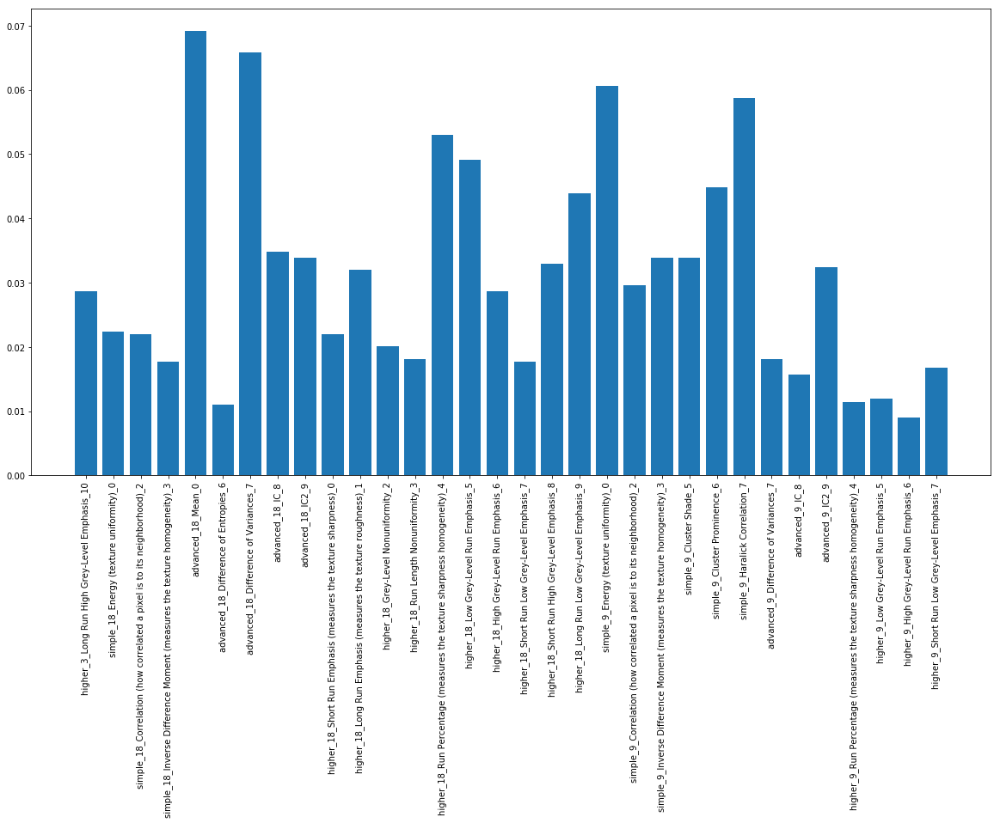

In [281]:
print(gbm2.feature_importances_)
# plot
plt.figure(figsize=(20,10) )
plt.bar(range(len(gbm2.feature_importances_)), gbm2.feature_importances_)
# filtered_feat_names = feature_names[gbm2.feature_importances_ > 0.01]
# plt.xticks(np.arange(len(feature_names)), filtered_feat_names, rotation=90)
plt.xticks(np.arange(len(filtered_feat_names)), filtered_feat_names, rotation=90)
plt.show()

In [291]:
filtered_f_2 = filtered_feat_names[gbm2.feature_importances_ > 0.02]

In [294]:
train_x_filtered2 = train_x_filtered[train_x_filtered.columns[gbm2.feature_importances_ > 0.02]]

In [295]:
test_x_filtered2 = test_x_filtered[train_x_filtered.columns[gbm2.feature_importances_ > 0.02]]

In [306]:
gbm3 = xgb.XGBClassifier(silent=False, n_estimators=600, n_jobs=-1, max_depth=3)
gbm3

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=600,
       n_jobs=-1, nthread=None, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=False, subsample=1)

In [ ]:
# TODO add time_measurements

In [307]:
gbm3 = gbm3.fit(train_x_filtered, train_y)
gbm3

[13:13:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[13:13:44] /work

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=600,
       n_jobs=-1, nthread=None, objective='binary:logistic',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=False, subsample=1)

In [308]:
predictions = gbm3.predict(train_x_filtered)
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(train_y, predictions)))
print('MSE itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(train_y, predictions)))

MSE itr@99: 0.11057314642355325
MSE itr@99: 0.8894268535764468


In [309]:
predictions = gbm3.predict(test_x_filtered)
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(test_y, predictions)))
print('MSE itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(test_y, predictions)))

MSE itr@99: 0.1489246152338006
MSE itr@99: 0.8510753847661994


In [236]:
train_x_filtered = train_x[train_x.columns[gbm.feature_importances_ > 0.01]]

,28,29,31,32,37,43,44,45,46,47,...,63,64,65,73,74,75,80,81,82,83
0,-1.219727e-18,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.063729,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000140,86.121544
1,-2.059984e-18,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.062063,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000133,81.831146
2,1.843144e-18,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.060482,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000127,77.949356
3,1.843144e-18,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.058980,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000121,74.420464
4,1.843144e-18,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.057551,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000116,71.198425
5,1.084202e-19,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.056190,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000111,68.244888
6,-2.602085e-18,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.054893,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000107,65.527641
7,-1.816039e-18,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.053654,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000103,63.019405
8,-8.673617e-19,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.052471,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000099,60.696968
9,8.673617e-19,1.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.051339,...,0.000000,0.000000,73636.351562,0.000000,0.000000,0.000000,0.001276,784.000000,0.000095,58.540421


In [555]:
# pr.shape

In [203]:
imshape = (101, 101)

In [204]:
pred_imgs = [ 
    predictions[ np.prod(imshape)*i : np.prod(imshape)*(i+1) ]
                          for i in range(100)
            ]

pred_imgs = [im.reshape((imshape), order='F').T for im in pred_imgs]

In [205]:
real_ims = [ 
    train_y.values[ np.prod(imshape)*i : np.prod(imshape)*(i+1) ]
                          for i in range(100)
            ]
real_ims = [im.reshape((imshape), order='A') for im in real_ims]


features = [ 
    train_x.values[ np.prod(imshape)*i : np.prod(imshape)*(i+1) ]
                          for i in range(100)
            ]
features = [im.reshape((101,101,-1), order='A') for im in features]

# features = df_to_images(train_x)

In [209]:
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(train_y, predictions)))

MSE itr@99: 0.08737182629154004


In [211]:
print('jaccard sim itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(train_y, predictions)))

jaccard sim itr@99: 0.9126281737084599


In [206]:
predictions_test = gbm.predict(test_x)
pred_test_imgs = [ 
    predictions_test[ np.prod(imshape)*i : np.prod(imshape)*(i+1) ]
                          for i in range(100)
            ]
pred_test_imgs = [im.reshape((imshape), order='F').T for im in pred_test_imgs]

real_test_ims = [ 
    test_y.values[ np.prod(imshape)*i : np.prod(imshape)*(i+1) ]
                          for i in range(100)
            ]
real_test_ims = [im.reshape((imshape), order='A') for im in real_test_ims]


features_test = [ 
    test_x.values[ np.prod(imshape)*i : np.prod(imshape)*(i+1) ]
                          for i in range(100)
            ]
features_test = [im.reshape((101,101,-1), order='A') for im in features_test]

# features = df_to_images(train_x)

In [207]:
print('MSE itr@{}: {}'.format(i, sklearn.metrics.mean_squared_error(test_y, predictions_test)))

MSE itr@99: 0.18098715812175276


In [212]:
print('jaccard sim itr@{}: {}'.format(i, sklearn.metrics.jaccard_similarity_score(test_y, predictions_test)))

jaccard sim itr@99: 0.8190128418782472


1


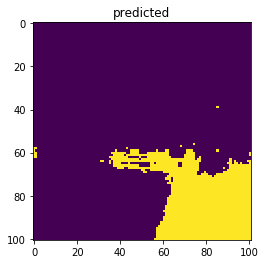

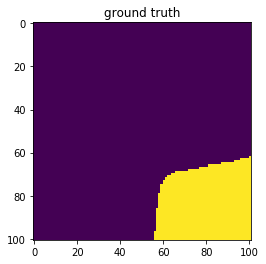

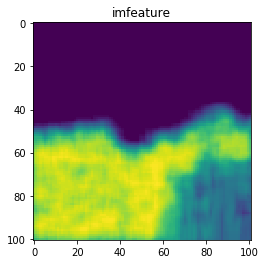

2


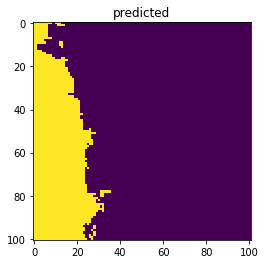

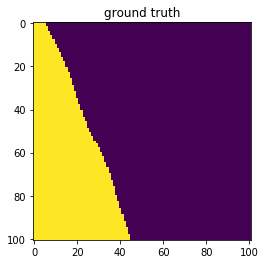

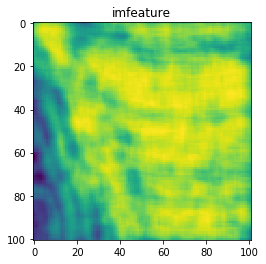

3


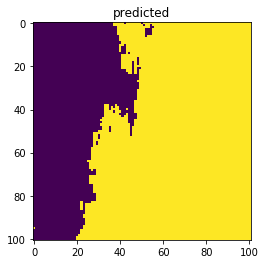

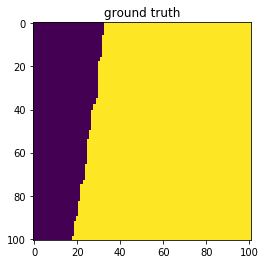

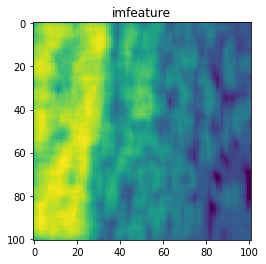

4


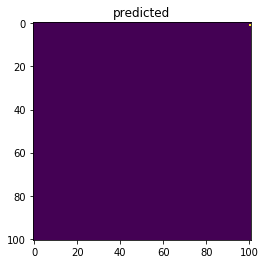

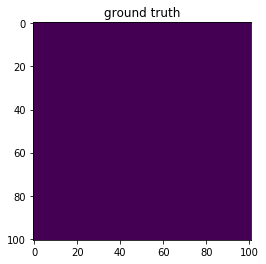

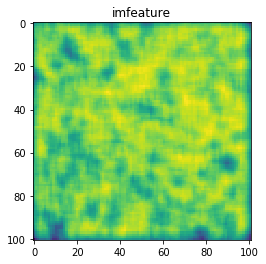

5


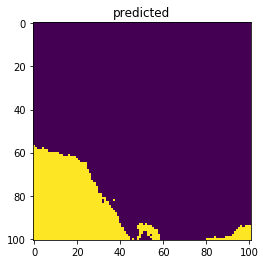

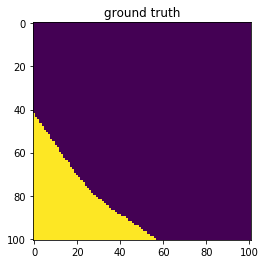

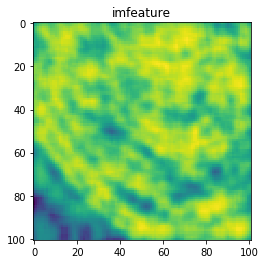

6


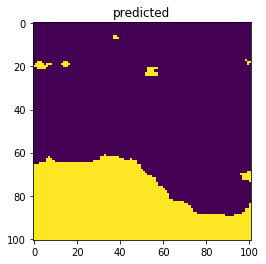

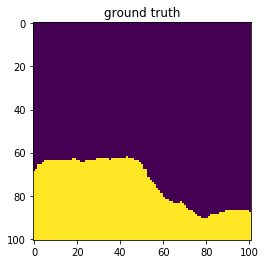

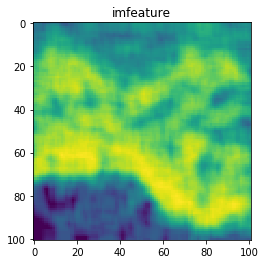

7


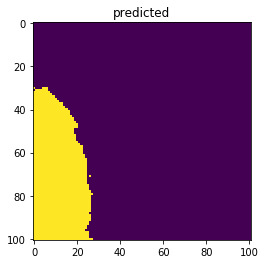

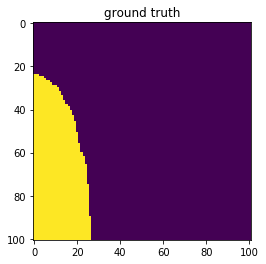

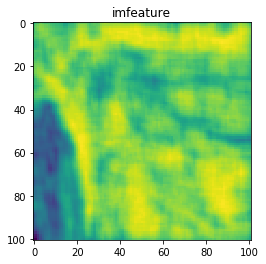

8


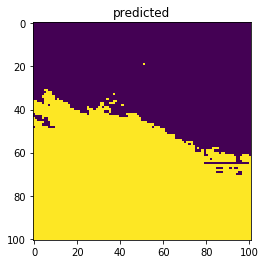

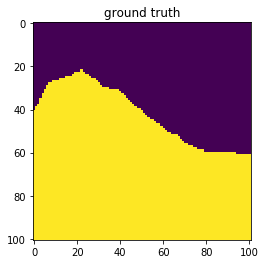

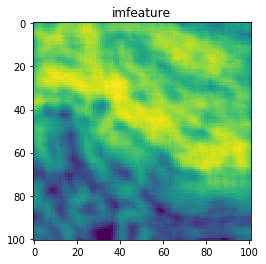

9


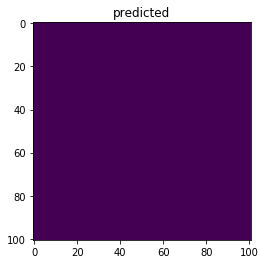

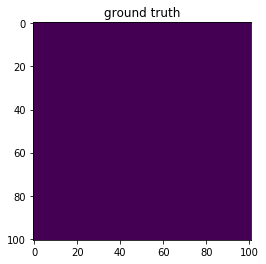

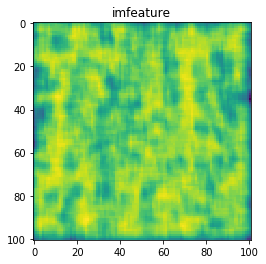

10


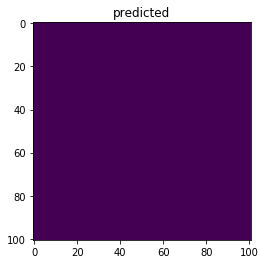

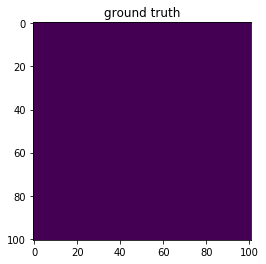

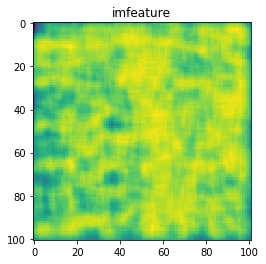

11


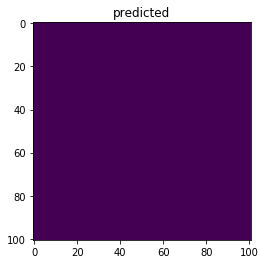

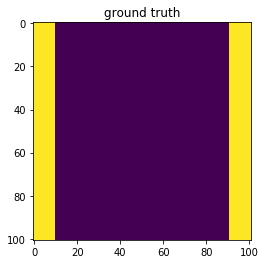

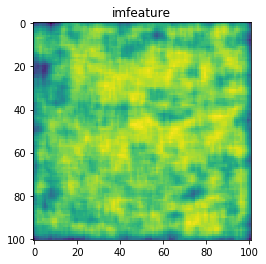

12


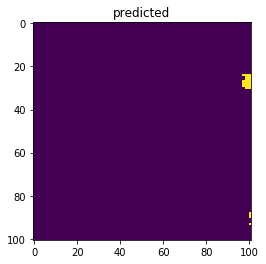

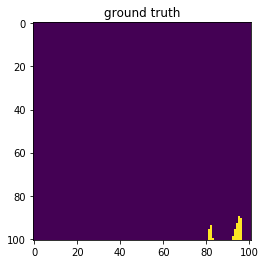

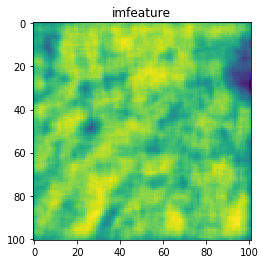

13


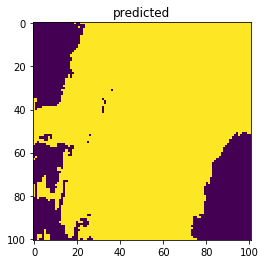

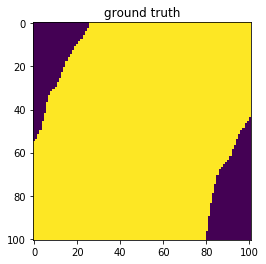

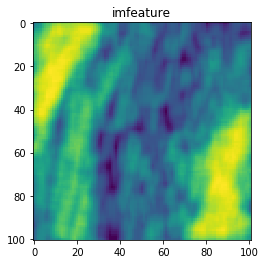

14


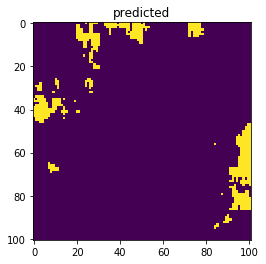

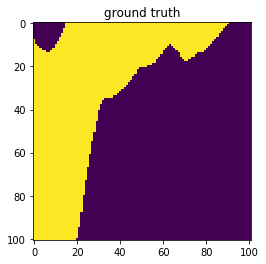

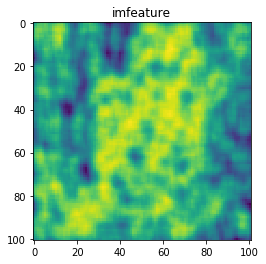

15


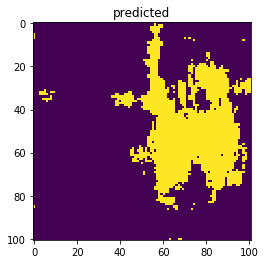

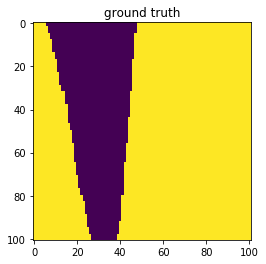

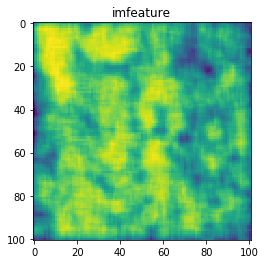

16


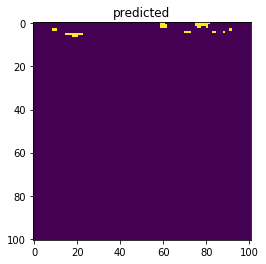

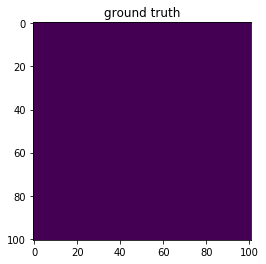

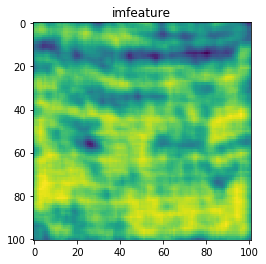

17


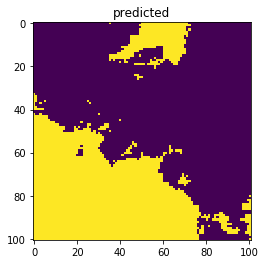

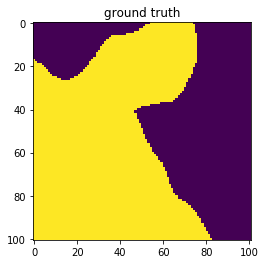

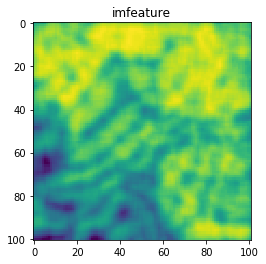

18


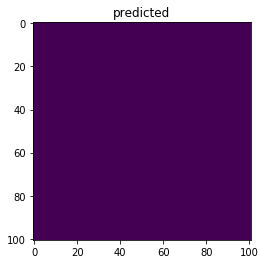

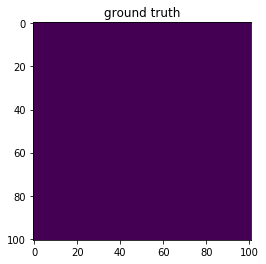

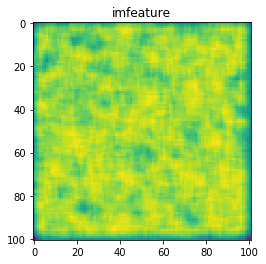

19


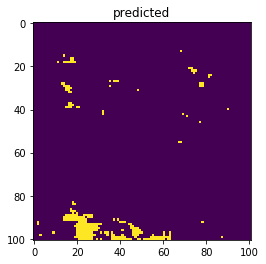

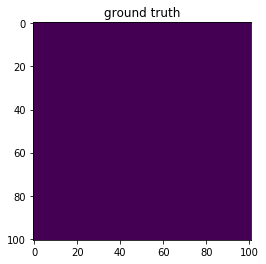

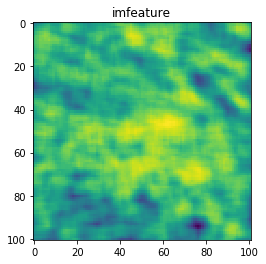

20


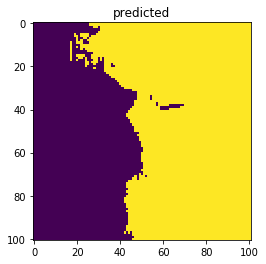

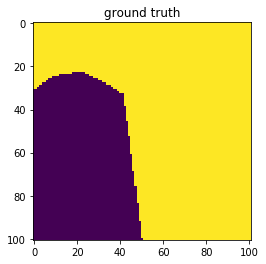

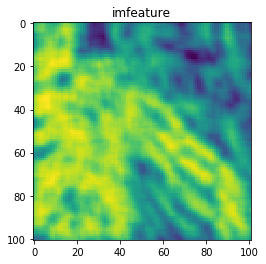

21


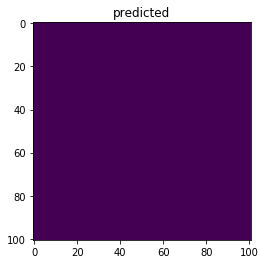

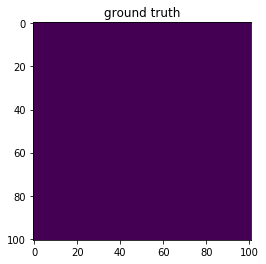

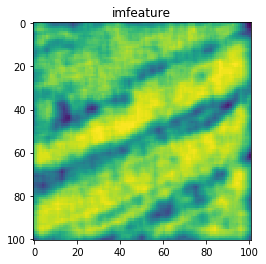

22


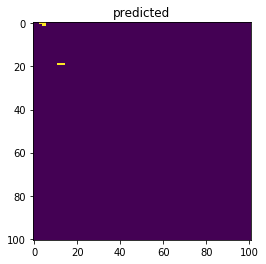

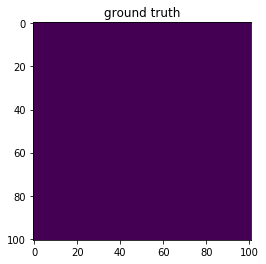

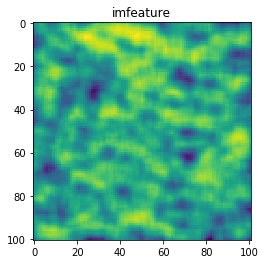

23


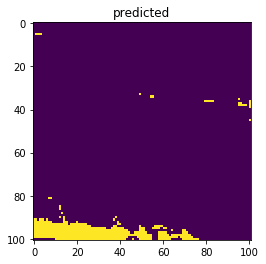

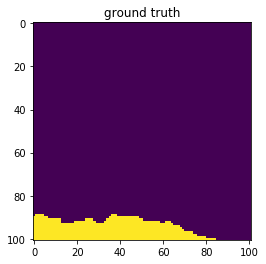

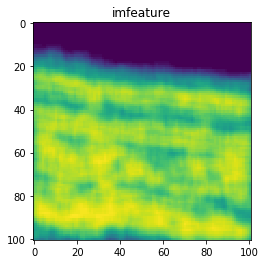

24


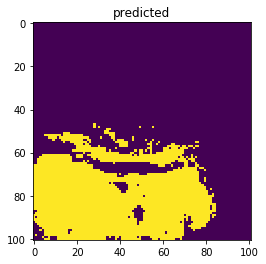

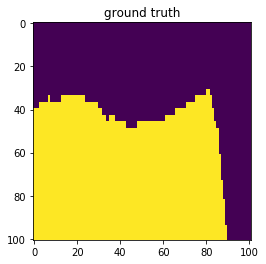

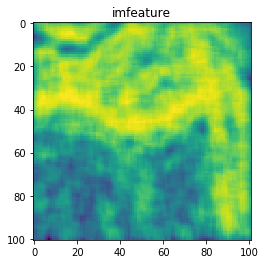

25


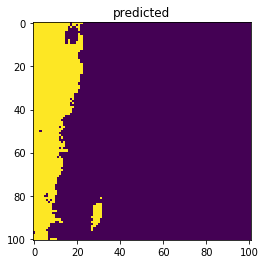

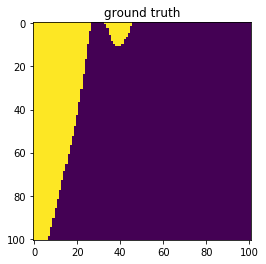

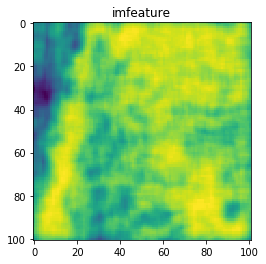

26


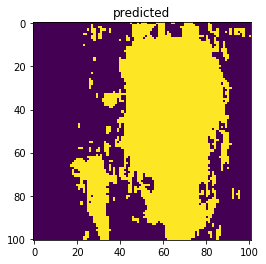

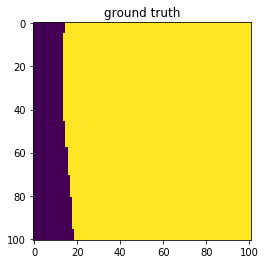

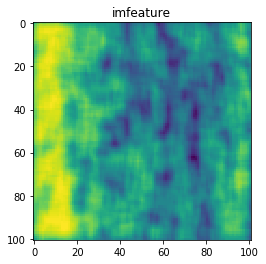

27


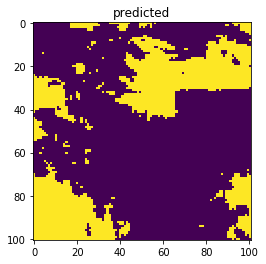

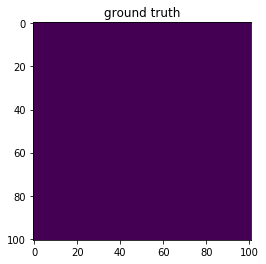

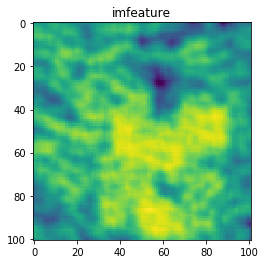

28


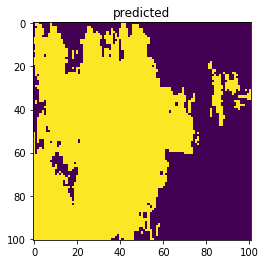

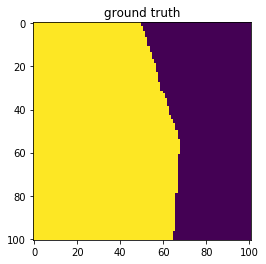

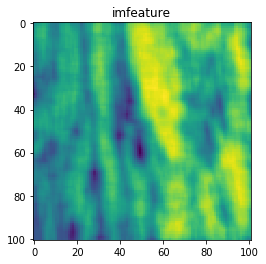

29


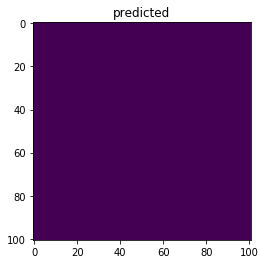

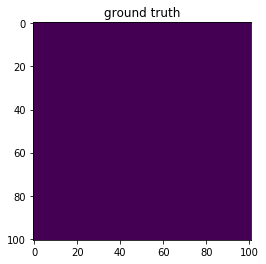

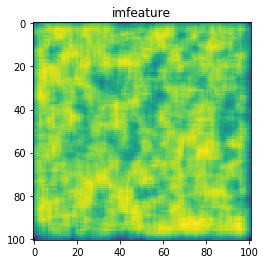

30


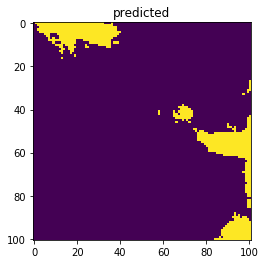

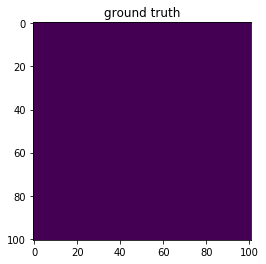

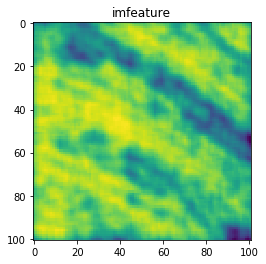

31


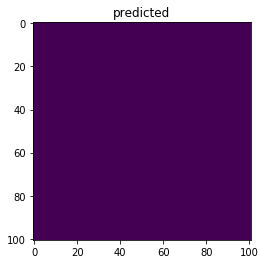

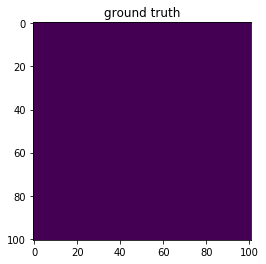

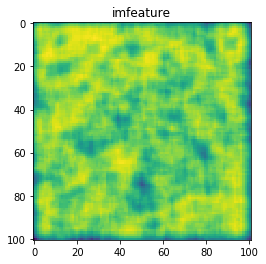

32


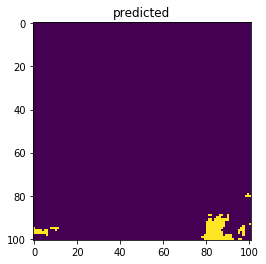

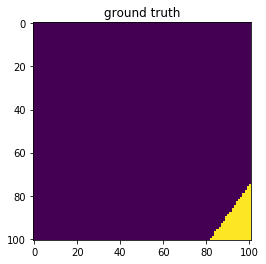

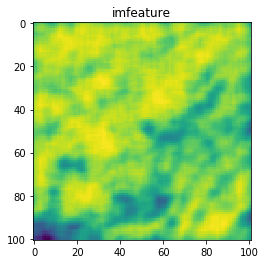

33


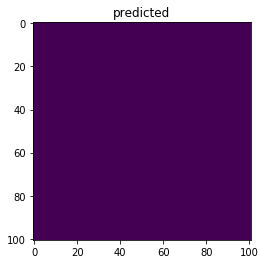

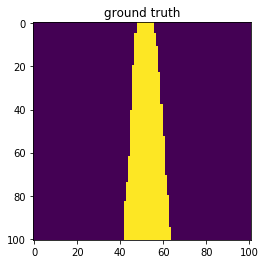

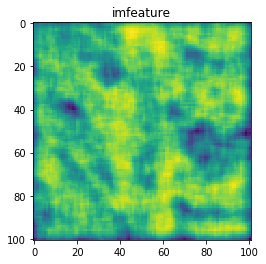

34


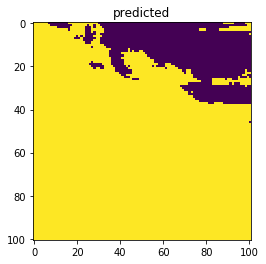

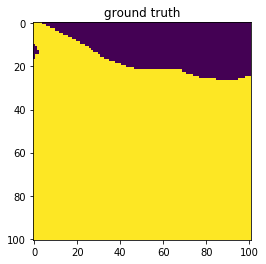

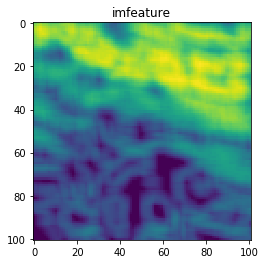

35


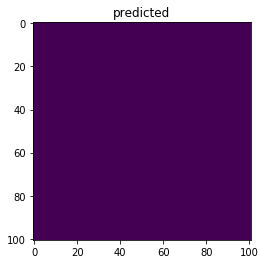

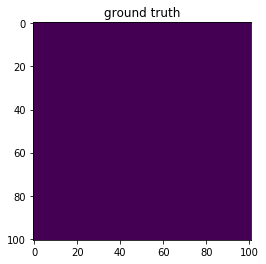

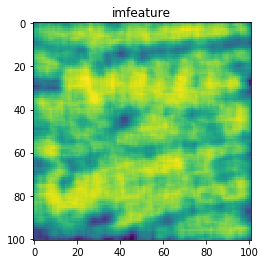

36


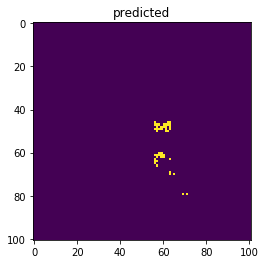

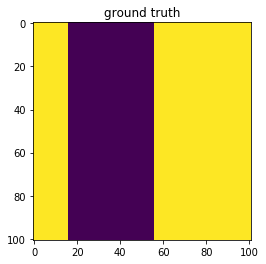

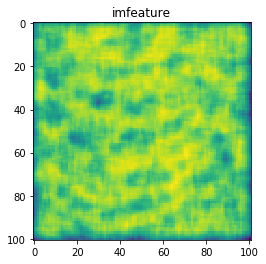

37


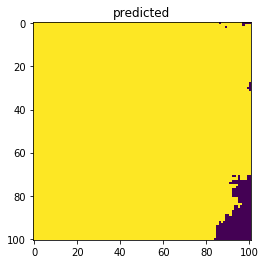

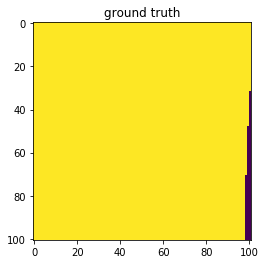

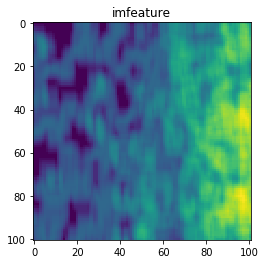

38


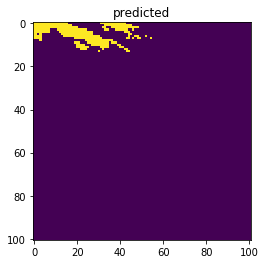

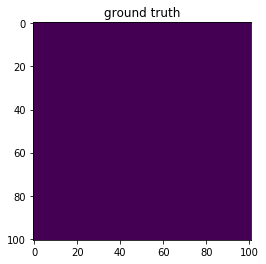

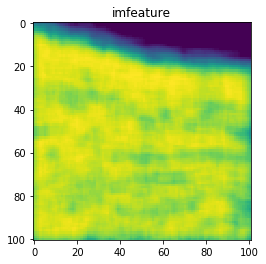

39


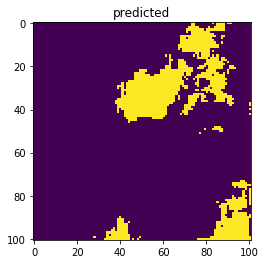

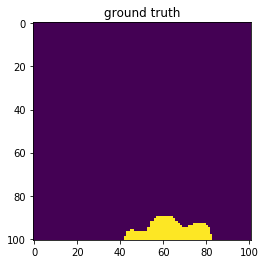

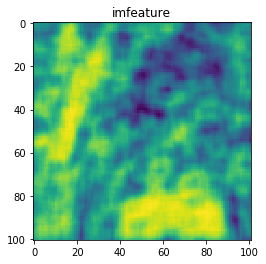

40


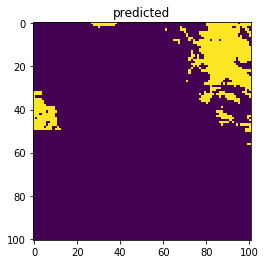

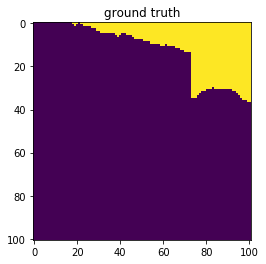

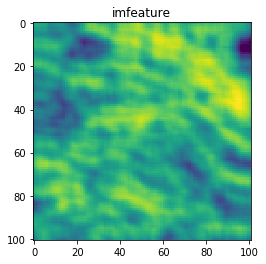

41


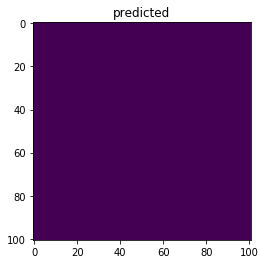

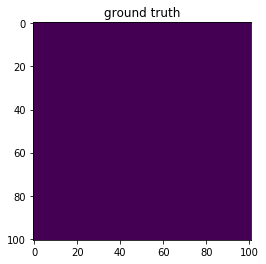

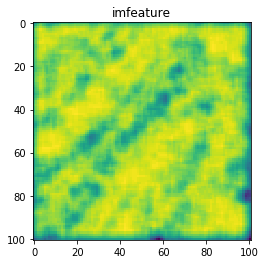

42


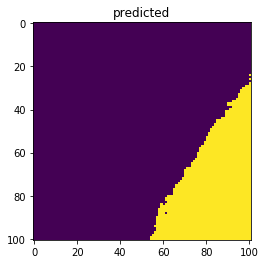

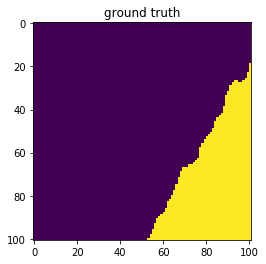

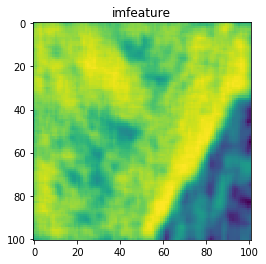

43


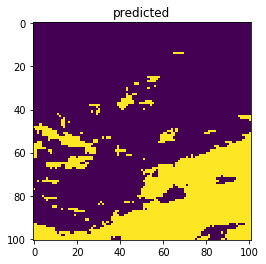

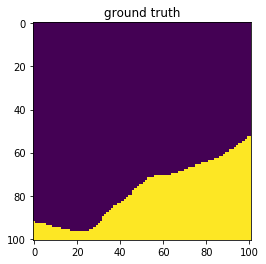

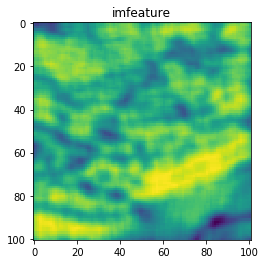

44


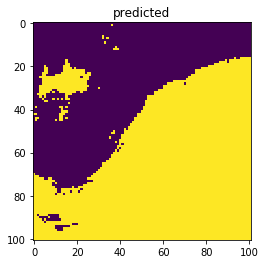

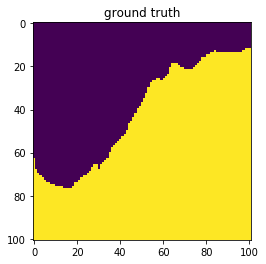

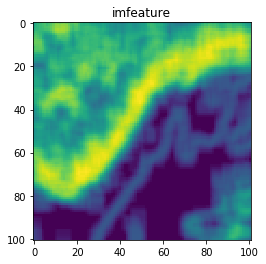

45


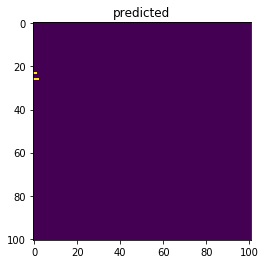

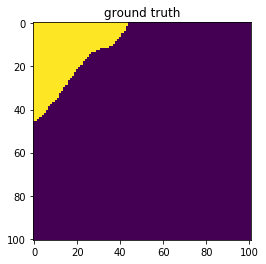

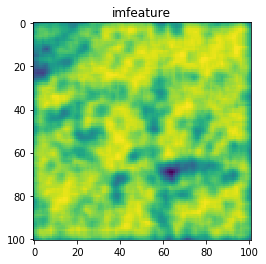

46


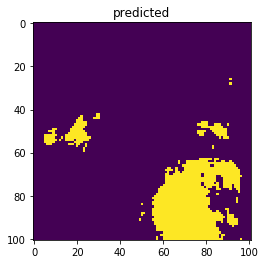

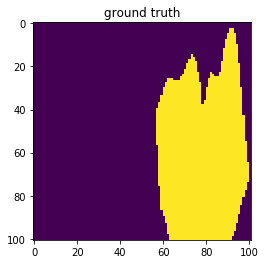

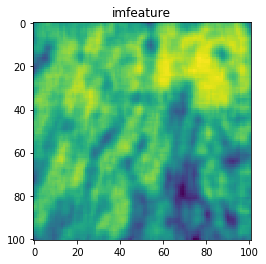

47


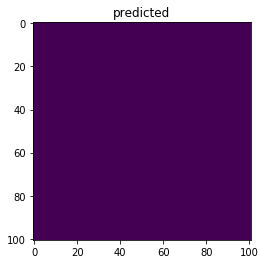

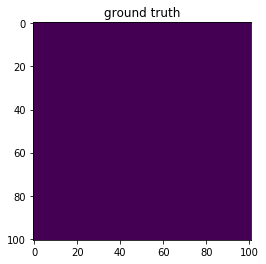

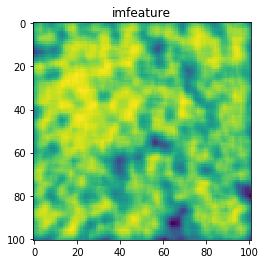

48


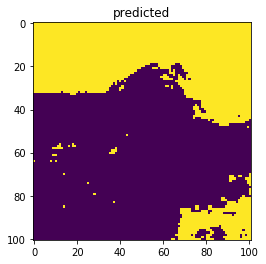

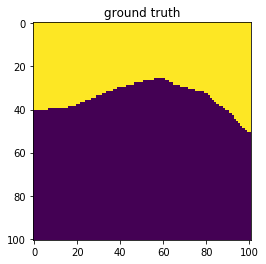

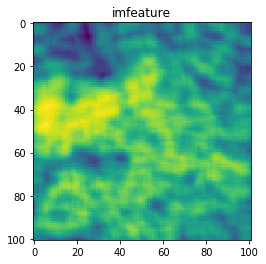

49


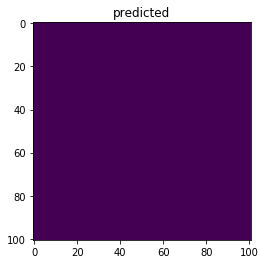

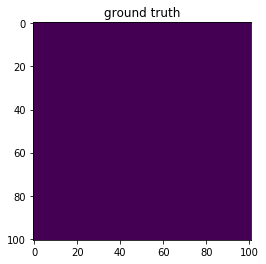

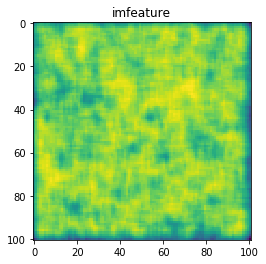

50


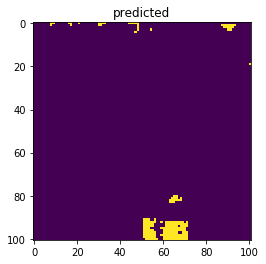

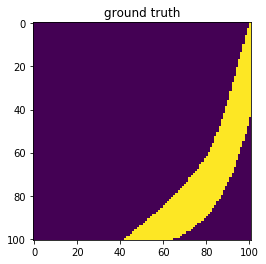

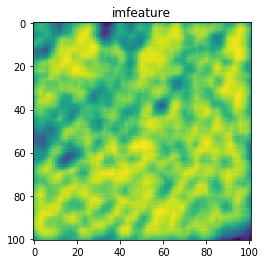

51


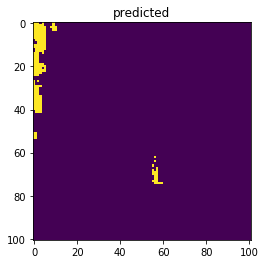

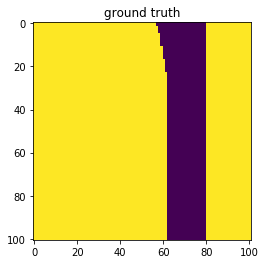

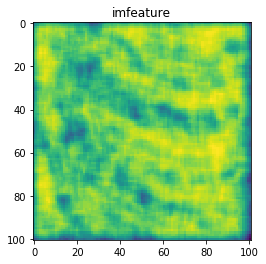

52


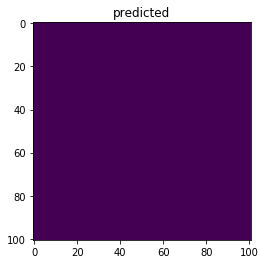

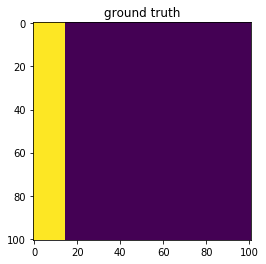

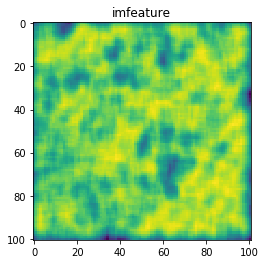

53


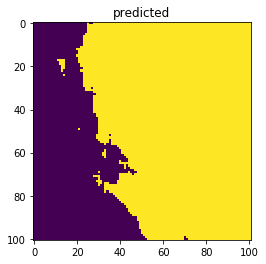

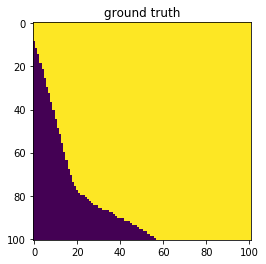

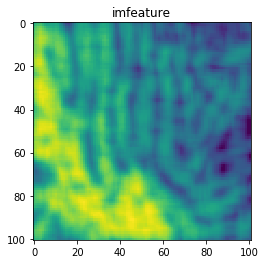

54


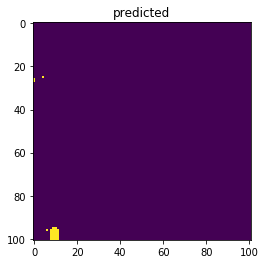

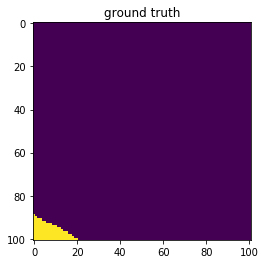

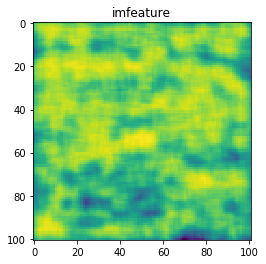

55


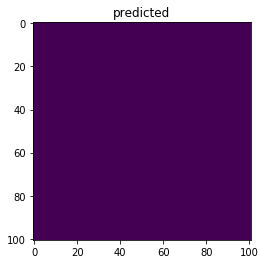

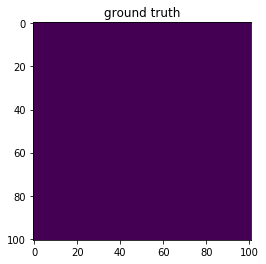

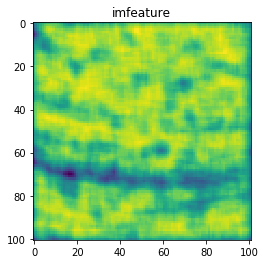

56


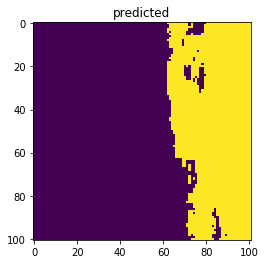

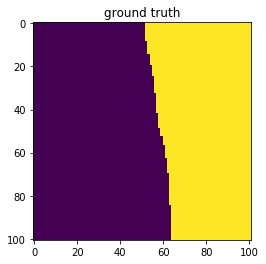

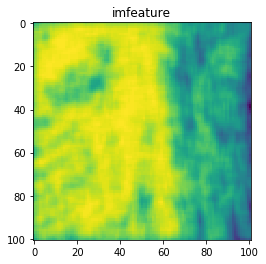

57


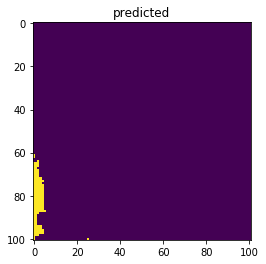

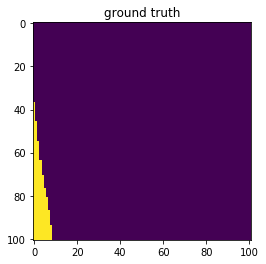

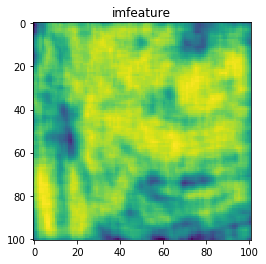

58


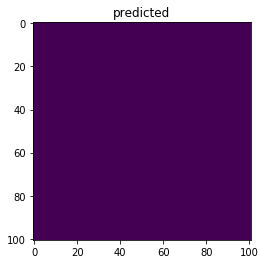

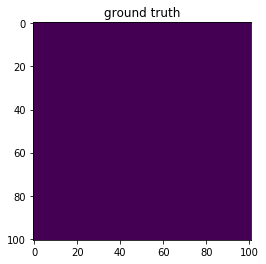

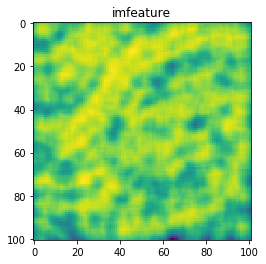

59


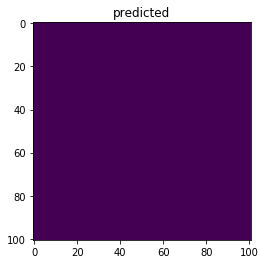

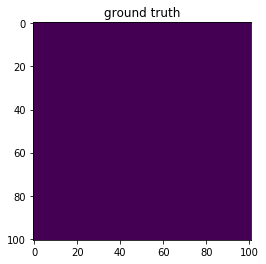

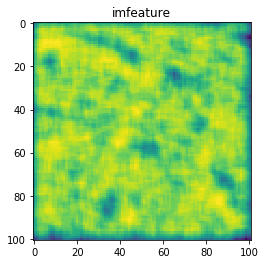

60


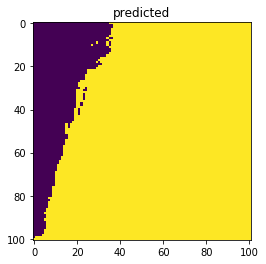

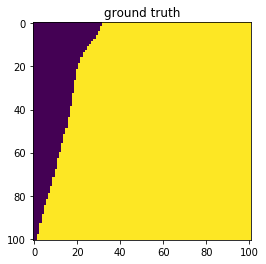

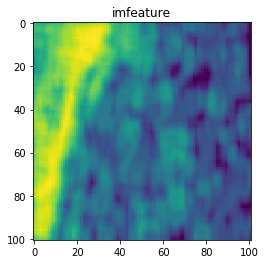

61


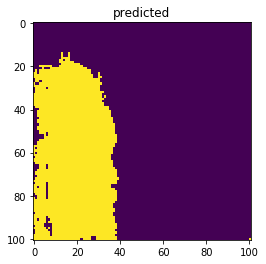

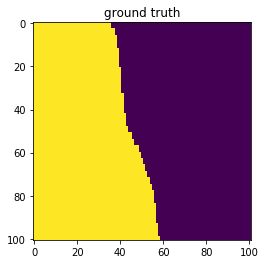

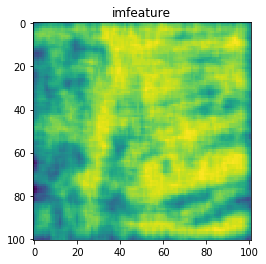

62


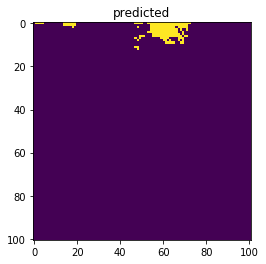

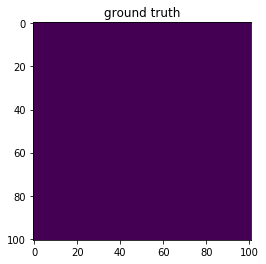

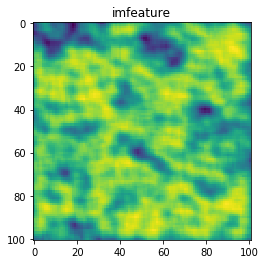

63


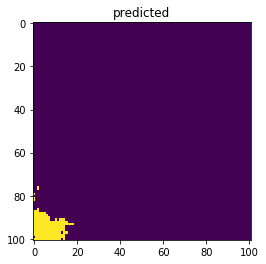

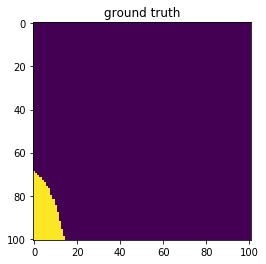

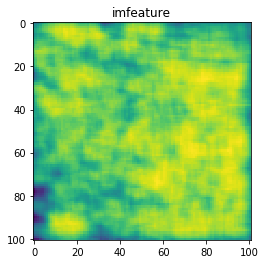

64


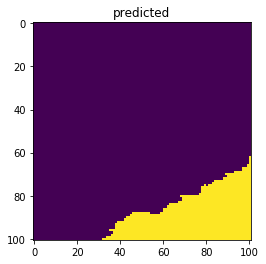

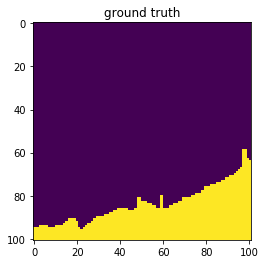

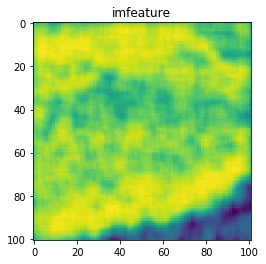

65


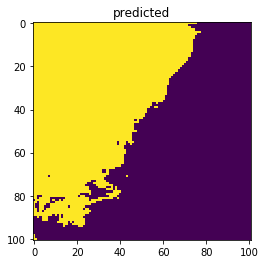

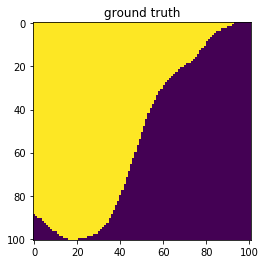

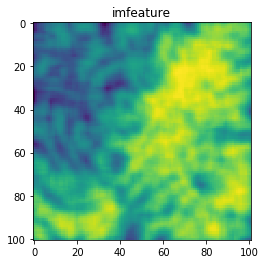

66


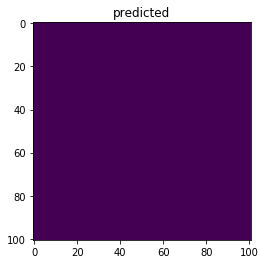

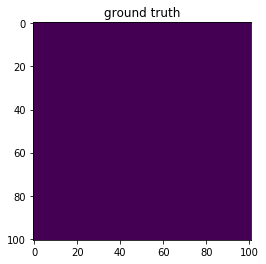

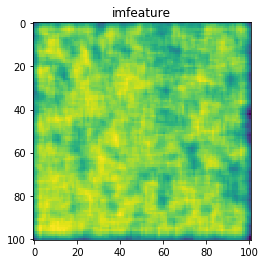

67


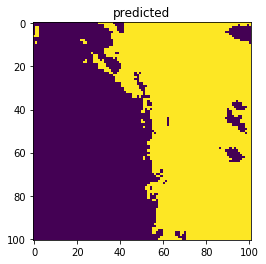

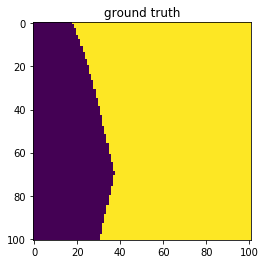

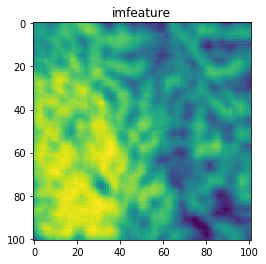

68


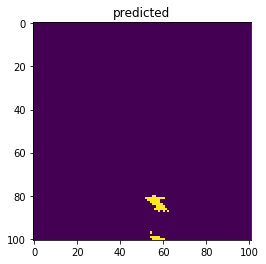

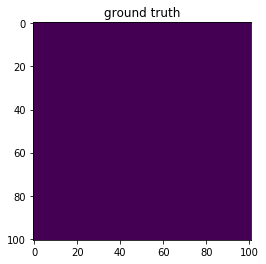

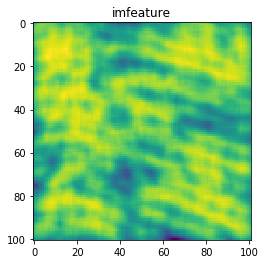

69


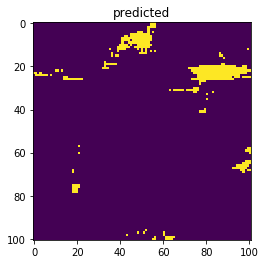

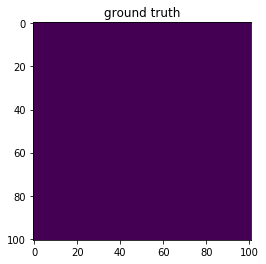

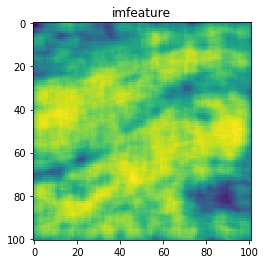

70


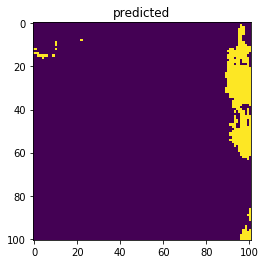

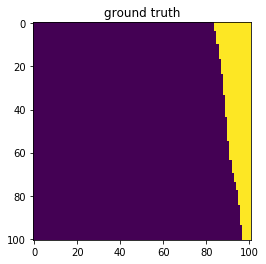

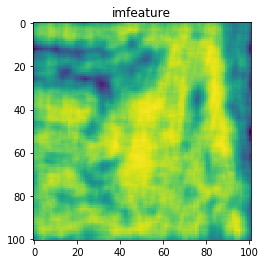

71


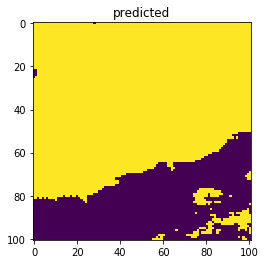

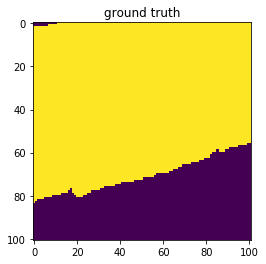

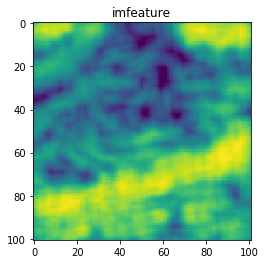

72


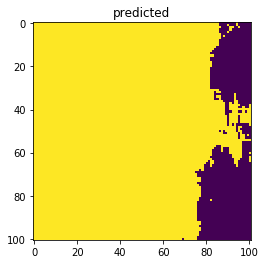

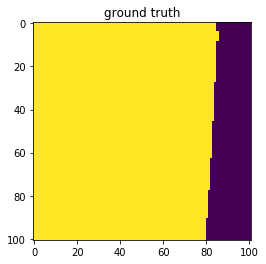

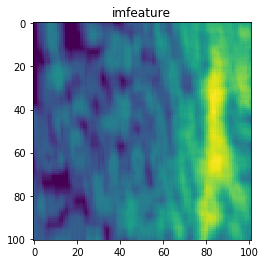

73


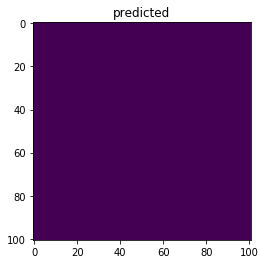

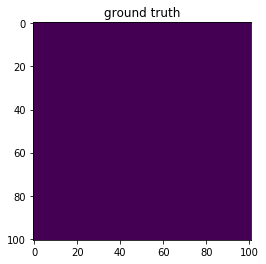

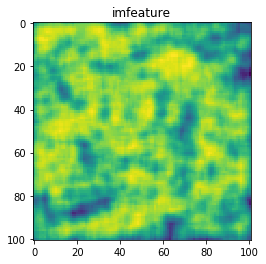

74


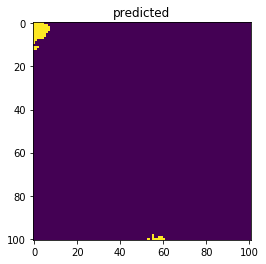

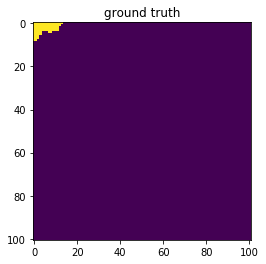

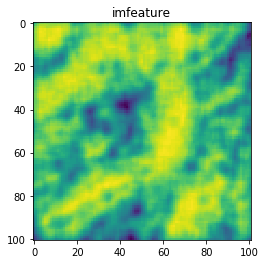

75


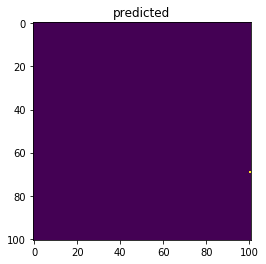

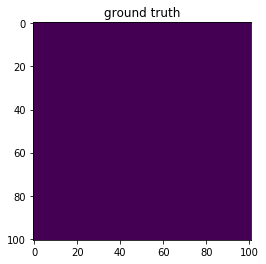

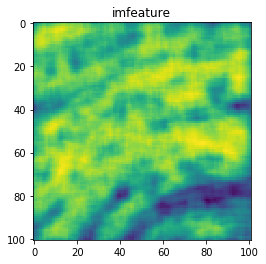

76


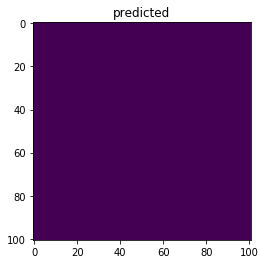

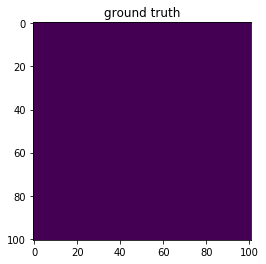

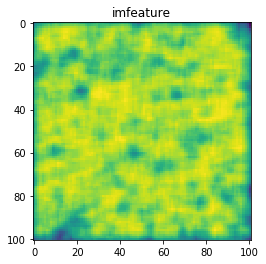

77


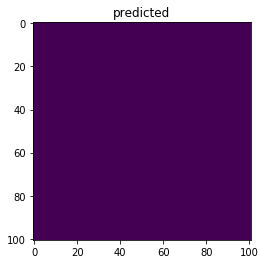

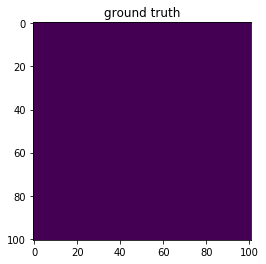

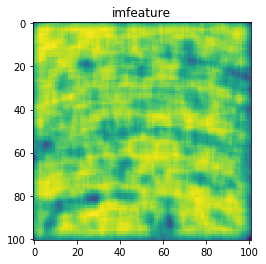

78


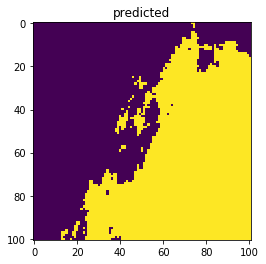

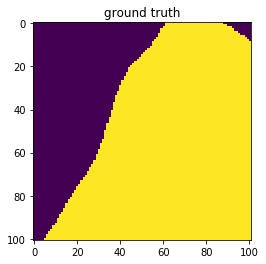

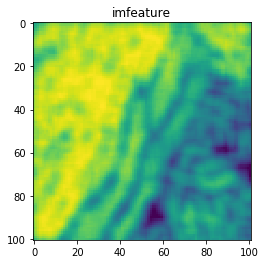

79


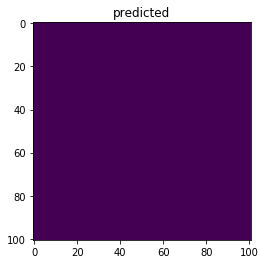

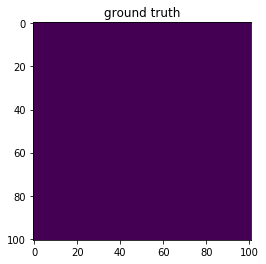

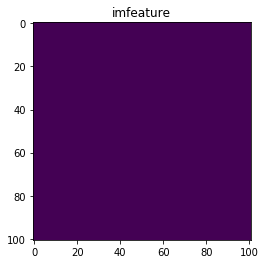

80


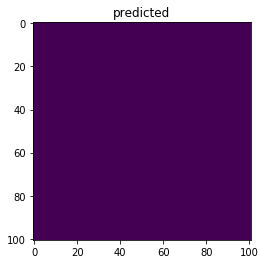

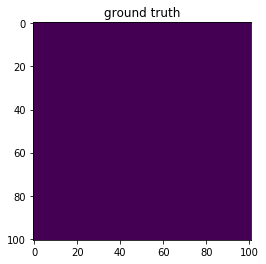

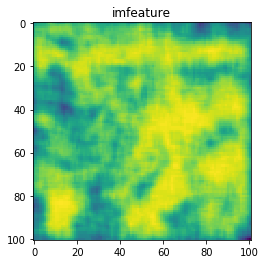

81


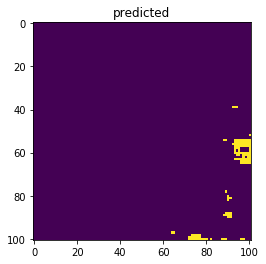

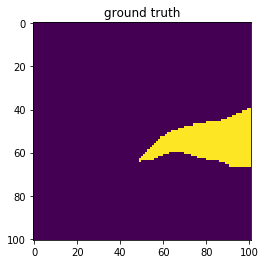

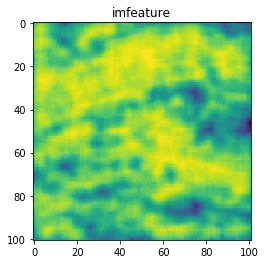

82


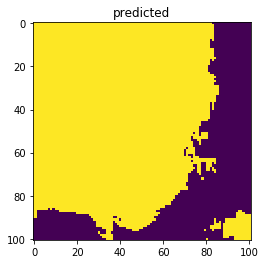

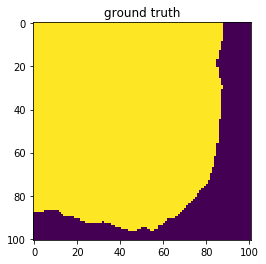

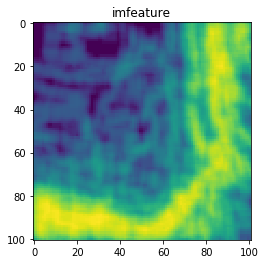

83


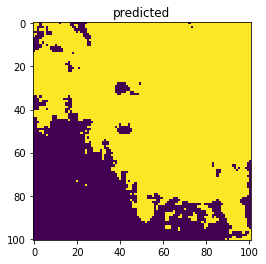

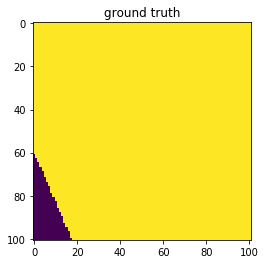

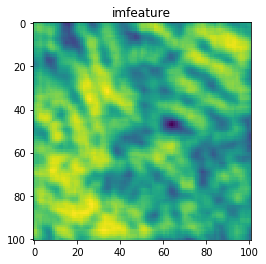

84


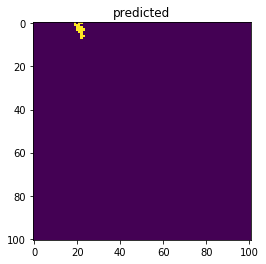

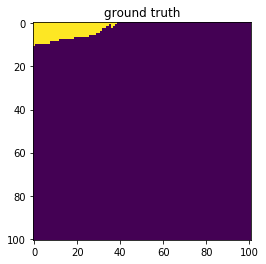

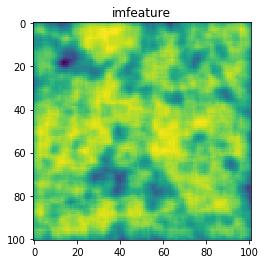

85


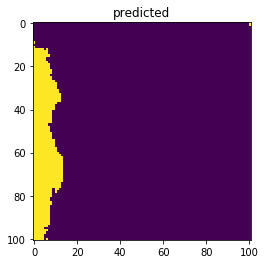

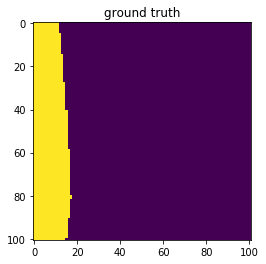

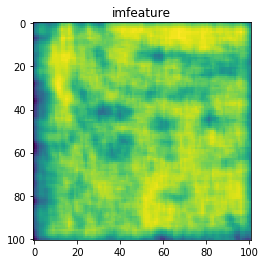

86


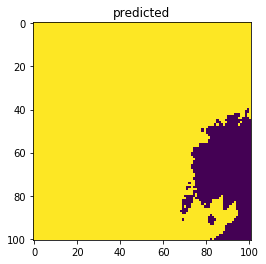

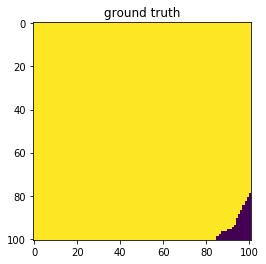

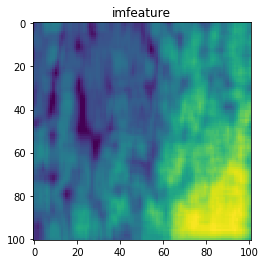

87


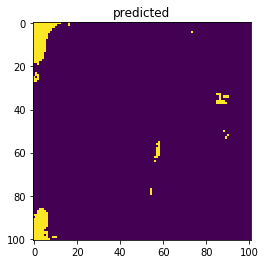

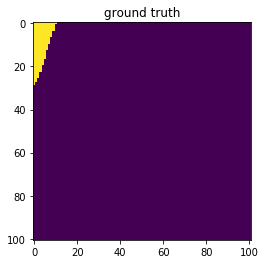

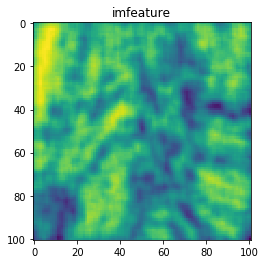

88


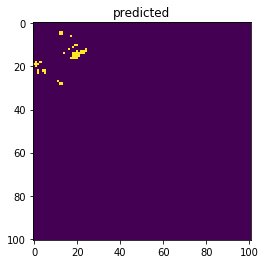

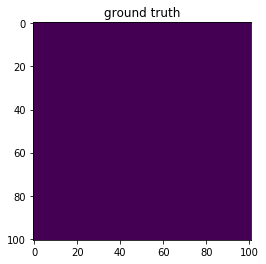

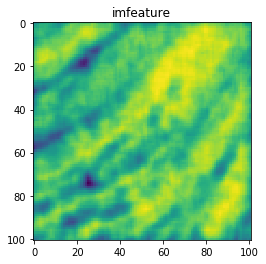

89


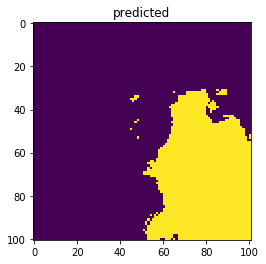

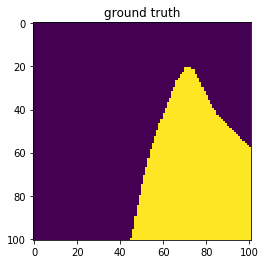

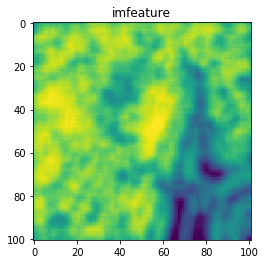

90


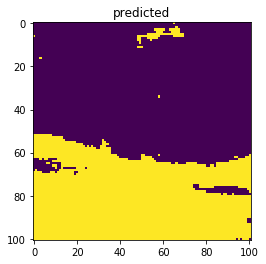

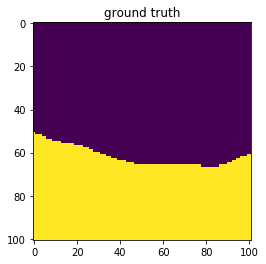

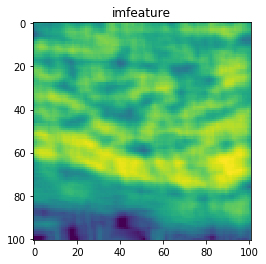

91


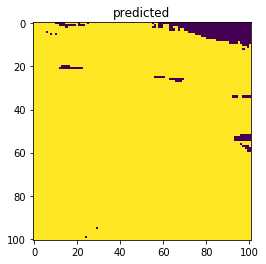

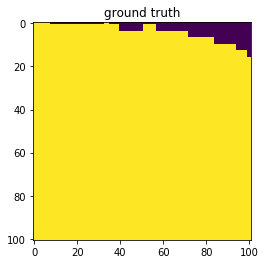

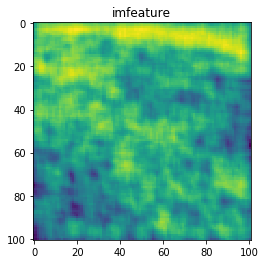

92


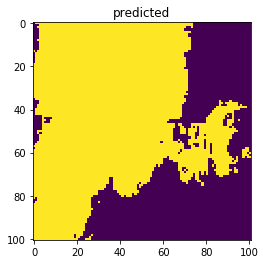

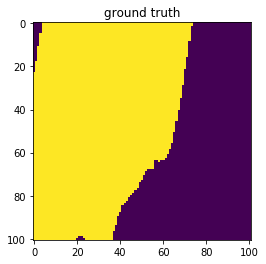

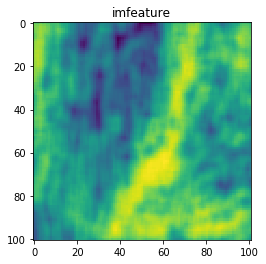

93


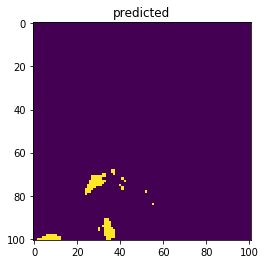

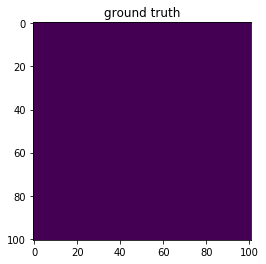

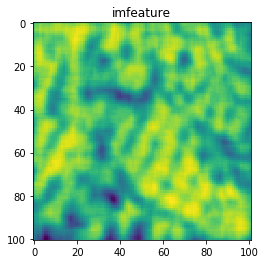

94


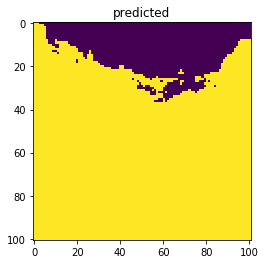

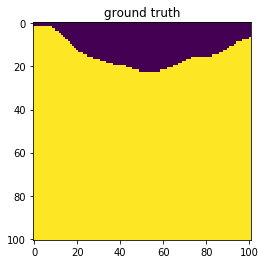

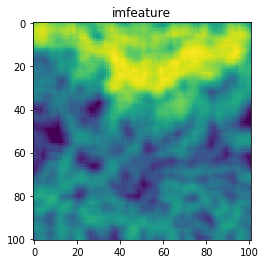

95


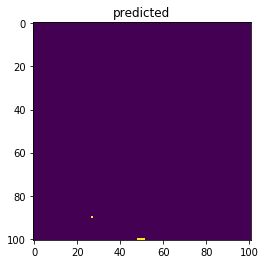

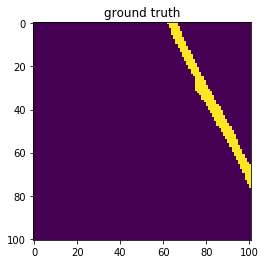

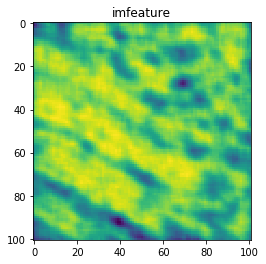

96


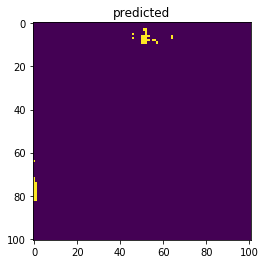

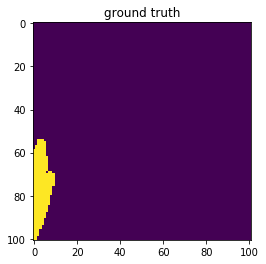

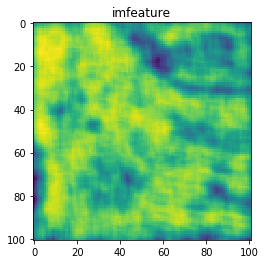

97


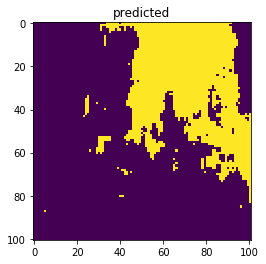

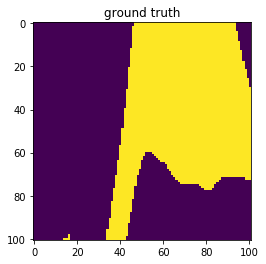

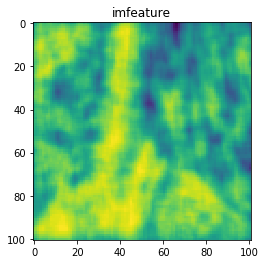

98


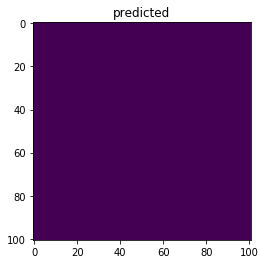

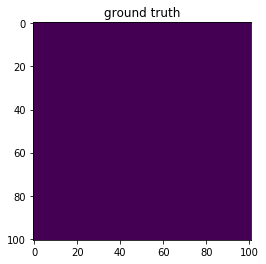

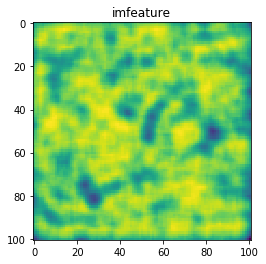

99


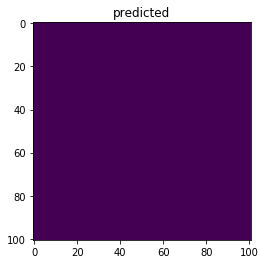

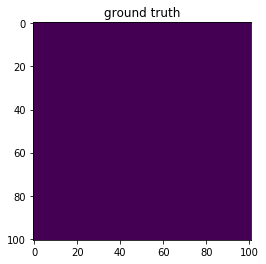

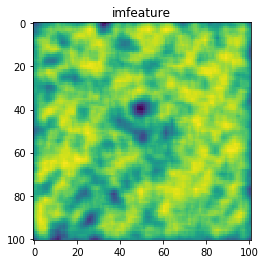

100


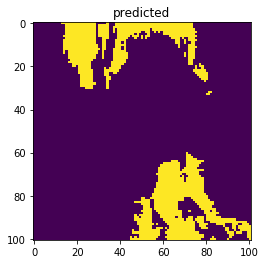

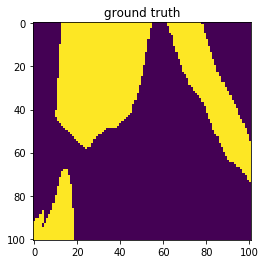

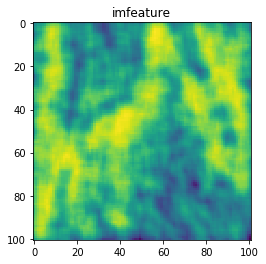

In [213]:
for i, (real, pred, feat) in enumerate(zip(real_ims, pred_imgs, features)):
    print(i+1)
    plt.title('predicted')
    plt.imshow(pred)
   
    plt.show()
    
    plt.title('ground truth')
    plt.imshow(real)
    
    plt.show()
    plt.title('imfeature')
    plt.imshow(feat[..., 1])
    plt.show()
    

1


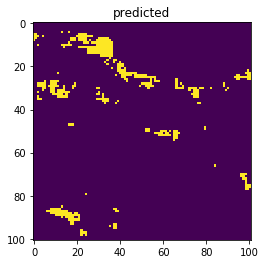

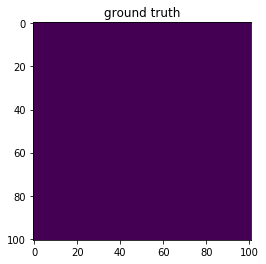

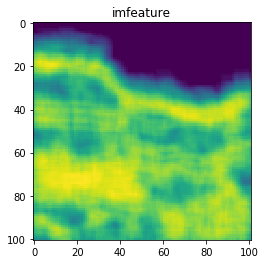

2


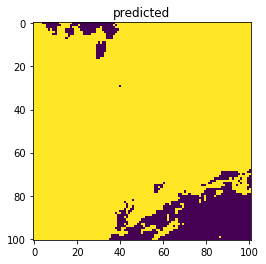

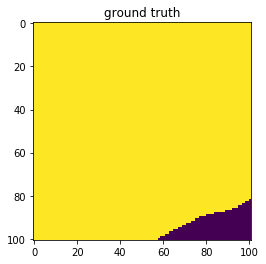

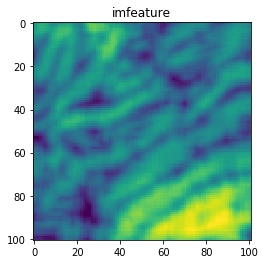

3


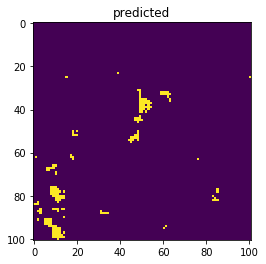

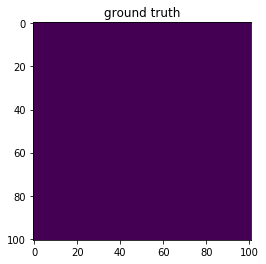

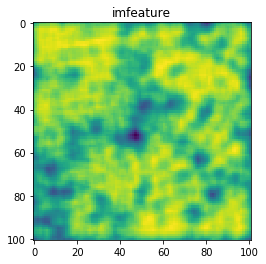

4


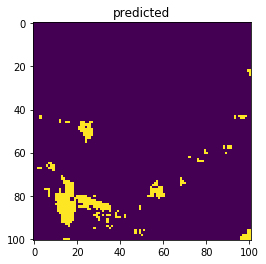

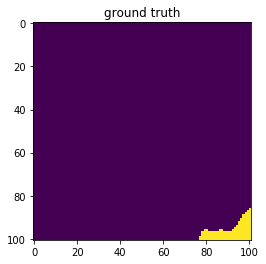

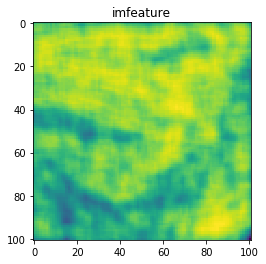

5


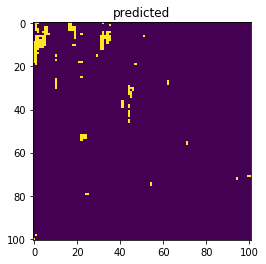

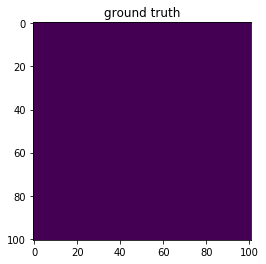

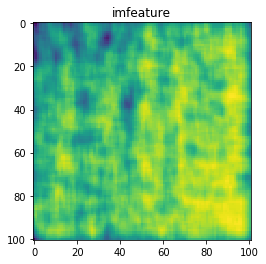

6


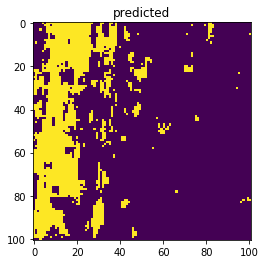

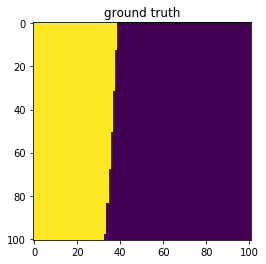

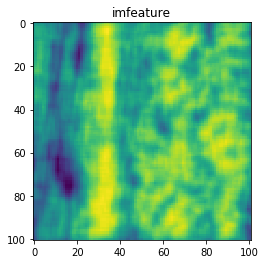

7


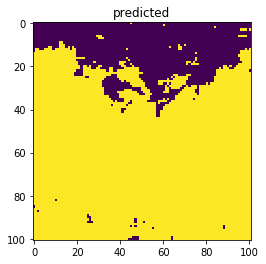

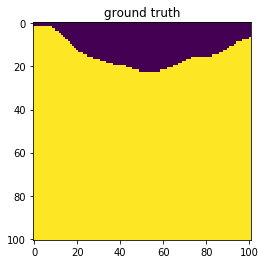

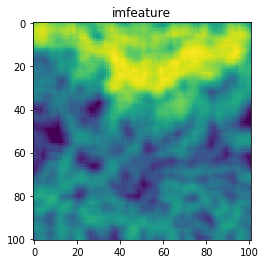

8


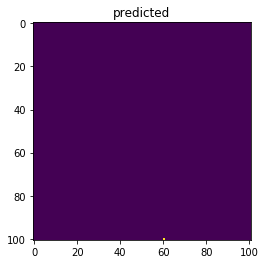

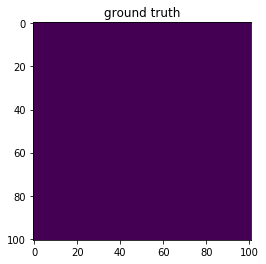

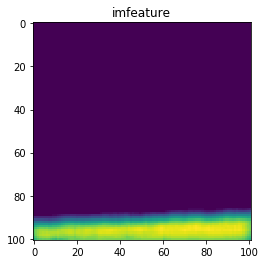

9


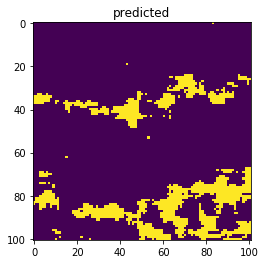

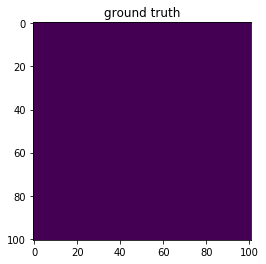

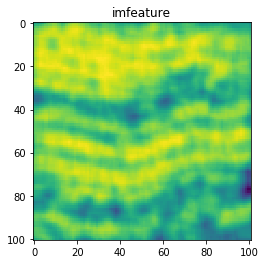

10


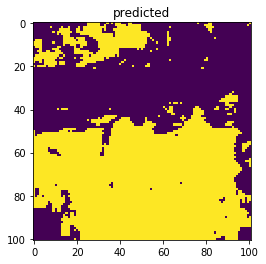

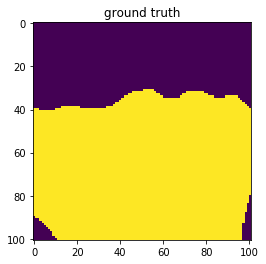

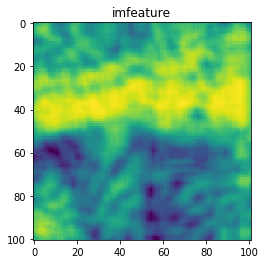

11


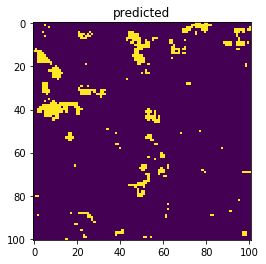

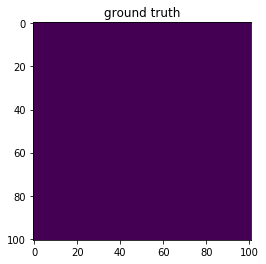

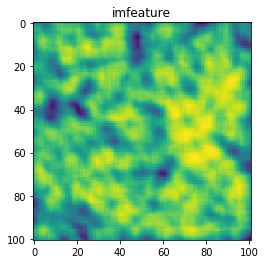

12


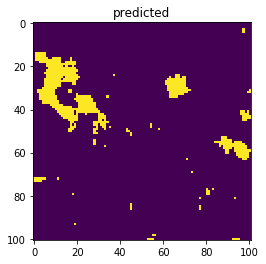

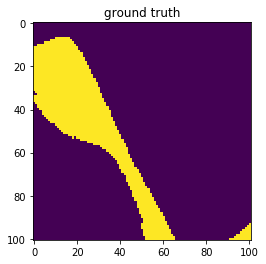

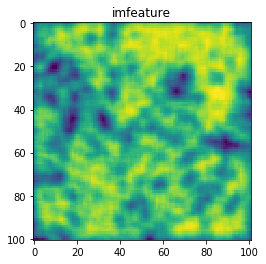

13


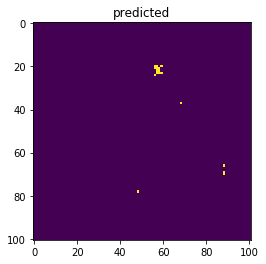

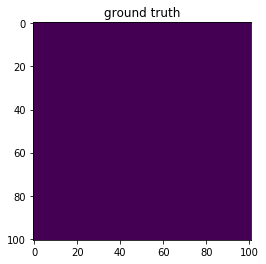

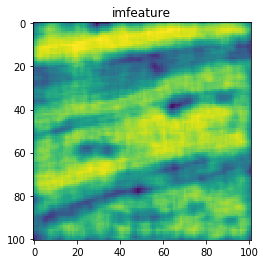

14


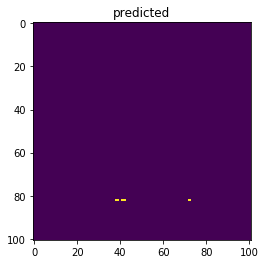

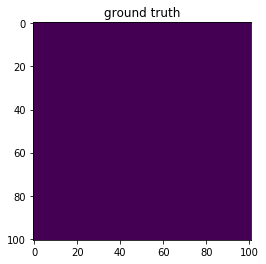

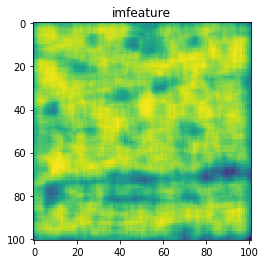

15


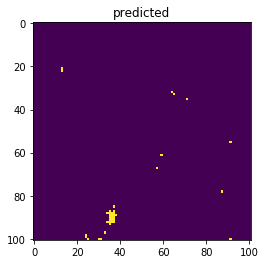

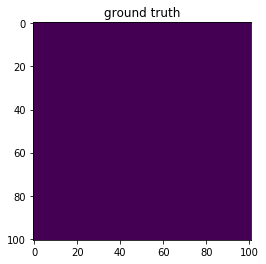

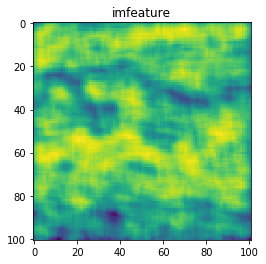

16


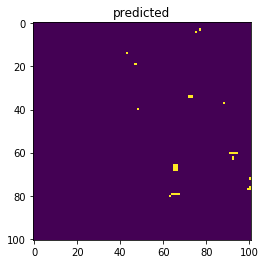

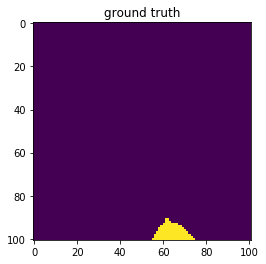

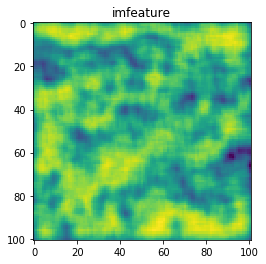

17


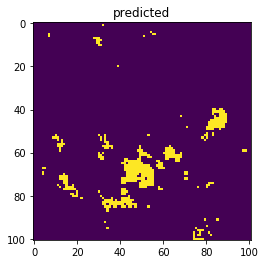

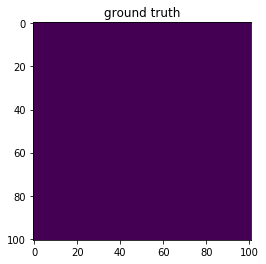

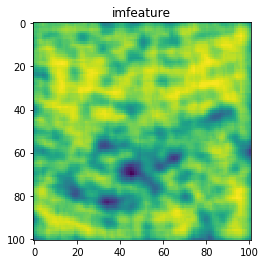

18


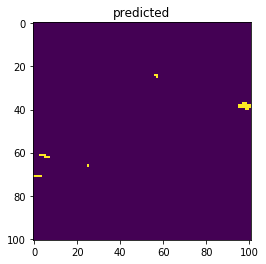

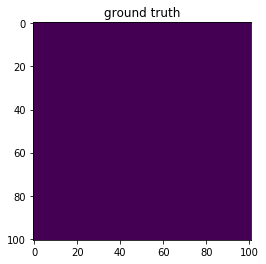

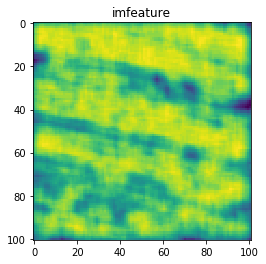

19


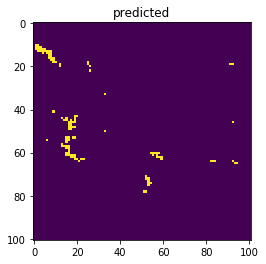

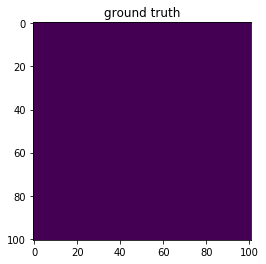

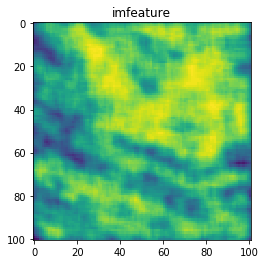

20


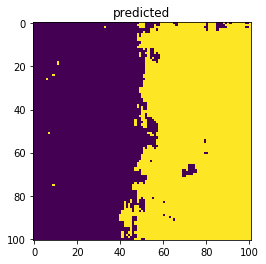

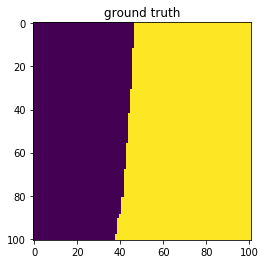

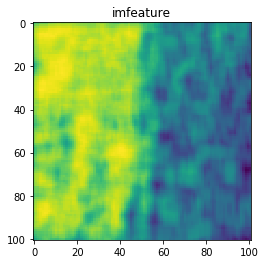

21


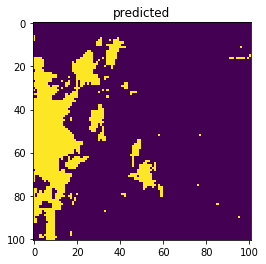

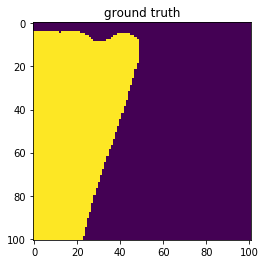

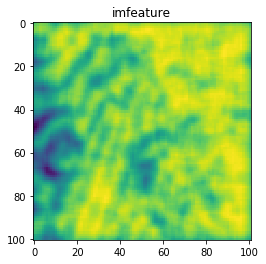

22


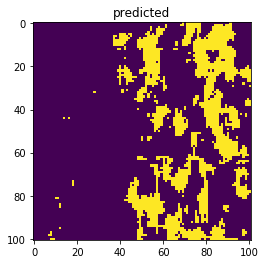

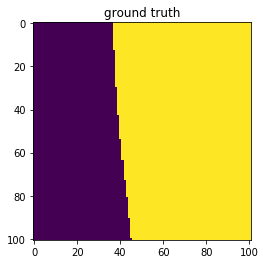

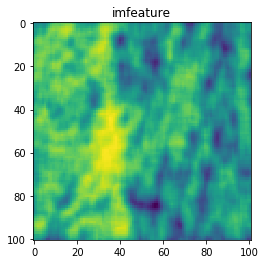

23


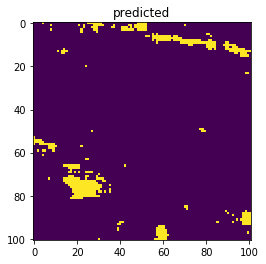

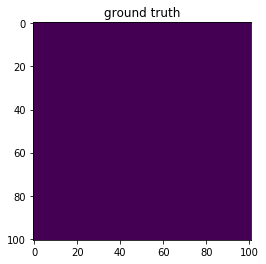

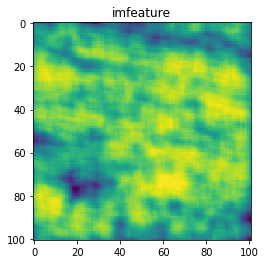

24


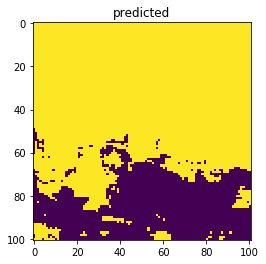

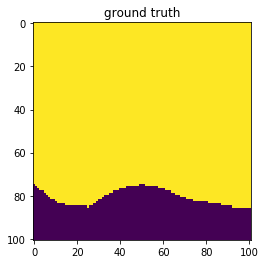

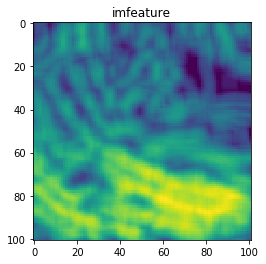

25


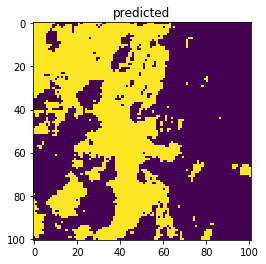

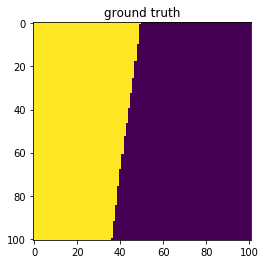

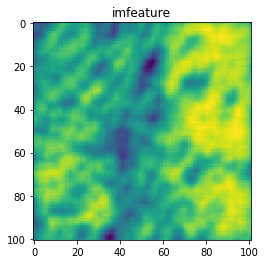

26


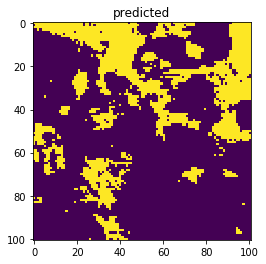

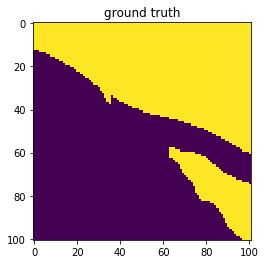

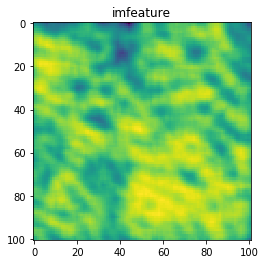

27


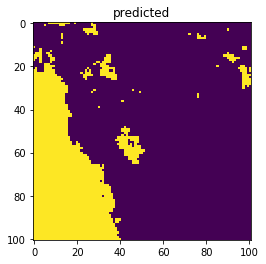

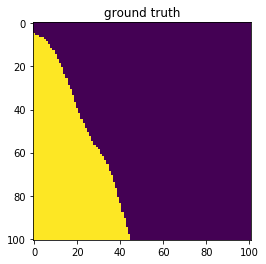

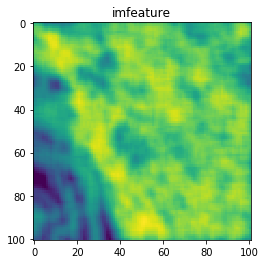

28


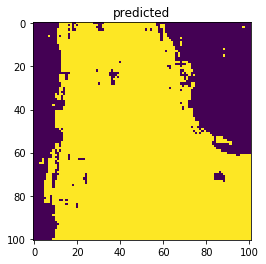

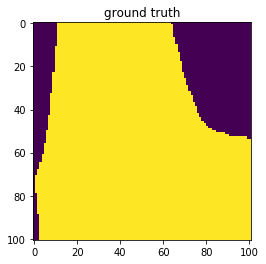

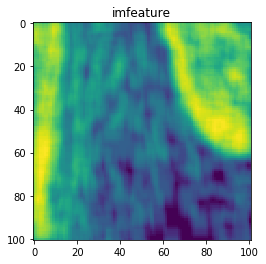

29


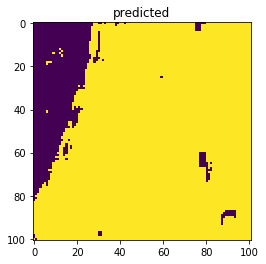

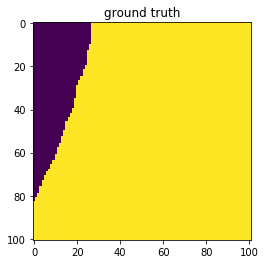

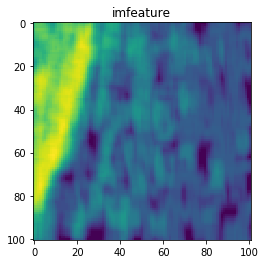

30


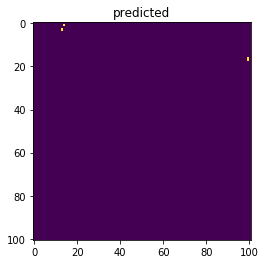

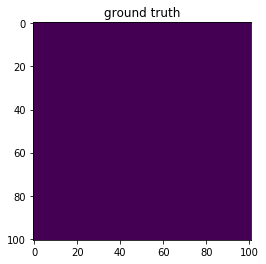

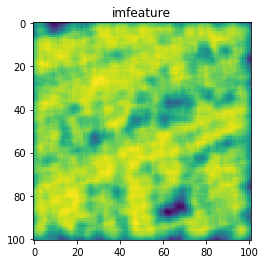

31


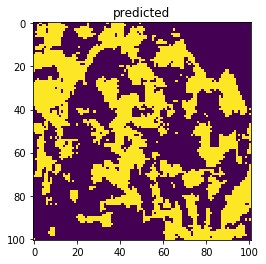

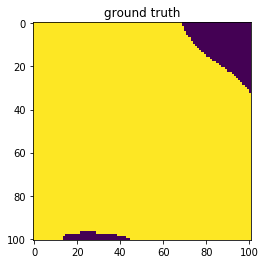

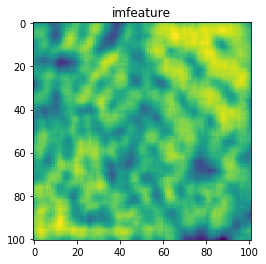

32


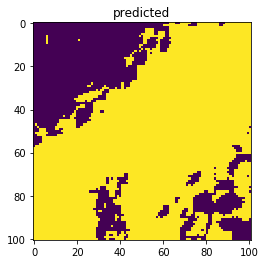

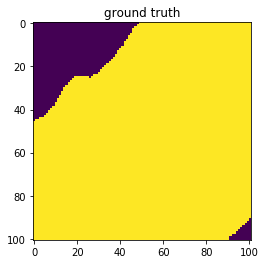

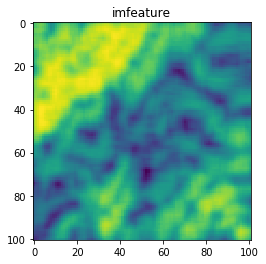

33


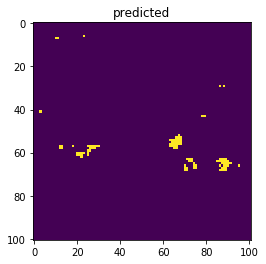

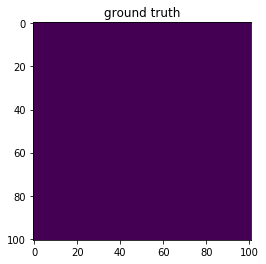

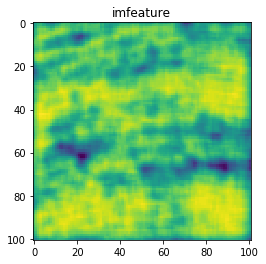

34


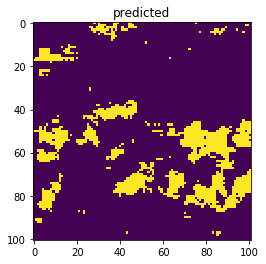

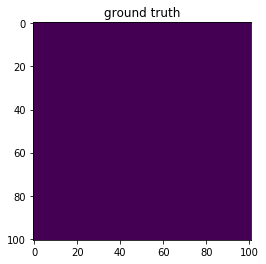

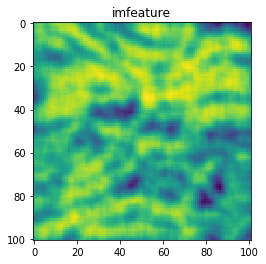

35


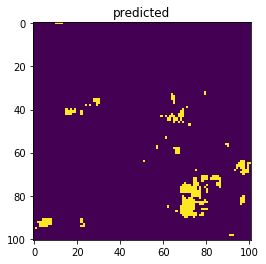

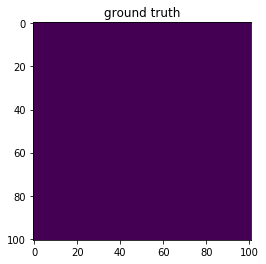

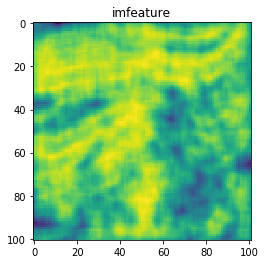

36


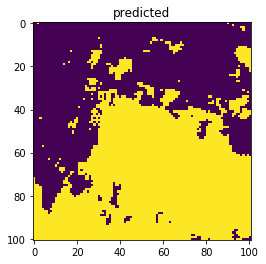

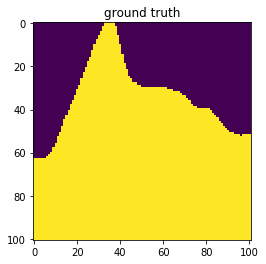

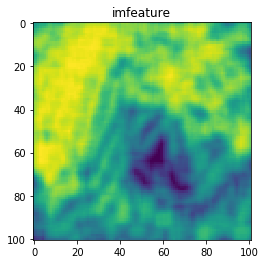

37


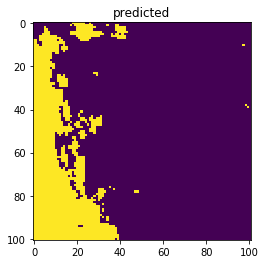

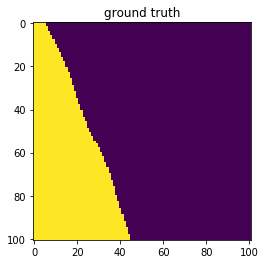

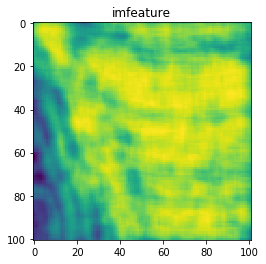

38


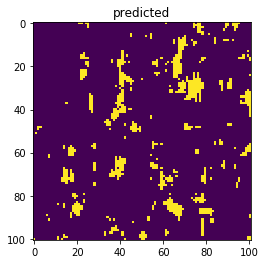

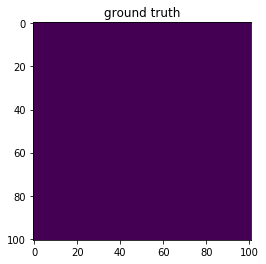

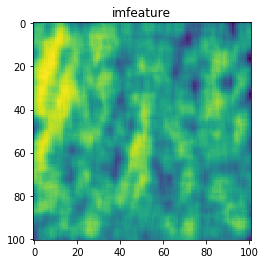

39


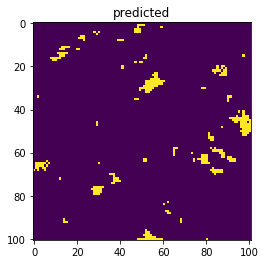

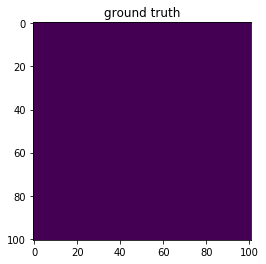

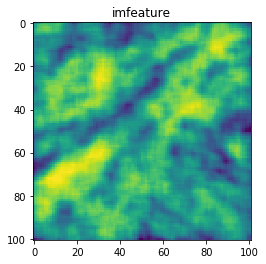

40


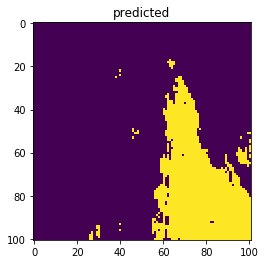

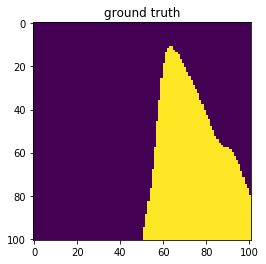

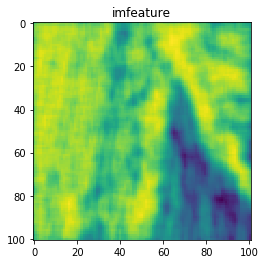

41


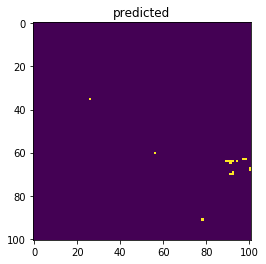

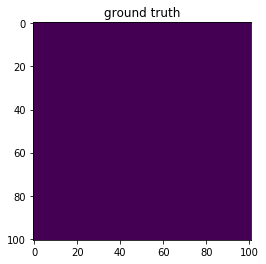

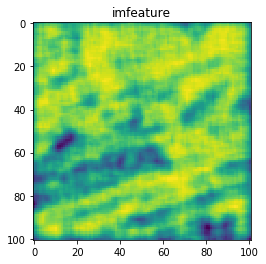

42


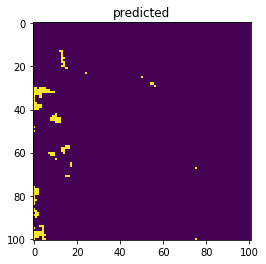

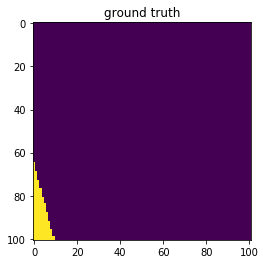

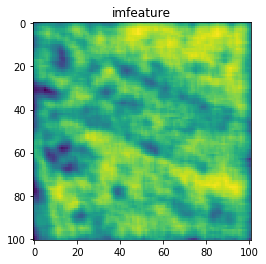

43


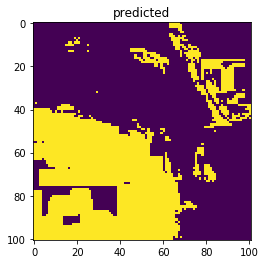

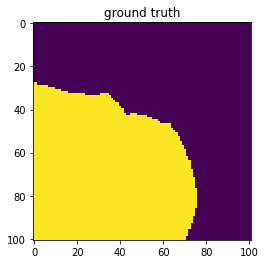

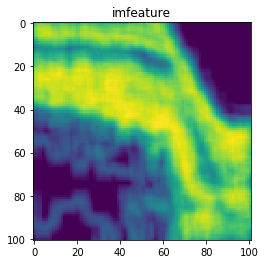

44


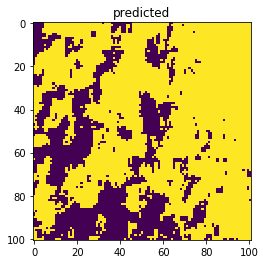

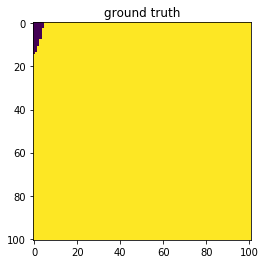

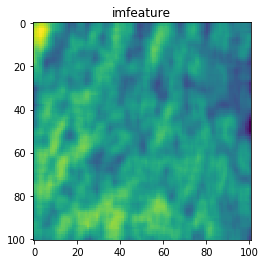

45


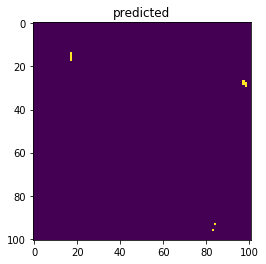

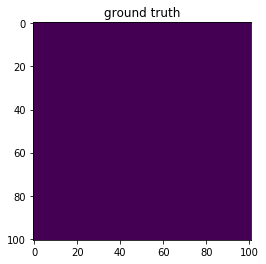

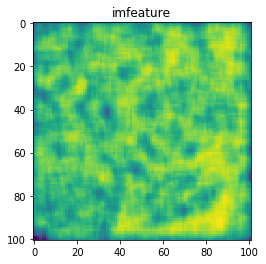

46


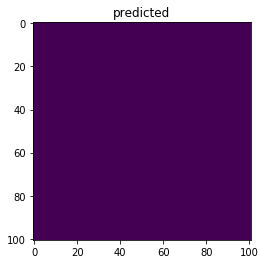

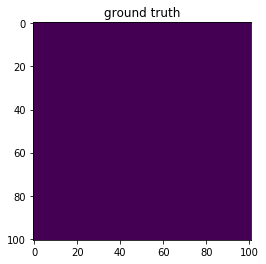

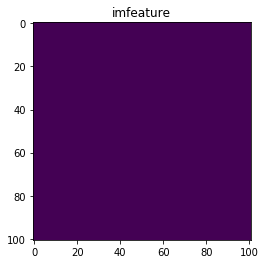

47


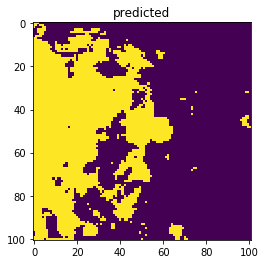

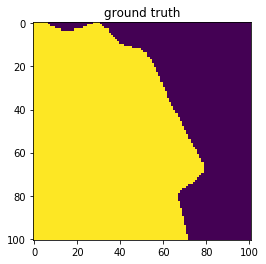

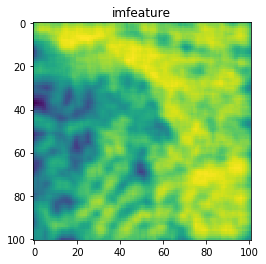

48


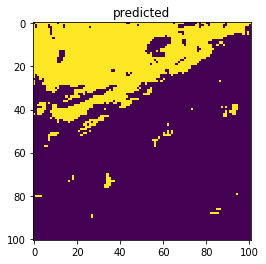

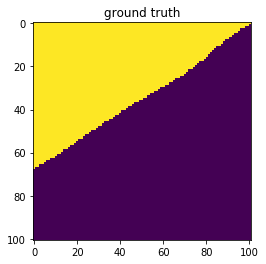

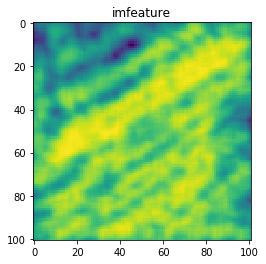

49


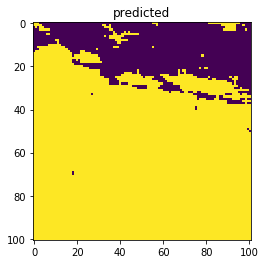

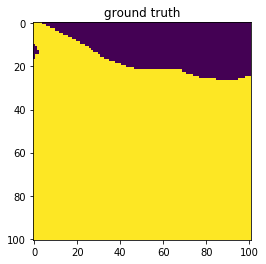

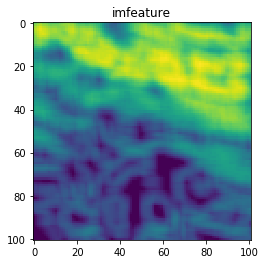

50


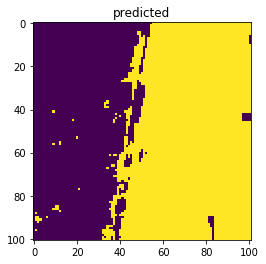

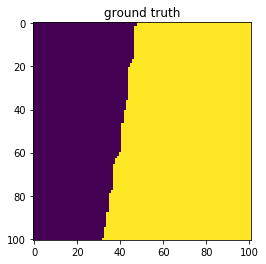

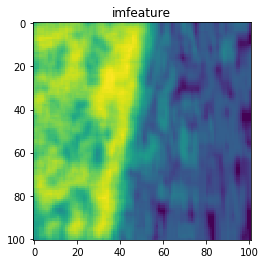

51


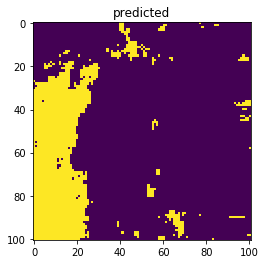

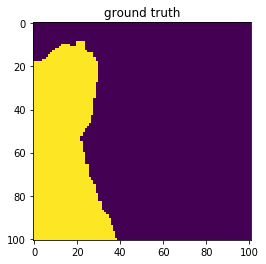

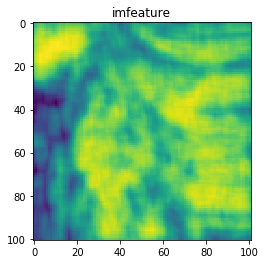

52


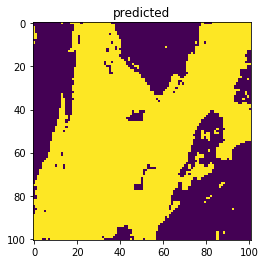

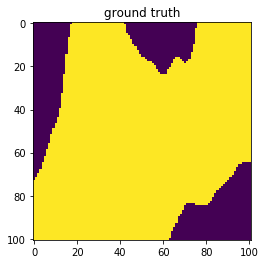

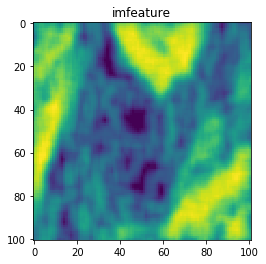

53


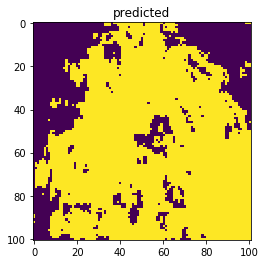

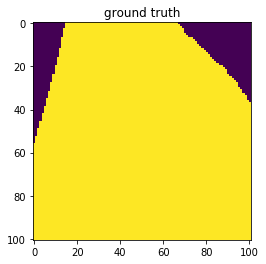

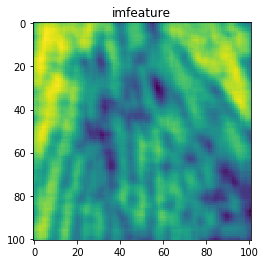

54


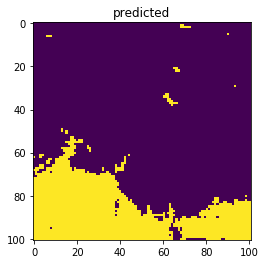

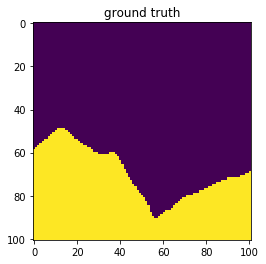

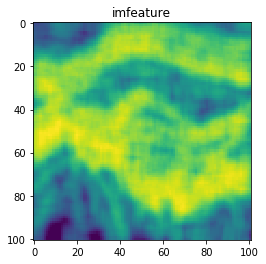

55


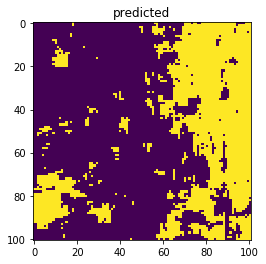

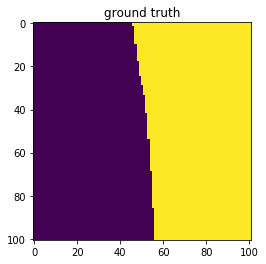

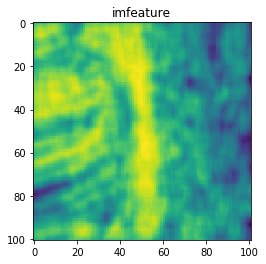

56


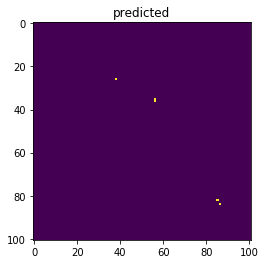

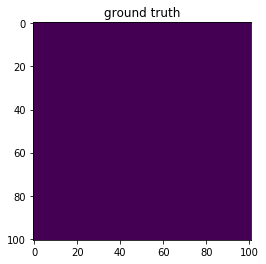

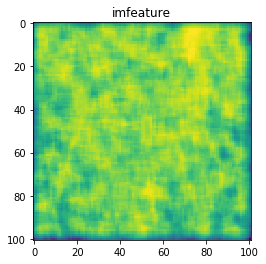

57


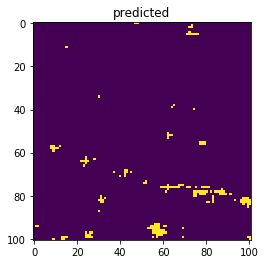

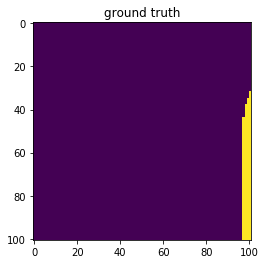

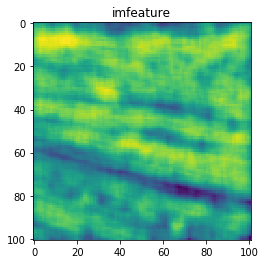

58


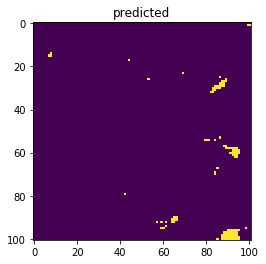

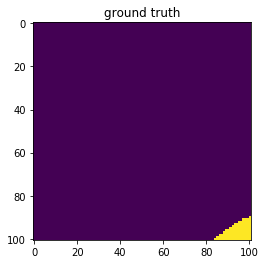

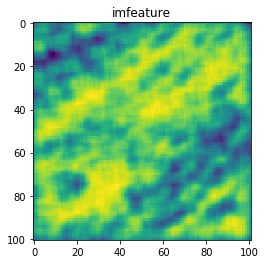

59


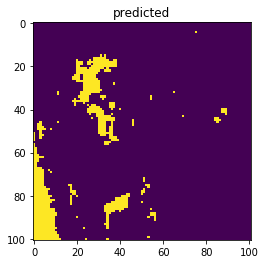

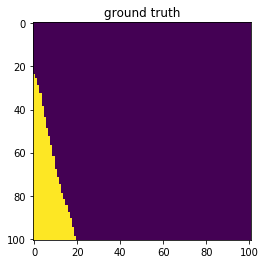

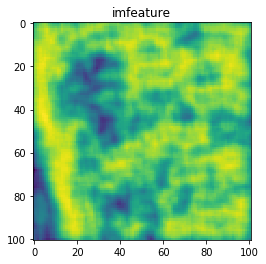

60


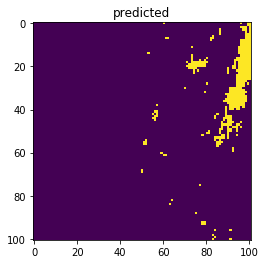

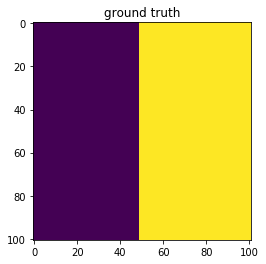

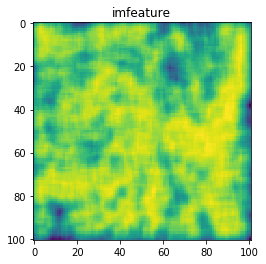

61


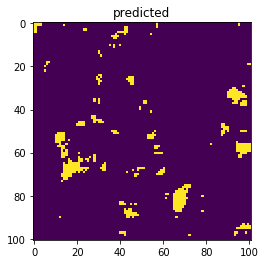

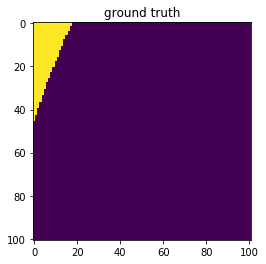

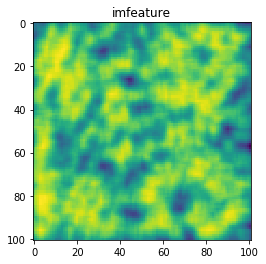

62


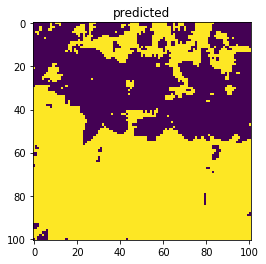

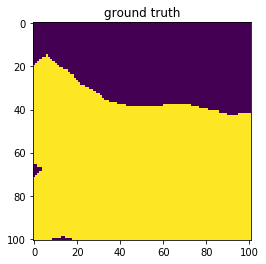

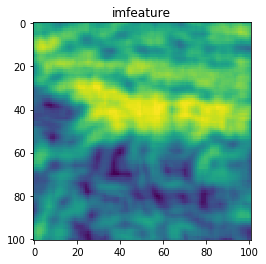

63


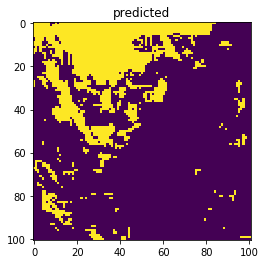

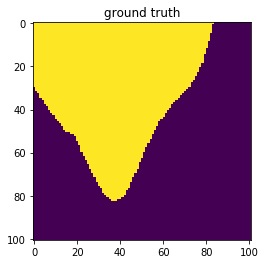

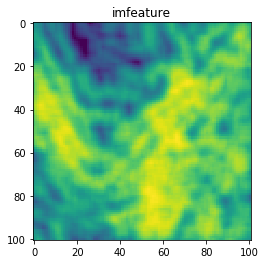

64


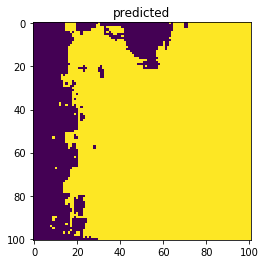

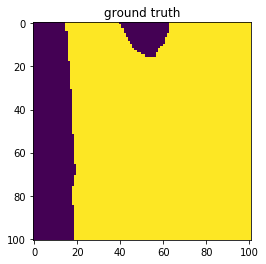

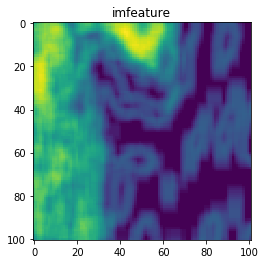

65


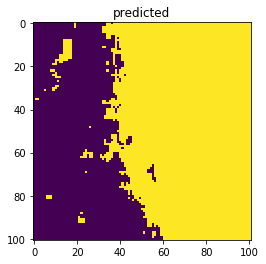

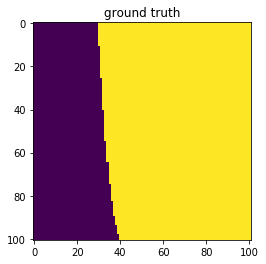

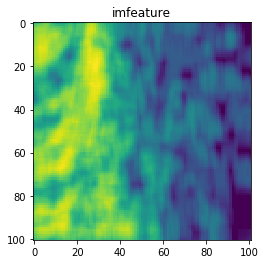

66


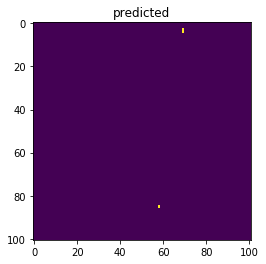

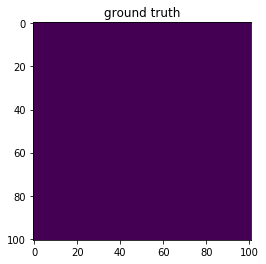

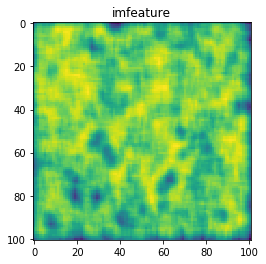

67


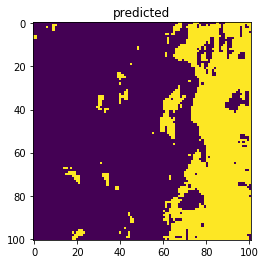

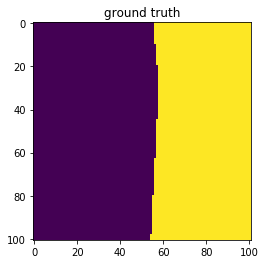

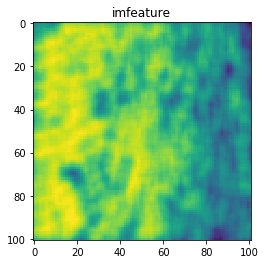

68


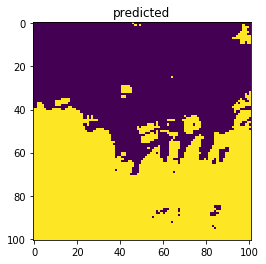

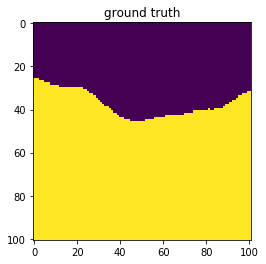

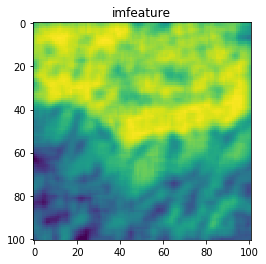

69


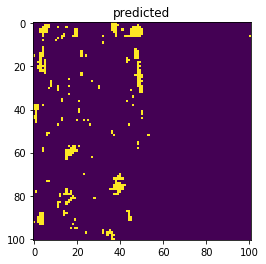

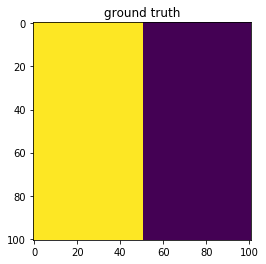

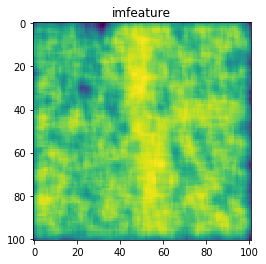

70


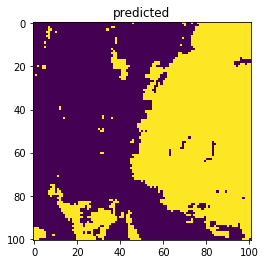

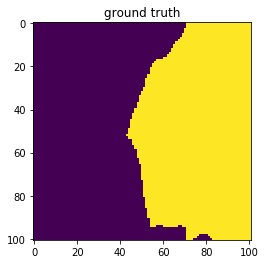

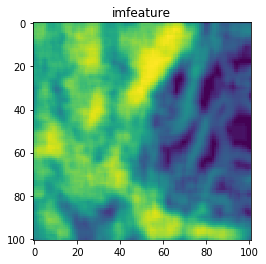

71


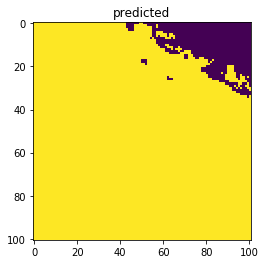

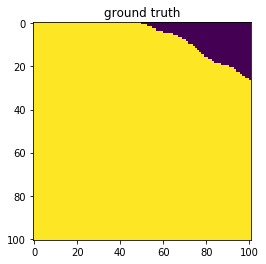

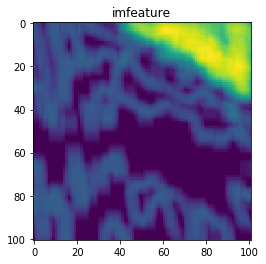

72


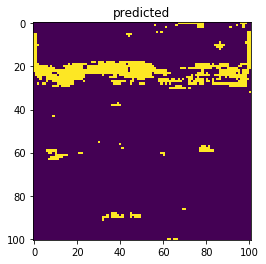

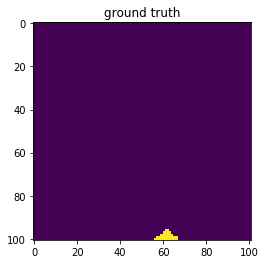

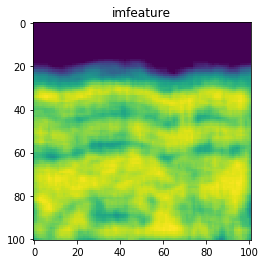

73


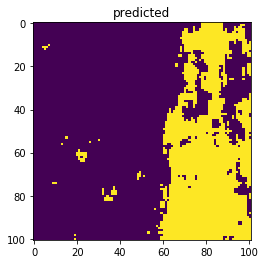

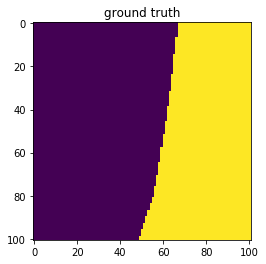

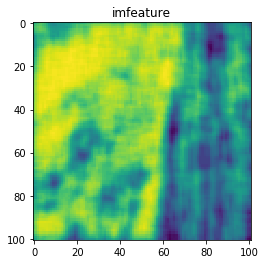

74


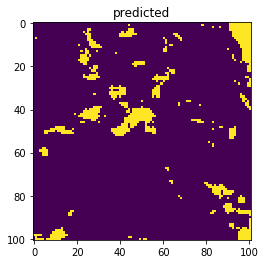

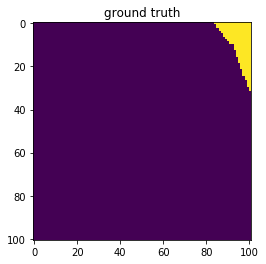

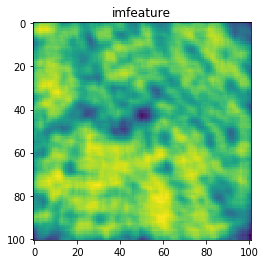

75


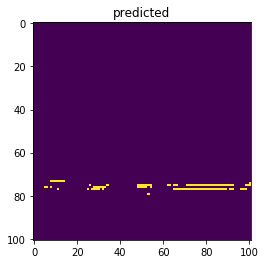

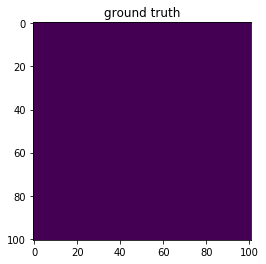

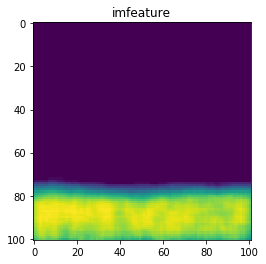

76


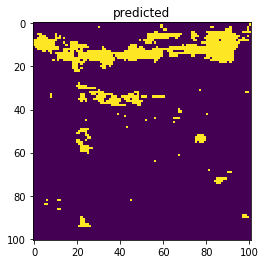

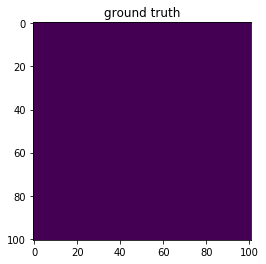

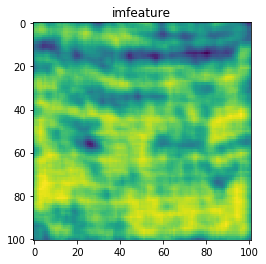

77


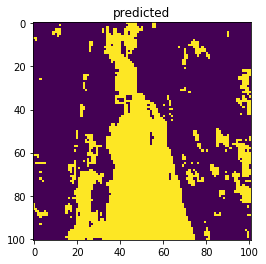

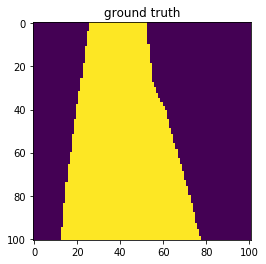

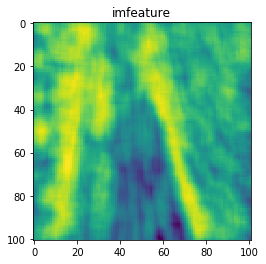

78


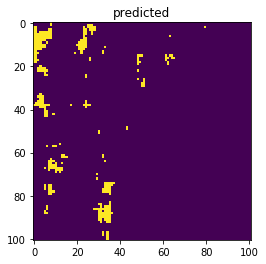

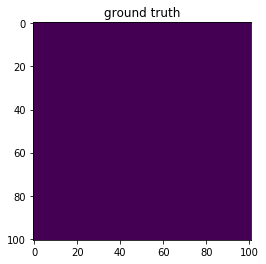

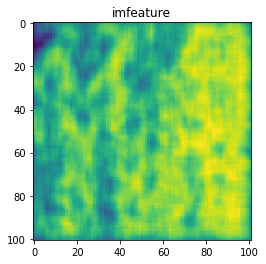

79


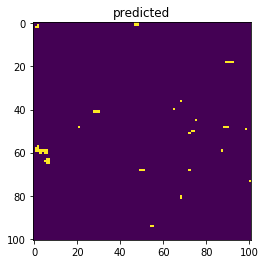

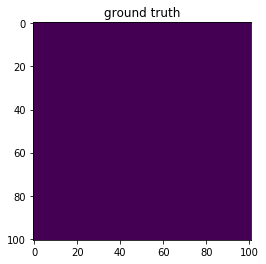

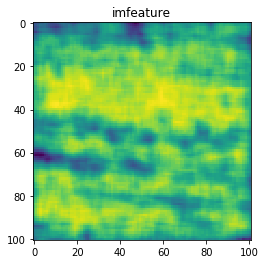

80


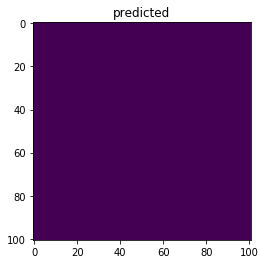

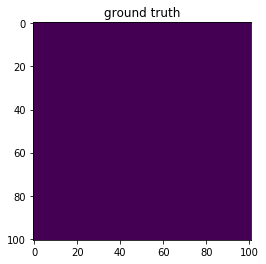

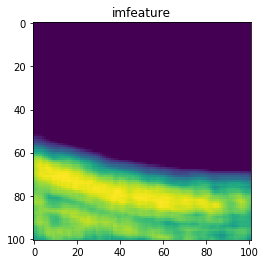

81


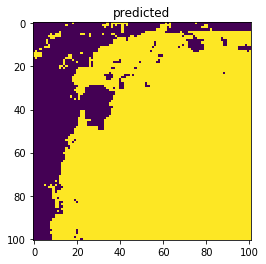

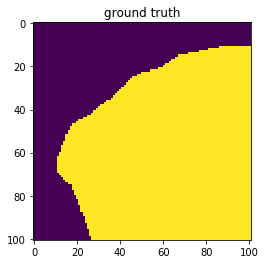

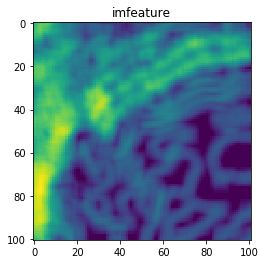

82


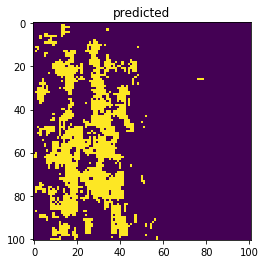

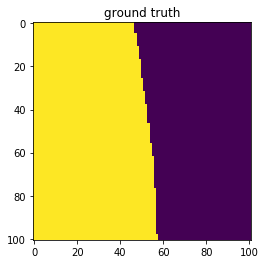

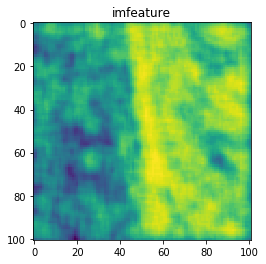

83


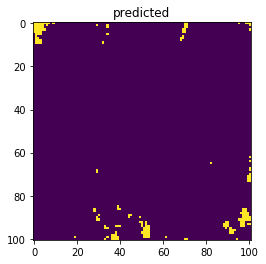

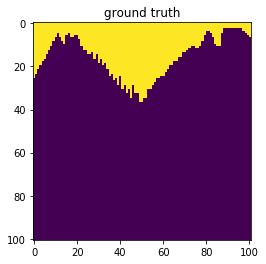

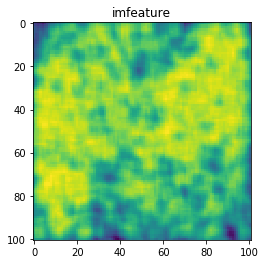

84


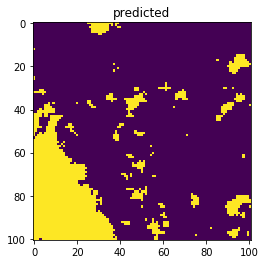

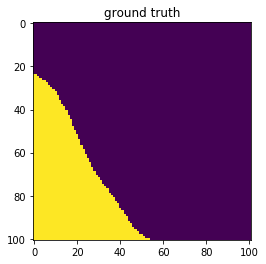

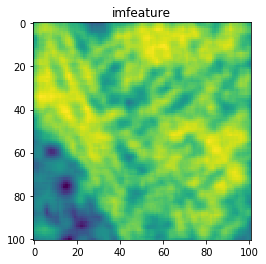

85


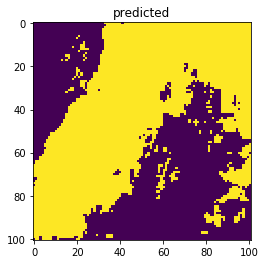

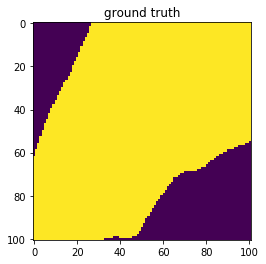

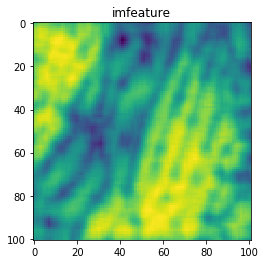

86


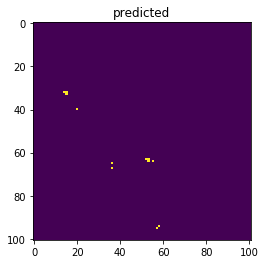

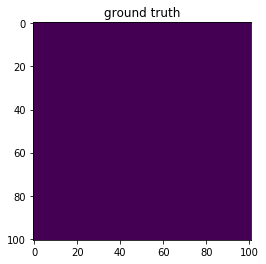

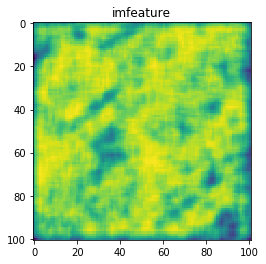

87


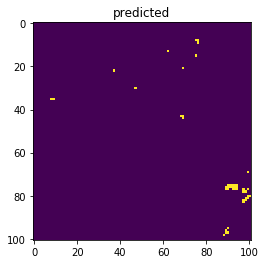

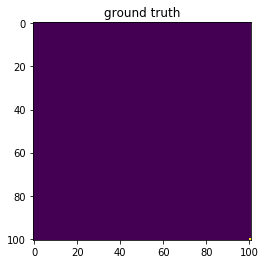

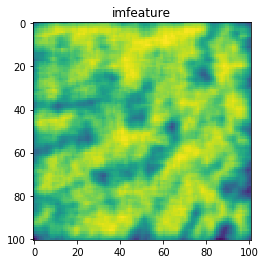

88


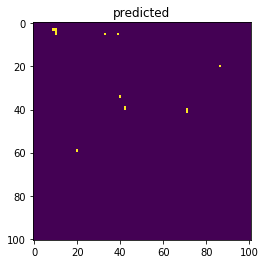

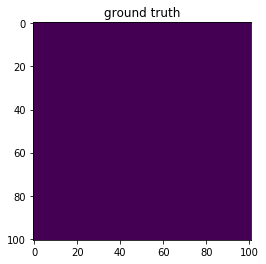

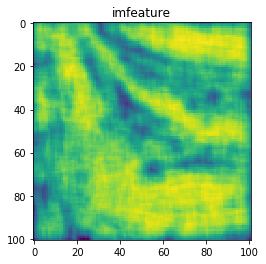

89


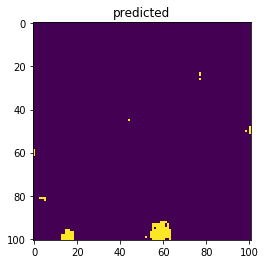

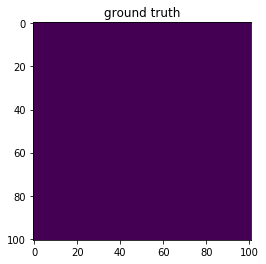

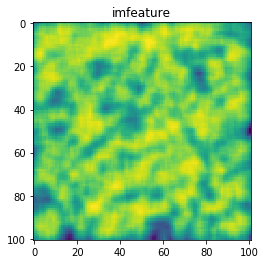

90


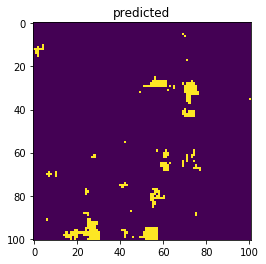

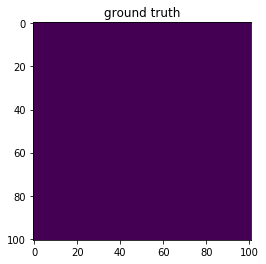

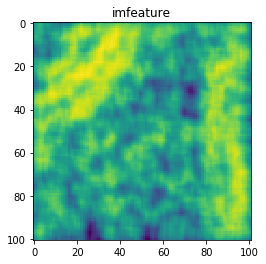

91


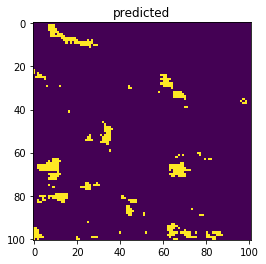

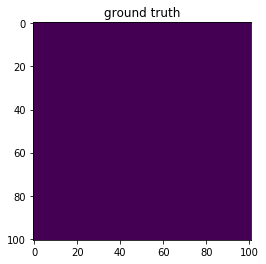

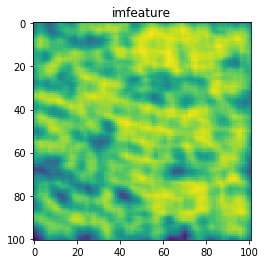

92


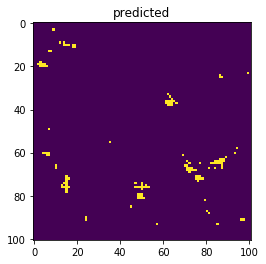

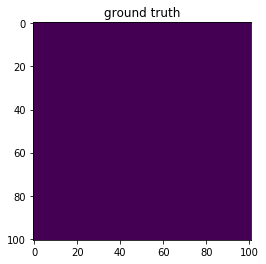

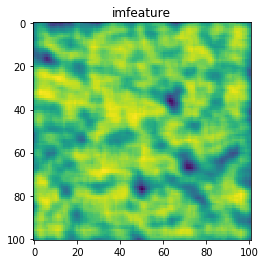

93


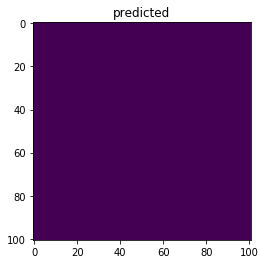

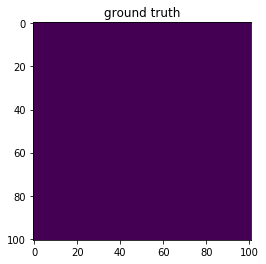

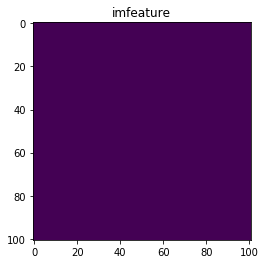

94


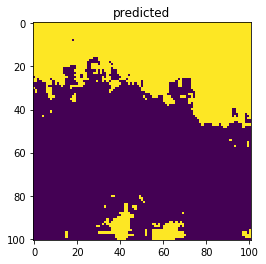

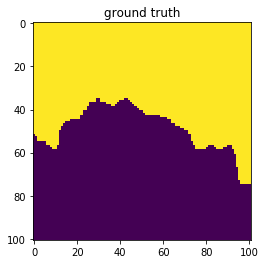

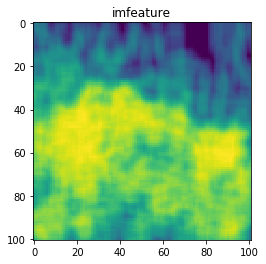

95


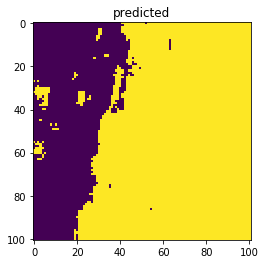

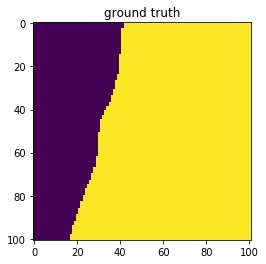

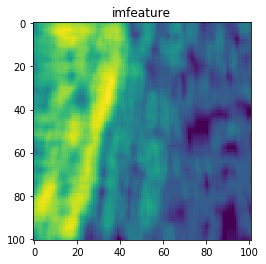

96


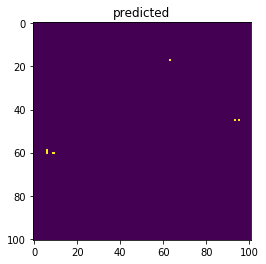

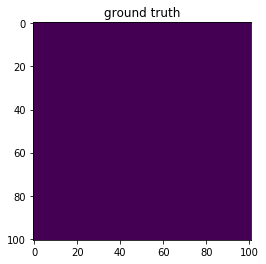

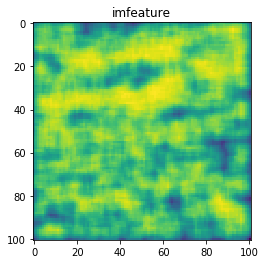

97


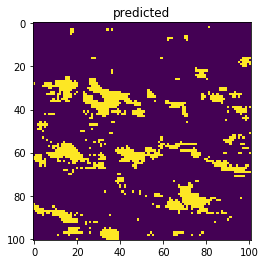

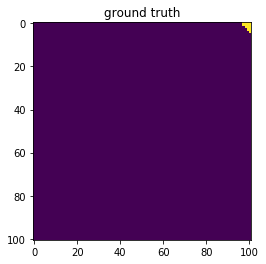

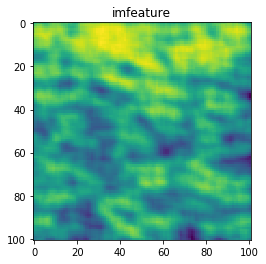

98


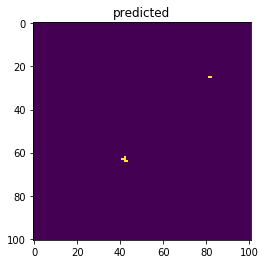

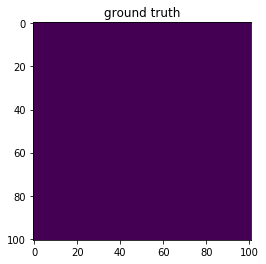

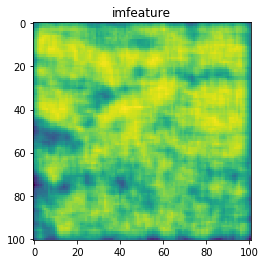

99


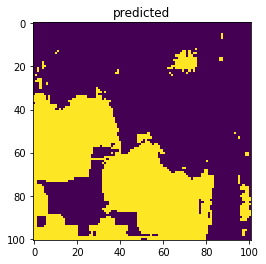

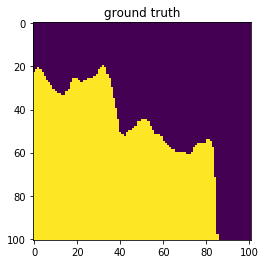

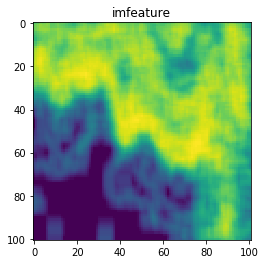

100


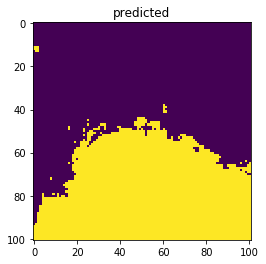

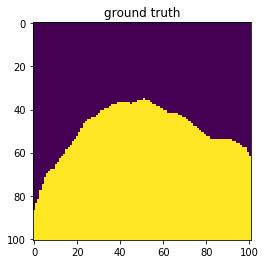

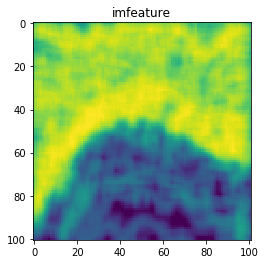

In [571]:
for i, (real, pred, feat) in enumerate(zip(real_ims, pred_imgs, features)):
    print(i+1)
    plt.title('predicted')
    plt.imshow(pred)
   
    plt.show()
    
    plt.title('ground truth')
    plt.imshow(real)
    
    plt.show()
    plt.title('imfeature')
    plt.imshow(feat[..., 1])
    plt.show()
    

1


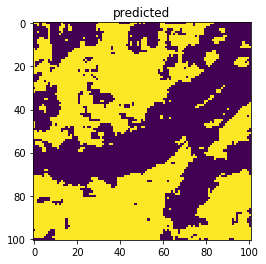

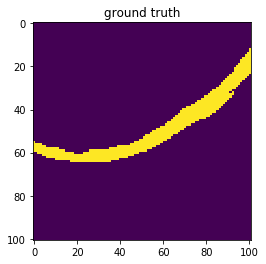

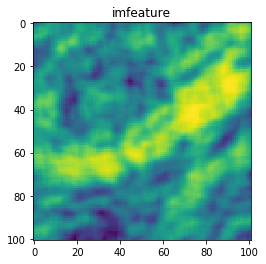

2


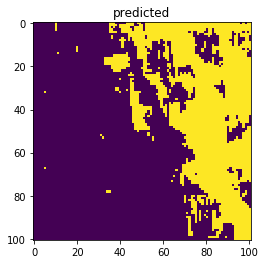

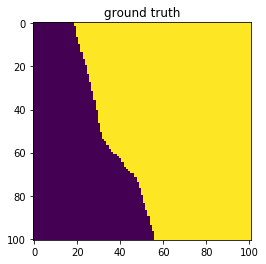

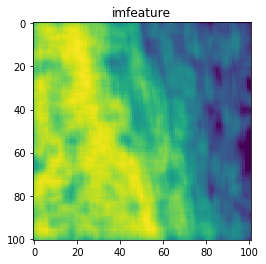

3


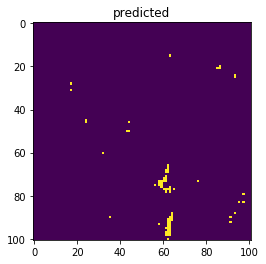

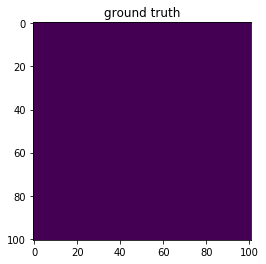

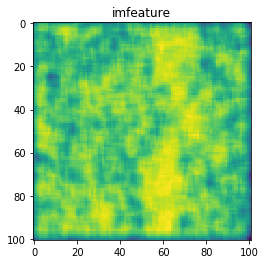

4


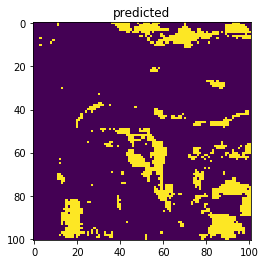

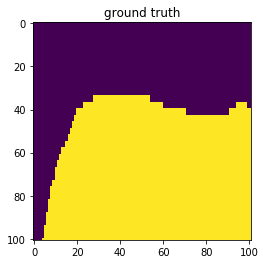

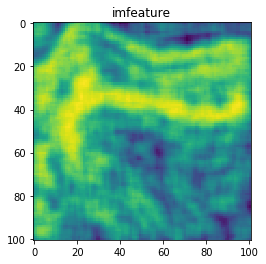

5


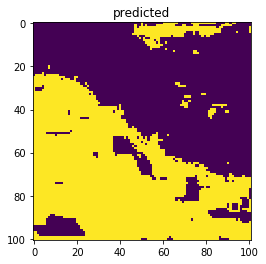

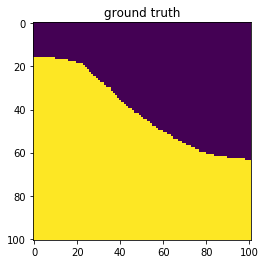

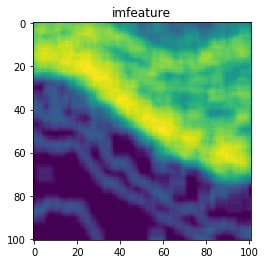

6


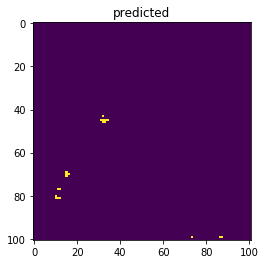

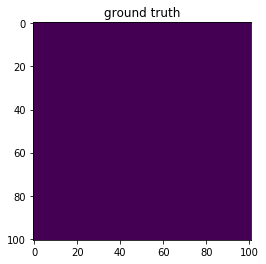

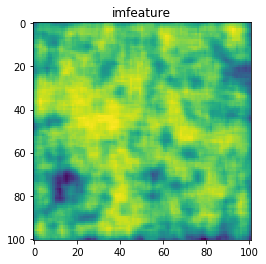

7


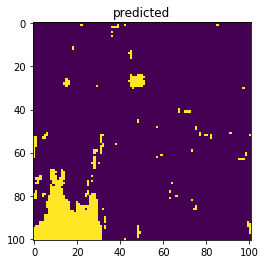

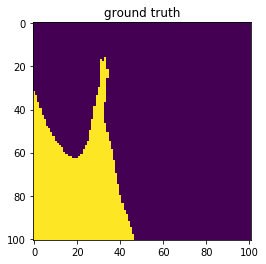

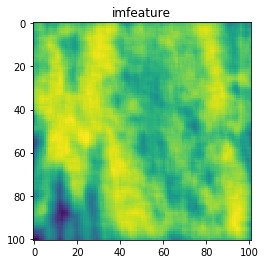

8


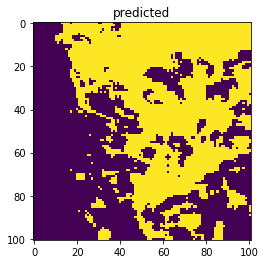

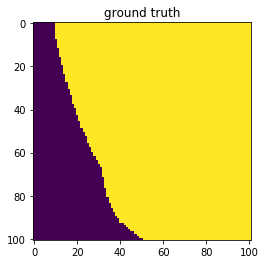

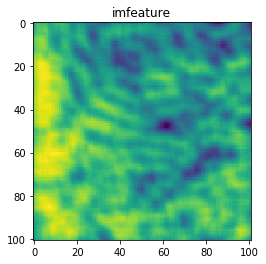

9


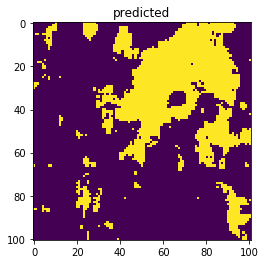

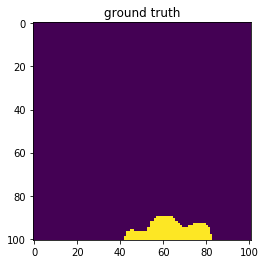

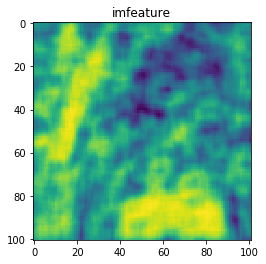

10


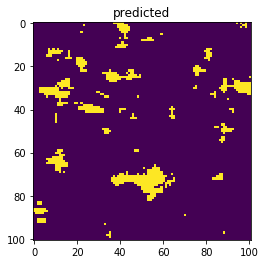

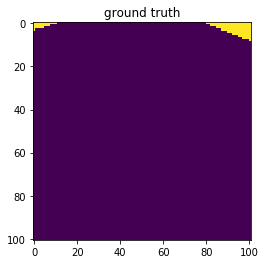

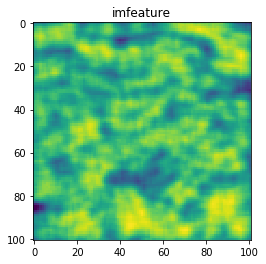

11


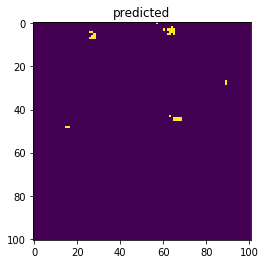

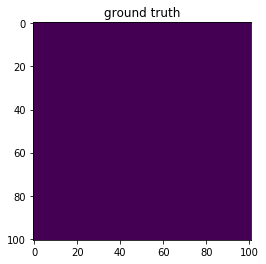

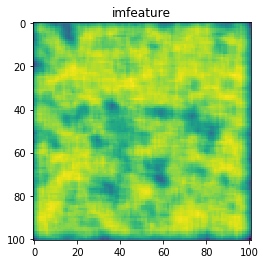

12


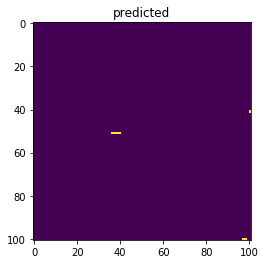

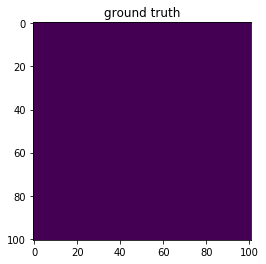

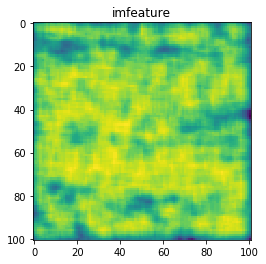

13


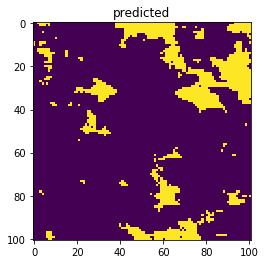

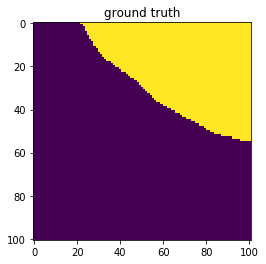

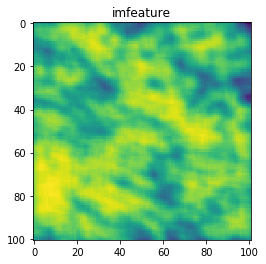

14


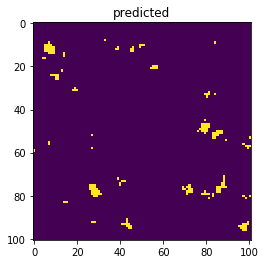

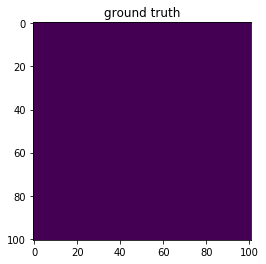

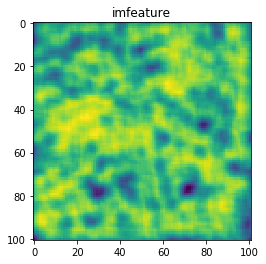

15


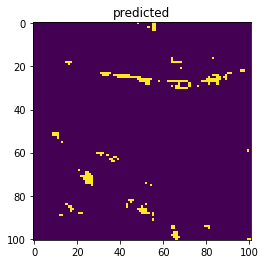

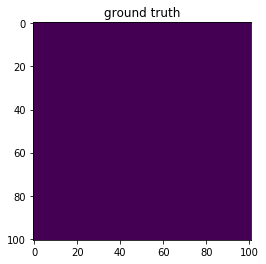

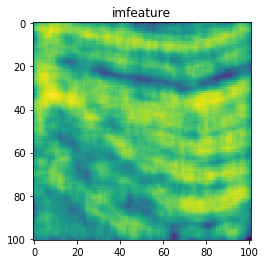

16


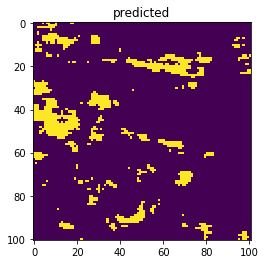

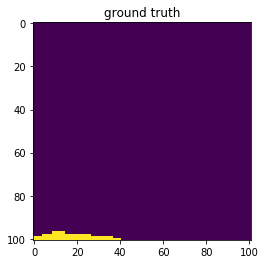

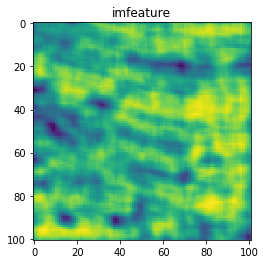

17


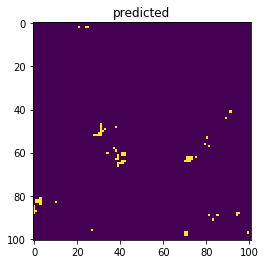

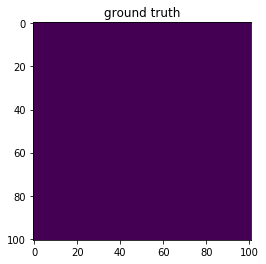

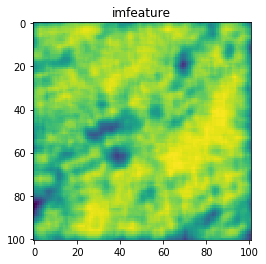

18


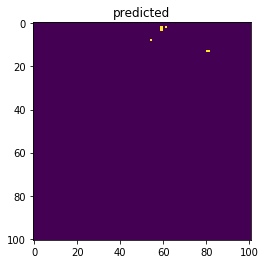

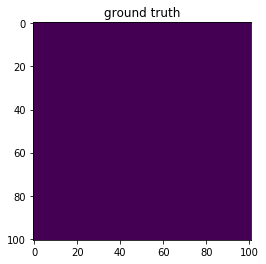

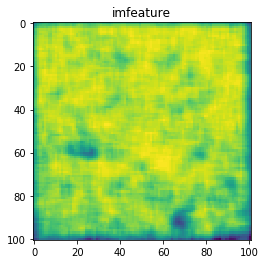

19


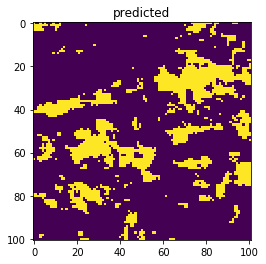

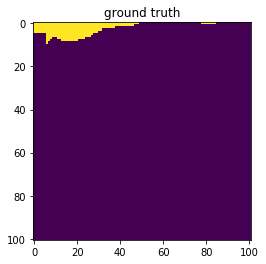

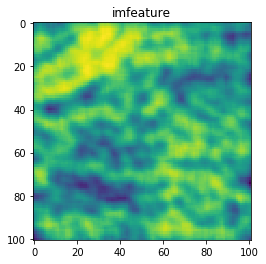

20


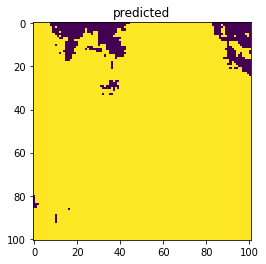

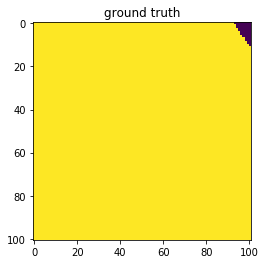

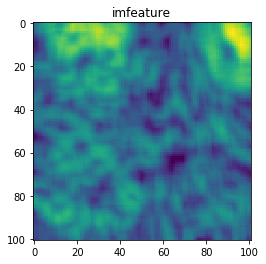

21


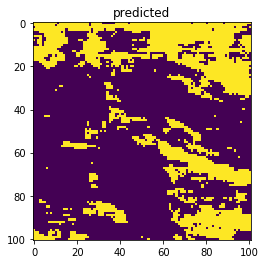

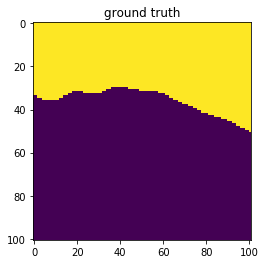

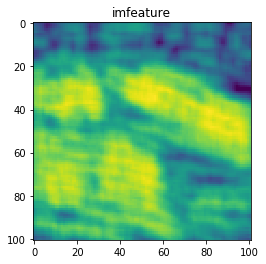

22


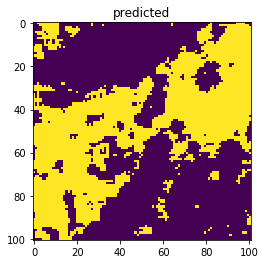

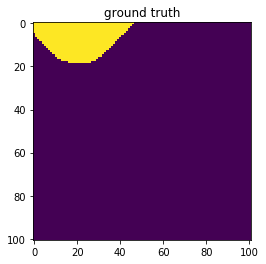

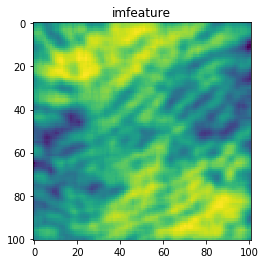

23


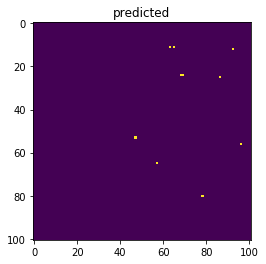

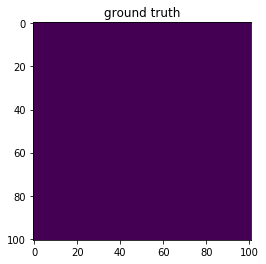

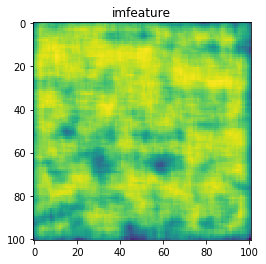

24


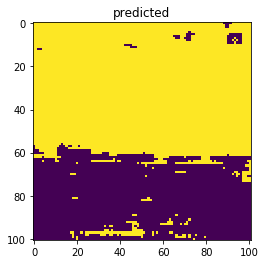

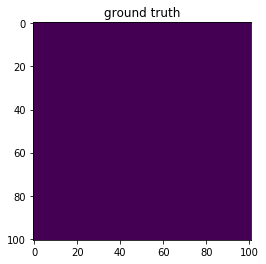

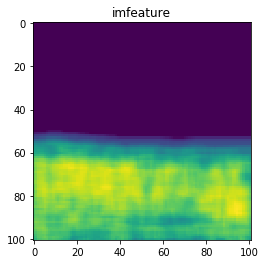

25


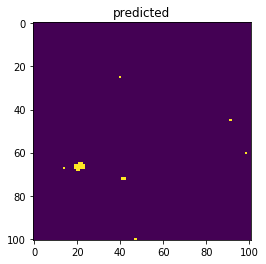

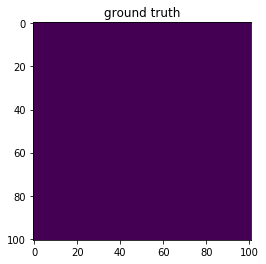

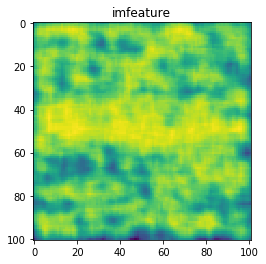

26


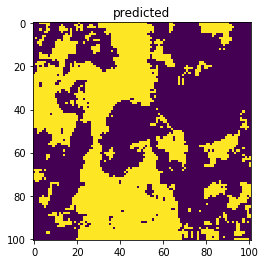

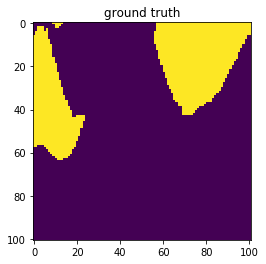

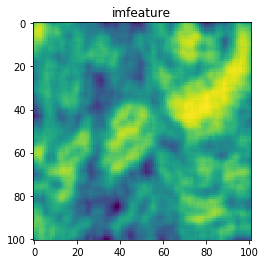

27


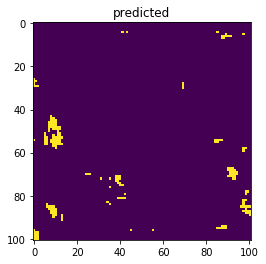

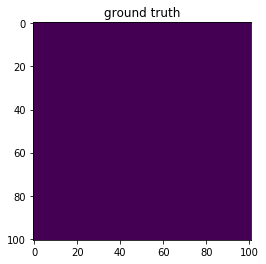

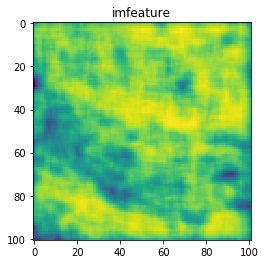

28


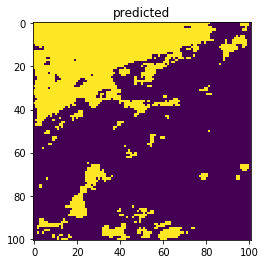

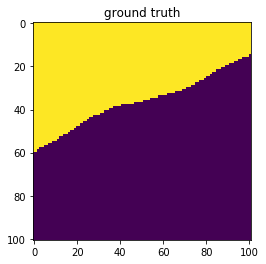

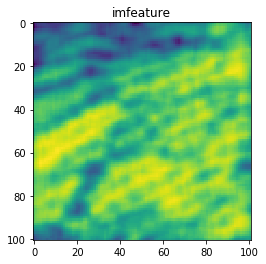

29


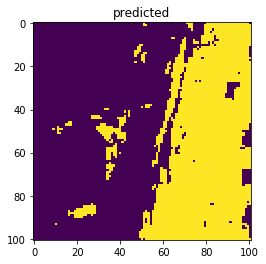

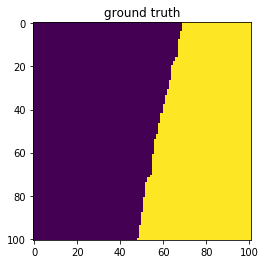

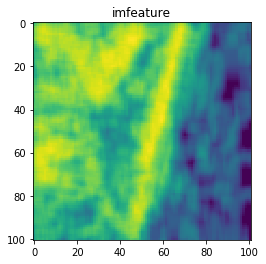

30


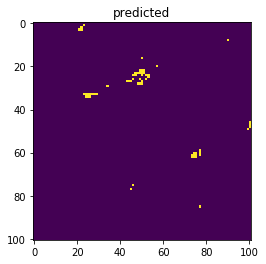

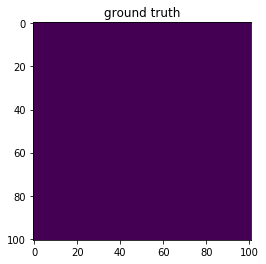

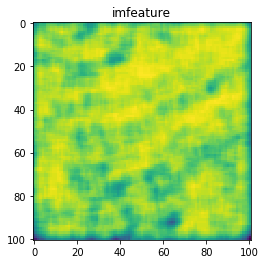

31


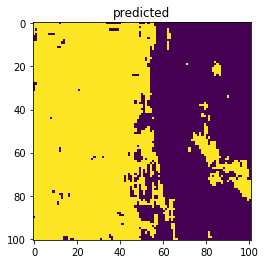

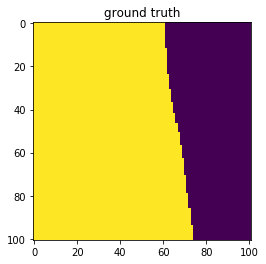

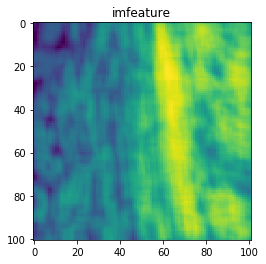

32


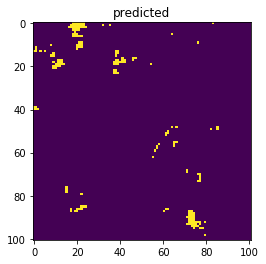

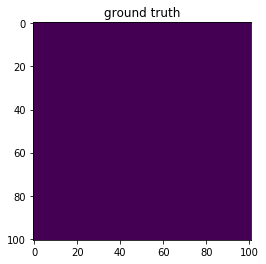

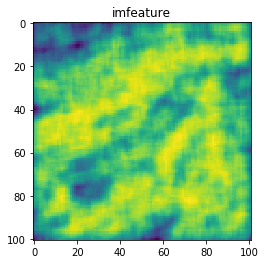

33


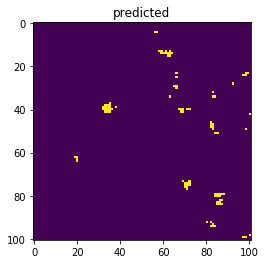

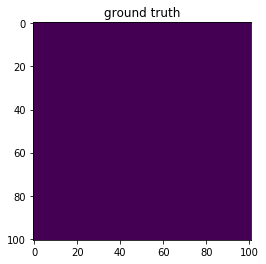

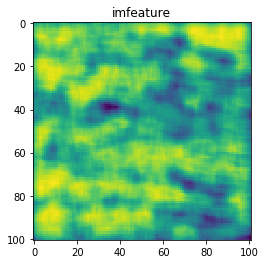

34


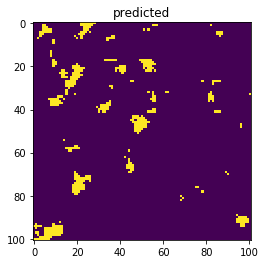

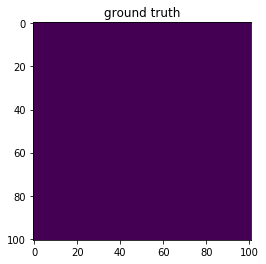

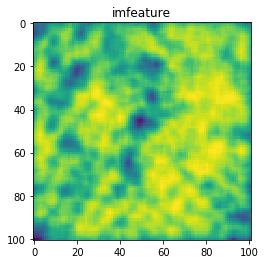

35


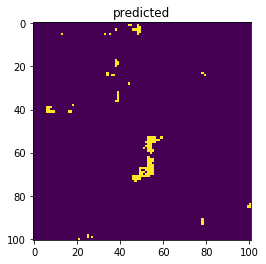

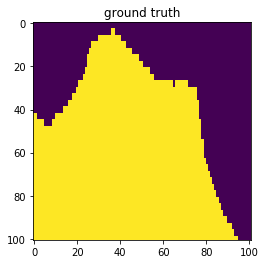

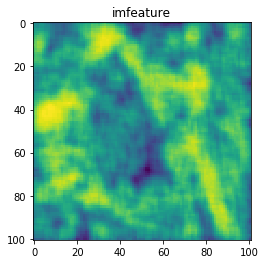

36


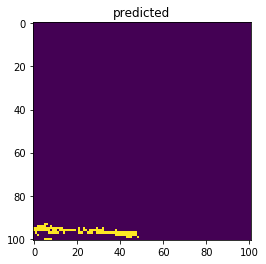

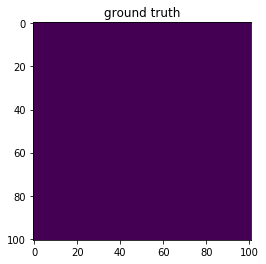

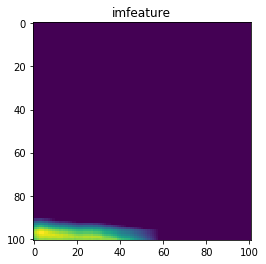

37


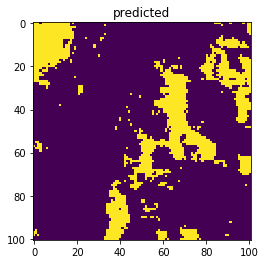

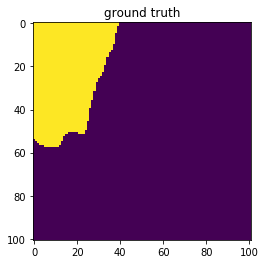

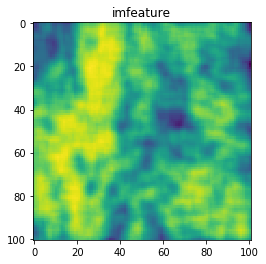

38


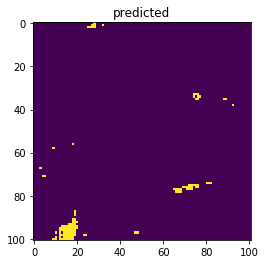

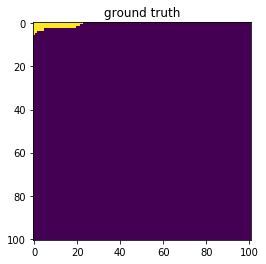

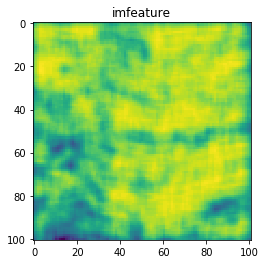

39


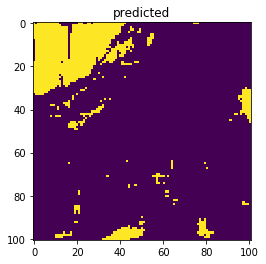

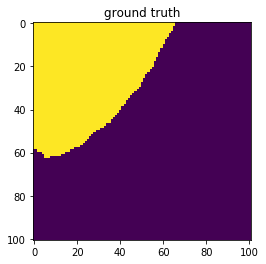

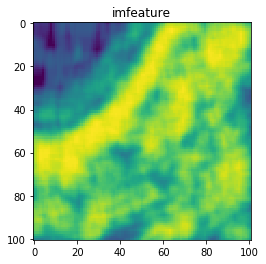

40


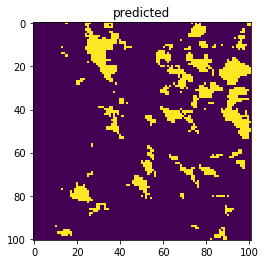

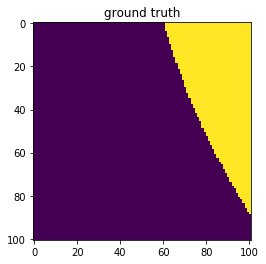

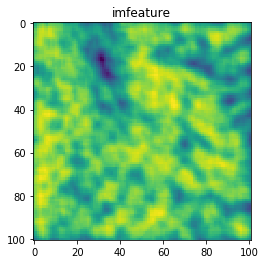

41


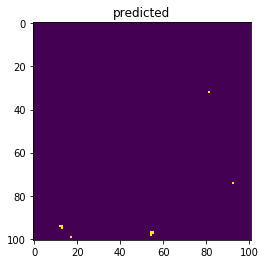

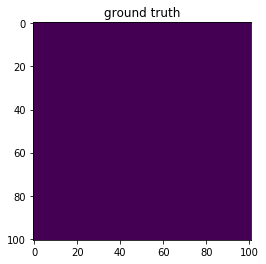

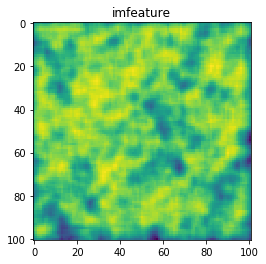

42


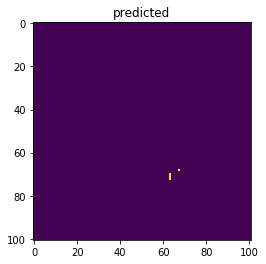

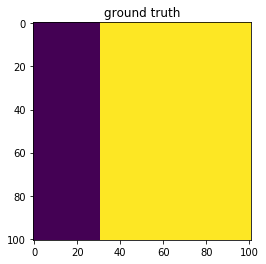

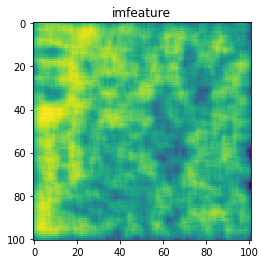

43


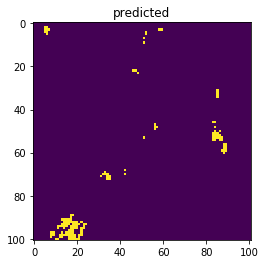

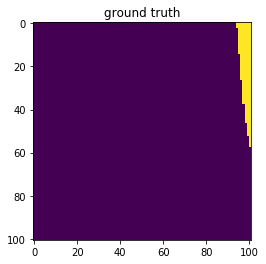

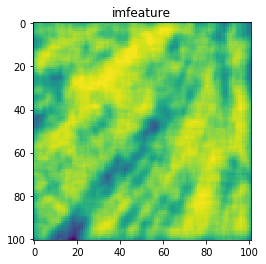

44


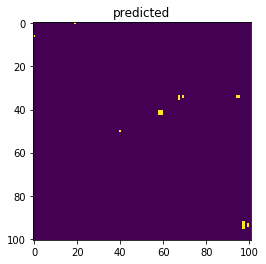

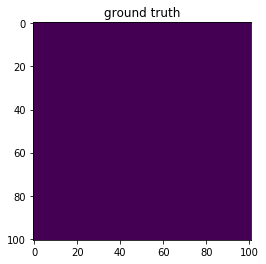

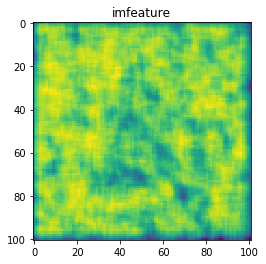

45


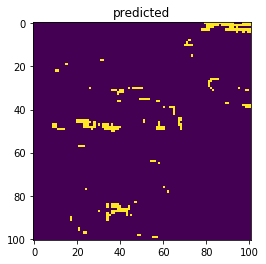

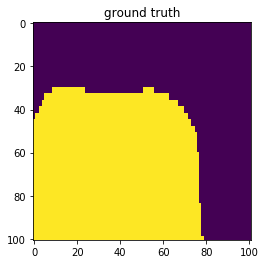

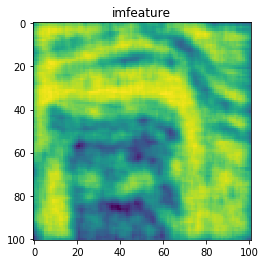

46


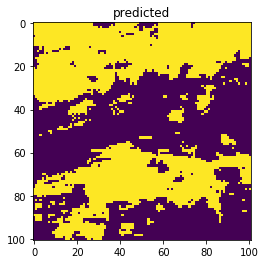

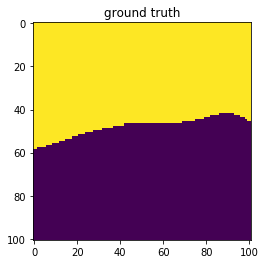

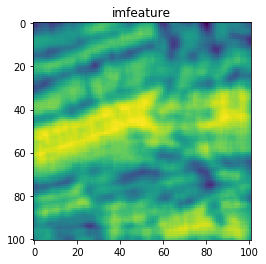

47


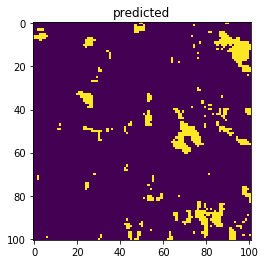

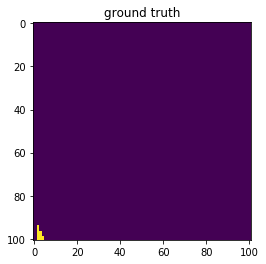

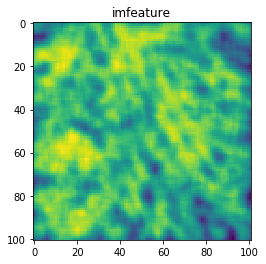

48


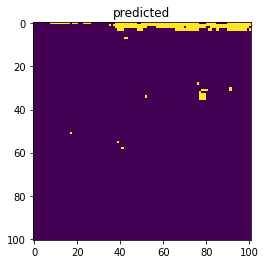

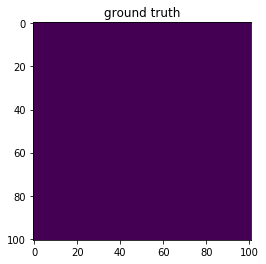

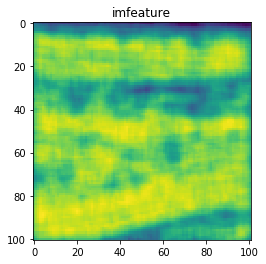

49


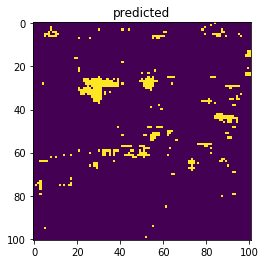

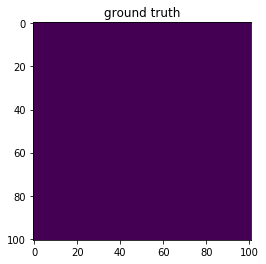

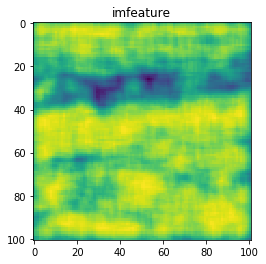

50


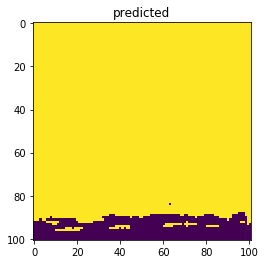

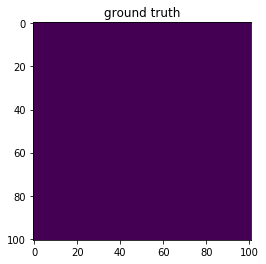

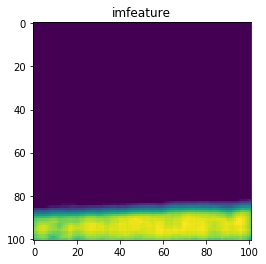

51


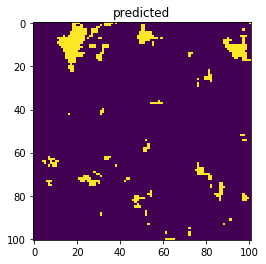

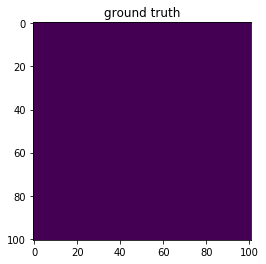

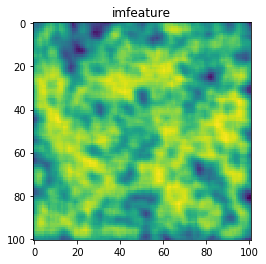

52


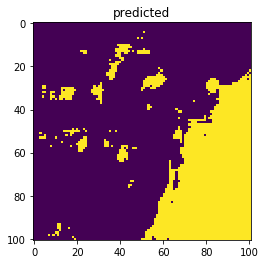

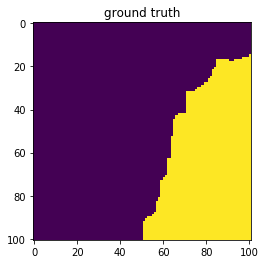

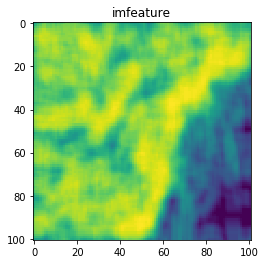

53


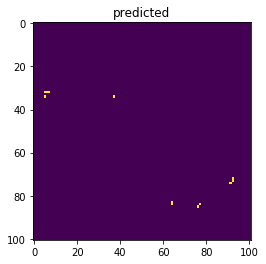

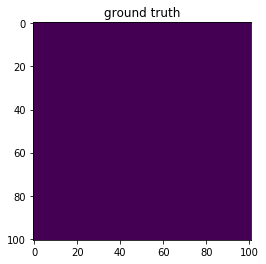

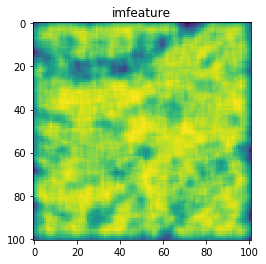

54


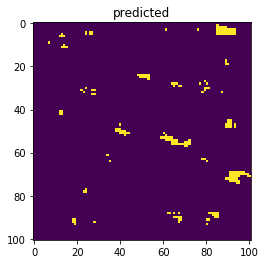

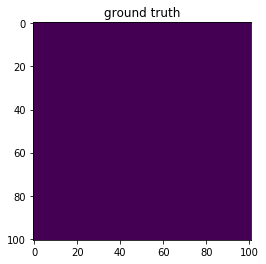

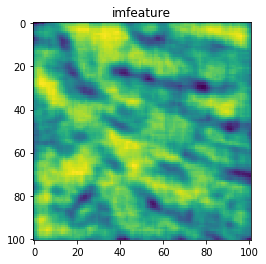

55


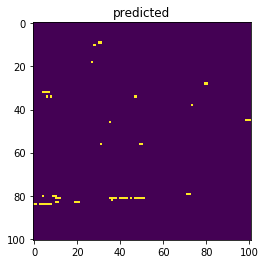

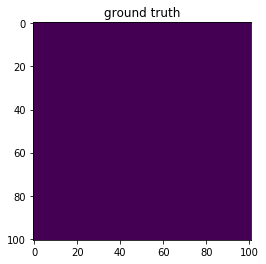

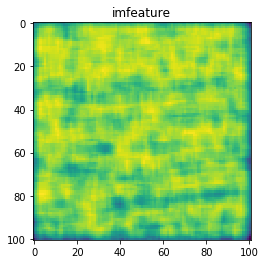

56


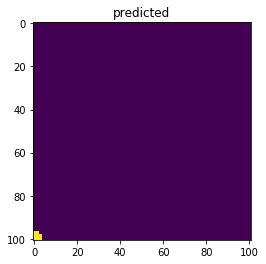

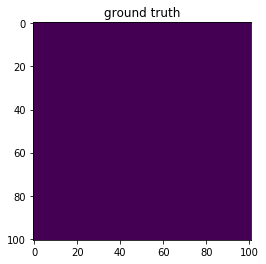

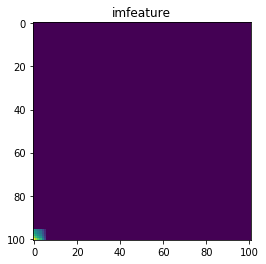

57


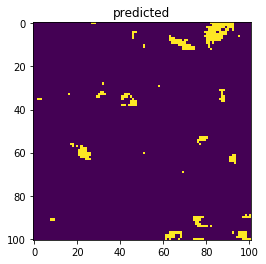

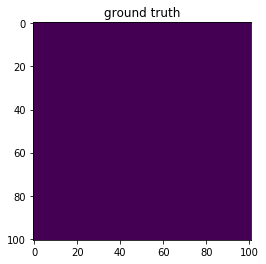

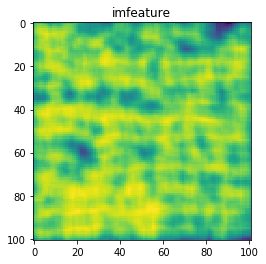

58


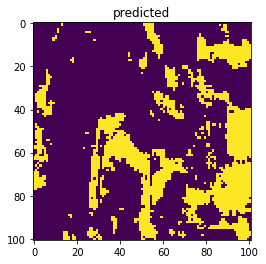

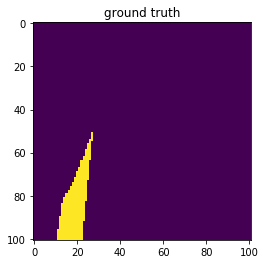

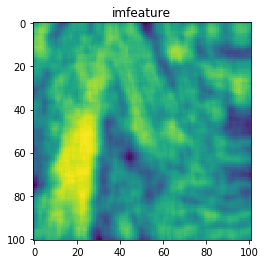

59


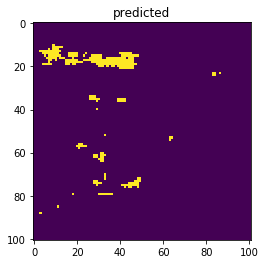

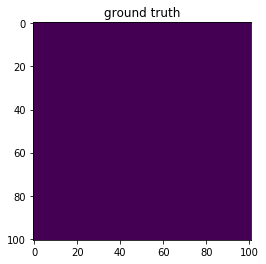

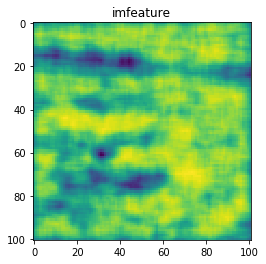

60


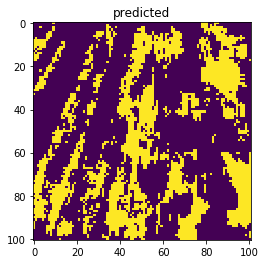

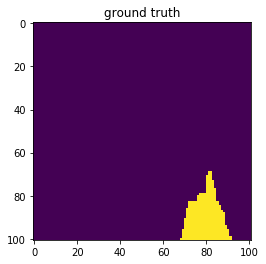

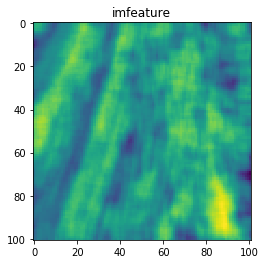

61


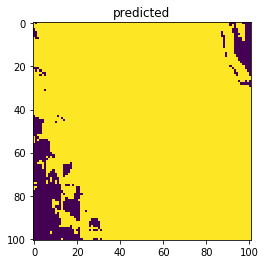

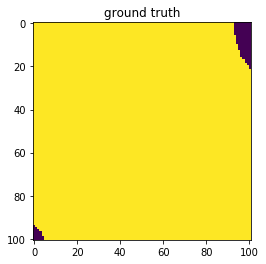

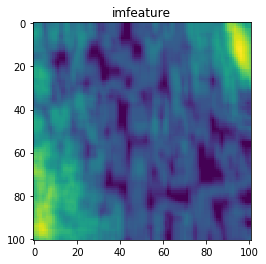

62


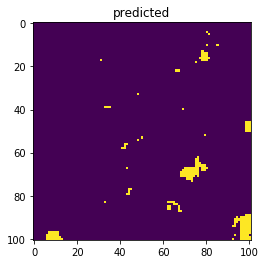

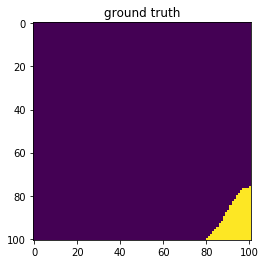

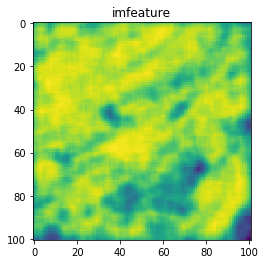

63


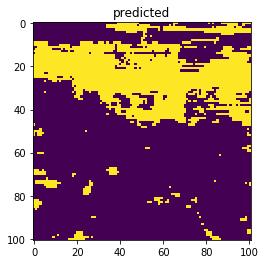

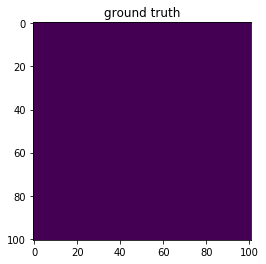

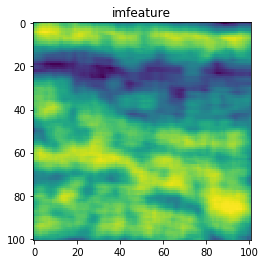

64


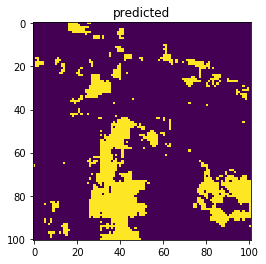

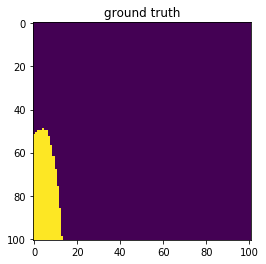

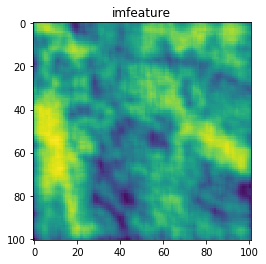

65


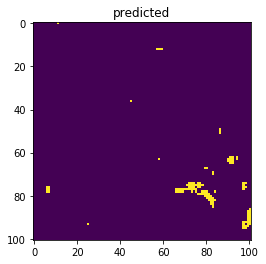

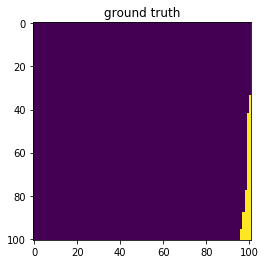

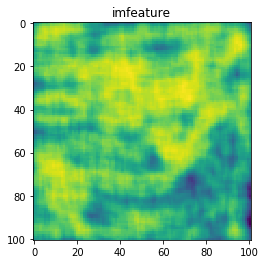

66


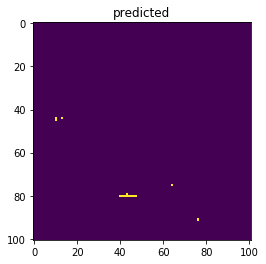

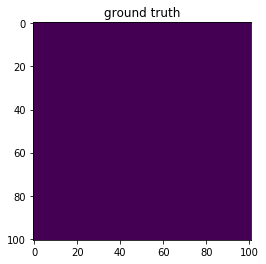

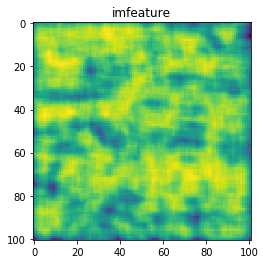

67


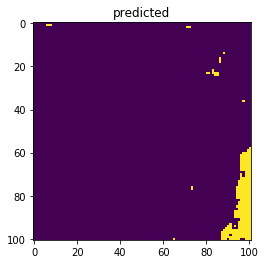

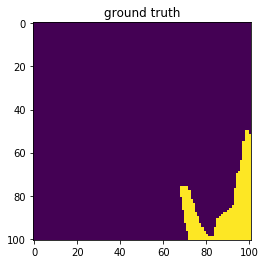

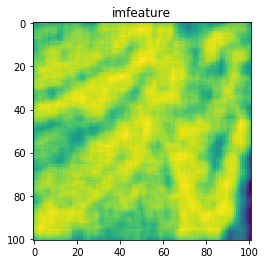

68


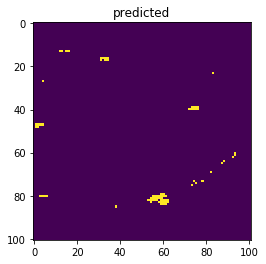

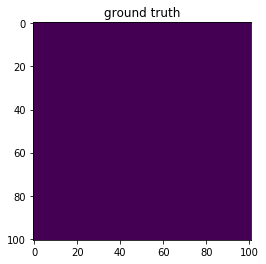

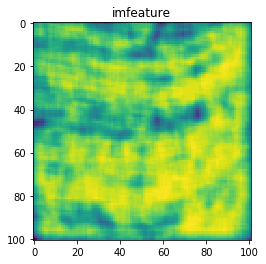

69


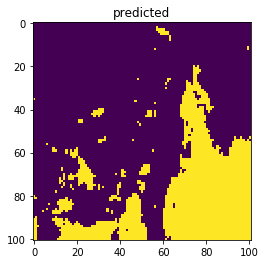

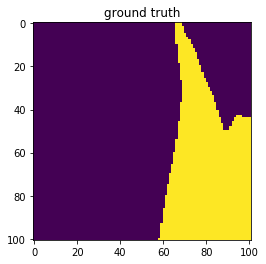

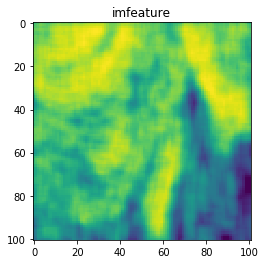

70


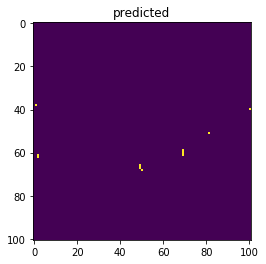

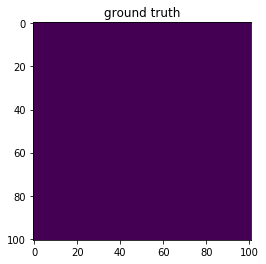

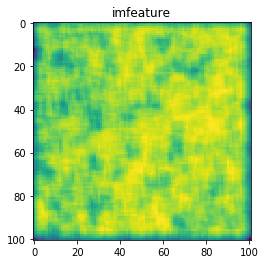

71


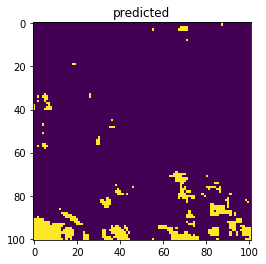

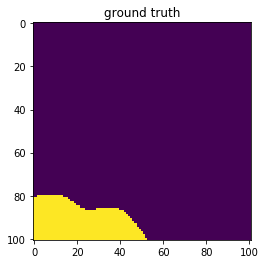

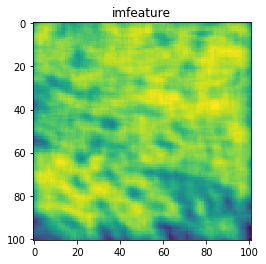

72


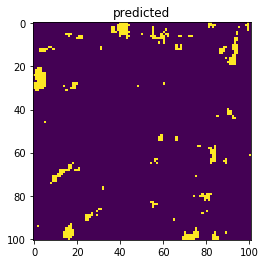

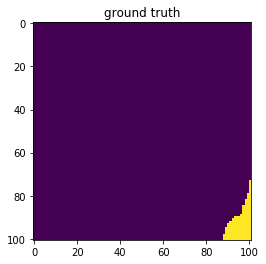

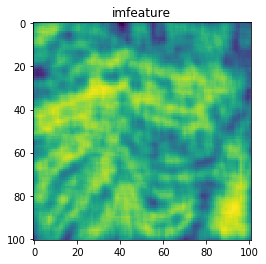

73


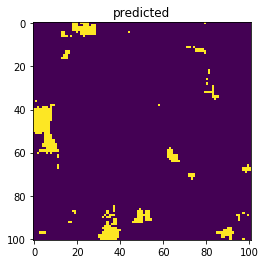

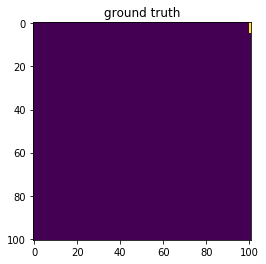

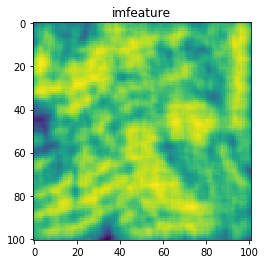

74


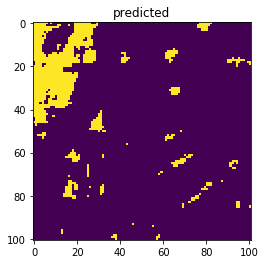

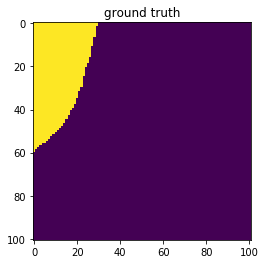

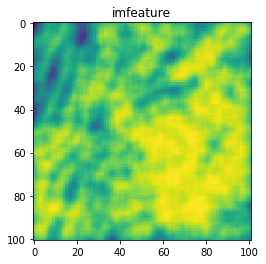

75


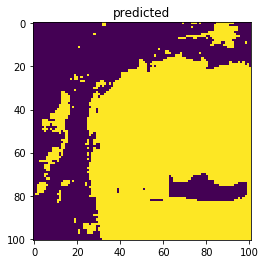

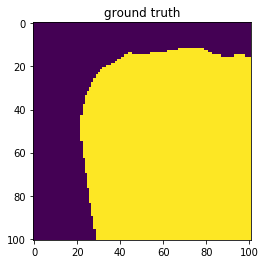

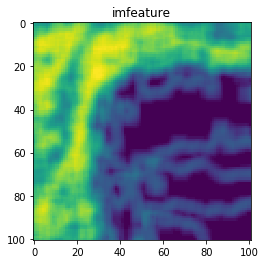

76


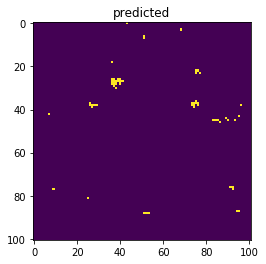

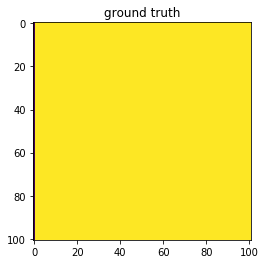

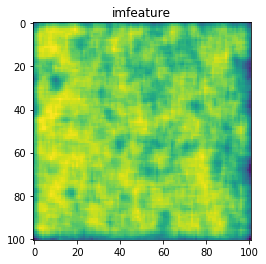

77


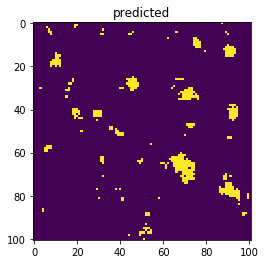

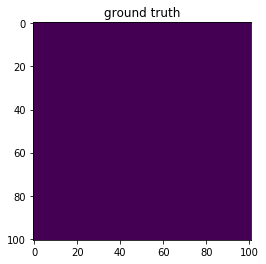

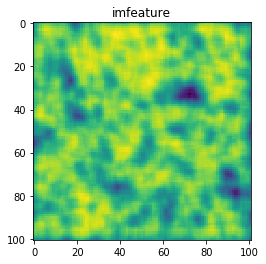

78


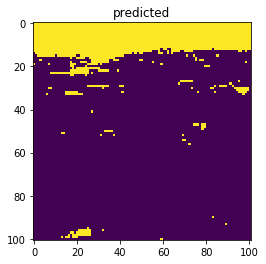

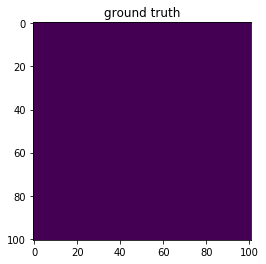

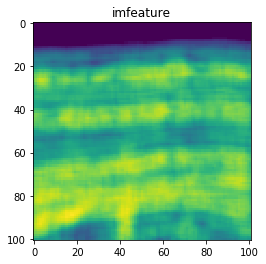

79


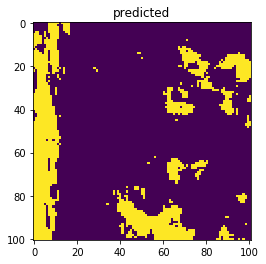

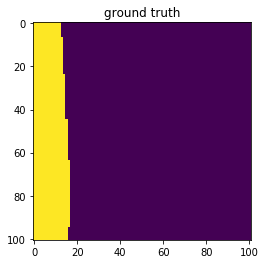

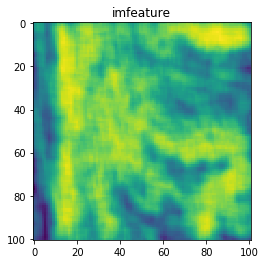

80


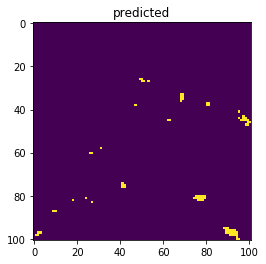

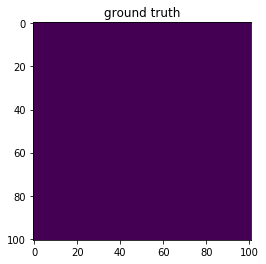

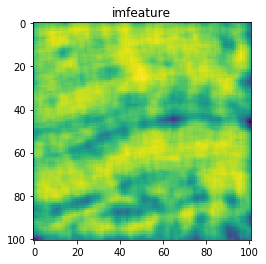

81


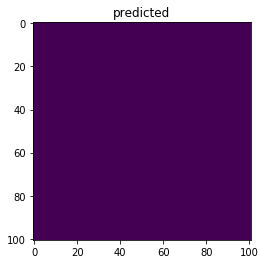

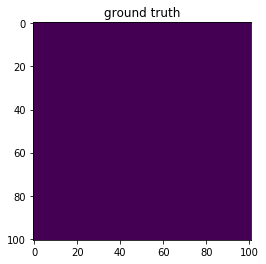

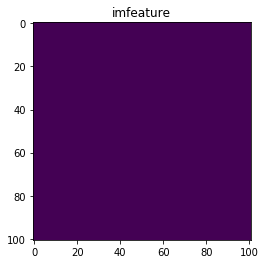

82


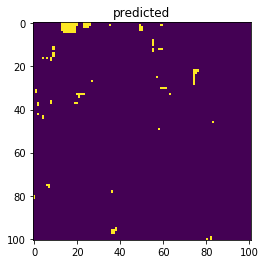

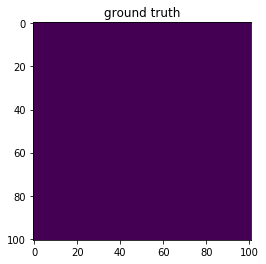

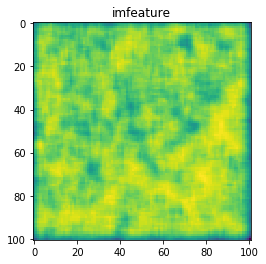

83


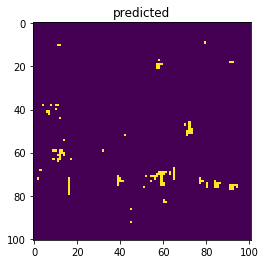

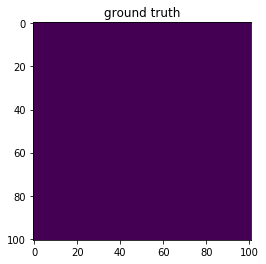

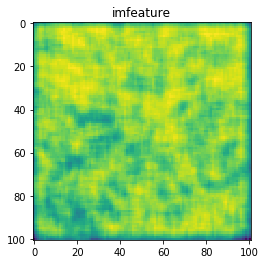

84


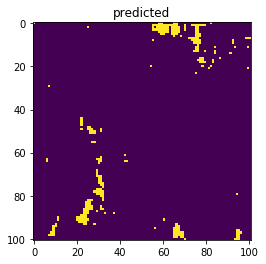

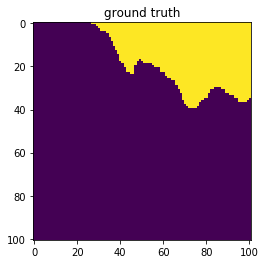

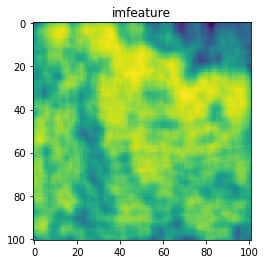

85


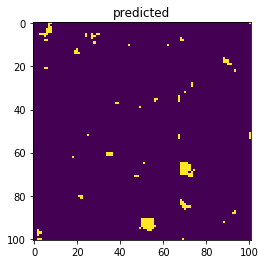

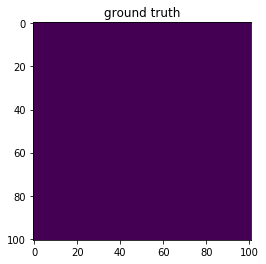

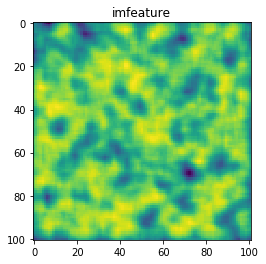

86


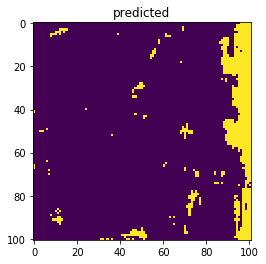

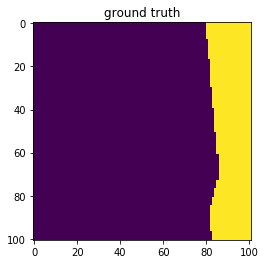

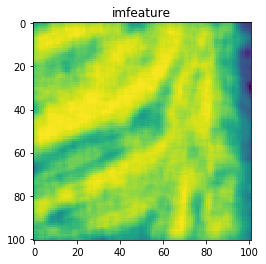

87


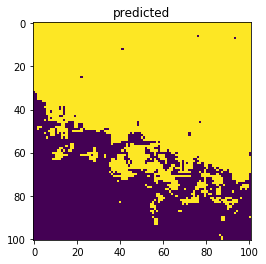

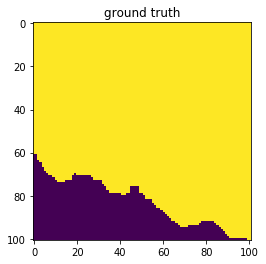

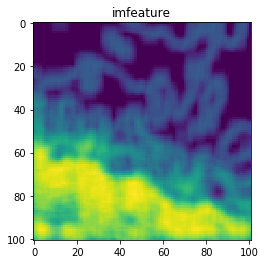

88


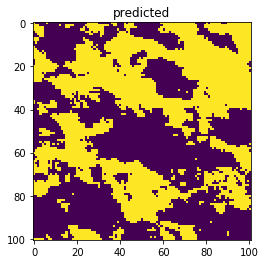

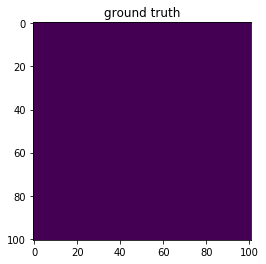

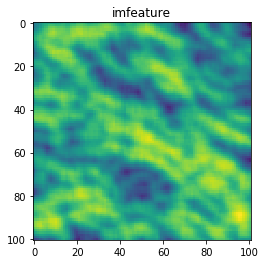

89


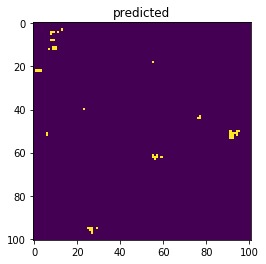

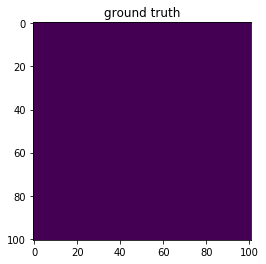

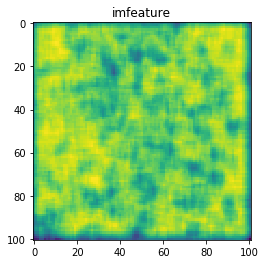

90


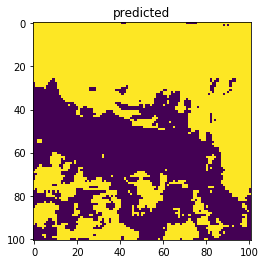

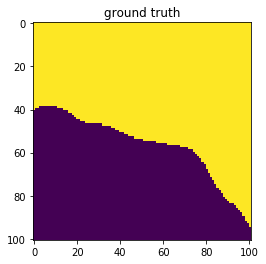

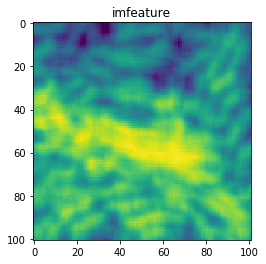

91


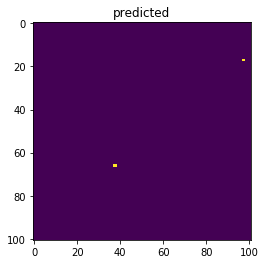

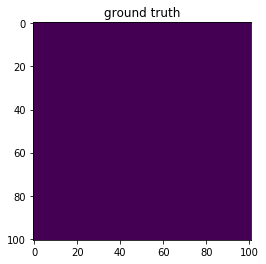

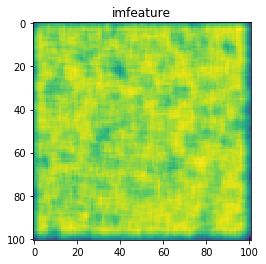

92


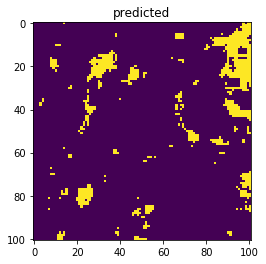

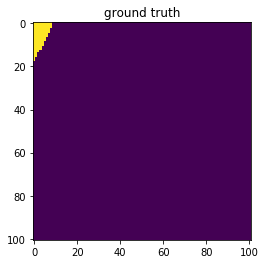

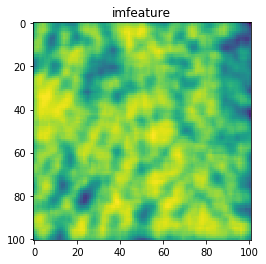

93


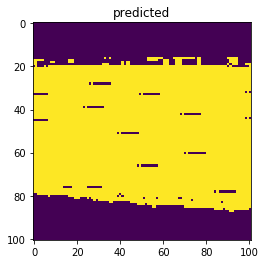

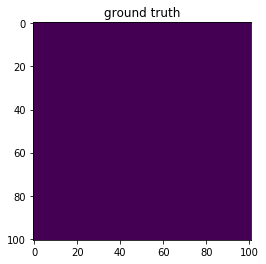

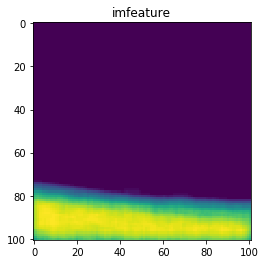

94


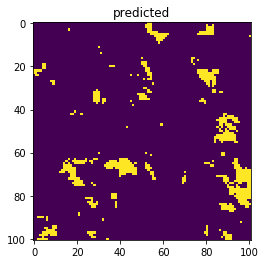

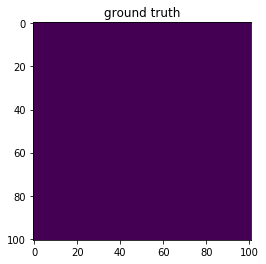

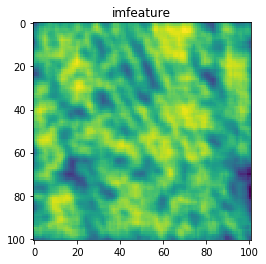

95


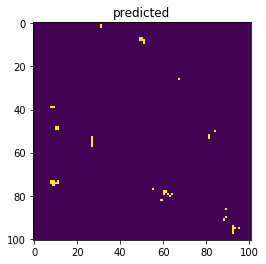

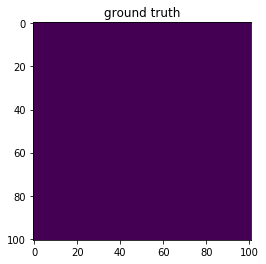

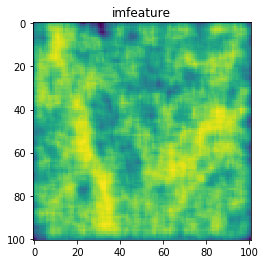

96


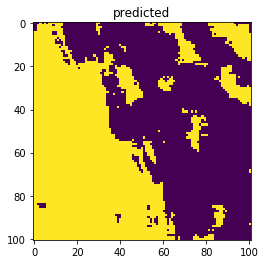

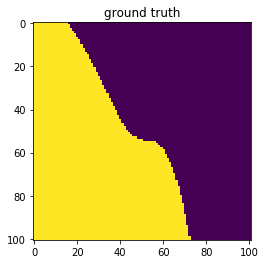

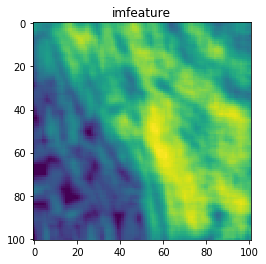

97


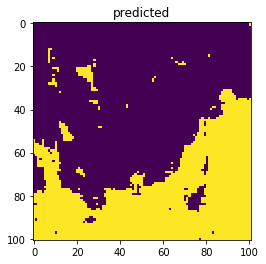

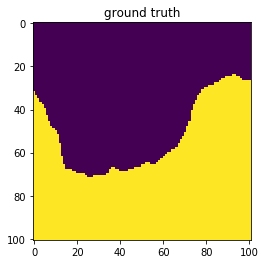

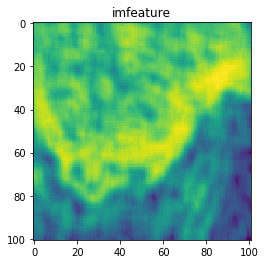

98


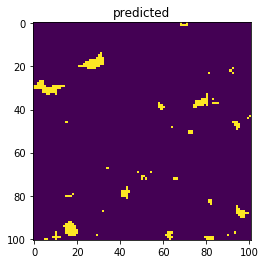

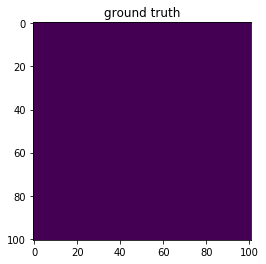

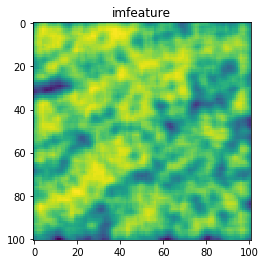

99


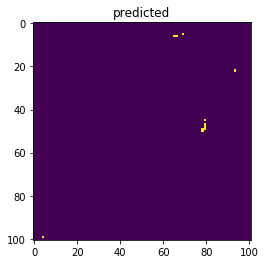

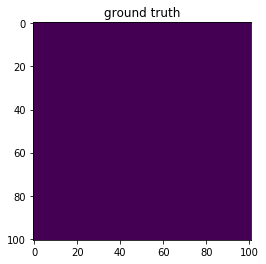

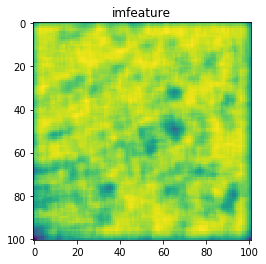

100


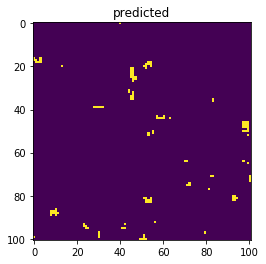

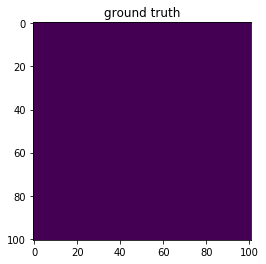

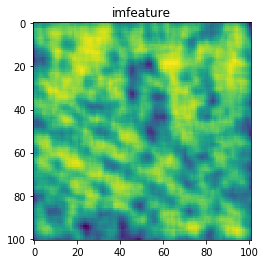

In [572]:
for i, (real, pred, feat) in enumerate(zip(real_test_ims, pred_test_imgs, features_test)):
    print(i+1)
    plt.title('predicted')
    plt.imshow(pred)
   
    plt.show()
    
    plt.title('ground truth')
    plt.imshow(real)
    
    plt.show()
    plt.title('imfeature')
    plt.imshow(feat[..., 1])
    plt.show()
    